# Vanilla Stock Portfolio Management
## Adapted from FinRL Tutorial
### This version is rewarded based on total return.

https://github.com/AI4Finance-Foundation/FinRL-Tutorials/blob/master/1-Introduction/FinRL_PortfolioAllocation_NeurIPS_2020.ipynb

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.use('Agg')
%matplotlib inline
import datetime

from finrl import config
from finrl import config_tickers
from finrl.meta.preprocessor.yahoodownloader import YahooDownloader
from finrl.meta.preprocessor.preprocessors import FeatureEngineer, data_split
from finrl.meta.env_portfolio_allocation.env_portfolio import StockPortfolioEnv
from sb3_models import DRLAgent
from finrl.plot import backtest_stats, backtest_plot, get_daily_return, get_baseline,convert_daily_return_to_pyfolio_ts
from finrl.meta.data_processor import DataProcessor
import sys
sys.path.append("../FinRL-Library")


config.INDICATORS

/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/pyfolio/pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


['macd',
 'boll_ub',
 'boll_lb',
 'rsi_30',
 'cci_30',
 'dx_30',
 'close_30_sma',
 'close_60_sma']

In [2]:
print(config_tickers.DOW_30_TICKER)

['AXP', 'AMGN', 'AAPL', 'BA', 'CAT', 'CSCO', 'CVX', 'GS', 'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'KO', 'JPM', 'MCD', 'MMM', 'MRK', 'MSFT', 'NKE', 'PG', 'TRV', 'UNH', 'CRM', 'VZ', 'V', 'WBA', 'WMT', 'DIS', 'DOW']


In [3]:
import os

results_dir = "results-sharpe"

if not os.path.exists(results_dir):
    os.makedirs(results_dir)

## Download stock market data

In [4]:
df = YahooDownloader(start_date='2020-01-01',
                     end_date='2023-12-07',
                     ticker_list=config_tickers.DOW_30_TICKER,
                    ).fetch_data()
df = df.rename(columns={'timestamp': 'date'})

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [5]:
print(df)
print(len(df))

             date        open        high         low       close     volume  \
0      2020-01-02   74.059998   75.150002   73.797501   73.152657  135480400   
1      2020-01-02  243.000000  243.190002  238.979996  212.332306    2088000   
2      2020-01-02  124.660004  126.269997  124.230003  119.306717    2708000   
3      2020-01-02  328.549988  333.350006  327.700012  331.348572    4544400   
4      2020-01-02  149.000000  150.550003  147.979996  137.044830    3311900   
...           ...         ...         ...         ...         ...        ...   
29695  2023-12-06  547.559998  551.880005  547.099976  549.530029    2239700   
29696  2023-12-06  255.800003  256.829987  253.529999  254.289993    3874000   
29697  2023-12-06   38.250000   38.880001   38.080002   38.500000   20218500   
29698  2023-12-06   20.580000   21.660000   20.400000   21.379999   14124800   
29699  2023-12-06  155.550003  155.830002  153.649994  153.470001    8815800   

        tic  day  
0      AAPL    3  
1

In [6]:
fe = FeatureEngineer(
                    use_technical_indicator=True,
                    use_turbulence=False,
                    user_defined_feature = False)

df = fe.preprocess_data(df)

Successfully added technical indicators


In [7]:
# add covariance matrix as states
df=df.sort_values(['date','tic'],ignore_index=True)
df.index = df.date.factorize()[0]

cov_list = []
return_list = []

# look back is one year
lookback=252
for i in range(lookback,len(df.index.unique())):
  data_lookback = df.loc[i-lookback:i,:]
  price_lookback=data_lookback.pivot_table(index = 'date',columns = 'tic', values = 'close')
  return_lookback = price_lookback.pct_change().dropna()
  return_list.append(return_lookback)

  covs = return_lookback.cov().values 
  cov_list.append(covs)

  
df_cov = pd.DataFrame({'date':df.date.unique()[lookback:],'cov_list':cov_list,'return_list':return_list})
df = df.merge(df_cov, on='date')
df = df.sort_values(['date','tic']).reset_index(drop=True)
df

,date,open,high,low,close,volume,tic,day,macd,boll_ub,boll_lb,rsi_30,cci_30,dx_30,close_30_sma,close_60_sma,cov_list,return_list
0,2020-12-31,134.080002,134.740005,131.720001,130.387238,99116600,AAPL,3,3.798806,134.960049,116.065590,60.049983,109.912050,30.069064,122.342316,118.476425,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
1,2020-12-31,227.309998,230.250000,225.889999,208.949783,1821000,AMGN,3,-0.417797,211.647555,201.568088,50.278723,62.505987,7.522113,205.506668,207.567845,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
2,2020-12-31,119.709999,121.059998,119.160004,116.266846,1747800,AXP,3,1.019445,120.469241,109.682570,57.946439,38.725706,8.051612,114.522825,107.043674,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
3,2020-12-31,216.240005,216.899994,212.699997,214.059998,10487600,BA,3,2.783167,241.532025,208.912974,55.192247,-57.736645,5.306019,220.824666,193.928667,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
4,2020-12-31,180.250000,182.100006,178.750000,170.705887,1717800,CAT,3,1.862806,171.562760,164.542658,59.189859,97.574454,22.924337,166.429305,160.052205,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22135,2023-12-06,547.559998,551.880005,547.099976,549.530029,2239700,UNH,2,5.499928,552.493196,529.299217,60.149913,137.472473,14.762317,537.284715,524.128617,"[[0.00018881431959643613, 2.0280004869963555e-...",tic AAPL AMGN AXP ...
22136,2023-12-06,255.800003,256.829987,253.529999,254.289993,3874000,V,2,4.013324,259.845183,241.819818,61.014676,88.597988,26.742910,246.362182,240.921262,"[[0.00018881431959643613, 2.0280004869963555e-...",tic AAPL AMGN AXP ...
22137,2023-12-06,38.250000,38.880001,38.080002,38.500000,20218500,VZ,2,1.088623,39.119915,34.920085,66.990125,128.436574,57.177165,36.355000,34.135153,"[[0.00018881431959643613, 2.0280004869963555e-...",tic AAPL AMGN AXP ...
22138,2023-12-06,20.580000,21.660000,20.400000,21.379999,14124800,WBA,2,-0.120179,21.628894,19.629269,48.725902,45.495158,12.189124,20.732519,21.118925,"[[0.00018881431959643613, 2.0280004869963555e-...",tic AAPL AMGN AXP ...


In [8]:
train = data_split(df, '2020-01-01','2022-12-06')
train

,date,open,high,low,close,volume,tic,day,macd,boll_ub,boll_lb,rsi_30,cci_30,dx_30,close_30_sma,close_60_sma,cov_list,return_list
0,2020-12-31,134.080002,134.740005,131.720001,130.387238,99116600,AAPL,3,3.798806,134.960049,116.065590,60.049983,109.912050,30.069064,122.342316,118.476425,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
0,2020-12-31,227.309998,230.250000,225.889999,208.949783,1821000,AMGN,3,-0.417797,211.647555,201.568088,50.278723,62.505987,7.522113,205.506668,207.567845,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
0,2020-12-31,119.709999,121.059998,119.160004,116.266846,1747800,AXP,3,1.019445,120.469241,109.682570,57.946439,38.725706,8.051612,114.522825,107.043674,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
0,2020-12-31,216.240005,216.899994,212.699997,214.059998,10487600,BA,3,2.783167,241.532025,208.912974,55.192247,-57.736645,5.306019,220.824666,193.928667,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
0,2020-12-31,180.250000,182.100006,178.750000,170.705887,1717800,CAT,3,1.862806,171.562760,164.542658,59.189859,97.574454,22.924337,166.429305,160.052205,"[[0.0008654084916924186, 0.0004378997454081227...",tic AAPL AMGN AXP ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,2022-12-05,531.489990,540.380005,530.880005,527.104248,2424800,UNH,0,2.043270,547.204188,494.416928,52.227613,3.595749,12.142209,525.488447,515.864258,"[[0.000504253702387543, 9.795939745431539e-05,...",tic AAPL AMGN AXP ...
485,2022-12-05,215.649994,216.910004,213.050003,211.996521,9006300,V,0,4.805272,219.364869,195.549621,56.888422,100.439365,20.416435,204.589785,194.675662,"[[0.000504253702387543, 9.795939745431539e-05,...",tic AAPL AMGN AXP ...
485,2022-12-05,37.980000,38.110001,36.900002,34.533554,27561000,VZ,0,0.093918,36.706308,34.559330,43.325518,-45.586919,13.087324,35.229757,35.438277,"[[0.000504253702387543, 9.795939745431539e-05,...",tic AAPL AMGN AXP ...
485,2022-12-05,41.360001,41.419998,40.820000,38.444477,4501800,WBA,0,1.371688,40.402224,34.781284,60.949557,68.081884,39.187576,36.105662,33.355761,"[[0.000504253702387543, 9.795939745431539e-05,...",tic AAPL AMGN AXP ...


## Environment

In [9]:
import numpy as np
import pandas as pd
from gym.utils import seeding
import gym
from gym import spaces
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from stable_baselines3.common.vec_env import DummyVecEnv


class StockPortfolioEnv(gym.Env):
    """A single stock trading environment for OpenAI gym

    Attributes
    ----------
        df: DataFrame
            input data
        stock_dim : int
            number of unique stocks
        hmax : int
            maximum number of shares to trade
        initial_amount : int
            start money
        transaction_cost_pct: float
            transaction cost percentage per trade
        reward_scaling: float
            scaling factor for reward, good for training
        state_space: int
            the dimension of input features
        action_space: int
            equals stock dimension
        tech_indicator_list: list
            a list of technical indicator names
        turbulence_threshold: int
            a threshold to control risk aversion
        day: int
            an increment number to control date

    Methods
    -------
    _sell_stock()
        perform sell action based on the sign of the action
    _buy_stock()
        perform buy action based on the sign of the action
    step()
        at each step the agent will return actions, then 
        we will calculate the reward, and return the next observation.
    reset()
        reset the environment
    render()
        use render to return other functions
    save_asset_memory()
        return account value at each time step
    save_action_memory()
        return actions/positions at each time step
        

    """
    metadata = {'render.modes': ['human']}

    def __init__(self, 
                df,
                stock_dim,
                hmax,
                initial_amount,
                transaction_cost_pct,
                reward_scaling,
                state_space,
                action_space,
                tech_indicator_list,
                turbulence_threshold=None,
                lookback=252,
                day = 0):
        #super(StockEnv, self).__init__()
        #money = 10 , scope = 1
        self.day = day
        self.lookback=lookback
        self.df = df
        self.stock_dim = stock_dim
        self.hmax = hmax
        self.initial_amount = initial_amount
        self.transaction_cost_pct =transaction_cost_pct
        self.reward_scaling = reward_scaling
        self.state_space = state_space
        self.action_space = action_space
        self.tech_indicator_list = tech_indicator_list
        
        self.termination_callback = None

        # action_space normalization and shape is self.stock_dim
        self.action_space = spaces.Box(low = 0, high = 1,shape = (self.action_space,)) 
        # Shape = (34, 30)
        # covariance matrix + technical indicators
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape = (self.state_space+len(self.tech_indicator_list),self.state_space))

        # load data from a pandas dataframe
        self.data = self.df.loc[self.day,:]
        self.covs = self.data['cov_list'].values[0]
        self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)
        self.terminal = False
        self.turbulence_threshold = turbulence_threshold        
        # initalize state: inital portfolio return + individual stock return + individual weights
        self.portfolio_value = self.initial_amount

        # memorize portfolio value each step
        self.asset_memory = [self.initial_amount]
        # memorize portfolio return each step
        self.portfolio_return_memory = [0]
        self.actions_memory=[[1/self.stock_dim]*self.stock_dim]
        self.date_memory=[self.data.date.unique()[0]]

        
    def step(self, actions):
        # print(self.day)
        self.terminal = self.day >= len(self.df.index.unique())-1
        # print(actions)
        if self.terminal:
            df = pd.DataFrame(self.portfolio_return_memory)
            df.columns = ['daily_return']
            plt.plot(df.daily_return.cumsum(),'r')
            plt.savefig(f'{results_dir}/cumulative_reward.png')
            plt.close()
            
            plt.plot(self.portfolio_return_memory,'r')
            plt.savefig(f'{results_dir}/rewards.png')
            plt.close()
            
            if self.termination_callback: self.termination_callback(self.portfolio_value)

            print("=================================")
            print("begin_total_asset:{}".format(self.asset_memory[0]))           
            print("end_total_asset:{}".format(self.portfolio_value))

            df_daily_return = pd.DataFrame(self.portfolio_return_memory)
            df_daily_return.columns = ['daily_return']
            if df_daily_return['daily_return'].std() !=0:
              sharpe = (252**0.5)*df_daily_return['daily_return'].mean()/ \
                       df_daily_return['daily_return'].std()
              self.reward += sharpe * self.reward_scaling * 2**8
              print("Sharpe: ",sharpe)
            print("=================================")
            
            return self.state, self.reward, self.terminal,{}

        else:
            #print("Model actions: ",actions)
            # actions are the portfolio weight
            # normalize to sum of 1
            #if (np.array(actions) - np.array(actions).min()).sum() != 0:
            #  norm_actions = (np.array(actions) - np.array(actions).min()) / (np.array(actions) - np.array(actions).min()).sum()
            #else:
            #  norm_actions = actions
            weights = self.softmax_normalization(actions) 
            #print("Normalized actions: ", weights)
            self.actions_memory.append(weights)
            last_day_memory = self.data

            #load next state
            self.day += 1
            self.data = self.df.loc[self.day,:]
            self.covs = self.data['cov_list'].values[0]
            self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)
            #print(self.state)
            # calcualte portfolio return
            # individual stocks' return * weight
            portfolio_return = sum(((self.data.close.values / last_day_memory.close.values)-1)*weights)
            # update portfolio value
            new_portfolio_value = self.portfolio_value*(1+portfolio_return)
            self.portfolio_value = new_portfolio_value

            # save into memory
            self.portfolio_return_memory.append(portfolio_return)
            self.date_memory.append(self.data.date.unique()[0])            
            self.asset_memory.append(new_portfolio_value)

            # the reward is the new portfolio value or end portfolo value
            self.reward = new_portfolio_value 
            #print("Step reward: ", self.reward)
            #self.reward = self.reward*self.reward_scaling

        return self.state, self.reward, self.terminal, {}

    def reset(self):
        self.asset_memory = [self.initial_amount]
        self.day = 0
        self.data = self.df.loc[self.day,:]
        # load states
        self.covs = self.data['cov_list'].values[0]
        self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)
        self.portfolio_value = self.initial_amount
        #self.cost = 0
        #self.trades = 0
        self.terminal = False 
        self.portfolio_return_memory = [0]
        self.actions_memory=[[1/self.stock_dim]*self.stock_dim]
        self.date_memory=[self.data.date.unique()[0]] 
        return self.state
    
    def render(self, mode='human'):
        return self.state
        
    def softmax_normalization(self, actions):
        numerator = np.exp(actions)
        denominator = np.sum(np.exp(actions))
        softmax_output = numerator/denominator
        return softmax_output

    
    def save_asset_memory(self):
        date_list = self.date_memory
        portfolio_return = self.portfolio_return_memory
        #print(len(date_list))
        #print(len(asset_list))
        df_account_value = pd.DataFrame({'date':date_list,'daily_return':portfolio_return})
        return df_account_value

    def save_action_memory(self):
        # date and close price length must match actions length
        date_list = self.date_memory
        df_date = pd.DataFrame(date_list)
        df_date.columns = ['date']
        
        action_list = self.actions_memory
        df_actions = pd.DataFrame(action_list)
        df_actions.columns = self.data.tic.values
        df_actions.index = df_date.date
        #df_actions = pd.DataFrame({'date':date_list,'actions':action_list})
        return df_actions

    def _seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def get_sb_env(self):
        e = DummyVecEnv([lambda: self])
        obs = e.reset()
        return e, obs

In [10]:
stock_dimension = len(train.tic.unique())
state_space = stock_dimension
print(f"Stock Dimension: {stock_dimension}, State Space: {state_space}")


Stock Dimension: 30, State Space: 30


In [11]:
env_kwargs = {
    "hmax": 100, 
    "initial_amount": 1000000, 
    "transaction_cost_pct": 0.001, 
    "state_space": state_space, 
    "stock_dim": stock_dimension, 
    "tech_indicator_list": config.INDICATORS, 
    "action_space": stock_dimension, 
    "reward_scaling": 1e-4
    
}

e_train_gym = StockPortfolioEnv(df = train, **env_kwargs)

In [12]:
env_train, _ = e_train_gym.get_sb_env()
print(type(env_train))

<class 'stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv'>


/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


## Agents

In [13]:
# initialize
agent = DRLAgent(env = env_train)

train_time_seconds = 60 * 60 * 2

def make_callback(rewards, losses, returns):
    def callback(name_to_value):
        rewards.append(name_to_value['train/reward'])
        
        loss_key = 'train/loss' if 'train/loss' in name_to_value else 'train/policy_loss'
        losses.append(name_to_value[loss_key])
    def termination_callback(portfolio_value):
        returns.append(portfolio_value)
    e_train_gym.termination_callback = termination_callback
    return callback

def rolling_average(data):
    """Smoothen the 1-d data array using a rollin average.

    Args:
        data: 1-d numpy.array
        window_size: size of the smoothing window

    Returns:
        smooth_data: a 1-d numpy.array with the same size as data
    """
    window_size = int(len(data) / 20)
    data = np.array(data)
    assert data.ndim == 1
    kernel = np.ones(window_size)
    smooth_data = np.convolve(data, kernel) / np.convolve(
        np.ones_like(data), kernel
    )
    return smooth_data[: -window_size + 1]

In [14]:
# A2C
agent = DRLAgent(env = env_train)

A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005, "learning_rate": 0.0002}
model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS)

{'n_steps': 5, 'ent_coef': 0.005, 'learning_rate': 0.0002}
Using cpu device


In [15]:
a2c_rewards = []
a2c_losses = []
a2c_returns = []

trained_a2c = agent.train_model(model=model_a2c, 
                                tb_log_name='a2c',
                                train_time_seconds=train_time_seconds,
                                callback=make_callback(a2c_rewards, a2c_losses, a2c_returns))

begin_total_asset:1000000
end_total_asset:1164221.2343378915
Sharpe:  0.5558180529140929
-------------------------------------
| time/                 |           |
|    fps                | 716       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -42.5     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 99        |
|    policy_loss        | 1.21e+08  |
|    reward             | 1021429.5 |
|    std                | 0.996     |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1118891.1822524907
Sharpe:  0.4339803268125976
--------------------------------------
| time/                 |            |
|    fps                | 700        |
|    iterations         | 200        |
|    time_elapsed       | 1          |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1128171.4010665987
Sharpe:  0.4569925238064794
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 1200      |
|    time_elapsed       | 8         |
|    total_timesteps    | 6000      |
| train/                |           |
|    entropy_loss       | -42.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 1199      |
|    policy_loss        | 1.41e+08  |
|    reward             | 1147582.6 |
|    std                | 0.993     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1137883.9097425793
Sharpe:  0.48420656653037036
-------------------------------------
| time/                 |           |
|    fps                | 698       |
|    iterations         | 1300      |
|    time_elapsed       | 9         |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1139601.6825736614
Sharpe:  0.4911241813304955
-------------------------------------
| time/                 |           |
|    fps                | 709       |
|    iterations         | 2300      |
|    time_elapsed       | 16        |
|    total_timesteps    | 11500     |
| train/                |           |
|    entropy_loss       | -42.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 2299      |
|    policy_loss        | 1.38e+08  |
|    reward             | 1127524.0 |
|    std                | 0.989     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1106692.6869528412
Sharpe:  0.3999814550152284
-------------------------------------
| time/                 |           |
|    fps                | 711       |
|    iterations         | 2400      |
|    time_elapsed       | 16        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149015.1046670245
Sharpe:  0.5169942643723554
-------------------------------------
| time/                 |           |
|    fps                | 698       |
|    iterations         | 3400      |
|    time_elapsed       | 24        |
|    total_timesteps    | 17000     |
| train/                |           |
|    entropy_loss       | -42.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 3399      |
|    policy_loss        | 1.46e+08  |
|    reward             | 1172372.0 |
|    std                | 0.984     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1187953.5527319345
Sharpe:  0.6201608039851076
begin_total_asset:1000000
end_total_asset:1185430.8437198768
Sharpe:  0.6149727483865928
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterat

begin_total_asset:1000000
end_total_asset:1182210.7931457951
Sharpe:  0.603904117200729
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 4500      |
|    time_elapsed       | 32        |
|    total_timesteps    | 22500     |
| train/                |           |
|    entropy_loss       | -41.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 4499      |
|    policy_loss        | 1.39e+08  |
|    reward             | 1144235.9 |
|    std                | 0.979     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144511.2377611676
Sharpe:  0.5022521140227482
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 4600      |
|    time_elapsed       | 32        |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1131253.5656653687
Sharpe:  0.46708360044621966
-------------------------------------
| time/                 |           |
|    fps                | 699       |
|    iterations         | 5600      |
|    time_elapsed       | 40        |
|    total_timesteps    | 28000     |
| train/                |           |
|    entropy_loss       | -41.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 5599      |
|    policy_loss        | 1.44e+08  |
|    reward             | 1104943.0 |
|    std                | 0.976     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1124348.122284982
Sharpe:  0.45147947401433747
-------------------------------------
| time/                 |           |
|    fps                | 699       |
|    iterations         | 5700      |
|    time_elapsed       | 40        |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1165468.3630848685
Sharpe:  0.5653396963723408
-------------------------------------
| time/                 |           |
|    fps                | 699       |
|    iterations         | 6700      |
|    time_elapsed       | 47        |
|    total_timesteps    | 33500     |
| train/                |           |
|    entropy_loss       | -41.7     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 6699      |
|    policy_loss        | 1.17e+08  |
|    reward             | 1043279.0 |
|    std                | 0.971     |
|    value_loss         | 1.08e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170329.9451627797
Sharpe:  0.5769404544908009
-------------------------------------
| time/                 |           |
|    fps                | 700       |
|    iterations         | 6800      |
|    time_elapsed       | 48        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170831.9283853772
Sharpe:  0.5747087810004282
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 7800      |
|    time_elapsed       | 55        |
|    total_timesteps    | 39000     |
| train/                |           |
|    entropy_loss       | -41.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 7799      |
|    policy_loss        | 1.39e+08  |
|    reward             | 1127604.9 |
|    std                | 0.968     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197818.9095683084
Sharpe:  0.6456966242399649
-------------------------------------
| time/                 |           |
|    fps                | 698       |
|    iterations         | 7900      |
|    time_elapsed       | 56        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1148543.2199380342
Sharpe:  0.5168375492611341
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 8900      |
|    time_elapsed       | 63        |
|    total_timesteps    | 44500     |
| train/                |           |
|    entropy_loss       | -41.4     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 8899      |
|    policy_loss        | 1.44e+08  |
|    reward             | 1215583.5 |
|    std                | 0.963     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1192996.6717083578
Sharpe:  0.6331591593105222
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 9000      |
|    time_elapsed       | 64        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1172122.7467848647
Sharpe:  0.5786437822223689
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 10000     |
|    time_elapsed       | 71        |
|    total_timesteps    | 50000     |
| train/                |           |
|    entropy_loss       | -41.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 9999      |
|    policy_loss        | 1.4e+08   |
|    reward             | 1091906.2 |
|    std                | 0.96      |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1198361.8079089648
Sharpe:  0.6466218822889476
-------------------------------------
| time/                 |           |
|    fps                | 698       |
|    iterations         | 10100     |
|    time_elapsed       | 72        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1164141.7690980916
Sharpe:  0.5574854521330537
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 11100     |
|    time_elapsed       | 79        |
|    total_timesteps    | 55500     |
| train/                |           |
|    entropy_loss       | -41.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 11099     |
|    policy_loss        | 1.36e+08  |
|    reward             | 1130703.6 |
|    std                | 0.956     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1139685.6993422455
Sharpe:  0.4896299033075482
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 11200     |
|    time_elapsed       | 80        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1142292.9176343884
Sharpe:  0.4972051080446085
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 12200     |
|    time_elapsed       | 87        |
|    total_timesteps    | 61000     |
| train/                |           |
|    entropy_loss       | -41.1     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 12199     |
|    policy_loss        | 1.5e+08   |
|    reward             | 1215551.8 |
|    std                | 0.952     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144815.7615425654
Sharpe:  0.5073648070341833
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 12300     |
|    time_elapsed       | 88        |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153090.730434106
Sharpe:  0.5284196850801383
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 13300     |
|    time_elapsed       | 95        |
|    total_timesteps    | 66500     |
| train/                |           |
|    entropy_loss       | -41       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 13299     |
|    policy_loss        | 1.24e+08  |
|    reward             | 1113605.9 |
|    std                | 0.949     |
|    value_loss         | 1.28e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145701.0743565827
Sharpe:  0.5073251517580277
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 13400     |
|    time_elapsed       | 96        |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154642.3679743093
Sharpe:  0.5280976607347899
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 14400     |
|    time_elapsed       | 103       |
|    total_timesteps    | 72000     |
| train/                |           |
|    entropy_loss       | -40.9     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 14399     |
|    policy_loss        | 1.39e+08  |
|    reward             | 1132577.2 |
|    std                | 0.947     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1136290.8299664734
Sharpe:  0.4786251682921047
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 14500     |
|    time_elapsed       | 104       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169708.547491453
Sharpe:  0.5698709639052469
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 15500     |
|    time_elapsed       | 111       |
|    total_timesteps    | 77500     |
| train/                |           |
|    entropy_loss       | -40.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 15499     |
|    policy_loss        | 1.41e+08  |
|    reward             | 1200554.4 |
|    std                | 0.943     |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157323.9163598644
Sharpe:  0.5338570698649122
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 15600     |
|    time_elapsed       | 111       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1120236.2410334384
Sharpe:  0.43143080808146805
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 16600     |
|    time_elapsed       | 119       |
|    total_timesteps    | 83000     |
| train/                |           |
|    entropy_loss       | -40.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 16599     |
|    policy_loss        | 1.26e+08  |
|    reward             | 1069158.1 |
|    std                | 0.938     |
|    value_loss         | 1.2e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146821.9060887115
Sharpe:  0.5045319794446144
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 16700     |
|    time_elapsed       | 119       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1158522.373880525
Sharpe:  0.5357726630848599
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 17700     |
|    time_elapsed       | 126       |
|    total_timesteps    | 88500     |
| train/                |           |
|    entropy_loss       | -40.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 17699     |
|    policy_loss        | 1.28e+08  |
|    reward             | 1081629.9 |
|    std                | 0.934     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1188423.8430523004
Sharpe:  0.6157182311959477
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 17800     |
|    time_elapsed       | 127       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1141437.2097673963
Sharpe:  0.4891756781392692
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 18800     |
|    time_elapsed       | 134       |
|    total_timesteps    | 94000     |
| train/                |           |
|    entropy_loss       | -40.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 18799     |
|    policy_loss        | 1.37e+08  |
|    reward             | 1187775.8 |
|    std                | 0.93      |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156132.0697619964
Sharpe:  0.5298154631050546
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 18900     |
|    time_elapsed       | 135       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146982.434790968
Sharpe:  0.5055159011112763
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 19900     |
|    time_elapsed       | 142       |
|    total_timesteps    | 99500     |
| train/                |           |
|    entropy_loss       | -40.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 19899     |
|    policy_loss        | 1.29e+08  |
|    reward             | 1131159.2 |
|    std                | 0.929     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1127360.096595266
Sharpe:  0.45133029601712144
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 20000     |
|    time_elapsed       | 143       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1171767.4318998228
Sharpe:  0.5721524071321484
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 21000     |
|    time_elapsed       | 150       |
|    total_timesteps    | 105000    |
| train/                |           |
|    entropy_loss       | -40.2     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 20999     |
|    policy_loss        | 1.26e+08  |
|    reward             | 1032497.9 |
|    std                | 0.925     |
|    value_loss         | 1.08e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1192954.1937075811
Sharpe:  0.6314900198451391
--------------------------------------
| time/                 |            |
|    fps                | 697        |
|    iterations         | 21100      |
|    time_elapsed       | 151        |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1123087.7698572017
Sharpe:  0.441956465823882
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 22100     |
|    time_elapsed       | 158       |
|    total_timesteps    | 110500    |
| train/                |           |
|    entropy_loss       | -40.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 22099     |
|    policy_loss        | 1.25e+08  |
|    reward             | 1162632.1 |
|    std                | 0.92      |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174309.240107049
Sharpe:  0.5813600478910276
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 22200     |
|    time_elapsed       | 159       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1167956.344419389
Sharpe:  0.5637502404070235
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 23200     |
|    time_elapsed       | 166       |
|    total_timesteps    | 116000    |
| train/                |           |
|    entropy_loss       | -39.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 23199     |
|    policy_loss        | 1.38e+08  |
|    reward             | 1152190.9 |
|    std                | 0.917     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145830.4806276385
Sharpe:  0.5049068692780729
-------------------------------------
| time/                 |           |
|    fps                | 697       |
|    iterations         | 23300     |
|    time_elapsed       | 167       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1162706.5843773498
Sharpe:  0.5476985803031612
begin_total_asset:1000000
end_total_asset:1147846.7097256766
Sharpe:  0.5080356601203648
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 24300     |
|    time_elapsed       | 174       |
|    total_timesteps    | 121500    |
| train/                |           |
|    entropy_loss       | -39.8     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 24299     |
|    policy_loss        | 1.41e+08  |
|    reward             | 1147846.8 |
|    std                | 0.912     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164067.3850720057
Sharpe:  0.5532651276411685
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterat

begin_total_asset:1000000
end_total_asset:1125855.0573754406
Sharpe:  0.44989075720006544
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 25400     |
|    time_elapsed       | 182       |
|    total_timesteps    | 127000    |
| train/                |           |
|    entropy_loss       | -39.7     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 25399     |
|    policy_loss        | 1.31e+08  |
|    reward             | 1161587.8 |
|    std                | 0.91      |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140427.0676773256
Sharpe:  0.48908058533198334
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 25500     |
|    time_elapsed       | 182       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1157896.5973067554
Sharpe:  0.5387123904014819
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 26500     |
|    time_elapsed       | 190       |
|    total_timesteps    | 132500    |
| train/                |           |
|    entropy_loss       | -39.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 26499     |
|    policy_loss        | 1.31e+08  |
|    reward             | 1177734.5 |
|    std                | 0.906     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144874.4667249215
Sharpe:  0.5015350213598255
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 26600     |
|    time_elapsed       | 191       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1150491.68715608
Sharpe:  0.5203898448303971
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 27600     |
|    time_elapsed       | 198       |
|    total_timesteps    | 138000    |
| train/                |           |
|    entropy_loss       | -39.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 27599     |
|    policy_loss        | 1.25e+08  |
|    reward             | 1096469.8 |
|    std                | 0.902     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156741.9491722232
Sharpe:  0.5374880170129441
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 27700     |
|    time_elapsed       | 198       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1206617.2890533167
Sharpe:  0.6701771023781433
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 28700     |
|    time_elapsed       | 206       |
|    total_timesteps    | 143500    |
| train/                |           |
|    entropy_loss       | -39.3     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 28699     |
|    policy_loss        | 1.33e+08  |
|    reward             | 1161054.9 |
|    std                | 0.898     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158681.4962503144
Sharpe:  0.5445629614757209
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 28800     |
|    time_elapsed       | 207       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1137322.318147683
Sharpe:  0.4851127859868545
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 29800     |
|    time_elapsed       | 214       |
|    total_timesteps    | 149000    |
| train/                |           |
|    entropy_loss       | -39.2     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 29799     |
|    policy_loss        | 1.38e+08  |
|    reward             | 1213833.8 |
|    std                | 0.894     |
|    value_loss         | 1.6e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178672.0115553418
Sharpe:  0.5985210695361013
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 29900     |
|    time_elapsed       | 215       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1165701.7809027217
Sharpe:  0.5626198452023825
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 30900     |
|    time_elapsed       | 222       |
|    total_timesteps    | 154500    |
| train/                |           |
|    entropy_loss       | -39       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 30899     |
|    policy_loss        | 1.19e+08  |
|    reward             | 995037.25 |
|    std                | 0.89      |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140106.3601176627
Sharpe:  0.4915660225381057
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 31000     |
|    time_elapsed       | 222       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1150181.357057363
Sharpe:  0.5201616197880651
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 32000     |
|    time_elapsed       | 230       |
|    total_timesteps    | 160000    |
| train/                |           |
|    entropy_loss       | -38.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 31999     |
|    policy_loss        | 1.32e+08  |
|    reward             | 1162954.0 |
|    std                | 0.886     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163614.2600751421
Sharpe:  0.5568403316045037
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 32100     |
|    time_elapsed       | 231       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156489.671827728
Sharpe:  0.540034427873578
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 33100     |
|    time_elapsed       | 238       |
|    total_timesteps    | 165500    |
| train/                |           |
|    entropy_loss       | -38.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 33099     |
|    policy_loss        | 1.41e+08  |
|    reward             | 1204524.4 |
|    std                | 0.881     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1127343.7148790704
Sharpe:  0.45907714949385997
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 33200     |
|    time_elapsed       | 238       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155908.215266342
Sharpe:  0.538706702885885
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 34200     |
|    time_elapsed       | 246       |
|    total_timesteps    | 171000    |
| train/                |           |
|    entropy_loss       | -38.6     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 34199     |
|    policy_loss        | 1.27e+08  |
|    reward             | 1123690.4 |
|    std                | 0.878     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156763.7343406135
Sharpe:  0.5419208680395583
--------------------------------------
| time/                 |            |
|    fps                | 694        |
|    iterations         | 34300      |
|    time_elapsed       | 246        |
|    total_timesteps 

begin_total_asset:1000000
end_total_asset:1154498.4857498761
Sharpe:  0.5331862757715143
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 35300     |
|    time_elapsed       | 253       |
|    total_timesteps    | 176500    |
| train/                |           |
|    entropy_loss       | -38.5     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 35299     |
|    policy_loss        | 1.33e+08  |
|    reward             | 1122368.5 |
|    std                | 0.874     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179641.6570893447
Sharpe:  0.600246212430463
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 35400     |
|    time_elapsed       | 254       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1150224.050067627
Sharpe:  0.5204446539991016
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 36400     |
|    time_elapsed       | 261       |
|    total_timesteps    | 182000    |
| train/                |           |
|    entropy_loss       | -38.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 36399     |
|    policy_loss        | 1.26e+08  |
|    reward             | 1182919.4 |
|    std                | 0.871     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158778.8873458584
Sharpe:  0.5437431128699434
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 36500     |
|    time_elapsed       | 262       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1153788.4532059226
Sharpe:  0.5299116410334551
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 37500     |
|    time_elapsed       | 269       |
|    total_timesteps    | 187500    |
| train/                |           |
|    entropy_loss       | -38.3     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 37499     |
|    policy_loss        | 1.37e+08  |
|    reward             | 1096778.4 |
|    std                | 0.867     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151185.7811270896
Sharpe:  0.5208262779201422
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 37600     |
|    time_elapsed       | 270       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1166812.6878593736
Sharpe:  0.5656116240815974
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 38600     |
|    time_elapsed       | 277       |
|    total_timesteps    | 193000    |
| train/                |           |
|    entropy_loss       | -38.2     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 38599     |
|    policy_loss        | 1.23e+08  |
|    reward             | 1101955.2 |
|    std                | 0.864     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150811.6962900956
Sharpe:  0.5240258744865832
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 38700     |
|    time_elapsed       | 278       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1167073.3479514222
Sharpe:  0.5688946015104367
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 39700     |
|    time_elapsed       | 285       |
|    total_timesteps    | 198500    |
| train/                |           |
|    entropy_loss       | -38       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 39699     |
|    policy_loss        | 1.34e+08  |
|    reward             | 1179935.6 |
|    std                | 0.859     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156015.8923332854
Sharpe:  0.5356727843472595
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 39800     |
|    time_elapsed       | 286       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1173842.9700663225
Sharpe:  0.5830374866583884
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 40800     |
|    time_elapsed       | 293       |
|    total_timesteps    | 204000    |
| train/                |           |
|    entropy_loss       | -37.8     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 40799     |
|    policy_loss        | 1.23e+08  |
|    reward             | 1076243.5 |
|    std                | 0.855     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170185.8126110672
Sharpe:  0.5747735628215069
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 40900     |
|    time_elapsed       | 294       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1162227.7860836152
Sharpe:  0.5506494523342489
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 41900     |
|    time_elapsed       | 301       |
|    total_timesteps    | 209500    |
| train/                |           |
|    entropy_loss       | -37.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 41899     |
|    policy_loss        | 1.18e+08  |
|    reward             | 1043998.3 |
|    std                | 0.85      |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155266.4354219323
Sharpe:  0.534306441671139
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 42000     |
|    time_elapsed       | 302       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156509.1040523092
Sharpe:  0.5378349042087678
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 43000     |
|    time_elapsed       | 310       |
|    total_timesteps    | 215000    |
| train/                |           |
|    entropy_loss       | -37.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 42999     |
|    policy_loss        | 1.24e+08  |
|    reward             | 1120680.6 |
|    std                | 0.845     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151313.5140063933
Sharpe:  0.5247330752532815
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 43100     |
|    time_elapsed       | 311       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157785.2737071768
Sharpe:  0.5376082611689523
-------------------------------------
| time/                 |           |
|    fps                | 691       |
|    iterations         | 44100     |
|    time_elapsed       | 318       |
|    total_timesteps    | 220500    |
| train/                |           |
|    entropy_loss       | -37.4     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 44099     |
|    policy_loss        | 1.33e+08  |
|    reward             | 1086965.2 |
|    std                | 0.842     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1135710.7341789769
Sharpe:  0.4788983768553642
-------------------------------------
| time/                 |           |
|    fps                | 691       |
|    iterations         | 44200     |
|    time_elapsed       | 319       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157827.3507480829
Sharpe:  0.5416342033602988
begin_total_asset:1000000
end_total_asset:1161937.2166744408
Sharpe:  0.549654712836813
-------------------------------------
| time/                 |           |
|    fps                | 691       |
|    iterations         | 45200     |
|    time_elapsed       | 326       |
|    total_timesteps    | 226000    |
| train/                |           |
|    entropy_loss       | -37.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 45199     |
|    policy_loss        | 1.16e+08  |
|    reward             | 1014374.7 |
|    std                | 0.838     |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144863.3754723738
Sharpe:  0.5064043361136329
--------------------------------------
| time/                 |            |
|    fps                | 691        |
|    iter

begin_total_asset:1000000
end_total_asset:1150950.2447214646
Sharpe:  0.5224058635680445
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 46300     |
|    time_elapsed       | 334       |
|    total_timesteps    | 231500    |
| train/                |           |
|    entropy_loss       | -37.1     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 46299     |
|    policy_loss        | 1.16e+08  |
|    reward             | 1162593.5 |
|    std                | 0.835     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165776.2603937807
Sharpe:  0.560510775378061
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 46400     |
|    time_elapsed       | 335       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1163937.5377420941
Sharpe:  0.5546019657154154
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 47400     |
|    time_elapsed       | 342       |
|    total_timesteps    | 237000    |
| train/                |           |
|    entropy_loss       | -37       |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 47399     |
|    policy_loss        | 1.35e+08  |
|    reward             | 1200083.0 |
|    std                | 0.832     |
|    value_loss         | 1.59e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158408.9166773623
Sharpe:  0.5419875493423261
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 47500     |
|    time_elapsed       | 342       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1119468.4861593752
Sharpe:  0.43343681364875186
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 48500     |
|    time_elapsed       | 350       |
|    total_timesteps    | 242500    |
| train/                |           |
|    entropy_loss       | -36.9     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 48499     |
|    policy_loss        | 1.13e+08  |
|    reward             | 1105751.9 |
|    std                | 0.828     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1120705.1661961908
Sharpe:  0.43614973260683587
begin_total_asset:1000000
end_total_asset:1148092.9620684925
Sharpe:  0.5088777779858767
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iter

begin_total_asset:1000000
end_total_asset:1131567.2510620279
Sharpe:  0.46455736084150445
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 49600     |
|    time_elapsed       | 358       |
|    total_timesteps    | 248000    |
| train/                |           |
|    entropy_loss       | -36.8     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 49599     |
|    policy_loss        | 1.2e+08   |
|    reward             | 1160353.1 |
|    std                | 0.825     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1115140.6829134917
Sharpe:  0.4205448295084687
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 49700     |
|    time_elapsed       | 358       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1155911.3812635874
Sharpe:  0.5323360536766661
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 50700     |
|    time_elapsed       | 365       |
|    total_timesteps    | 253500    |
| train/                |           |
|    entropy_loss       | -36.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 50699     |
|    policy_loss        | 1.26e+08  |
|    reward             | 1160931.4 |
|    std                | 0.823     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1128992.0174441726
Sharpe:  0.4603453680964205
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 50800     |
|    time_elapsed       | 366       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1143206.115846299
Sharpe:  0.4976802362875963
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 51800     |
|    time_elapsed       | 374       |
|    total_timesteps    | 259000    |
| train/                |           |
|    entropy_loss       | -36.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 51799     |
|    policy_loss        | 1.11e+08  |
|    reward             | 963705.06 |
|    std                | 0.819     |
|    value_loss         | 1.03e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1139745.8147958878
Sharpe:  0.48738316835337997
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 51900     |
|    time_elapsed       | 374       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156862.3934050682
Sharpe:  0.5340311562117476
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 52900     |
|    time_elapsed       | 381       |
|    total_timesteps    | 264500    |
| train/                |           |
|    entropy_loss       | -36.5     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 52899     |
|    policy_loss        | 1.22e+08  |
|    reward             | 1097904.5 |
|    std                | 0.818     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149184.5005082344
Sharpe:  0.515472138910962
-------------------------------------
| time/                 |           |
|    fps                | 692       |
|    iterations         | 53000     |
|    time_elapsed       | 382       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1169599.1128586058
Sharpe:  0.5707993839804091
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 54000     |
|    time_elapsed       | 389       |
|    total_timesteps    | 270000    |
| train/                |           |
|    entropy_loss       | -36.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 53999     |
|    policy_loss        | 1.31e+08  |
|    reward             | 1177493.9 |
|    std                | 0.815     |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160246.1668276608
Sharpe:  0.5452795756040044
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 54100     |
|    time_elapsed       | 390       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1161232.6907238197
Sharpe:  0.5485225458454586
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 55100     |
|    time_elapsed       | 397       |
|    total_timesteps    | 275500    |
| train/                |           |
|    entropy_loss       | -36.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 55099     |
|    policy_loss        | 1.08e+08  |
|    reward             | 1090501.4 |
|    std                | 0.81      |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170206.799067964
Sharpe:  0.5726926942322166
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 55200     |
|    time_elapsed       | 397       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154950.0540845355
Sharpe:  0.5278137571873652
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 56200     |
|    time_elapsed       | 405       |
|    total_timesteps    | 281000    |
| train/                |           |
|    entropy_loss       | -36.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 56199     |
|    policy_loss        | 1.3e+08   |
|    reward             | 1139674.2 |
|    std                | 0.808     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144853.5160489874
Sharpe:  0.5005772051055511
-------------------------------------
| time/                 |           |
|    fps                | 693       |
|    iterations         | 56300     |
|    time_elapsed       | 405       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1127514.3679816192
Sharpe:  0.4526480787707958
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 57300     |
|    time_elapsed       | 412       |
|    total_timesteps    | 286500    |
| train/                |           |
|    entropy_loss       | -35.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 57299     |
|    policy_loss        | 1.26e+08  |
|    reward             | 1200299.2 |
|    std                | 0.802     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130814.547364908
Sharpe:  0.4606332906412052
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 57400     |
|    time_elapsed       | 413       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155227.8016615936
Sharpe:  0.5269635298293027
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 58400     |
|    time_elapsed       | 420       |
|    total_timesteps    | 292000    |
| train/                |           |
|    entropy_loss       | -35.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 58399     |
|    policy_loss        | 1.13e+08  |
|    reward             | 1085637.8 |
|    std                | 0.801     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114096.1485802012
Sharpe:  0.4144252972208841
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 58500     |
|    time_elapsed       | 421       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1148163.954666988
Sharpe:  0.5118828936824178
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 59500     |
|    time_elapsed       | 428       |
|    total_timesteps    | 297500    |
| train/                |           |
|    entropy_loss       | -35.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 59499     |
|    policy_loss        | 1.2e+08   |
|    reward             | 1112492.8 |
|    std                | 0.8       |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1104541.3249496527
Sharpe:  0.39126371774716473
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 59600     |
|    time_elapsed       | 429       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170089.65908627
Sharpe:  0.568179528544586
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 60600     |
|    time_elapsed       | 436       |
|    total_timesteps    | 303000    |
| train/                |           |
|    entropy_loss       | -35.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 60599     |
|    policy_loss        | 1.28e+08  |
|    reward             | 1166435.4 |
|    std                | 0.795     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146039.5953234402
Sharpe:  0.5031764482998653
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 60700     |
|    time_elapsed       | 437       |
|    total_timesteps    | 3

begin_total_asset:1000000
end_total_asset:1162428.9183575204
Sharpe:  0.5482814835520521
--------------------------------------
| time/                 |            |
|    fps                | 694        |
|    iterations         | 61700      |
|    time_elapsed       | 444        |
|    total_timesteps    | 308500     |
| train/                |            |
|    entropy_loss       | -35.5      |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 61699      |
|    policy_loss        | 1.05e+08   |
|    reward             | 1029983.44 |
|    std                | 0.792      |
|    value_loss         | 1.12e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1146437.6191146213
Sharpe:  0.5076857445156231
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 61800     |
|    time_elapsed       | 444       |
|    tot

begin_total_asset:1000000
end_total_asset:1140734.917347168
Sharpe:  0.4908916859680201
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 62800     |
|    time_elapsed       | 452       |
|    total_timesteps    | 314000    |
| train/                |           |
|    entropy_loss       | -35.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 62799     |
|    policy_loss        | 1.12e+08  |
|    reward             | 1051894.4 |
|    std                | 0.789     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155813.941383779
Sharpe:  0.5325637591851251
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 62900     |
|    time_elapsed       | 452       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1119753.7671594266
Sharpe:  0.43277476002986487
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 63900     |
|    time_elapsed       | 459       |
|    total_timesteps    | 319500    |
| train/                |           |
|    entropy_loss       | -35.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 63899     |
|    policy_loss        | 1.21e+08  |
|    reward             | 1160585.8 |
|    std                | 0.787     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1117974.8743729426
Sharpe:  0.42740760076699996
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 64000     |
|    time_elapsed       | 460       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1143764.1551685606
Sharpe:  0.49641053418186243
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 65000     |
|    time_elapsed       | 467       |
|    total_timesteps    | 325000    |
| train/                |           |
|    entropy_loss       | -35.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 64999     |
|    policy_loss        | 1.21e+08  |
|    reward             | 1100239.6 |
|    std                | 0.784     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145525.5538125979
Sharpe:  0.5021991321849918
--------------------------------------
| time/                 |            |
|    fps                | 694        |
|    iterations         | 65100      |
|    time_elapsed       | 468        |
|    total_timeste

begin_total_asset:1000000
end_total_asset:1165717.1033476896
Sharpe:  0.5528720893564032
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 66100     |
|    time_elapsed       | 475       |
|    total_timesteps    | 330500    |
| train/                |           |
|    entropy_loss       | -35       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 66099     |
|    policy_loss        | 1.12e+08  |
|    reward             | 992693.44 |
|    std                | 0.78      |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134165.988587506
Sharpe:  0.47148745362089584
-------------------------------------
| time/                 |           |
|    fps                | 694       |
|    iterations         | 66200     |
|    time_elapsed       | 476       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1125735.4854526934
Sharpe:  0.4493326350470907
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 67200     |
|    time_elapsed       | 483       |
|    total_timesteps    | 336000    |
| train/                |           |
|    entropy_loss       | -35       |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 67199     |
|    policy_loss        | 1.37e+08  |
|    reward             | 1192965.9 |
|    std                | 0.778     |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194740.300937304
Sharpe:  0.6336595621847853
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 67300     |
|    time_elapsed       | 484       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1138141.7753699026
Sharpe:  0.48366966397311073
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 68300     |
|    time_elapsed       | 490       |
|    total_timesteps    | 341500    |
| train/                |           |
|    entropy_loss       | -34.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 68299     |
|    policy_loss        | 1.24e+08  |
|    reward             | 1198313.4 |
|    std                | 0.775     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165528.903371866
Sharpe:  0.5578320063424558
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 68400     |
|    time_elapsed       | 491       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181872.3358275376
Sharpe:  0.5979665649123711
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 69400     |
|    time_elapsed       | 498       |
|    total_timesteps    | 347000    |
| train/                |           |
|    entropy_loss       | -34.7     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 69399     |
|    policy_loss        | 1.14e+08  |
|    reward             | 1170427.8 |
|    std                | 0.772     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152459.3838829936
Sharpe:  0.5207364449924661
begin_total_asset:1000000
end_total_asset:1127560.2065055182
Sharpe:  0.4567110913581168
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterat

begin_total_asset:1000000
end_total_asset:1156454.3250294959
Sharpe:  0.5282636392511397
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 70500     |
|    time_elapsed       | 506       |
|    total_timesteps    | 352500    |
| train/                |           |
|    entropy_loss       | -34.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 70499     |
|    policy_loss        | 1.24e+08  |
|    reward             | 1189141.5 |
|    std                | 0.769     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177713.2169701743
Sharpe:  0.58340487092868
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 70600     |
|    time_elapsed       | 507       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1134102.9849495953
Sharpe:  0.46745850817632834
-------------------------------------
| time/                 |           |
|    fps                | 695       |
|    iterations         | 71600     |
|    time_elapsed       | 514       |
|    total_timesteps    | 358000    |
| train/                |           |
|    entropy_loss       | -34.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 71599     |
|    policy_loss        | 1.16e+08  |
|    reward             | 1191592.4 |
|    std                | 0.765     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1162415.3703579977
Sharpe:  0.5425301004290742
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 71700     |
|    time_elapsed       | 515       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1139879.9911141004
Sharpe:  0.483810692284799
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 72700     |
|    time_elapsed       | 522       |
|    total_timesteps    | 363500    |
| train/                |           |
|    entropy_loss       | -34.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 72699     |
|    policy_loss        | 9.79e+07  |
|    reward             | 1020372.9 |
|    std                | 0.762     |
|    value_loss         | 1e+13     |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1112039.832290962
Sharpe:  0.40979785343311154
-------------------------------------
| time/                 |           |
|    fps                | 696       |
|    iterations         | 72800     |
|    time_elapsed       | 522       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1136525.5623379147
Sharpe:  0.4729437607052947
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 73800     |
|    time_elapsed       | 554       |
|    total_timesteps    | 369000    |
| train/                |           |
|    entropy_loss       | -34.2     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 73799     |
|    policy_loss        | 1.11e+08  |
|    reward             | 1145553.8 |
|    std                | 0.757     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1139100.759493854
Sharpe:  0.4843142636559792
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 73900     |
|    time_elapsed       | 558       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1135470.305422531
Sharpe:  0.4767592731596086
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 74900     |
|    time_elapsed       | 590       |
|    total_timesteps    | 374500    |
| train/                |           |
|    entropy_loss       | -34       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 74899     |
|    policy_loss        | 1.18e+08  |
|    reward             | 1198127.4 |
|    std                | 0.754     |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1132635.199513301
Sharpe:  0.4678973078859213
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 75000     |
|    time_elapsed       | 591       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1134899.1552961136
Sharpe:  0.47556455247852214
--------------------------------------
| time/                 |            |
|    fps                | 634        |
|    iterations         | 76000      |
|    time_elapsed       | 598        |
|    total_timesteps    | 380000     |
| train/                |            |
|    entropy_loss       | -33.9      |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 75999      |
|    policy_loss        | 1.08e+08   |
|    reward             | 1024380.44 |
|    std                | 0.751      |
|    value_loss         | 1.22e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1174533.6392333556
Sharpe:  0.5798385829804829
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 76100     |
|    time_elapsed       | 599       |
|    to

begin_total_asset:1000000
end_total_asset:1129804.380129349
Sharpe:  0.4650742034301194
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 77100     |
|    time_elapsed       | 606       |
|    total_timesteps    | 385500    |
| train/                |           |
|    entropy_loss       | -33.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 77099     |
|    policy_loss        | 1.18e+08  |
|    reward             | 1133544.2 |
|    std                | 0.747     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1129634.767427776
Sharpe:  0.46203300209942344
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 77200     |
|    time_elapsed       | 607       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1161554.6803663066
Sharpe:  0.5559945699798273
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 78200     |
|    time_elapsed       | 614       |
|    total_timesteps    | 391000    |
| train/                |           |
|    entropy_loss       | -33.6     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 78199     |
|    policy_loss        | 1.11e+08  |
|    reward             | 1186033.4 |
|    std                | 0.744     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146159.25570123
Sharpe:  0.5179722908373803
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 78300     |
|    time_elapsed       | 615       |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1157807.8096265523
Sharpe:  0.5387327288969082
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 79300     |
|    time_elapsed       | 623       |
|    total_timesteps    | 396500    |
| train/                |           |
|    entropy_loss       | -33.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 79299     |
|    policy_loss        | 1.12e+08  |
|    reward             | 1164625.5 |
|    std                | 0.74      |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158830.4603260814
Sharpe:  0.5406967234560519
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 79400     |
|    time_elapsed       | 623       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1108816.2297534083
Sharpe:  0.4064133894439902
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 80400     |
|    time_elapsed       | 630       |
|    total_timesteps    | 402000    |
| train/                |           |
|    entropy_loss       | -33.4     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 80399     |
|    policy_loss        | 1.07e+08  |
|    reward             | 1107805.1 |
|    std                | 0.738     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1098281.6611759996
Sharpe:  0.377255468955028
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 80500     |
|    time_elapsed       | 631       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1151203.8390714475
Sharpe:  0.5293604950591231
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 81500     |
|    time_elapsed       | 638       |
|    total_timesteps    | 407500    |
| train/                |           |
|    entropy_loss       | -33.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 81499     |
|    policy_loss        | 1.23e+08  |
|    reward             | 1108801.8 |
|    std                | 0.736     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1109099.3312247547
Sharpe:  0.41142702177270407
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 81600     |
|    time_elapsed       | 639       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1129630.3858406523
Sharpe:  0.47439473291013456
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 82600     |
|    time_elapsed       | 646       |
|    total_timesteps    | 413000    |
| train/                |           |
|    entropy_loss       | -33.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 82599     |
|    policy_loss        | 1.05e+08  |
|    reward             | 1041439.4 |
|    std                | 0.735     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1119248.1976144759
Sharpe:  0.4401277367810141
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 82700     |
|    time_elapsed       | 646       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1128748.0159192195
Sharpe:  0.46367682460968285
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 83700     |
|    time_elapsed       | 654       |
|    total_timesteps    | 418500    |
| train/                |           |
|    entropy_loss       | -33.2     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 83699     |
|    policy_loss        | 1.03e+08  |
|    reward             | 1067406.8 |
|    std                | 0.733     |
|    value_loss         | 1.2e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1092993.233597365
Sharpe:  0.35905442859507397
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 83800     |
|    time_elapsed       | 654       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1134113.8700135266
Sharpe:  0.48215189264192515
-------------------------------------
| time/                 |           |
|    fps                | 640       |
|    iterations         | 84800     |
|    time_elapsed       | 662       |
|    total_timesteps    | 424000    |
| train/                |           |
|    entropy_loss       | -33.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 84799     |
|    policy_loss        | 1.21e+08  |
|    reward             | 1161437.1 |
|    std                | 0.73      |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133766.1442519466
Sharpe:  0.48211003732065566
-------------------------------------
| time/                 |           |
|    fps                | 640       |
|    iterations         | 84900     |
|    time_elapsed       | 662       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1137710.7605909277
Sharpe:  0.49352307935980894
-------------------------------------
| time/                 |           |
|    fps                | 641       |
|    iterations         | 85900     |
|    time_elapsed       | 669       |
|    total_timesteps    | 429500    |
| train/                |           |
|    entropy_loss       | -32.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 85899     |
|    policy_loss        | 9.88e+07  |
|    reward             | 1127236.9 |
|    std                | 0.726     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176972.4238938019
Sharpe:  0.6030426713387657
-------------------------------------
| time/                 |           |
|    fps                | 641       |
|    iterations         | 86000     |
|    time_elapsed       | 670       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1143452.1507705087
Sharpe:  0.5119307056774797
-------------------------------------
| time/                 |           |
|    fps                | 641       |
|    iterations         | 87000     |
|    time_elapsed       | 677       |
|    total_timesteps    | 435000    |
| train/                |           |
|    entropy_loss       | -32.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 86999     |
|    policy_loss        | 1.04e+08  |
|    reward             | 1035700.8 |
|    std                | 0.724     |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160614.8568032628
Sharpe:  0.5612687848325146
--------------------------------------
| time/                 |            |
|    fps                | 641        |
|    iterations         | 87100      |
|    time_elapsed       | 678        |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1146839.3630225854
Sharpe:  0.5243756468962272
-------------------------------------
| time/                 |           |
|    fps                | 642       |
|    iterations         | 88100     |
|    time_elapsed       | 685       |
|    total_timesteps    | 440500    |
| train/                |           |
|    entropy_loss       | -32.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 88099     |
|    policy_loss        | 1.05e+08  |
|    reward             | 1126981.9 |
|    std                | 0.72      |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153205.7325827272
Sharpe:  0.5418748706921258
-------------------------------------
| time/                 |           |
|    fps                | 642       |
|    iterations         | 88200     |
|    time_elapsed       | 686       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170337.9473626146
Sharpe:  0.5885823489647141
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 89200     |
|    time_elapsed       | 693       |
|    total_timesteps    | 446000    |
| train/                |           |
|    entropy_loss       | -32.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 89199     |
|    policy_loss        | 1.09e+08  |
|    reward             | 1118484.4 |
|    std                | 0.717     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150835.5920357695
Sharpe:  0.536791338689033
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 89300     |
|    time_elapsed       | 694       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1173820.4898995347
Sharpe:  0.5999546357873432
begin_total_asset:1000000
end_total_asset:1154373.5455001206
Sharpe:  0.5474026867100614
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 90300     |
|    time_elapsed       | 701       |
|    total_timesteps    | 451500    |
| train/                |           |
|    entropy_loss       | -32.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 90299     |
|    policy_loss        | 8e+07     |
|    reward             | 1020109.7 |
|    std                | 0.716     |
|    value_loss         | 8.09e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143879.2260772737
Sharpe:  0.518160899661853
------------------------------------
| time/                 |          |
|    fps                | 643      |
|    iterations

begin_total_asset:1000000
end_total_asset:1144599.442978863
Sharpe:  0.5225391227538987
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 91400     |
|    time_elapsed       | 710       |
|    total_timesteps    | 457000    |
| train/                |           |
|    entropy_loss       | -32.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 91399     |
|    policy_loss        | 1.1e+08   |
|    reward             | 1148297.8 |
|    std                | 0.713     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143082.9833429616
Sharpe:  0.5185462923960414
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 91500     |
|    time_elapsed       | 710       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1150285.0521916428
Sharpe:  0.5371521857955639
-------------------------------------
| time/                 |           |
|    fps                | 644       |
|    iterations         | 92500     |
|    time_elapsed       | 717       |
|    total_timesteps    | 462500    |
| train/                |           |
|    entropy_loss       | -32.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 92499     |
|    policy_loss        | 1.09e+08  |
|    reward             | 1185390.8 |
|    std                | 0.71      |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1185935.6914510175
Sharpe:  0.6360037497628889
-------------------------------------
| time/                 |           |
|    fps                | 644       |
|    iterations         | 92600     |
|    time_elapsed       | 718       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155911.8405023252
Sharpe:  0.5566194455249021
-------------------------------------
| time/                 |           |
|    fps                | 644       |
|    iterations         | 93600     |
|    time_elapsed       | 725       |
|    total_timesteps    | 468000    |
| train/                |           |
|    entropy_loss       | -32.1     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 93599     |
|    policy_loss        | 1.1e+08   |
|    reward             | 1089565.1 |
|    std                | 0.707     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156149.2945335412
Sharpe:  0.556902840435916
-------------------------------------
| time/                 |           |
|    fps                | 645       |
|    iterations         | 93700     |
|    time_elapsed       | 726       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1158091.8016622418
Sharpe:  0.5626282820638042
-------------------------------------
| time/                 |           |
|    fps                | 645       |
|    iterations         | 94700     |
|    time_elapsed       | 733       |
|    total_timesteps    | 473500    |
| train/                |           |
|    entropy_loss       | -32       |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 94699     |
|    policy_loss        | 1.03e+08  |
|    reward             | 1099170.1 |
|    std                | 0.704     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1139761.6613743086
Sharpe:  0.5105080873620924
-------------------------------------
| time/                 |           |
|    fps                | 645       |
|    iterations         | 94800     |
|    time_elapsed       | 734       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160459.8322381747
Sharpe:  0.5697829111166645
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterations         | 95800     |
|    time_elapsed       | 741       |
|    total_timesteps    | 479000    |
| train/                |           |
|    entropy_loss       | -31.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 95799     |
|    policy_loss        | 1.14e+08  |
|    reward             | 1154835.0 |
|    std                | 0.701     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178112.2667917002
Sharpe:  0.6207551484155265
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterations         | 95900     |
|    time_elapsed       | 741       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149841.6338365693
Sharpe:  0.5363697800473962
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterations         | 96900     |
|    time_elapsed       | 749       |
|    total_timesteps    | 484500    |
| train/                |           |
|    entropy_loss       | -31.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 96899     |
|    policy_loss        | 8.22e+07  |
|    reward             | 1011104.3 |
|    std                | 0.698     |
|    value_loss         | 1.05e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151480.493288859
Sharpe:  0.5395974582218079
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterations         | 97000     |
|    time_elapsed       | 749       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1142095.0635486688
Sharpe:  0.5086491236120468
-------------------------------------
| time/                 |           |
|    fps                | 647       |
|    iterations         | 98000     |
|    time_elapsed       | 757       |
|    total_timesteps    | 490000    |
| train/                |           |
|    entropy_loss       | -31.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 97999     |
|    policy_loss        | 1.03e+08  |
|    reward             | 1129059.0 |
|    std                | 0.696     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1135845.6621324834
Sharpe:  0.49320693553713624
-------------------------------------
| time/                 |           |
|    fps                | 647       |
|    iterations         | 98100     |
|    time_elapsed       | 757       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1118523.2674656964
Sharpe:  0.43701662868426117
-------------------------------------
| time/                 |           |
|    fps                | 647       |
|    iterations         | 99100     |
|    time_elapsed       | 764       |
|    total_timesteps    | 495500    |
| train/                |           |
|    entropy_loss       | -31.5     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 99099     |
|    policy_loss        | 1.08e+08  |
|    reward             | 1156660.6 |
|    std                | 0.693     |
|    value_loss         | 1.58e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141908.1458324487
Sharpe:  0.5025417738200837
-------------------------------------
| time/                 |           |
|    fps                | 647       |
|    iterations         | 99200     |
|    time_elapsed       | 765       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1149409.5524419048
Sharpe:  0.5209642374053987
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 100200    |
|    time_elapsed       | 772       |
|    total_timesteps    | 501000    |
| train/                |           |
|    entropy_loss       | -31.4     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 100199    |
|    policy_loss        | 1.03e+08  |
|    reward             | 1089076.1 |
|    std                | 0.691     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172233.4227906184
Sharpe:  0.5836291453209018
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 100300    |
|    time_elapsed       | 773       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1120622.6922043879
Sharpe:  0.44000962324680853
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 101300    |
|    time_elapsed       | 780       |
|    total_timesteps    | 506500    |
| train/                |           |
|    entropy_loss       | -31.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 101299    |
|    policy_loss        | 1.09e+08  |
|    reward             | 1152001.2 |
|    std                | 0.688     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157586.1757670522
Sharpe:  0.539291231507768
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 101400    |
|    time_elapsed       | 781       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1116172.8120187535
Sharpe:  0.4248208541631245
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 102400    |
|    time_elapsed       | 788       |
|    total_timesteps    | 512000    |
| train/                |           |
|    entropy_loss       | -31.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 102399    |
|    policy_loss        | 1.07e+08  |
|    reward             | 1217250.0 |
|    std                | 0.687     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1121955.801295947
Sharpe:  0.44062335522733953
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 102500    |
|    time_elapsed       | 788       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1100606.3074161077
Sharpe:  0.3818450567547935
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 103500    |
|    time_elapsed       | 795       |
|    total_timesteps    | 517500    |
| train/                |           |
|    entropy_loss       | -31.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 103499    |
|    policy_loss        | 9.72e+07  |
|    reward             | 1069550.4 |
|    std                | 0.686     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1099554.2207194578
Sharpe:  0.3783392163174583
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 103600    |
|    time_elapsed       | 796       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1123247.760733076
Sharpe:  0.44306602911904513
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 104600    |
|    time_elapsed       | 803       |
|    total_timesteps    | 523000    |
| train/                |           |
|    entropy_loss       | -30.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 104599    |
|    policy_loss        | 9.99e+07  |
|    reward             | 1106618.5 |
|    std                | 0.681     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1077177.856175264
Sharpe:  0.3131977533562833
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 104700    |
|    time_elapsed       | 804       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1130402.4797470379
Sharpe:  0.4635703376423646
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 105700    |
|    time_elapsed       | 811       |
|    total_timesteps    | 528500    |
| train/                |           |
|    entropy_loss       | -30.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 105699    |
|    policy_loss        | 1.17e+08  |
|    reward             | 1180847.1 |
|    std                | 0.678     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1101095.6023757025
Sharpe:  0.38213834764724847
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 105800    |
|    time_elapsed       | 812       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1126356.7824502406
Sharpe:  0.4531094328929386
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 106800    |
|    time_elapsed       | 819       |
|    total_timesteps    | 534000    |
| train/                |           |
|    entropy_loss       | -30.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 106799    |
|    policy_loss        | 9.36e+07  |
|    reward             | 1046996.1 |
|    std                | 0.676     |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1109793.779741249
Sharpe:  0.40599804998326594
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 106900    |
|    time_elapsed       | 820       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1114056.9605403498
Sharpe:  0.4188155083029457
--------------------------------------
| time/                 |            |
|    fps                | 652        |
|    iterations         | 107900     |
|    time_elapsed       | 827        |
|    total_timesteps    | 539500     |
| train/                |            |
|    entropy_loss       | -30.6      |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 107899     |
|    policy_loss        | 9.18e+07   |
|    reward             | 1035605.94 |
|    std                | 0.673      |
|    value_loss         | 1.16e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1134576.4171071886
Sharpe:  0.47668666764597234
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 108000    |
|    time_elapsed       | 827       |
|    to

begin_total_asset:1000000
end_total_asset:1077563.7606153737
Sharpe:  0.31620740800500713
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 109000    |
|    time_elapsed       | 835       |
|    total_timesteps    | 545000    |
| train/                |           |
|    entropy_loss       | -30.5     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 108999    |
|    policy_loss        | 1.03e+08  |
|    reward             | 1159875.6 |
|    std                | 0.67      |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114492.0790304313
Sharpe:  0.42130969615443714
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 109100    |
|    time_elapsed       | 836       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1105077.1763325229
Sharpe:  0.3934085253637077
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 110100    |
|    time_elapsed       | 843       |
|    total_timesteps    | 550500    |
| train/                |           |
|    entropy_loss       | -30.4     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 110099    |
|    policy_loss        | 9.88e+07  |
|    reward             | 1031200.3 |
|    std                | 0.668     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114837.8949267813
Sharpe:  0.42031068754327744
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 110200    |
|    time_elapsed       | 844       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1098198.7588268265
Sharpe:  0.3752700164656068
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 111200    |
|    time_elapsed       | 851       |
|    total_timesteps    | 556000    |
| train/                |           |
|    entropy_loss       | -30.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 111199    |
|    policy_loss        | 9.03e+07  |
|    reward             | 1019916.5 |
|    std                | 0.666     |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1103272.3400319866
Sharpe:  0.3885863009453846
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 111300    |
|    time_elapsed       | 852       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1101723.050121781
Sharpe:  0.3838407130671204
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 112300    |
|    time_elapsed       | 859       |
|    total_timesteps    | 561500    |
| train/                |           |
|    entropy_loss       | -30.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 112299    |
|    policy_loss        | 1.13e+08  |
|    reward             | 1159613.9 |
|    std                | 0.663     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1085021.0550137009
Sharpe:  0.3367315967276615
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 112400    |
|    time_elapsed       | 860       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1104517.8677680816
Sharpe:  0.3944630758721194
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 113400    |
|    time_elapsed       | 867       |
|    total_timesteps    | 567000    |
| train/                |           |
|    entropy_loss       | -30       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 113399    |
|    policy_loss        | 1.03e+08  |
|    reward             | 1140654.1 |
|    std                | 0.659     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1094792.2092265075
Sharpe:  0.36689935085142766
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 113500    |
|    time_elapsed       | 867       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1103281.3706950461
Sharpe:  0.39005463937223356
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 114500    |
|    time_elapsed       | 875       |
|    total_timesteps    | 572500    |
| train/                |           |
|    entropy_loss       | -29.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 114499    |
|    policy_loss        | 9.17e+07  |
|    reward             | 1097467.6 |
|    std                | 0.657     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1088445.22211038
Sharpe:  0.34706081132494665
begin_total_asset:1000000
end_total_asset:1106228.8931061714
Sharpe:  0.3982485769353875
--------------------------------------
| time/                 |            |
|    fps                | 654        |
|    ite

begin_total_asset:1000000
end_total_asset:1109109.5324403911
Sharpe:  0.406297079498178
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 115600    |
|    time_elapsed       | 882       |
|    total_timesteps    | 578000    |
| train/                |           |
|    entropy_loss       | -29.7     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 115599    |
|    policy_loss        | 9.86e+07  |
|    reward             | 1140420.2 |
|    std                | 0.654     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1091508.385971419
Sharpe:  0.35669012243189696
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 115700    |
|    time_elapsed       | 883       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1108436.4426463086
Sharpe:  0.4068969156860446
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 116700    |
|    time_elapsed       | 890       |
|    total_timesteps    | 583500    |
| train/                |           |
|    entropy_loss       | -29.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 116699    |
|    policy_loss        | 8.83e+07  |
|    reward             | 1097700.1 |
|    std                | 0.651     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1093279.007607304
Sharpe:  0.36332115074837873
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 116800    |
|    time_elapsed       | 891       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1106233.1224829368
Sharpe:  0.39978506891761734
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 117800    |
|    time_elapsed       | 898       |
|    total_timesteps    | 589000    |
| train/                |           |
|    entropy_loss       | -29.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 117799    |
|    policy_loss        | 8.48e+07  |
|    reward             | 989899.1  |
|    std                | 0.648     |
|    value_loss         | 9.79e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1110497.048618231
Sharpe:  0.4122167532581471
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 117900    |
|    time_elapsed       | 899       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1124654.7596418979
Sharpe:  0.45371848257393815
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 118900    |
|    time_elapsed       | 906       |
|    total_timesteps    | 594500    |
| train/                |           |
|    entropy_loss       | -29.4     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 118899    |
|    policy_loss        | 8.64e+07  |
|    reward             | 1120743.4 |
|    std                | 0.646     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1107447.6057618493
Sharpe:  0.4049551267756529
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 119000    |
|    time_elapsed       | 907       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1110874.8359506899
Sharpe:  0.41374413206721194
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 120000    |
|    time_elapsed       | 914       |
|    total_timesteps    | 600000    |
| train/                |           |
|    entropy_loss       | -29.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 119999    |
|    policy_loss        | 9.92e+07  |
|    reward             | 1173557.1 |
|    std                | 0.644     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1108995.7641877544
Sharpe:  0.4086681624181107
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 120100    |
|    time_elapsed       | 914       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1114641.6068388755
Sharpe:  0.42565073196931846
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 121100    |
|    time_elapsed       | 922       |
|    total_timesteps    | 605500    |
| train/                |           |
|    entropy_loss       | -29.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 121099    |
|    policy_loss        | 8.65e+07  |
|    reward             | 1014810.3 |
|    std                | 0.642     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1109177.2687862113
Sharpe:  0.40969441703644177
------------------------------------
| time/                 |          |
|    fps                | 656      |
|    iterations         | 121200   |
|    time_elapsed       | 923      |
|    total_timesteps    | 6

begin_total_asset:1000000
end_total_asset:1118994.9710947864
Sharpe:  0.4411970931277481
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 122200    |
|    time_elapsed       | 930       |
|    total_timesteps    | 611000    |
| train/                |           |
|    entropy_loss       | -29.1     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 122199    |
|    policy_loss        | 8.47e+07  |
|    reward             | 1122255.1 |
|    std                | 0.64      |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130168.3277715656
Sharpe:  0.47407561694173106
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 122300    |
|    time_elapsed       | 931       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1140718.3005639247
Sharpe:  0.5052043458376946
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 123300    |
|    time_elapsed       | 938       |
|    total_timesteps    | 616500    |
| train/                |           |
|    entropy_loss       | -28.9     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 123299    |
|    policy_loss        | 1.12e+08  |
|    reward             | 1219305.1 |
|    std                | 0.637     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142980.790279468
Sharpe:  0.5108792125370069
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 123400    |
|    time_elapsed       | 938       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1136866.1578018619
Sharpe:  0.4947939247677407
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 124400    |
|    time_elapsed       | 945       |
|    total_timesteps    | 622000    |
| train/                |           |
|    entropy_loss       | -28.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 124399    |
|    policy_loss        | 8.88e+07  |
|    reward             | 1138346.6 |
|    std                | 0.634     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157696.0339723942
Sharpe:  0.5541915133585693
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 124500    |
|    time_elapsed       | 946       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149561.5633969277
Sharpe:  0.5332045921732257
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 125500    |
|    time_elapsed       | 954       |
|    total_timesteps    | 627500    |
| train/                |           |
|    entropy_loss       | -28.6     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 125499    |
|    policy_loss        | 8.8e+07   |
|    reward             | 1107526.9 |
|    std                | 0.631     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158684.8430828908
Sharpe:  0.5606782507732372
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 125600    |
|    time_elapsed       | 954       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1141342.076223098
Sharpe:  0.5113580862180627
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 126600    |
|    time_elapsed       | 961       |
|    total_timesteps    | 633000    |
| train/                |           |
|    entropy_loss       | -28.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 126599    |
|    policy_loss        | 1.04e+08  |
|    reward             | 1150151.8 |
|    std                | 0.628     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157467.1513953104
Sharpe:  0.5563847560439489
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 126700    |
|    time_elapsed       | 962       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1134217.6892578795
Sharpe:  0.4892970538887026
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 127700    |
|    time_elapsed       | 969       |
|    total_timesteps    | 638500    |
| train/                |           |
|    entropy_loss       | -28.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 127699    |
|    policy_loss        | 9.03e+07  |
|    reward             | 1063827.1 |
|    std                | 0.626     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1171383.9258516645
Sharpe:  0.5964351910251218
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 127800    |
|    time_elapsed       | 970       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1168289.2105503199
Sharpe:  0.5857624637326431
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 128800    |
|    time_elapsed       | 977       |
|    total_timesteps    | 644000    |
| train/                |           |
|    entropy_loss       | -28.2     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 128799    |
|    policy_loss        | 8.32e+07  |
|    reward             | 1079156.0 |
|    std                | 0.623     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151661.866074344
Sharpe:  0.5362328880681844
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 128900    |
|    time_elapsed       | 978       |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1116558.8809089814
Sharpe:  0.4305239443251082
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 129900    |
|    time_elapsed       | 985       |
|    total_timesteps    | 649500    |
| train/                |           |
|    entropy_loss       | -28.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 129899    |
|    policy_loss        | 1.03e+08  |
|    reward             | 1176338.4 |
|    std                | 0.62      |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130749.5403016058
Sharpe:  0.4726227070852115
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 130000    |
|    time_elapsed       | 986       |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1114532.8902107861
Sharpe:  0.4234822115045048
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 131000    |
|    time_elapsed       | 993       |
|    total_timesteps    | 655000    |
| train/                |           |
|    entropy_loss       | -28       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 130999    |
|    policy_loss        | 8.68e+07  |
|    reward             | 1087917.5 |
|    std                | 0.618     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1102435.0690121455
Sharpe:  0.39024863408500926
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 131100    |
|    time_elapsed       | 993       |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1109564.2567150083
Sharpe:  0.4085291801725494
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 132100    |
|    time_elapsed       | 1000      |
|    total_timesteps    | 660500    |
| train/                |           |
|    entropy_loss       | -27.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 132099    |
|    policy_loss        | 7.91e+07  |
|    reward             | 1036024.6 |
|    std                | 0.615     |
|    value_loss         | 1.06e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1121903.979110488
Sharpe:  0.44364490501020487
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 132200    |
|    time_elapsed       | 1001      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1096495.2159208972
Sharpe:  0.37177144072032703
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 133200    |
|    time_elapsed       | 1008      |
|    total_timesteps    | 666000    |
| train/                |           |
|    entropy_loss       | -27.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 133199    |
|    policy_loss        | 9.28e+07  |
|    reward             | 1126786.8 |
|    std                | 0.613     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1106787.9546062327
Sharpe:  0.4004093560179931
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 133300    |
|    time_elapsed       | 1009      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1107103.766937142
Sharpe:  0.40089826185007094
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 134300    |
|    time_elapsed       | 1016      |
|    total_timesteps    | 671500    |
| train/                |           |
|    entropy_loss       | -27.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 134299    |
|    policy_loss        | 1.07e+08  |
|    reward             | 1087499.4 |
|    std                | 0.611     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1095881.9817913547
Sharpe:  0.3693591393995622
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 134400    |
|    time_elapsed       | 1017      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1125435.8032624612
Sharpe:  0.45300439031988865
begin_total_asset:1000000
end_total_asset:1107182.3932269674
Sharpe:  0.4011356104619347
------------------------------------
| time/                 |          |
|    fps                | 660      |
|    iterations         | 135400   |
|    time_elapsed       | 1024     |
|    total_timesteps    | 677000   |
| train/                |          |
|    entropy_loss       | -27.5    |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 135399   |
|    policy_loss        | 9.03e+07 |
|    reward             | 995316.8 |
|    std                | 0.608    |
|    value_loss         | 1.33e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1106115.3994007085
Sharpe:  0.3976093247415892
--------------------------------------
| time/                 |            |
|    fps                | 660        |
|    iterations        

begin_total_asset:1000000
end_total_asset:1104878.4036953484
Sharpe:  0.3929103819656466
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 136500    |
|    time_elapsed       | 1031      |
|    total_timesteps    | 682500    |
| train/                |           |
|    entropy_loss       | -27.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 136499    |
|    policy_loss        | 1.04e+08  |
|    reward             | 1177296.8 |
|    std                | 0.606     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1125775.7333164313
Sharpe:  0.4520877541166191
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 136600    |
|    time_elapsed       | 1032      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1101583.3248351803
Sharpe:  0.3836338269571853
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 137600    |
|    time_elapsed       | 1040      |
|    total_timesteps    | 688000    |
| train/                |           |
|    entropy_loss       | -27.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 137599    |
|    policy_loss        | 9.69e+07  |
|    reward             | 1166216.9 |
|    std                | 0.603     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1097133.3377669055
Sharpe:  0.3719473113666795
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 137700    |
|    time_elapsed       | 1040      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1098476.2087999994
Sharpe:  0.37834628715620955
--------------------------------------
| time/                 |            |
|    fps                | 661        |
|    iterations         | 138700     |
|    time_elapsed       | 1047       |
|    total_timesteps    | 693500     |
| train/                |            |
|    entropy_loss       | -27.1      |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 138699     |
|    policy_loss        | 7.16e+07   |
|    reward             | 1037253.44 |
|    std                | 0.6        |
|    value_loss         | 1.14e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1113345.0454625927
Sharpe:  0.42074545318972184
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 138800    |
|    time_elapsed       | 1048      |
|    t

begin_total_asset:1000000
end_total_asset:1127594.41494938
Sharpe:  0.4604103018844469
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 139800    |
|    time_elapsed       | 1055      |
|    total_timesteps    | 699000    |
| train/                |           |
|    entropy_loss       | -27.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 139799    |
|    policy_loss        | 8.89e+07  |
|    reward             | 1144257.9 |
|    std                | 0.6       |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133938.1526923054
Sharpe:  0.4789207532907106
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 139900    |
|    time_elapsed       | 1056      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1111294.7988804725
Sharpe:  0.416518482850311
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 140900    |
|    time_elapsed       | 1063      |
|    total_timesteps    | 704500    |
| train/                |           |
|    entropy_loss       | -26.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 140899    |
|    policy_loss        | 9.02e+07  |
|    reward             | 1141822.0 |
|    std                | 0.597     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1112418.042132373
Sharpe:  0.418102513063934
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 141000    |
|    time_elapsed       | 1064      |
|    total_timesteps    | 7

begin_total_asset:1000000
end_total_asset:1152112.064749892
Sharpe:  0.5337857052299801
------------------------------------
| time/                 |          |
|    fps                | 662      |
|    iterations         | 142000   |
|    time_elapsed       | 1071     |
|    total_timesteps    | 710000   |
| train/                |          |
|    entropy_loss       | -26.8    |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 141999   |
|    policy_loss        | 7.59e+07 |
|    reward             | 950019.7 |
|    std                | 0.595    |
|    value_loss         | 1.07e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1132324.325146195
Sharpe:  0.47829722767929195
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 142100    |
|    time_elapsed       | 1072      |
|    total_timesteps    | 710500    |
| t

begin_total_asset:1000000
end_total_asset:1113411.9803024107
Sharpe:  0.4225063877429709
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 143100    |
|    time_elapsed       | 1079      |
|    total_timesteps    | 715500    |
| train/                |           |
|    entropy_loss       | -26.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 143099    |
|    policy_loss        | 8.97e+07  |
|    reward             | 1145041.8 |
|    std                | 0.592     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134314.8035742925
Sharpe:  0.48346355524232465
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 143200    |
|    time_elapsed       | 1080      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1143521.3512825256
Sharpe:  0.5056767791157072
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 144200    |
|    time_elapsed       | 1087      |
|    total_timesteps    | 721000    |
| train/                |           |
|    entropy_loss       | -26.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 144199    |
|    policy_loss        | 1.08e+08  |
|    reward             | 1205055.1 |
|    std                | 0.589     |
|    value_loss         | 1.58e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1128282.5890436354
Sharpe:  0.4617957721261509
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 144300    |
|    time_elapsed       | 1087      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1129659.0820069937
Sharpe:  0.4647525733156636
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 145300    |
|    time_elapsed       | 1095      |
|    total_timesteps    | 726500    |
| train/                |           |
|    entropy_loss       | -26.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 145299    |
|    policy_loss        | 9.48e+07  |
|    reward             | 1073556.6 |
|    std                | 0.587     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1118951.9017076762
Sharpe:  0.43562866534953465
------------------------------------
| time/                 |          |
|    fps                | 663      |
|    iterations         | 145400   |
|    time_elapsed       | 1095     |
|    total_timesteps    | 72

begin_total_asset:1000000
end_total_asset:1115240.5518736327
Sharpe:  0.42402870274717075
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 146400    |
|    time_elapsed       | 1102      |
|    total_timesteps    | 732000    |
| train/                |           |
|    entropy_loss       | -26.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 146399    |
|    policy_loss        | 8.51e+07  |
|    reward             | 1108529.9 |
|    std                | 0.584     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1126139.0891549352
Sharpe:  0.4548971948038684
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 146500    |
|    time_elapsed       | 1103      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1104898.8293882376
Sharpe:  0.3963302747464692
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 147500    |
|    time_elapsed       | 1110      |
|    total_timesteps    | 737500    |
| train/                |           |
|    entropy_loss       | -26.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 147499    |
|    policy_loss        | 7.96e+07  |
|    reward             | 1177767.8 |
|    std                | 0.581     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1125732.354926917
Sharpe:  0.45490223357406295
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 147600    |
|    time_elapsed       | 1111      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1112716.291929758
Sharpe:  0.41663141862048214
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 148600    |
|    time_elapsed       | 1118      |
|    total_timesteps    | 743000    |
| train/                |           |
|    entropy_loss       | -26       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 148599    |
|    policy_loss        | 7.74e+07  |
|    reward             | 1070032.8 |
|    std                | 0.578     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1118170.975419302
Sharpe:  0.4308671664817865
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 148700    |
|    time_elapsed       | 1119      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1107953.1122843672
Sharpe:  0.40075272983325166
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 149700    |
|    time_elapsed       | 1126      |
|    total_timesteps    | 748500    |
| train/                |           |
|    entropy_loss       | -25.8     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 149699    |
|    policy_loss        | 7.99e+07  |
|    reward             | 1079046.8 |
|    std                | 0.575     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1124193.8777959594
Sharpe:  0.44608995617610886
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 149800    |
|    time_elapsed       | 1126      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1114929.479297971
Sharpe:  0.41902868005901894
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 150800    |
|    time_elapsed       | 1133      |
|    total_timesteps    | 754000    |
| train/                |           |
|    entropy_loss       | -25.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 150799    |
|    policy_loss        | 8.22e+07  |
|    reward             | 1194267.4 |
|    std                | 0.573     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1111277.999029933
Sharpe:  0.40896138126431436
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 150900    |
|    time_elapsed       | 1134      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1113401.6590107183
Sharpe:  0.4144835270570767
--------------------------------------
| time/                 |            |
|    fps                | 665        |
|    iterations         | 151900     |
|    time_elapsed       | 1141       |
|    total_timesteps    | 759500     |
| train/                |            |
|    entropy_loss       | -25.5      |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 151899     |
|    policy_loss        | 6.92e+07   |
|    reward             | 1007746.75 |
|    std                | 0.57       |
|    value_loss         | 1.26e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1116605.204579219
Sharpe:  0.4232355285498703
--------------------------------------
| time/                 |            |
|    fps                | 665        |
|    iterations         | 152000     |
|    time_elapsed       | 1142       |
|   

begin_total_asset:1000000
end_total_asset:1126464.478969902
Sharpe:  0.45020558680433237
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 153000    |
|    time_elapsed       | 1149      |
|    total_timesteps    | 765000    |
| train/                |           |
|    entropy_loss       | -25.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 152999    |
|    policy_loss        | 7.62e+07  |
|    reward             | 1054510.5 |
|    std                | 0.568     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1115149.0277418562
Sharpe:  0.41930942862934734
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 153100    |
|    time_elapsed       | 1150      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1112221.449312036
Sharpe:  0.4130952131671506
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 154100    |
|    time_elapsed       | 1157      |
|    total_timesteps    | 770500    |
| train/                |           |
|    entropy_loss       | -25.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 154099    |
|    policy_loss        | 8.26e+07  |
|    reward             | 1136061.4 |
|    std                | 0.566     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1125780.8023671117
Sharpe:  0.44993846381369
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 154200    |
|    time_elapsed       | 1158      |
|    total_timesteps    | 7

begin_total_asset:1000000
end_total_asset:1125406.6198427652
Sharpe:  0.44906121452273706
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 155200    |
|    time_elapsed       | 1165      |
|    total_timesteps    | 776000    |
| train/                |           |
|    entropy_loss       | -25.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 155199    |
|    policy_loss        | 9.22e+07  |
|    reward             | 1090720.9 |
|    std                | 0.563     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1110912.9448959148
Sharpe:  0.40957965852052647
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 155300    |
|    time_elapsed       | 1166      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1113099.6330859894
Sharpe:  0.4166017958474807
begin_total_asset:1000000
end_total_asset:1126449.1681018935
Sharpe:  0.45364563643059463
--------------------------------------
| time/                 |            |
|    fps                | 666        |
|    iterations         | 156300     |
|    time_elapsed       | 1173       |
|    total_timesteps    | 781500     |
| train/                |            |
|    entropy_loss       | -25.1      |
|    explained_variance | 1.79e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 156299     |
|    policy_loss        | 8.01e+07   |
|    reward             | 1025225.44 |
|    std                | 0.562      |
|    value_loss         | 1.1e+13    |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1132892.4672854475
Sharpe:  0.471617213090416
--------------------------------------
| time/                 |            |
|    fps                | 666  

begin_total_asset:1000000
end_total_asset:1122372.7774268864
Sharpe:  0.442518298144881
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 157400    |
|    time_elapsed       | 1180      |
|    total_timesteps    | 787000    |
| train/                |           |
|    entropy_loss       | -25       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 157399    |
|    policy_loss        | 8.15e+07  |
|    reward             | 1163611.8 |
|    std                | 0.559     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1111631.6073754774
Sharpe:  0.4118000914281904
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 157500    |
|    time_elapsed       | 1181      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1098035.1903681147
Sharpe:  0.37587430634116487
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 158500    |
|    time_elapsed       | 1188      |
|    total_timesteps    | 792500    |
| train/                |           |
|    entropy_loss       | -24.8     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 158499    |
|    policy_loss        | 8.99e+07  |
|    reward             | 1172802.4 |
|    std                | 0.555     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1122032.49271926
Sharpe:  0.4428893230131
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 158600    |
|    time_elapsed       | 1189      |
|    total_timesteps    | 79

begin_total_asset:1000000
end_total_asset:1093921.658454883
Sharpe:  0.3633479451135687
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 159600    |
|    time_elapsed       | 1196      |
|    total_timesteps    | 798000    |
| train/                |           |
|    entropy_loss       | -24.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 159599    |
|    policy_loss        | 6.93e+07  |
|    reward             | 1096120.4 |
|    std                | 0.551     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1107374.8114560638
Sharpe:  0.40183369584815276
begin_total_asset:1000000
end_total_asset:1118518.4516936496
Sharpe:  0.4328712579077502
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterat

begin_total_asset:1000000
end_total_asset:1126312.2455102324
Sharpe:  0.45891902409854546
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 160700    |
|    time_elapsed       | 1205      |
|    total_timesteps    | 803500    |
| train/                |           |
|    entropy_loss       | -24.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 160699    |
|    policy_loss        | 8.11e+07  |
|    reward             | 1150899.2 |
|    std                | 0.548     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1108348.298029892
Sharpe:  0.40841770095261926
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 160800    |
|    time_elapsed       | 1206      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1108356.5367480654
Sharpe:  0.40918929989286656
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 161800    |
|    time_elapsed       | 1213      |
|    total_timesteps    | 809000    |
| train/                |           |
|    entropy_loss       | -24.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 161799    |
|    policy_loss        | 1.06e+08  |
|    reward             | 1100575.2 |
|    std                | 0.546     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1107815.5588268258
Sharpe:  0.40566442372705636
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 161900    |
|    time_elapsed       | 1213      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1108001.2897530324
Sharpe:  0.4041587296614972
------------------------------------
| time/                 |          |
|    fps                | 666      |
|    iterations         | 162900   |
|    time_elapsed       | 1221     |
|    total_timesteps    | 814500   |
| train/                |          |
|    entropy_loss       | -24.1    |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 0.0002   |
|    n_updates          | 162899   |
|    policy_loss        | 6.35e+07 |
|    reward             | 965863.8 |
|    std                | 0.544    |
|    value_loss         | 1.02e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1111560.5229205668
Sharpe:  0.41348998785454444
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 163000    |
|    time_elapsed       | 1222      |
|    total_timesteps    | 815000    |
|

begin_total_asset:1000000
end_total_asset:1110199.502727508
Sharpe:  0.4079671252720515
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 164000    |
|    time_elapsed       | 1229      |
|    total_timesteps    | 820000    |
| train/                |           |
|    entropy_loss       | -24       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 163999    |
|    policy_loss        | 8.72e+07  |
|    reward             | 1112313.0 |
|    std                | 0.541     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114689.2029871205
Sharpe:  0.4209231842840532
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 164100    |
|    time_elapsed       | 1229      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1120464.7769731283
Sharpe:  0.43806038849306916
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 165100    |
|    time_elapsed       | 1236      |
|    total_timesteps    | 825500    |
| train/                |           |
|    entropy_loss       | -23.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 165099    |
|    policy_loss        | 8.33e+07  |
|    reward             | 1186424.0 |
|    std                | 0.538     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1125031.3953618298
Sharpe:  0.45095108187780203
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 165200    |
|    time_elapsed       | 1237      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1117801.0754211515
Sharpe:  0.4309294360097465
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 166200    |
|    time_elapsed       | 1244      |
|    total_timesteps    | 831000    |
| train/                |           |
|    entropy_loss       | -23.7     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 166199    |
|    policy_loss        | 8.35e+07  |
|    reward             | 1060172.0 |
|    std                | 0.536     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1098913.6181988707
Sharpe:  0.3769364035050146
------------------------------------
| time/                 |          |
|    fps                | 667      |
|    iterations         | 166300   |
|    time_elapsed       | 1245     |
|    total_timesteps    | 831

begin_total_asset:1000000
end_total_asset:1109923.601669147
Sharpe:  0.4091901479041233
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 167300    |
|    time_elapsed       | 1252      |
|    total_timesteps    | 836500    |
| train/                |           |
|    entropy_loss       | -23.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 167299    |
|    policy_loss        | 7.14e+07  |
|    reward             | 1111442.1 |
|    std                | 0.533     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1122153.4113711906
Sharpe:  0.44392060262682753
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 167400    |
|    time_elapsed       | 1253      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1106935.0666589332
Sharpe:  0.40228555460466997
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 168400    |
|    time_elapsed       | 1260      |
|    total_timesteps    | 842000    |
| train/                |           |
|    entropy_loss       | -23.4     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 168399    |
|    policy_loss        | 8.65e+07  |
|    reward             | 1198431.1 |
|    std                | 0.531     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114499.6535188959
Sharpe:  0.4233285085554418
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 168500    |
|    time_elapsed       | 1261      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1120910.3258945658
Sharpe:  0.4412665006683214
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 169500    |
|    time_elapsed       | 1268      |
|    total_timesteps    | 847500    |
| train/                |           |
|    entropy_loss       | -23.2     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 169499    |
|    policy_loss        | 6.08e+07  |
|    reward             | 1075048.6 |
|    std                | 0.528     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1110528.1397589836
Sharpe:  0.4102384054874048
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 169600    |
|    time_elapsed       | 1269      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1116328.1023618074
Sharpe:  0.42843286692669924
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 170600    |
|    time_elapsed       | 1276      |
|    total_timesteps    | 853000    |
| train/                |           |
|    entropy_loss       | -23.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 170599    |
|    policy_loss        | 6.11e+07  |
|    reward             | 1104639.5 |
|    std                | 0.526     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1098081.6168399279
Sharpe:  0.37559781962940736
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 170700    |
|    time_elapsed       | 1276      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1119360.2937008804
Sharpe:  0.4376855363868345
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 171700    |
|    time_elapsed       | 1284      |
|    total_timesteps    | 858500    |
| train/                |           |
|    entropy_loss       | -23       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 171699    |
|    policy_loss        | 9.16e+07  |
|    reward             | 1162694.0 |
|    std                | 0.525     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1110536.946152139
Sharpe:  0.4120942069474569
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 171800    |
|    time_elapsed       | 1285      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1097535.7485967784
Sharpe:  0.3725713326149848
--------------------------------------
| time/                 |            |
|    fps                | 668        |
|    iterations         | 172800     |
|    time_elapsed       | 1292       |
|    total_timesteps    | 864000     |
| train/                |            |
|    entropy_loss       | -22.9      |
|    explained_variance | 1.19e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 172799     |
|    policy_loss        | 7.15e+07   |
|    reward             | 1024749.25 |
|    std                | 0.523      |
|    value_loss         | 1.13e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1105894.5210035404
Sharpe:  0.3970373239412659
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 172900    |
|    time_elapsed       | 1293      |
|    tot

begin_total_asset:1000000
end_total_asset:1115355.6979475024
Sharpe:  0.4240900346482752
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 173900    |
|    time_elapsed       | 1300      |
|    total_timesteps    | 869500    |
| train/                |           |
|    entropy_loss       | -22.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 173899    |
|    policy_loss        | 6.84e+07  |
|    reward             | 1054218.9 |
|    std                | 0.521     |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1106309.636449542
Sharpe:  0.39849299440494246
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 174000    |
|    time_elapsed       | 1301      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1108689.7785180057
Sharpe:  0.4041903797478353
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 175000    |
|    time_elapsed       | 1308      |
|    total_timesteps    | 875000    |
| train/                |           |
|    entropy_loss       | -22.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 174999    |
|    policy_loss        | 7.4e+07   |
|    reward             | 1141369.1 |
|    std                | 0.519     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1091015.2592591492
Sharpe:  0.35442764537759075
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 175100    |
|    time_elapsed       | 1309      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1091479.2246094418
Sharpe:  0.3572043177090927
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 176100    |
|    time_elapsed       | 1315      |
|    total_timesteps    | 880500    |
| train/                |           |
|    entropy_loss       | -22.5     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 176099    |
|    policy_loss        | 6.97e+07  |
|    reward             | 1091662.8 |
|    std                | 0.516     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1101723.0968956181
Sharpe:  0.38603390050970116
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 176200    |
|    time_elapsed       | 1316      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1119923.0571516757
Sharpe:  0.4357928799028246
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 177200    |
|    time_elapsed       | 1323      |
|    total_timesteps    | 886000    |
| train/                |           |
|    entropy_loss       | -22.3     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 177199    |
|    policy_loss        | 6.27e+07  |
|    reward             | 1005706.1 |
|    std                | 0.512     |
|    value_loss         | 1.08e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1116509.0859407738
Sharpe:  0.42737686979147776
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 177300    |
|    time_elapsed       | 1324      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1096540.3971950654
Sharpe:  0.37119236996600224
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 178300    |
|    time_elapsed       | 1332      |
|    total_timesteps    | 891500    |
| train/                |           |
|    entropy_loss       | -22.2     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 178299    |
|    policy_loss        | 7.3e+07   |
|    reward             | 1131995.4 |
|    std                | 0.51      |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1099772.1775548065
Sharpe:  0.3803201253508332
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 178400    |
|    time_elapsed       | 1332      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1104407.8471228848
Sharpe:  0.39281282832463366
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 179400    |
|    time_elapsed       | 1340      |
|    total_timesteps    | 897000    |
| train/                |           |
|    entropy_loss       | -22.1     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 179399    |
|    policy_loss        | 7.29e+07  |
|    reward             | 1118515.0 |
|    std                | 0.508     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1089999.8761631572
Sharpe:  0.3517188474165914
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 179500    |
|    time_elapsed       | 1340      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1102466.8069419905
Sharpe:  0.38503211071643145
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 180500    |
|    time_elapsed       | 1348      |
|    total_timesteps    | 902500    |
| train/                |           |
|    entropy_loss       | -21.9     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 180499    |
|    policy_loss        | 7.07e+07  |
|    reward             | 1117509.5 |
|    std                | 0.506     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1099057.5818375996
Sharpe:  0.37575036954756413
begin_total_asset:1000000
end_total_asset:1089072.568783962
Sharpe:  0.3471320860735264
--------------------------------------
| time/                 |            |
|    fps                | 669        |
|    it

begin_total_asset:1000000
end_total_asset:1073607.6431337092
Sharpe:  0.30165473152029804
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 181600    |
|    time_elapsed       | 1356      |
|    total_timesteps    | 908000    |
| train/                |           |
|    entropy_loss       | -21.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 181599    |
|    policy_loss        | 8.25e+07  |
|    reward             | 1143187.8 |
|    std                | 0.504     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1071176.7223509997
Sharpe:  0.2947119618071368
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 181700    |
|    time_elapsed       | 1357      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1073756.3718748607
Sharpe:  0.3021423444008046
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 182700    |
|    time_elapsed       | 1364      |
|    total_timesteps    | 913500    |
| train/                |           |
|    entropy_loss       | -21.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 182699    |
|    policy_loss        | 6.24e+07  |
|    reward             | 1153319.8 |
|    std                | 0.502     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1105732.5319706667
Sharpe:  0.39291478792153467
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 182800    |
|    time_elapsed       | 1365      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1075693.873014133
Sharpe:  0.3062316746534813
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 183800    |
|    time_elapsed       | 1372      |
|    total_timesteps    | 919000    |
| train/                |           |
|    entropy_loss       | -21.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 183799    |
|    policy_loss        | 6.15e+07  |
|    reward             | 1061202.4 |
|    std                | 0.501     |
|    value_loss         | 1.04e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1092703.3760033143
Sharpe:  0.35479969558289287
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 183900    |
|    time_elapsed       | 1372      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1078800.1402435806
Sharpe:  0.315991839019562
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 184900    |
|    time_elapsed       | 1380      |
|    total_timesteps    | 924500    |
| train/                |           |
|    entropy_loss       | -21.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 184899    |
|    policy_loss        | 8.18e+07  |
|    reward             | 1124054.1 |
|    std                | 0.498     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1082748.8465352068
Sharpe:  0.32783870952156663
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 185000    |
|    time_elapsed       | 1380      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1069989.7440523277
Sharpe:  0.29185434314145137
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 186000    |
|    time_elapsed       | 1388      |
|    total_timesteps    | 930000    |
| train/                |           |
|    entropy_loss       | -21.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 185999    |
|    policy_loss        | 7.39e+07  |
|    reward             | 1134432.8 |
|    std                | 0.497     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1087720.3124652097
Sharpe:  0.34155334632558026
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 186100    |
|    time_elapsed       | 1389      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1086965.118722816
Sharpe:  0.3396696295605161
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 187100    |
|    time_elapsed       | 1396      |
|    total_timesteps    | 935500    |
| train/                |           |
|    entropy_loss       | -21.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 187099    |
|    policy_loss        | 6.16e+07  |
|    reward             | 944500.94 |
|    std                | 0.494     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1077160.7659150863
Sharpe:  0.31182849882116476
------------------------------------
| time/                 |          |
|    fps                | 669      |
|    iterations         | 187200   |
|    time_elapsed       | 1397     |
|    total_timesteps    | 936

begin_total_asset:1000000
end_total_asset:1088067.5560666686
Sharpe:  0.34237002350732065
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 188200    |
|    time_elapsed       | 1405      |
|    total_timesteps    | 941000    |
| train/                |           |
|    entropy_loss       | -21.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 188199    |
|    policy_loss        | 6.56e+07  |
|    reward             | 1129143.1 |
|    std                | 0.493     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1094788.9325787823
Sharpe:  0.36239864849797887
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 188300    |
|    time_elapsed       | 1406      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1107794.775728304
Sharpe:  0.3999886248063057
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 189300    |
|    time_elapsed       | 1413      |
|    total_timesteps    | 946500    |
| train/                |           |
|    entropy_loss       | -21       |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 189299    |
|    policy_loss        | 7.37e+07  |
|    reward             | 1196459.0 |
|    std                | 0.491     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1101010.5981810126
Sharpe:  0.3808272923852818
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 189400    |
|    time_elapsed       | 1414      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1111818.7187108328
Sharpe:  0.41080767023977066
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 190400    |
|    time_elapsed       | 1421      |
|    total_timesteps    | 952000    |
| train/                |           |
|    entropy_loss       | -20.8     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 190399    |
|    policy_loss        | 6.52e+07  |
|    reward             | 1061099.2 |
|    std                | 0.488     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1078363.75009724
Sharpe:  0.3166488126985515
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 190500    |
|    time_elapsed       | 1422      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1108138.2791963746
Sharpe:  0.4017825348204522
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 191500    |
|    time_elapsed       | 1429      |
|    total_timesteps    | 957500    |
| train/                |           |
|    entropy_loss       | -20.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 191499    |
|    policy_loss        | 6.47e+07  |
|    reward             | 1105878.8 |
|    std                | 0.487     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1112815.5868795624
Sharpe:  0.4153088438554132
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 191600    |
|    time_elapsed       | 1430      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1115209.2471443042
Sharpe:  0.4210976604243764
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 192600    |
|    time_elapsed       | 1438      |
|    total_timesteps    | 963000    |
| train/                |           |
|    entropy_loss       | -20.7     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 192599    |
|    policy_loss        | 7.51e+07  |
|    reward             | 1149460.2 |
|    std                | 0.486     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1104857.5670712742
Sharpe:  0.3917213856158635
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 192700    |
|    time_elapsed       | 1438      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1109157.0326032909
Sharpe:  0.4029227425194957
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 193700    |
|    time_elapsed       | 1446      |
|    total_timesteps    | 968500    |
| train/                |           |
|    entropy_loss       | -20.6     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 193699    |
|    policy_loss        | 6.47e+07  |
|    reward             | 1052573.4 |
|    std                | 0.484     |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1115631.6728256484
Sharpe:  0.4202792556305257
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 193800    |
|    time_elapsed       | 1447      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1121663.128478854
Sharpe:  0.4380126034850543
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 194800    |
|    time_elapsed       | 1455      |
|    total_timesteps    | 974000    |
| train/                |           |
|    entropy_loss       | -20.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 194799    |
|    policy_loss        | 6.12e+07  |
|    reward             | 1069557.9 |
|    std                | 0.481     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1117590.3267780396
Sharpe:  0.4265195948216498
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 194900    |
|    time_elapsed       | 1455      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1126772.1535841143
Sharpe:  0.45260084160680153
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 195900    |
|    time_elapsed       | 1463      |
|    total_timesteps    | 979500    |
| train/                |           |
|    entropy_loss       | -20.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 195899    |
|    policy_loss        | 6.63e+07  |
|    reward             | 1171820.6 |
|    std                | 0.478     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133538.1485731176
Sharpe:  0.4706655325414294
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 196000    |
|    time_elapsed       | 1464      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1118359.4195671265
Sharpe:  0.43032064374442136
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 197000    |
|    time_elapsed       | 1472      |
|    total_timesteps    | 985000    |
| train/                |           |
|    entropy_loss       | -20       |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 196999    |
|    policy_loss        | 7.94e+07  |
|    reward             | 1033218.5 |
|    std                | 0.476     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1125064.7222421854
Sharpe:  0.448075460548601
-------------------------------------
| time/                 |           |
|    fps                | 669       |
|    iterations         | 197100    |
|    time_elapsed       | 1473      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1111193.5185216174
Sharpe:  0.41035578697173447
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 198100    |
|    time_elapsed       | 1480      |
|    total_timesteps    | 990500    |
| train/                |           |
|    entropy_loss       | -19.8     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 198099    |
|    policy_loss        | 5.95e+07  |
|    reward             | 1047607.0 |
|    std                | 0.473     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1131438.1644730598
Sharpe:  0.46735507972115764
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 198200    |
|    time_elapsed       | 1481      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1133445.198834499
Sharpe:  0.4727848438105901
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 199200    |
|    time_elapsed       | 1489      |
|    total_timesteps    | 996000    |
| train/                |           |
|    entropy_loss       | -19.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 199199    |
|    policy_loss        | 5.7e+07   |
|    reward             | 1135919.8 |
|    std                | 0.47      |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1114847.3914696989
Sharpe:  0.4222275907626707
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 199300    |
|    time_elapsed       | 1489      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1134155.0570038923
Sharpe:  0.4751987103409751
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 200300    |
|    time_elapsed       | 1497      |
|    total_timesteps    | 1001500   |
| train/                |           |
|    entropy_loss       | -19.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 200299    |
|    policy_loss        | 6.83e+07  |
|    reward             | 1113327.4 |
|    std                | 0.468     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148277.9766087905
Sharpe:  0.5157487436418211
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 200400    |
|    time_elapsed       | 1498      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1139494.300548772
Sharpe:  0.4933991073674195
begin_total_asset:1000000
end_total_asset:1145609.4381401106
Sharpe:  0.5096235833300774
--------------------------------------
| time/                 |            |
|    fps                | 668        |
|    iterations         | 201400     |
|    time_elapsed       | 1505       |
|    total_timesteps    | 1007000    |
| train/                |            |
|    entropy_loss       | -19.4      |
|    explained_variance | 1.79e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 201399     |
|    policy_loss        | 3.67e+07   |
|    reward             | 1028769.06 |
|    std                | 0.466      |
|    value_loss         | 4.06e+12   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1145523.946851281
Sharpe:  0.5099309514534441
-------------------------------------
| time/                 |           |
|    fps                | 668      

begin_total_asset:1000000
end_total_asset:1146665.6754810927
Sharpe:  0.5156980494498233
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 202500    |
|    time_elapsed       | 1514      |
|    total_timesteps    | 1012500   |
| train/                |           |
|    entropy_loss       | -19.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 202499    |
|    policy_loss        | 5.31e+07  |
|    reward             | 1163038.8 |
|    std                | 0.463     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154705.9679650303
Sharpe:  0.5380575765287867
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 202600    |
|    time_elapsed       | 1514      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147062.2864330292
Sharpe:  0.5173926174243444
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 203600    |
|    time_elapsed       | 1522      |
|    total_timesteps    | 1018000   |
| train/                |           |
|    entropy_loss       | -19.1     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 203599    |
|    policy_loss        | 6.56e+07  |
|    reward             | 1187434.0 |
|    std                | 0.461     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1136103.3827854658
Sharpe:  0.48708638384119385
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 203700    |
|    time_elapsed       | 1523      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1149413.2341887967
Sharpe:  0.5218161672444822
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 204700    |
|    time_elapsed       | 1531      |
|    total_timesteps    | 1023500   |
| train/                |           |
|    entropy_loss       | -18.9     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 204699    |
|    policy_loss        | 5.41e+07  |
|    reward             | 1140948.0 |
|    std                | 0.459     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150869.0854036745
Sharpe:  0.5280413919457086
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 204800    |
|    time_elapsed       | 1532      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1152406.5625411875
Sharpe:  0.5318400347383053
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 205800    |
|    time_elapsed       | 1540      |
|    total_timesteps    | 1029000   |
| train/                |           |
|    entropy_loss       | -18.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 205799    |
|    policy_loss        | 6.69e+07  |
|    reward             | 1136337.6 |
|    std                | 0.457     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166235.5863080786
Sharpe:  0.5727441611371574
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 205900    |
|    time_elapsed       | 1540      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1162194.95448959
Sharpe:  0.5631140555481966
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 206900    |
|    time_elapsed       | 1548      |
|    total_timesteps    | 1034500   |
| train/                |           |
|    entropy_loss       | -18.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 206899    |
|    policy_loss        | 5.52e+07  |
|    reward             | 1125910.5 |
|    std                | 0.456     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143343.1447005693
Sharpe:  0.5078838812454687
-------------------------------------
| time/                 |           |
|    fps                | 668       |
|    iterations         | 207000    |
|    time_elapsed       | 1549      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1153990.1554323165
Sharpe:  0.5372046033998488
------------------------------------
| time/                 |          |
|    fps                | 667      |
|    iterations         | 208000   |
|    time_elapsed       | 1557     |
|    total_timesteps    | 1040000  |
| train/                |          |
|    entropy_loss       | -18.6    |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 207999   |
|    policy_loss        | 5.32e+07 |
|    reward             | 984373.0 |
|    std                | 0.454    |
|    value_loss         | 1.04e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1162029.9902783507
Sharpe:  0.5586774759422788
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 208100    |
|    time_elapsed       | 1559      |
|    total_timesteps    | 1040500   |
| 

begin_total_asset:1000000
end_total_asset:1147120.600748489
Sharpe:  0.5182758783055508
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 209100    |
|    time_elapsed       | 1567      |
|    total_timesteps    | 1045500   |
| train/                |           |
|    entropy_loss       | -18.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 209099    |
|    policy_loss        | 5.64e+07  |
|    reward             | 1125692.0 |
|    std                | 0.453     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146315.5169595282
Sharpe:  0.5155695462796523
-------------------------------------
| time/                 |           |
|    fps                | 667       |
|    iterations         | 209200    |
|    time_elapsed       | 1567      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1164437.611337123
Sharpe:  0.5610311790050782
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 210200    |
|    time_elapsed       | 1575      |
|    total_timesteps    | 1051000   |
| train/                |           |
|    entropy_loss       | -18.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 210199    |
|    policy_loss        | 5.99e+07  |
|    reward             | 1168558.2 |
|    std                | 0.451     |
|    value_loss         | 1.59e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160911.0049230014
Sharpe:  0.5518789342845638
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 210300    |
|    time_elapsed       | 1576      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1159085.2355642396
Sharpe:  0.5500509097438663
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 211300    |
|    time_elapsed       | 1584      |
|    total_timesteps    | 1056500   |
| train/                |           |
|    entropy_loss       | -18.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 211299    |
|    policy_loss        | 5.7e+07   |
|    reward             | 1051336.0 |
|    std                | 0.449     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156224.1930214309
Sharpe:  0.5406358370788713
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 211400    |
|    time_elapsed       | 1585      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159251.526661921
Sharpe:  0.5523293284294176
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 212400    |
|    time_elapsed       | 1593      |
|    total_timesteps    | 1062000   |
| train/                |           |
|    entropy_loss       | -18.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 212399    |
|    policy_loss        | 6.8e+07   |
|    reward             | 1111072.4 |
|    std                | 0.447     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158422.3414537
Sharpe:  0.5491688672554973
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 212500    |
|    time_elapsed       | 1593      |
|    total_timesteps    | 10

begin_total_asset:1000000
end_total_asset:1153201.2091157117
Sharpe:  0.534505512300389
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 213500    |
|    time_elapsed       | 1601      |
|    total_timesteps    | 1067500   |
| train/                |           |
|    entropy_loss       | -18       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 213499    |
|    policy_loss        | 6.46e+07  |
|    reward             | 1166935.1 |
|    std                | 0.445     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170342.1410756377
Sharpe:  0.5812257789730199
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 213600    |
|    time_elapsed       | 1602      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1172755.0487914109
Sharpe:  0.5871867509284604
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 214600    |
|    time_elapsed       | 1610      |
|    total_timesteps    | 1073000   |
| train/                |           |
|    entropy_loss       | -17.8     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 214599    |
|    policy_loss        | 7.24e+07  |
|    reward             | 1085753.0 |
|    std                | 0.443     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149145.5965183135
Sharpe:  0.5216054509783108
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 214700    |
|    time_elapsed       | 1611      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169382.1821169055
Sharpe:  0.5778543641883215
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 215700    |
|    time_elapsed       | 1619      |
|    total_timesteps    | 1078500   |
| train/                |           |
|    entropy_loss       | -17.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 215699    |
|    policy_loss        | 6.1e+07   |
|    reward             | 1116249.6 |
|    std                | 0.441     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166291.8807225085
Sharpe:  0.5707528783288144
-------------------------------------
| time/                 |           |
|    fps                | 666       |
|    iterations         | 215800    |
|    time_elapsed       | 1620      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1165594.4717098018
Sharpe:  0.5673631746442018
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 216800    |
|    time_elapsed       | 1627      |
|    total_timesteps    | 1084000   |
| train/                |           |
|    entropy_loss       | -17.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 216799    |
|    policy_loss        | 5.26e+07  |
|    reward             | 1171471.8 |
|    std                | 0.439     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147798.0309928835
Sharpe:  0.5190111908487519
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 216900    |
|    time_elapsed       | 1628      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1184969.7600963505
Sharpe:  0.6172263102575238
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 217900    |
|    time_elapsed       | 1636      |
|    total_timesteps    | 1089500   |
| train/                |           |
|    entropy_loss       | -17.5     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 217899    |
|    policy_loss        | 5.58e+07  |
|    reward             | 1070582.9 |
|    std                | 0.437     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178375.9321970094
Sharpe:  0.6009162081492779
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 218000    |
|    time_elapsed       | 1636      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1176826.0250682058
Sharpe:  0.5966044164036679
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 219000    |
|    time_elapsed       | 1644      |
|    total_timesteps    | 1095000   |
| train/                |           |
|    entropy_loss       | -17.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 218999    |
|    policy_loss        | 4.77e+07  |
|    reward             | 1029094.6 |
|    std                | 0.436     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181912.6831157685
Sharpe:  0.6093886404199185
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 219100    |
|    time_elapsed       | 1645      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1164114.921679691
Sharpe:  0.5625207546846234
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 220100    |
|    time_elapsed       | 1652      |
|    total_timesteps    | 1100500   |
| train/                |           |
|    entropy_loss       | -17.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 220099    |
|    policy_loss        | 6.26e+07  |
|    reward             | 1140845.5 |
|    std                | 0.434     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1180893.5385244524
Sharpe:  0.6070830563547792
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 220200    |
|    time_elapsed       | 1653      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1168511.5483903752
Sharpe:  0.5749858845991884
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 221200    |
|    time_elapsed       | 1661      |
|    total_timesteps    | 1106000   |
| train/                |           |
|    entropy_loss       | -17.1     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 221199    |
|    policy_loss        | 5.8e+07   |
|    reward             | 1104849.8 |
|    std                | 0.432     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1185428.0238150898
Sharpe:  0.6211252246303631
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 221300    |
|    time_elapsed       | 1661      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1179427.9392745998
Sharpe:  0.603484087221499
--------------------------------------
| time/                 |            |
|    fps                | 665        |
|    iterations         | 222300     |
|    time_elapsed       | 1669       |
|    total_timesteps    | 1111500    |
| train/                |            |
|    entropy_loss       | -16.9      |
|    explained_variance | 1.19e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 222299     |
|    policy_loss        | 3.89e+07   |
|    reward             | 1016785.25 |
|    std                | 0.43       |
|    value_loss         | 1.13e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1195826.629350842
Sharpe:  0.6458159028154608
--------------------------------------
| time/                 |            |
|    fps                | 665        |
|    iterations         | 222400     |
|    time_elapsed       | 1670       |
|    

begin_total_asset:1000000
end_total_asset:1182304.2840914892
Sharpe:  0.6077672243090203
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 223400    |
|    time_elapsed       | 1677      |
|    total_timesteps    | 1117000   |
| train/                |           |
|    entropy_loss       | -16.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 223399    |
|    policy_loss        | 5.76e+07  |
|    reward             | 1170994.0 |
|    std                | 0.427     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1191754.4036414213
Sharpe:  0.6345378146331708
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 223500    |
|    time_elapsed       | 1678      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1189523.3733490172
Sharpe:  0.6274215232805167
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 224500    |
|    time_elapsed       | 1686      |
|    total_timesteps    | 1122500   |
| train/                |           |
|    entropy_loss       | -16.7     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 224499    |
|    policy_loss        | 5.61e+07  |
|    reward             | 1217858.0 |
|    std                | 0.426     |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1193130.938055913
Sharpe:  0.6357664701550314
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 224600    |
|    time_elapsed       | 1686      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1175545.1008378812
Sharpe:  0.5933804339017691
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 225600    |
|    time_elapsed       | 1694      |
|    total_timesteps    | 1128000   |
| train/                |           |
|    entropy_loss       | -16.5     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 225599    |
|    policy_loss        | 6.18e+07  |
|    reward             | 1174901.4 |
|    std                | 0.424     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1180944.9977582707
Sharpe:  0.6061148557290708
begin_total_asset:1000000
end_total_asset:1165453.6433114787
Sharpe:  0.5649826208755161
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterat

begin_total_asset:1000000
end_total_asset:1152712.749145964
Sharpe:  0.5267550310021794
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 226700    |
|    time_elapsed       | 1702      |
|    total_timesteps    | 1133500   |
| train/                |           |
|    entropy_loss       | -16.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 226699    |
|    policy_loss        | 6.26e+07  |
|    reward             | 1148170.5 |
|    std                | 0.422     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172299.8042568762
Sharpe:  0.5802250869953961
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 226800    |
|    time_elapsed       | 1703      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1164264.7336311454
Sharpe:  0.5576456158620927
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 227800    |
|    time_elapsed       | 1711      |
|    total_timesteps    | 1139000   |
| train/                |           |
|    entropy_loss       | -16.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 227799    |
|    policy_loss        | 6.59e+07  |
|    reward             | 1158276.2 |
|    std                | 0.419     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151860.0578871958
Sharpe:  0.5230999384121136
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 227900    |
|    time_elapsed       | 1712      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1141981.234517349
Sharpe:  0.4970246411295214
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 228900    |
|    time_elapsed       | 1719      |
|    total_timesteps    | 1144500   |
| train/                |           |
|    entropy_loss       | -16       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 228899    |
|    policy_loss        | 4.81e+07  |
|    reward             | 1058475.2 |
|    std                | 0.418     |
|    value_loss         | 1.06e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154583.2333918556
Sharpe:  0.529999743080117
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 229000    |
|    time_elapsed       | 1720      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1141074.30831326
Sharpe:  0.4929438040290698
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 230000    |
|    time_elapsed       | 1727      |
|    total_timesteps    | 1150000   |
| train/                |           |
|    entropy_loss       | -15.9     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 229999    |
|    policy_loss        | 5.11e+07  |
|    reward             | 1138059.6 |
|    std                | 0.416     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146403.582611937
Sharpe:  0.5065399777203374
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 230100    |
|    time_elapsed       | 1728      |
|    total_timesteps    | 1

begin_total_asset:1000000
end_total_asset:1132095.050277315
Sharpe:  0.46744634379339955
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 231100    |
|    time_elapsed       | 1736      |
|    total_timesteps    | 1155500   |
| train/                |           |
|    entropy_loss       | -15.8     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 231099    |
|    policy_loss        | 5.3e+07   |
|    reward             | 1192437.4 |
|    std                | 0.414     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148909.9814136322
Sharpe:  0.5127888581330555
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 231200    |
|    time_elapsed       | 1737      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153285.691847688
Sharpe:  0.5230915589221286
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 232200    |
|    time_elapsed       | 1745      |
|    total_timesteps    | 1161000   |
| train/                |           |
|    entropy_loss       | -15.7     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 232199    |
|    policy_loss        | 4.71e+07  |
|    reward             | 1029822.2 |
|    std                | 0.413     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146216.7027310133
Sharpe:  0.5065826049452498
------------------------------------
| time/                 |          |
|    fps                | 665      |
|    iterations         | 232300   |
|    time_elapsed       | 1746     |
|    total_timesteps    | 1161

begin_total_asset:1000000
end_total_asset:1144954.3835911292
Sharpe:  0.5015251678557354
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 233300    |
|    time_elapsed       | 1753      |
|    total_timesteps    | 1166500   |
| train/                |           |
|    entropy_loss       | -15.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 233299    |
|    policy_loss        | 3.97e+07  |
|    reward             | 1135643.4 |
|    std                | 0.412     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150273.2223599483
Sharpe:  0.5157325420526306
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 233400    |
|    time_elapsed       | 1754      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155468.3211676823
Sharpe:  0.5310174286874818
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 234400    |
|    time_elapsed       | 1761      |
|    total_timesteps    | 1172000   |
| train/                |           |
|    entropy_loss       | -15.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 234399    |
|    policy_loss        | 4.79e+07  |
|    reward             | 1238294.2 |
|    std                | 0.41      |
|    value_loss         | 1.56e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152302.881821291
Sharpe:  0.5228151304463313
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 234500    |
|    time_elapsed       | 1762      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1147753.818561061
Sharpe:  0.5106682598044485
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 235500    |
|    time_elapsed       | 1770      |
|    total_timesteps    | 1177500   |
| train/                |           |
|    entropy_loss       | -15.4     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 235499    |
|    policy_loss        | 4.87e+07  |
|    reward             | 1153287.4 |
|    std                | 0.409     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148835.758586728
Sharpe:  0.5125753453487608
--------------------------------------
| time/                 |            |
|    fps                | 665        |
|    iterations         | 235600     |
|    time_elapsed       | 1770       |
|    total_timesteps 

begin_total_asset:1000000
end_total_asset:1145287.8776745326
Sharpe:  0.502782595339108
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 236600    |
|    time_elapsed       | 1778      |
|    total_timesteps    | 1183000   |
| train/                |           |
|    entropy_loss       | -15.3     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 236599    |
|    policy_loss        | 5.56e+07  |
|    reward             | 1121243.9 |
|    std                | 0.407     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145361.3408342046
Sharpe:  0.5040475126555392
-------------------------------------
| time/                 |           |
|    fps                | 665       |
|    iterations         | 236700    |
|    time_elapsed       | 1779      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1145040.158960009
Sharpe:  0.5043185157495326
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 237700    |
|    time_elapsed       | 1787      |
|    total_timesteps    | 1188500   |
| train/                |           |
|    entropy_loss       | -15.2     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 237699    |
|    policy_loss        | 6.24e+07  |
|    reward             | 1143878.9 |
|    std                | 0.406     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144369.7889081754
Sharpe:  0.5023463943808694
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 237800    |
|    time_elapsed       | 1788      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1153893.0191143164
Sharpe:  0.5284890971758841
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 238800    |
|    time_elapsed       | 1795      |
|    total_timesteps    | 1194000   |
| train/                |           |
|    entropy_loss       | -15.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 238799    |
|    policy_loss        | 3.65e+07  |
|    reward             | 1046056.5 |
|    std                | 0.404     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149436.9412862367
Sharpe:  0.5167802775008895
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 238900    |
|    time_elapsed       | 1796      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1150580.2475061754
Sharpe:  0.5191245820407938
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 239900    |
|    time_elapsed       | 1804      |
|    total_timesteps    | 1199500   |
| train/                |           |
|    entropy_loss       | -14.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 239899    |
|    policy_loss        | 3.35e+07  |
|    reward             | 1087822.6 |
|    std                | 0.403     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154224.1064053257
Sharpe:  0.5285621239046953
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 240000    |
|    time_elapsed       | 1805      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1141919.2459686352
Sharpe:  0.4960092929802923
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 241000    |
|    time_elapsed       | 1812      |
|    total_timesteps    | 1205000   |
| train/                |           |
|    entropy_loss       | -14.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 240999    |
|    policy_loss        | 4.36e+07  |
|    reward             | 1180253.2 |
|    std                | 0.4       |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148735.8450023066
Sharpe:  0.5142367508217096
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 241100    |
|    time_elapsed       | 1813      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149918.1732628138
Sharpe:  0.5176070782016242
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 242100    |
|    time_elapsed       | 1821      |
|    total_timesteps    | 1210500   |
| train/                |           |
|    entropy_loss       | -14.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 242099    |
|    policy_loss        | 4.11e+07  |
|    reward             | 1141025.2 |
|    std                | 0.398     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143006.8319281437
Sharpe:  0.4989723911872484
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 242200    |
|    time_elapsed       | 1822      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1138967.4699941445
Sharpe:  0.48682280582865756
--------------------------------------
| time/                 |            |
|    fps                | 664        |
|    iterations         | 243200     |
|    time_elapsed       | 1830       |
|    total_timesteps    | 1216000    |
| train/                |            |
|    entropy_loss       | -14.4      |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 243199     |
|    policy_loss        | 3.27e+07   |
|    reward             | 1045628.94 |
|    std                | 0.396      |
|    value_loss         | 1.1e+13    |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1148024.109252484
Sharpe:  0.5115813454482561
-------------------------------------
| time/                 |           |
|    fps                | 664       |
|    iterations         | 243300    |
|    time_elapsed       | 1831      |
|    tot

begin_total_asset:1000000
end_total_asset:1139248.595215182
Sharpe:  0.4870864385410908
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 244300    |
|    time_elapsed       | 1839      |
|    total_timesteps    | 1221500   |
| train/                |           |
|    entropy_loss       | -14.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 244299    |
|    policy_loss        | 5.37e+07  |
|    reward             | 1132400.8 |
|    std                | 0.394     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1131981.3450528507
Sharpe:  0.46659578485949493
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 244400    |
|    time_elapsed       | 1840      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1123019.9441847908
Sharpe:  0.4401927261176247
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 245400    |
|    time_elapsed       | 1848      |
|    total_timesteps    | 1227000   |
| train/                |           |
|    entropy_loss       | -14.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 245399    |
|    policy_loss        | 5.88e+07  |
|    reward             | 1120733.5 |
|    std                | 0.394     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1127125.7615295243
Sharpe:  0.4509184408957454
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 245500    |
|    time_elapsed       | 1848      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1130070.1580918592
Sharpe:  0.45936400987437137
begin_total_asset:1000000
end_total_asset:1134628.4126424207
Sharpe:  0.4702200200302544
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 246500    |
|    time_elapsed       | 1856      |
|    total_timesteps    | 1232500   |
| train/                |           |
|    entropy_loss       | -14       |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 246499    |
|    policy_loss        | 5.31e+07  |
|    reward             | 1019336.5 |
|    std                | 0.391     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130246.6626402198
Sharpe:  0.4586487582862376
--------------------------------------
| time/                 |            |
|    fps                | 663        |
|    it

begin_total_asset:1000000
end_total_asset:1133805.8141797597
Sharpe:  0.47104022234644805
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 247600    |
|    time_elapsed       | 1865      |
|    total_timesteps    | 1238000   |
| train/                |           |
|    entropy_loss       | -13.9     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 247599    |
|    policy_loss        | 4.42e+07  |
|    reward             | 1156793.4 |
|    std                | 0.39      |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149531.5977239802
Sharpe:  0.5123929194739032
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 247700    |
|    time_elapsed       | 1866      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1140574.970823002
Sharpe:  0.49126966525404947
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 248700    |
|    time_elapsed       | 1873      |
|    total_timesteps    | 1243500   |
| train/                |           |
|    entropy_loss       | -13.8     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 248699    |
|    policy_loss        | 5.82e+07  |
|    reward             | 1216709.9 |
|    std                | 0.388     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1138613.8792558603
Sharpe:  0.48448236001331463
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 248800    |
|    time_elapsed       | 1874      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1137767.790668267
Sharpe:  0.48298267357824365
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 249800    |
|    time_elapsed       | 1882      |
|    total_timesteps    | 1249000   |
| train/                |           |
|    entropy_loss       | -13.6     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 249799    |
|    policy_loss        | 4.52e+07  |
|    reward             | 1096535.0 |
|    std                | 0.386     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149414.6621681447
Sharpe:  0.5134066811140908
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 249900    |
|    time_elapsed       | 1883      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1135394.5897766561
Sharpe:  0.47342255891312546
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 250900    |
|    time_elapsed       | 1890      |
|    total_timesteps    | 1254500   |
| train/                |           |
|    entropy_loss       | -13.5     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 250899    |
|    policy_loss        | 5.08e+07  |
|    reward             | 1151368.8 |
|    std                | 0.384     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1132847.7892429442
Sharpe:  0.467442281900283
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 251000    |
|    time_elapsed       | 1891      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1128807.6084377829
Sharpe:  0.45620723608052366
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 252000    |
|    time_elapsed       | 1899      |
|    total_timesteps    | 1260000   |
| train/                |           |
|    entropy_loss       | -13.3     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 251999    |
|    policy_loss        | 5.14e+07  |
|    reward             | 1122656.4 |
|    std                | 0.382     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134246.916652946
Sharpe:  0.4709630016306337
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 252100    |
|    time_elapsed       | 1899      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1126753.5771227174
Sharpe:  0.4492684152984889
------------------------------------
| time/                 |          |
|    fps                | 663      |
|    iterations         | 253100   |
|    time_elapsed       | 1907     |
|    total_timesteps    | 1265500  |
| train/                |          |
|    entropy_loss       | -13.2    |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 253099   |
|    policy_loss        | 4.38e+07 |
|    reward             | 998323.2 |
|    std                | 0.38     |
|    value_loss         | 1.02e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1126864.7361301135
Sharpe:  0.44947192672623415
-------------------------------------
| time/                 |           |
|    fps                | 663       |
|    iterations         | 253200    |
|    time_elapsed       | 1908      |
|    total_timesteps    | 1266000   |
|

begin_total_asset:1000000
end_total_asset:1133615.749858372
Sharpe:  0.4681823382989963
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 254200    |
|    time_elapsed       | 1918      |
|    total_timesteps    | 1271000   |
| train/                |           |
|    entropy_loss       | -13       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 254199    |
|    policy_loss        | 4.05e+07  |
|    reward             | 1140467.1 |
|    std                | 0.379     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1124954.1330147851
Sharpe:  0.44586945084827534
-------------------------------------
| time/                 |           |
|    fps                | 662       |
|    iterations         | 254300    |
|    time_elapsed       | 1919      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1130902.4531869541
Sharpe:  0.4606942679886746
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 255300    |
|    time_elapsed       | 1928      |
|    total_timesteps    | 1276500   |
| train/                |           |
|    entropy_loss       | -12.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 255299    |
|    policy_loss        | 4.63e+07  |
|    reward             | 1193807.1 |
|    std                | 0.377     |
|    value_loss         | 1.6e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134054.1553434853
Sharpe:  0.46899356015662097
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 255400    |
|    time_elapsed       | 1929      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1136863.5767118519
Sharpe:  0.47612638584301425
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 256400    |
|    time_elapsed       | 1936      |
|    total_timesteps    | 1282000   |
| train/                |           |
|    entropy_loss       | -12.7     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 256399    |
|    policy_loss        | 3.65e+07  |
|    reward             | 1059653.4 |
|    std                | 0.375     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133972.788451597
Sharpe:  0.46851825766010763
--------------------------------------
| time/                 |            |
|    fps                | 661        |
|    iterations         | 256500     |
|    time_elapsed       | 1937       |
|    total_timeste

begin_total_asset:1000000
end_total_asset:1135627.6090828436
Sharpe:  0.4744750528314024
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 257500    |
|    time_elapsed       | 1945      |
|    total_timesteps    | 1287500   |
| train/                |           |
|    entropy_loss       | -12.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 257499    |
|    policy_loss        | 3.83e+07  |
|    reward             | 1136278.0 |
|    std                | 0.373     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134731.444340908
Sharpe:  0.47181353179694874
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 257600    |
|    time_elapsed       | 1946      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1132869.9172766465
Sharpe:  0.4662546619832555
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 258600    |
|    time_elapsed       | 1953      |
|    total_timesteps    | 1293000   |
| train/                |           |
|    entropy_loss       | -12.4     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 258599    |
|    policy_loss        | 4.7e+07   |
|    reward             | 1194749.5 |
|    std                | 0.371     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134210.498130083
Sharpe:  0.46954309513791326
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 258700    |
|    time_elapsed       | 1954      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1112011.7041561923
Sharpe:  0.40848084699457204
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 259700    |
|    time_elapsed       | 1962      |
|    total_timesteps    | 1298500   |
| train/                |           |
|    entropy_loss       | -12.3     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 259699    |
|    policy_loss        | 4.42e+07  |
|    reward             | 1060683.9 |
|    std                | 0.37      |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1109564.8553740145
Sharpe:  0.4016636562083535
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 259800    |
|    time_elapsed       | 1963      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1120068.9578856893
Sharpe:  0.4305531940924151
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 260800    |
|    time_elapsed       | 1970      |
|    total_timesteps    | 1304000   |
| train/                |           |
|    entropy_loss       | -12.2     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 260799    |
|    policy_loss        | 4.21e+07  |
|    reward             | 1104921.0 |
|    std                | 0.368     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130131.1070079256
Sharpe:  0.45731418700344956
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 260900    |
|    time_elapsed       | 1971      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1113576.90458556
Sharpe:  0.41322366454219134
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 261900    |
|    time_elapsed       | 1979      |
|    total_timesteps    | 1309500   |
| train/                |           |
|    entropy_loss       | -12.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 261899    |
|    policy_loss        | 4.42e+07  |
|    reward             | 1210561.9 |
|    std                | 0.367     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1117395.9437693073
Sharpe:  0.4233750881111175
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 262000    |
|    time_elapsed       | 1979      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1122171.6705078827
Sharpe:  0.4367643519481621
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 263000    |
|    time_elapsed       | 1987      |
|    total_timesteps    | 1315000   |
| train/                |           |
|    entropy_loss       | -11.9     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 262999    |
|    policy_loss        | 4.46e+07  |
|    reward             | 1021930.8 |
|    std                | 0.366     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1122931.4184463413
Sharpe:  0.43852351759321406
-------------------------------------
| time/                 |           |
|    fps                | 661       |
|    iterations         | 263100    |
|    time_elapsed       | 1988      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1125714.0566154998
Sharpe:  0.4464075368809114
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 264100    |
|    time_elapsed       | 1997      |
|    total_timesteps    | 1320500   |
| train/                |           |
|    entropy_loss       | -11.8     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 264099    |
|    policy_loss        | 3.89e+07  |
|    reward             | 1030368.9 |
|    std                | 0.364     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1119433.1882209608
Sharpe:  0.4293223386722088
-------------------------------------
| time/                 |           |
|    fps                | 660       |
|    iterations         | 264200    |
|    time_elapsed       | 1998      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1131349.0133709859
Sharpe:  0.465212230380276
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 265200    |
|    time_elapsed       | 2009      |
|    total_timesteps    | 1326000   |
| train/                |           |
|    entropy_loss       | -11.6     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 265199    |
|    policy_loss        | 3.45e+07  |
|    reward             | 1150155.9 |
|    std                | 0.362     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1126539.8325799922
Sharpe:  0.4518748470503046
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 265300    |
|    time_elapsed       | 2010      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1122073.2265132745
Sharpe:  0.43920781288684185
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 266300    |
|    time_elapsed       | 2020      |
|    total_timesteps    | 1331500   |
| train/                |           |
|    entropy_loss       | -11.5     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 266299    |
|    policy_loss        | 3.26e+07  |
|    reward             | 1110488.6 |
|    std                | 0.361     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1126449.1069128297
Sharpe:  0.45113406709804116
-------------------------------------
| time/                 |           |
|    fps                | 659       |
|    iterations         | 266400    |
|    time_elapsed       | 2020      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1125284.2618351607
Sharpe:  0.44951099321830806
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 267400    |
|    time_elapsed       | 2029      |
|    total_timesteps    | 1337000   |
| train/                |           |
|    entropy_loss       | -11.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 267399    |
|    policy_loss        | 4.03e+07  |
|    reward             | 1019503.5 |
|    std                | 0.36      |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133288.7588809356
Sharpe:  0.47173444126781516
-------------------------------------
| time/                 |           |
|    fps                | 658       |
|    iterations         | 267500    |
|    time_elapsed       | 2030      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1127376.6868355984
Sharpe:  0.4539027268081943
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 268500    |
|    time_elapsed       | 2040      |
|    total_timesteps    | 1342500   |
| train/                |           |
|    entropy_loss       | -11.3     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 268499    |
|    policy_loss        | 5.24e+07  |
|    reward             | 1170984.9 |
|    std                | 0.359     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1107626.9308786208
Sharpe:  0.39890511237353843
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 268600    |
|    time_elapsed       | 2041      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1127008.3402134618
Sharpe:  0.45189513312237195
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 269600    |
|    time_elapsed       | 2050      |
|    total_timesteps    | 1348000   |
| train/                |           |
|    entropy_loss       | -11.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 269599    |
|    policy_loss        | 2.99e+07  |
|    reward             | 1158575.9 |
|    std                | 0.356     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134328.149247839
Sharpe:  0.47181016723697383
-------------------------------------
| time/                 |           |
|    fps                | 657       |
|    iterations         | 269700    |
|    time_elapsed       | 2051      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1133547.4078641618
Sharpe:  0.4721885761074144
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 270700    |
|    time_elapsed       | 2060      |
|    total_timesteps    | 1353500   |
| train/                |           |
|    entropy_loss       | -11       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 270699    |
|    policy_loss        | 4.66e+07  |
|    reward             | 1120987.1 |
|    std                | 0.355     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130085.0015707717
Sharpe:  0.46224736692813856
begin_total_asset:1000000
end_total_asset:1138503.4427986376
Sharpe:  0.4871200875066174
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    itera

begin_total_asset:1000000
end_total_asset:1134150.1919062098
Sharpe:  0.4738807517131962
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 271800    |
|    time_elapsed       | 2070      |
|    total_timesteps    | 1359000   |
| train/                |           |
|    entropy_loss       | -10.9     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 271799    |
|    policy_loss        | 4.17e+07  |
|    reward             | 1164141.2 |
|    std                | 0.354     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1137675.9065971917
Sharpe:  0.48509108741365015
-------------------------------------
| time/                 |           |
|    fps                | 656       |
|    iterations         | 271900    |
|    time_elapsed       | 2071      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1132651.7231806815
Sharpe:  0.46910865053679296
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 272900    |
|    time_elapsed       | 2080      |
|    total_timesteps    | 1364500   |
| train/                |           |
|    entropy_loss       | -10.7     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 272899    |
|    policy_loss        | 3.17e+07  |
|    reward             | 1133565.1 |
|    std                | 0.351     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130184.4443982895
Sharpe:  0.4631545856028166
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 273000    |
|    time_elapsed       | 2081      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1135407.073955573
Sharpe:  0.4758658270981011
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 274000    |
|    time_elapsed       | 2090      |
|    total_timesteps    | 1370000   |
| train/                |           |
|    entropy_loss       | -10.5     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 273999    |
|    policy_loss        | 3.07e+07  |
|    reward             | 1005608.5 |
|    std                | 0.349     |
|    value_loss         | 1.01e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1130717.325211689
Sharpe:  0.4625356601941097
-------------------------------------
| time/                 |           |
|    fps                | 655       |
|    iterations         | 274100    |
|    time_elapsed       | 2091      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1132830.9394081084
Sharpe:  0.46806892247595433
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 275100    |
|    time_elapsed       | 2102      |
|    total_timesteps    | 1375500   |
| train/                |           |
|    entropy_loss       | -10.4     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 275099    |
|    policy_loss        | 3.28e+07  |
|    reward             | 1129999.2 |
|    std                | 0.348     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1129784.3142624274
Sharpe:  0.46007349925812374
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 275200    |
|    time_elapsed       | 2103      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1144167.1425198456
Sharpe:  0.49944221152536783
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 276200    |
|    time_elapsed       | 2111      |
|    total_timesteps    | 1381000   |
| train/                |           |
|    entropy_loss       | -10.3     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 276199    |
|    policy_loss        | 3.29e+07  |
|    reward             | 1201576.0 |
|    std                | 0.347     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141043.1394073057
Sharpe:  0.4898994180998306
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 276300    |
|    time_elapsed       | 2112      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1148802.17355032
Sharpe:  0.5110525606923049
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 277300    |
|    time_elapsed       | 2119      |
|    total_timesteps    | 1386500   |
| train/                |           |
|    entropy_loss       | -10.2     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 277299    |
|    policy_loss        | 2.73e+07  |
|    reward             | 1031096.2 |
|    std                | 0.346     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1126087.5722945493
Sharpe:  0.44950061375059425
-------------------------------------
| time/                 |           |
|    fps                | 654       |
|    iterations         | 277400    |
|    time_elapsed       | 2120      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1137736.4505469238
Sharpe:  0.4817371937213783
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 278400    |
|    time_elapsed       | 2128      |
|    total_timesteps    | 1392000   |
| train/                |           |
|    entropy_loss       | -10.1     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 278399    |
|    policy_loss        | 3.98e+07  |
|    reward             | 1126431.0 |
|    std                | 0.344     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142197.0064439648
Sharpe:  0.49364354533573457
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 278500    |
|    time_elapsed       | 2129      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1140760.3775481735
Sharpe:  0.4903457150467452
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 279500    |
|    time_elapsed       | 2137      |
|    total_timesteps    | 1397500   |
| train/                |           |
|    entropy_loss       | -9.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 279499    |
|    policy_loss        | 2.89e+07  |
|    reward             | 1221348.2 |
|    std                | 0.343     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143434.0242497085
Sharpe:  0.4972743750540398
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 279600    |
|    time_elapsed       | 2138      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1141684.6775320943
Sharpe:  0.49113643380297933
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 280600    |
|    time_elapsed       | 2146      |
|    total_timesteps    | 1403000   |
| train/                |           |
|    entropy_loss       | -9.76     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 280599    |
|    policy_loss        | 3.3e+07   |
|    reward             | 1130747.8 |
|    std                | 0.341     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147426.2422730273
Sharpe:  0.5073055095532554
-------------------------------------
| time/                 |           |
|    fps                | 653       |
|    iterations         | 280700    |
|    time_elapsed       | 2147      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1146368.643044814
Sharpe:  0.5005224711731915
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 281700    |
|    time_elapsed       | 2157      |
|    total_timesteps    | 1408500   |
| train/                |           |
|    entropy_loss       | -9.54     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 281699    |
|    policy_loss        | 3.3e+07   |
|    reward             | 1123974.6 |
|    std                | 0.339     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145661.3330542604
Sharpe:  0.4987266466197119
-------------------------------------
| time/                 |           |
|    fps                | 652       |
|    iterations         | 281800    |
|    time_elapsed       | 2158      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154154.3438652714
Sharpe:  0.5233283660462131
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 282800    |
|    time_elapsed       | 2169      |
|    total_timesteps    | 1414000   |
| train/                |           |
|    entropy_loss       | -9.38     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 282799    |
|    policy_loss        | 4.02e+07  |
|    reward             | 1181508.5 |
|    std                | 0.337     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143760.2597145627
Sharpe:  0.4968185234235519
-------------------------------------
| time/                 |           |
|    fps                | 651       |
|    iterations         | 282900    |
|    time_elapsed       | 2170      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1152068.9684705301
Sharpe:  0.5174462449177426
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 283900    |
|    time_elapsed       | 2182      |
|    total_timesteps    | 1419500   |
| train/                |           |
|    entropy_loss       | -9.26     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 283899    |
|    policy_loss        | 2.76e+07  |
|    reward             | 1082806.1 |
|    std                | 0.336     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159921.8949247487
Sharpe:  0.5386192607475773
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 284000    |
|    time_elapsed       | 2183      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1143126.5394983494
Sharpe:  0.49260093466421195
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 285000    |
|    time_elapsed       | 2192      |
|    total_timesteps    | 1425000   |
| train/                |           |
|    entropy_loss       | -9.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 284999    |
|    policy_loss        | 3.19e+07  |
|    reward             | 1078633.6 |
|    std                | 0.334     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141280.0815317906
Sharpe:  0.4871715178421221
-------------------------------------
| time/                 |           |
|    fps                | 650       |
|    iterations         | 285100    |
|    time_elapsed       | 2192      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1150404.6082005275
Sharpe:  0.5125564850567212
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 286100    |
|    time_elapsed       | 2203      |
|    total_timesteps    | 1430500   |
| train/                |           |
|    entropy_loss       | -8.97     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 286099    |
|    policy_loss        | 2.56e+07  |
|    reward             | 1187996.8 |
|    std                | 0.333     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144491.4228080406
Sharpe:  0.49634335696043436
-------------------------------------
| time/                 |           |
|    fps                | 649       |
|    iterations         | 286200    |
|    time_elapsed       | 2204      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1161841.7706403253
Sharpe:  0.5457042227397807
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 287200    |
|    time_elapsed       | 2212      |
|    total_timesteps    | 1436000   |
| train/                |           |
|    entropy_loss       | -8.83     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 287199    |
|    policy_loss        | 2.88e+07  |
|    reward             | 1128232.6 |
|    std                | 0.331     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147136.2696033514
Sharpe:  0.5062275749176087
--------------------------------------
| time/                 |            |
|    fps                | 648        |
|    iterations         | 287300     |
|    time_elapsed       | 2213       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1145424.9052137253
Sharpe:  0.5033798797709245
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 288300    |
|    time_elapsed       | 2221      |
|    total_timesteps    | 1441500   |
| train/                |           |
|    entropy_loss       | -8.64     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 288299    |
|    policy_loss        | 2.29e+07  |
|    reward             | 1029289.0 |
|    std                | 0.329     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148123.1331767337
Sharpe:  0.5116445724312061
--------------------------------------
| time/                 |            |
|    fps                | 648        |
|    iterations         | 288400     |
|    time_elapsed       | 2222       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1144844.0217244835
Sharpe:  0.5004831958006332
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 289400    |
|    time_elapsed       | 2231      |
|    total_timesteps    | 1447000   |
| train/                |           |
|    entropy_loss       | -8.48     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 289399    |
|    policy_loss        | 3.78e+07  |
|    reward             | 1160847.8 |
|    std                | 0.328     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146749.3271398672
Sharpe:  0.5056701672139288
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 289500    |
|    time_elapsed       | 2232      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153534.6575562737
Sharpe:  0.5253272919678722
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 290500    |
|    time_elapsed       | 2240      |
|    total_timesteps    | 1452500   |
| train/                |           |
|    entropy_loss       | -8.37     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 290499    |
|    policy_loss        | 4.17e+07  |
|    reward             | 1130788.1 |
|    std                | 0.326     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145334.110158931
Sharpe:  0.5033371650347122
-------------------------------------
| time/                 |           |
|    fps                | 648       |
|    iterations         | 290600    |
|    time_elapsed       | 2242      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170533.0769334587
Sharpe:  0.5731335091462709
begin_total_asset:1000000
end_total_asset:1164527.2717319783
Sharpe:  0.5570415724255433
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterations         | 291600    |
|    time_elapsed       | 2255      |
|    total_timesteps    | 1458000   |
| train/                |           |
|    entropy_loss       | -8.27     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 291599    |
|    policy_loss        | 2.77e+07  |
|    reward             | 1164527.2 |
|    std                | 0.325     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175428.4017910934
Sharpe:  0.5854445811802385
-------------------------------------
| time/                 |           |
|    fps                | 646       |
|    iterat

begin_total_asset:1000000
end_total_asset:1159769.8820984934
Sharpe:  0.5445103009856127
-------------------------------------
| time/                 |           |
|    fps                | 645       |
|    iterations         | 292700    |
|    time_elapsed       | 2266      |
|    total_timesteps    | 1463500   |
| train/                |           |
|    entropy_loss       | -8.08     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 292699    |
|    policy_loss        | 3.22e+07  |
|    reward             | 1176374.2 |
|    std                | 0.323     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154728.4184119715
Sharpe:  0.5290650090826082
-------------------------------------
| time/                 |           |
|    fps                | 645       |
|    iterations         | 292800    |
|    time_elapsed       | 2267      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169161.2147140312
Sharpe:  0.5704209859430509
-------------------------------------
| time/                 |           |
|    fps                | 644       |
|    iterations         | 293800    |
|    time_elapsed       | 2279      |
|    total_timesteps    | 1469000   |
| train/                |           |
|    entropy_loss       | -7.98     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 293799    |
|    policy_loss        | 2.63e+07  |
|    reward             | 1195217.6 |
|    std                | 0.322     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168256.3816611955
Sharpe:  0.5653456080004755
-------------------------------------
| time/                 |           |
|    fps                | 644       |
|    iterations         | 293900    |
|    time_elapsed       | 2280      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1145547.3068490943
Sharpe:  0.5061124730165836
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 294900    |
|    time_elapsed       | 2290      |
|    total_timesteps    | 1474500   |
| train/                |           |
|    entropy_loss       | -7.85     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 294899    |
|    policy_loss        | 2.99e+07  |
|    reward             | 1106948.2 |
|    std                | 0.321     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157938.6286347967
Sharpe:  0.5400365883929974
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 295000    |
|    time_elapsed       | 2291      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159086.7223182332
Sharpe:  0.5440140597819574
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 296000    |
|    time_elapsed       | 2301      |
|    total_timesteps    | 1480000   |
| train/                |           |
|    entropy_loss       | -7.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 295999    |
|    policy_loss        | 2.15e+07  |
|    reward             | 1147425.1 |
|    std                | 0.319     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149596.9134689344
Sharpe:  0.5173233426133195
-------------------------------------
| time/                 |           |
|    fps                | 643       |
|    iterations         | 296100    |
|    time_elapsed       | 2302      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1164037.1604827547
Sharpe:  0.5579783983336307
-------------------------------------
| time/                 |           |
|    fps                | 642       |
|    iterations         | 297100    |
|    time_elapsed       | 2312      |
|    total_timesteps    | 1485500   |
| train/                |           |
|    entropy_loss       | -7.56     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 297099    |
|    policy_loss        | 2.5e+07   |
|    reward             | 1182184.2 |
|    std                | 0.318     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1162690.6641199882
Sharpe:  0.5554281734905772
-------------------------------------
| time/                 |           |
|    fps                | 642       |
|    iterations         | 297200    |
|    time_elapsed       | 2313      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1168821.7815593004
Sharpe:  0.5742436072562839
--------------------------------------
| time/                 |            |
|    fps                | 641        |
|    iterations         | 298200     |
|    time_elapsed       | 2322       |
|    total_timesteps    | 1491000    |
| train/                |            |
|    entropy_loss       | -7.51      |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 298199     |
|    policy_loss        | 2.22e+07   |
|    reward             | 1015599.25 |
|    std                | 0.317      |
|    value_loss         | 1.18e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1168722.7787201097
Sharpe:  0.5727508386931601
-------------------------------------
| time/                 |           |
|    fps                | 641       |
|    iterations         | 298300    |
|    time_elapsed       | 2323      |
|    tot

begin_total_asset:1000000
end_total_asset:1156702.2321769707
Sharpe:  0.5391593542285639
-------------------------------------
| time/                 |           |
|    fps                | 640       |
|    iterations         | 299300    |
|    time_elapsed       | 2336      |
|    total_timesteps    | 1496500   |
| train/                |           |
|    entropy_loss       | -7.38     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 299299    |
|    policy_loss        | 2.1e+07   |
|    reward             | 1145851.4 |
|    std                | 0.316     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151577.8092259534
Sharpe:  0.5266147013898881
-------------------------------------
| time/                 |           |
|    fps                | 640       |
|    iterations         | 299400    |
|    time_elapsed       | 2338      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154169.5509769956
Sharpe:  0.5346936356530572
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 300400    |
|    time_elapsed       | 2347      |
|    total_timesteps    | 1502000   |
| train/                |           |
|    entropy_loss       | -7.28     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 300399    |
|    policy_loss        | 1.91e+07  |
|    reward             | 1219706.6 |
|    std                | 0.315     |
|    value_loss         | 1.58e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1162249.3685700418
Sharpe:  0.5573483494442404
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 300500    |
|    time_elapsed       | 2348      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159578.7670992974
Sharpe:  0.5506468717005418
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 301500    |
|    time_elapsed       | 2358      |
|    total_timesteps    | 1507500   |
| train/                |           |
|    entropy_loss       | -7.11     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 301499    |
|    policy_loss        | 1.22e+07  |
|    reward             | 1109047.8 |
|    std                | 0.313     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150823.8422139778
Sharpe:  0.5269004824384864
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 301600    |
|    time_elapsed       | 2359      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157989.4730920307
Sharpe:  0.546329823092219
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 302600    |
|    time_elapsed       | 2368      |
|    total_timesteps    | 1513000   |
| train/                |           |
|    entropy_loss       | -6.99     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 302599    |
|    policy_loss        | 2.34e+07  |
|    reward             | 1107915.5 |
|    std                | 0.312     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157572.735149053
Sharpe:  0.5461279030351441
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 302700    |
|    time_elapsed       | 2368      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1161137.9293574744
Sharpe:  0.5521711671953462
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 303700    |
|    time_elapsed       | 2376      |
|    total_timesteps    | 1518500   |
| train/                |           |
|    entropy_loss       | -6.78     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 303699    |
|    policy_loss        | 1.36e+07  |
|    reward             | 1169769.1 |
|    std                | 0.31      |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148518.3104083675
Sharpe:  0.5174856346612363
-------------------------------------
| time/                 |           |
|    fps                | 639       |
|    iterations         | 303800    |
|    time_elapsed       | 2376      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149703.1075990272
Sharpe:  0.5209131636862055
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 304800    |
|    time_elapsed       | 2385      |
|    total_timesteps    | 1524000   |
| train/                |           |
|    entropy_loss       | -6.68     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 304799    |
|    policy_loss        | 9.77e+06  |
|    reward             | 1085644.5 |
|    std                | 0.309     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153327.397800723
Sharpe:  0.5326661806122137
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 304900    |
|    time_elapsed       | 2386      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1142767.8335165842
Sharpe:  0.5045340872821505
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 305900    |
|    time_elapsed       | 2395      |
|    total_timesteps    | 1529500   |
| train/                |           |
|    entropy_loss       | -6.51     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 305899    |
|    policy_loss        | 2.15e+07  |
|    reward             | 1088709.6 |
|    std                | 0.308     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148640.6838221117
Sharpe:  0.5201843986583945
-------------------------------------
| time/                 |           |
|    fps                | 638       |
|    iterations         | 306000    |
|    time_elapsed       | 2396      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157929.791034952
Sharpe:  0.5485969946859212
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 307000    |
|    time_elapsed       | 2406      |
|    total_timesteps    | 1535000   |
| train/                |           |
|    entropy_loss       | -6.41     |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 306999    |
|    policy_loss        | 9.28e+06  |
|    reward             | 1183456.2 |
|    std                | 0.307     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147715.0179962227
Sharpe:  0.5190402370236483
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 307100    |
|    time_elapsed       | 2407      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1160306.9717883477
Sharpe:  0.5575176937993075
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 308100    |
|    time_elapsed       | 2417      |
|    total_timesteps    | 1540500   |
| train/                |           |
|    entropy_loss       | -6.28     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 308099    |
|    policy_loss        | 1.31e+07  |
|    reward             | 1064885.5 |
|    std                | 0.306     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175722.1244792165
Sharpe:  0.5990467248143111
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 308200    |
|    time_elapsed       | 2418      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1165074.930165647
Sharpe:  0.5720330207820519
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 309200    |
|    time_elapsed       | 2427      |
|    total_timesteps    | 1546000   |
| train/                |           |
|    entropy_loss       | -6.16     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 309199    |
|    policy_loss        | 5.68e+06  |
|    reward             | 1034861.0 |
|    std                | 0.305     |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168529.1893718888
Sharpe:  0.5801124689954025
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 309300    |
|    time_elapsed       | 2427      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1162522.1062997973
Sharpe:  0.559403583364283
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 310300    |
|    time_elapsed       | 2435      |
|    total_timesteps    | 1551500   |
| train/                |           |
|    entropy_loss       | -6.04     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 310299    |
|    policy_loss        | 2.41e+07  |
|    reward             | 1117036.9 |
|    std                | 0.304     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154030.3123021577
Sharpe:  0.5368323362633953
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 310400    |
|    time_elapsed       | 2436      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1127481.776486553
Sharpe:  0.46293018763728655
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 311400    |
|    time_elapsed       | 2446      |
|    total_timesteps    | 1557000   |
| train/                |           |
|    entropy_loss       | -5.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 311399    |
|    policy_loss        | 2.25e+07  |
|    reward             | 1073550.6 |
|    std                | 0.302     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1122684.1965315158
Sharpe:  0.4471644991401653
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 311500    |
|    time_elapsed       | 2447      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1135008.2252965649
Sharpe:  0.4792321899334012
begin_total_asset:1000000
end_total_asset:1138039.912247586
Sharpe:  0.48660214121781614
--------------------------------------
| time/                 |            |
|    fps                | 636        |
|    iterations         | 312500     |
|    time_elapsed       | 2456       |
|    total_timesteps    | 1562500    |
| train/                |            |
|    entropy_loss       | -5.8       |
|    explained_variance | 1.19e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 312499     |
|    policy_loss        | 1.02e+07   |
|    reward             | 1003287.25 |
|    std                | 0.301      |
|    value_loss         | 1.08e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1133152.0485169562
Sharpe:  0.47302131082994864
-------------------------------------
| time/                 |           |
|    fps                | 636   

begin_total_asset:1000000
end_total_asset:1147193.4194309646
Sharpe:  0.514337955626176
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 313600    |
|    time_elapsed       | 2466      |
|    total_timesteps    | 1568000   |
| train/                |           |
|    entropy_loss       | -5.69     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 313599    |
|    policy_loss        | 1.34e+07  |
|    reward             | 1160042.6 |
|    std                | 0.3       |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153380.7291597873
Sharpe:  0.5318149493932613
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 313700    |
|    time_elapsed       | 2467      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156245.0927753423
Sharpe:  0.5398148173146498
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 314700    |
|    time_elapsed       | 2477      |
|    total_timesteps    | 1573500   |
| train/                |           |
|    entropy_loss       | -5.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 314699    |
|    policy_loss        | 1.9e+07   |
|    reward             | 1186917.5 |
|    std                | 0.299     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164136.2586120046
Sharpe:  0.5627336901006876
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 314800    |
|    time_elapsed       | 2478      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157324.9983792533
Sharpe:  0.5435099537473824
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 315800    |
|    time_elapsed       | 2488      |
|    total_timesteps    | 1579000   |
| train/                |           |
|    entropy_loss       | -5.32     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 315799    |
|    policy_loss        | 1.34e+07  |
|    reward             | 1122588.8 |
|    std                | 0.297     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140036.8386560527
Sharpe:  0.4965241244562916
begin_total_asset:1000000
end_total_asset:1168923.151721679
Sharpe:  0.576676059700717
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iteratio

begin_total_asset:1000000
end_total_asset:1142952.9663021108
Sharpe:  0.5033683459997139
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 316900    |
|    time_elapsed       | 2497      |
|    total_timesteps    | 1584500   |
| train/                |           |
|    entropy_loss       | -5.14     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 316899    |
|    policy_loss        | 1.89e+07  |
|    reward             | 1151864.0 |
|    std                | 0.296     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156007.338066109
Sharpe:  0.5384955941643905
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 317000    |
|    time_elapsed       | 2498      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154310.7288869985
Sharpe:  0.53305355468506
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 318000    |
|    time_elapsed       | 2508      |
|    total_timesteps    | 1590000   |
| train/                |           |
|    entropy_loss       | -5.03     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 317999    |
|    policy_loss        | 2.41e+07  |
|    reward             | 1144001.4 |
|    std                | 0.295     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140070.7475510507
Sharpe:  0.49410756672386674
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 318100    |
|    time_elapsed       | 2509      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1144117.5558425188
Sharpe:  0.5041891772532113
------------------------------------
| time/                 |          |
|    fps                | 633      |
|    iterations         | 319100   |
|    time_elapsed       | 2519     |
|    total_timesteps    | 1595500  |
| train/                |          |
|    entropy_loss       | -4.89    |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 319099   |
|    policy_loss        | 1.87e+07 |
|    reward             | 976148.4 |
|    std                | 0.293    |
|    value_loss         | 1.06e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1136051.0086986062
Sharpe:  0.4811460125463823
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 319200    |
|    time_elapsed       | 2520      |
|    total_timesteps    | 1596000   |
| 

begin_total_asset:1000000
end_total_asset:1151504.5807342401
Sharpe:  0.5266280879116628
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 320200    |
|    time_elapsed       | 2529      |
|    total_timesteps    | 1601000   |
| train/                |           |
|    entropy_loss       | -4.78     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 320199    |
|    policy_loss        | 1.03e+07  |
|    reward             | 1088655.6 |
|    std                | 0.292     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142570.9841752797
Sharpe:  0.5037509205999637
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 320300    |
|    time_elapsed       | 2530      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1142633.8939937209
Sharpe:  0.5004497127697755
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 321300    |
|    time_elapsed       | 2538      |
|    total_timesteps    | 1606500   |
| train/                |           |
|    entropy_loss       | -4.64     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 321299    |
|    policy_loss        | 1.52e+07  |
|    reward             | 1134615.2 |
|    std                | 0.291     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1129725.5870061947
Sharpe:  0.46537942113812625
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 321400    |
|    time_elapsed       | 2539      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1145169.6549183405
Sharpe:  0.5056335164658596
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 322400    |
|    time_elapsed       | 2548      |
|    total_timesteps    | 1612000   |
| train/                |           |
|    entropy_loss       | -4.5      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 322399    |
|    policy_loss        | 1.91e+07  |
|    reward             | 1071072.2 |
|    std                | 0.29      |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1138602.2650262557
Sharpe:  0.48718826444329294
------------------------------------
| time/                 |          |
|    fps                | 632      |
|    iterations         | 322500   |
|    time_elapsed       | 2549     |
|    total_timesteps    | 16

begin_total_asset:1000000
end_total_asset:1135646.9608440644
Sharpe:  0.4784663631164254
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 323500    |
|    time_elapsed       | 2557      |
|    total_timesteps    | 1617500   |
| train/                |           |
|    entropy_loss       | -4.43     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 323499    |
|    policy_loss        | 1.25e+07  |
|    reward             | 1123159.2 |
|    std                | 0.289     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1139802.061476707
Sharpe:  0.490679572300525
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 323600    |
|    time_elapsed       | 2558      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1143877.7356313365
Sharpe:  0.5011022090318134
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 324600    |
|    time_elapsed       | 2567      |
|    total_timesteps    | 1623000   |
| train/                |           |
|    entropy_loss       | -4.34     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 324599    |
|    policy_loss        | 1.96e+07  |
|    reward             | 1192334.6 |
|    std                | 0.289     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149155.4460080492
Sharpe:  0.5155255955466564
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 324700    |
|    time_elapsed       | 2568      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147623.0545319526
Sharpe:  0.5120511253248073
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 325700    |
|    time_elapsed       | 2576      |
|    total_timesteps    | 1628500   |
| train/                |           |
|    entropy_loss       | -4.13     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 325699    |
|    policy_loss        | 2.23e+07  |
|    reward             | 1108149.2 |
|    std                | 0.287     |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155262.6339770479
Sharpe:  0.5330323555650178
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 325800    |
|    time_elapsed       | 2577      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147983.2510849058
Sharpe:  0.5135229587669594
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 326800    |
|    time_elapsed       | 2585      |
|    total_timesteps    | 1634000   |
| train/                |           |
|    entropy_loss       | -4.03     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 326799    |
|    policy_loss        | 8.8e+06   |
|    reward             | 1113146.8 |
|    std                | 0.286     |
|    value_loss         | 1.28e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145873.3812164124
Sharpe:  0.5079648744712305
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 326900    |
|    time_elapsed       | 2586      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1136544.3012557814
Sharpe:  0.48158910819257866
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 327900    |
|    time_elapsed       | 2594      |
|    total_timesteps    | 1639500   |
| train/                |           |
|    entropy_loss       | -3.89     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 327899    |
|    policy_loss        | 1.07e+07  |
|    reward             | 1186691.5 |
|    std                | 0.285     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1138103.627990062
Sharpe:  0.48634382393908276
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 328000    |
|    time_elapsed       | 2595      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1136178.2946805311
Sharpe:  0.47846878484082217
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 329000     |
|    time_elapsed       | 2603       |
|    total_timesteps    | 1645000    |
| train/                |            |
|    entropy_loss       | -3.77      |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 328999     |
|    policy_loss        | 1.46e+07   |
|    reward             | 1034501.56 |
|    std                | 0.284      |
|    value_loss         | 1.14e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1132411.7265891742
Sharpe:  0.4683332389357999
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 329100    |
|    time_elapsed       | 2603      |
|    to

begin_total_asset:1000000
end_total_asset:1163307.0794204602
Sharpe:  0.5607999918797937
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 330100    |
|    time_elapsed       | 2611      |
|    total_timesteps    | 1650500   |
| train/                |           |
|    entropy_loss       | -3.59     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 330099    |
|    policy_loss        | 5.35e+06  |
|    reward             | 1048209.2 |
|    std                | 0.282     |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150460.5537358182
Sharpe:  0.5234289447265017
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 330200    |
|    time_elapsed       | 2612      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158171.963027157
Sharpe:  0.5454355813205115
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 331200    |
|    time_elapsed       | 2620      |
|    total_timesteps    | 1656000   |
| train/                |           |
|    entropy_loss       | -3.54     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 331199    |
|    policy_loss        | 1.54e+07  |
|    reward             | 1164692.5 |
|    std                | 0.282     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160154.6127850935
Sharpe:  0.550477637752993
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 331300    |
|    time_elapsed       | 2621      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1153349.418527088
Sharpe:  0.5292618652667119
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 332300    |
|    time_elapsed       | 2629      |
|    total_timesteps    | 1661500   |
| train/                |           |
|    entropy_loss       | -3.46     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 332299    |
|    policy_loss        | 2.23e+07  |
|    reward             | 1093008.6 |
|    std                | 0.281     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148787.0551577164
Sharpe:  0.5171218488638485
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 332400    |
|    time_elapsed       | 2629      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1159422.5170213594
Sharpe:  0.5464890595755877
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 333400    |
|    time_elapsed       | 2637      |
|    total_timesteps    | 1667000   |
| train/                |           |
|    entropy_loss       | -3.31     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 333399    |
|    policy_loss        | 6.34e+06  |
|    reward             | 996075.44 |
|    std                | 0.28      |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152348.6849090392
Sharpe:  0.5273877464593506
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 333500     |
|    time_elapsed       | 2638       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1162897.356454117
Sharpe:  0.5557653198743032
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 334500    |
|    time_elapsed       | 2646      |
|    total_timesteps    | 1672500   |
| train/                |           |
|    entropy_loss       | -3.21     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 334499    |
|    policy_loss        | 2.33e+05  |
|    reward             | 1155441.4 |
|    std                | 0.279     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161618.3573344266
Sharpe:  0.5521597512425004
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 334600    |
|    time_elapsed       | 2647      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1161217.0076287996
Sharpe:  0.5521709356541826
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 335600    |
|    time_elapsed       | 2654      |
|    total_timesteps    | 1678000   |
| train/                |           |
|    entropy_loss       | -3.03     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 335599    |
|    policy_loss        | 4.87e+06  |
|    reward             | 1199304.0 |
|    std                | 0.278     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172112.442537076
Sharpe:  0.5822038810683597
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 335700    |
|    time_elapsed       | 2655      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1159332.2608786281
Sharpe:  0.5463135166139496
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 336700    |
|    time_elapsed       | 2662      |
|    total_timesteps    | 1683500   |
| train/                |           |
|    entropy_loss       | -2.85     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 336699    |
|    policy_loss        | 8.34e+06  |
|    reward             | 1189418.1 |
|    std                | 0.276     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163661.3646203512
Sharpe:  0.5577810682897117
begin_total_asset:1000000
end_total_asset:1151913.7270019816
Sharpe:  0.5257004980057589
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterat

begin_total_asset:1000000
end_total_asset:1134456.755187093
Sharpe:  0.4740975356635493
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 337800    |
|    time_elapsed       | 2671      |
|    total_timesteps    | 1689000   |
| train/                |           |
|    entropy_loss       | -2.66     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 337799    |
|    policy_loss        | 1.3e+07   |
|    reward             | 1159630.8 |
|    std                | 0.274     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1136570.658441411
Sharpe:  0.4806891180510661
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 337900    |
|    time_elapsed       | 2672      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1142360.020399639
Sharpe:  0.49911656546225264
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 338900    |
|    time_elapsed       | 2679      |
|    total_timesteps    | 1694500   |
| train/                |           |
|    entropy_loss       | -2.51     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 338899    |
|    policy_loss        | 1.11e+07  |
|    reward             | 1181338.5 |
|    std                | 0.273     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169355.0742986063
Sharpe:  0.5734829909542747
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 339000    |
|    time_elapsed       | 2680      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1173273.6793564663
Sharpe:  0.5875541985798289
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 340000    |
|    time_elapsed       | 2688      |
|    total_timesteps    | 1700000   |
| train/                |           |
|    entropy_loss       | -2.37     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 339999    |
|    policy_loss        | 1.09e+07  |
|    reward             | 1085581.0 |
|    std                | 0.272     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169385.8782653946
Sharpe:  0.5762621317561785
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 340100    |
|    time_elapsed       | 2688      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160792.3278079766
Sharpe:  0.5528559978126655
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 341100    |
|    time_elapsed       | 2696      |
|    total_timesteps    | 1705500   |
| train/                |           |
|    entropy_loss       | -2.21     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 341099    |
|    policy_loss        | 8.79e+06  |
|    reward             | 1143862.5 |
|    std                | 0.271     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156387.8680717573
Sharpe:  0.5414728496129101
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 341200    |
|    time_elapsed       | 2697      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1177653.1204079248
Sharpe:  0.6006286836047918
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 342200    |
|    time_elapsed       | 2704      |
|    total_timesteps    | 1711000   |
| train/                |           |
|    entropy_loss       | -2.12     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 342199    |
|    policy_loss        | -9.92e+06 |
|    reward             | 1187057.1 |
|    std                | 0.27      |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169145.0659831965
Sharpe:  0.5762932722767008
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 342300    |
|    time_elapsed       | 2705      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1173449.1105690298
Sharpe:  0.5895309066331026
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    iterations         | 343300     |
|    time_elapsed       | 2713       |
|    total_timesteps    | 1716500    |
| train/                |            |
|    entropy_loss       | -2.04      |
|    explained_variance | -2.38e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 343299     |
|    policy_loss        | 6.68e+06   |
|    reward             | 1034594.06 |
|    std                | 0.269      |
|    value_loss         | 1.25e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1173815.9287325654
Sharpe:  0.5898934553513181
------------------------------------
| time/                 |          |
|    fps                | 632      |
|    iterations         | 343400   |
|    time_elapsed       | 2714     |
|    total_ti

begin_total_asset:1000000
end_total_asset:1156788.9974949034
Sharpe:  0.541040338337982
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 344400    |
|    time_elapsed       | 2722      |
|    total_timesteps    | 1722000   |
| train/                |           |
|    entropy_loss       | -1.88     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 344399    |
|    policy_loss        | 1.56e+07  |
|    reward             | 1131489.5 |
|    std                | 0.268     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154697.4367338857
Sharpe:  0.535268442515698
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 344500    |
|    time_elapsed       | 2723      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1149137.7825614952
Sharpe:  0.5207875572061018
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 345500    |
|    time_elapsed       | 2734      |
|    total_timesteps    | 1727500   |
| train/                |           |
|    entropy_loss       | -1.76     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 345499    |
|    policy_loss        | -4.48e+06 |
|    reward             | 1210653.5 |
|    std                | 0.267     |
|    value_loss         | 1.56e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149666.9381891063
Sharpe:  0.5214310515305156
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 345600    |
|    time_elapsed       | 2735      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153185.5248755582
Sharpe:  0.5310797982014313
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 346600    |
|    time_elapsed       | 2743      |
|    total_timesteps    | 1733000   |
| train/                |           |
|    entropy_loss       | -1.59     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 346599    |
|    policy_loss        | 1.95e+07  |
|    reward             | 1148038.4 |
|    std                | 0.266     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151581.287110264
Sharpe:  0.5264360833172007
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 346700    |
|    time_elapsed       | 2744      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1144415.2333641553
Sharpe:  0.5073714932972377
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 347700    |
|    time_elapsed       | 2752      |
|    total_timesteps    | 1738500   |
| train/                |           |
|    entropy_loss       | -1.53     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 347699    |
|    policy_loss        | 1.04e+07  |
|    reward             | 1103904.4 |
|    std                | 0.266     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151624.4262869628
Sharpe:  0.5280925844488212
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 347800    |
|    time_elapsed       | 2752      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1134817.9320637994
Sharpe:  0.4789718534609092
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 348800    |
|    time_elapsed       | 2760      |
|    total_timesteps    | 1744000   |
| train/                |           |
|    entropy_loss       | -1.41     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 348799    |
|    policy_loss        | 3.81e+06  |
|    reward             | 1143961.2 |
|    std                | 0.265     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147644.6193207013
Sharpe:  0.514617648959611
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 348900    |
|    time_elapsed       | 2761      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1148016.4548963208
Sharpe:  0.5163281415956477
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 349900    |
|    time_elapsed       | 2768      |
|    total_timesteps    | 1749500   |
| train/                |           |
|    entropy_loss       | -1.29     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 349899    |
|    policy_loss        | 7.63e+06  |
|    reward             | 1064031.9 |
|    std                | 0.263     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152599.5061349443
Sharpe:  0.5301393988211435
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 350000    |
|    time_elapsed       | 2769      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1148795.3734812296
Sharpe:  0.5190594855469026
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 351000    |
|    time_elapsed       | 2777      |
|    total_timesteps    | 1755000   |
| train/                |           |
|    entropy_loss       | -1.14     |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 350999    |
|    policy_loss        | -2.19e+06 |
|    reward             | 1067544.5 |
|    std                | 0.262     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147398.6170248706
Sharpe:  0.5147746758275281
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 351100    |
|    time_elapsed       | 2778      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1166254.903341417
Sharpe:  0.5696668176083138
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 352100    |
|    time_elapsed       | 2786      |
|    total_timesteps    | 1760500   |
| train/                |           |
|    entropy_loss       | -1        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 352099    |
|    policy_loss        | 8.19e+05  |
|    reward             | 1191801.6 |
|    std                | 0.262     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174461.6714680803
Sharpe:  0.591540110798248
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 352200    |
|    time_elapsed       | 2786      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1180253.2562109001
Sharpe:  0.6092745962514305
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 353200    |
|    time_elapsed       | 2794      |
|    total_timesteps    | 1766000   |
| train/                |           |
|    entropy_loss       | -0.86     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 353199    |
|    policy_loss        | 1.14e+06  |
|    reward             | 1122101.5 |
|    std                | 0.26      |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174904.3734948172
Sharpe:  0.5949344321847954
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 353300    |
|    time_elapsed       | 2795      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158275.683131953
Sharpe:  0.5469145524687304
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 354300    |
|    time_elapsed       | 2803      |
|    total_timesteps    | 1771500   |
| train/                |           |
|    entropy_loss       | -0.806    |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 354299    |
|    policy_loss        | 4.15e+05  |
|    reward             | 1034605.0 |
|    std                | 0.26      |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1173727.6337429925
Sharpe:  0.5883979628663573
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 354400    |
|    time_elapsed       | 2804      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1157770.2222778574
Sharpe:  0.5444111079769933
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 355400    |
|    time_elapsed       | 2811      |
|    total_timesteps    | 1777000   |
| train/                |           |
|    entropy_loss       | -0.664    |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 355399    |
|    policy_loss        | -1.81e+06 |
|    reward             | 1152695.8 |
|    std                | 0.259     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157296.4834188502
Sharpe:  0.5434047353929234
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 355500    |
|    time_elapsed       | 2812      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160485.3205548136
Sharpe:  0.5517275385856097
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 356500    |
|    time_elapsed       | 2819      |
|    total_timesteps    | 1782500   |
| train/                |           |
|    entropy_loss       | -0.532    |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 356499    |
|    policy_loss        | 2.58e+06  |
|    reward             | 1141623.1 |
|    std                | 0.258     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163119.333318712
Sharpe:  0.5591432415399331
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 356600    |
|    time_elapsed       | 2820      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1165488.6580550815
Sharpe:  0.5651087530648579
begin_total_asset:1000000
end_total_asset:1159994.6805740965
Sharpe:  0.5506529525702198
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 357600    |
|    time_elapsed       | 2827      |
|    total_timesteps    | 1788000   |
| train/                |           |
|    entropy_loss       | -0.398    |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 357599    |
|    policy_loss        | 5.01e+06  |
|    reward             | 1015263.9 |
|    std                | 0.257     |
|    value_loss         | 8.16e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160551.6480492789
Sharpe:  0.5519032068546151
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterat

begin_total_asset:1000000
end_total_asset:1161489.8760600996
Sharpe:  0.5532871112355988
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 358700    |
|    time_elapsed       | 2836      |
|    total_timesteps    | 1793500   |
| train/                |           |
|    entropy_loss       | -0.252    |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 358699    |
|    policy_loss        | -2.64e+06 |
|    reward             | 1166832.5 |
|    std                | 0.256     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156468.1312186795
Sharpe:  0.5386590018157383
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 358800    |
|    time_elapsed       | 2837      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1134922.819652777
Sharpe:  0.4773323193894232
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 359800    |
|    time_elapsed       | 2845      |
|    total_timesteps    | 1799000   |
| train/                |           |
|    entropy_loss       | -0.158    |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 359799    |
|    policy_loss        | -1.86e+06 |
|    reward             | 1185430.6 |
|    std                | 0.255     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143504.646166272
Sharpe:  0.5008365747030541
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 359900    |
|    time_elapsed       | 2846      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1146582.494837149
Sharpe:  0.5112972380517005
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 360900    |
|    time_elapsed       | 2853      |
|    total_timesteps    | 1804500   |
| train/                |           |
|    entropy_loss       | -0.0306   |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 360899    |
|    policy_loss        | -1.85e+06 |
|    reward             | 1072405.0 |
|    std                | 0.254     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1137281.9037280942
Sharpe:  0.4851341905933393
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 361000    |
|    time_elapsed       | 2854      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1142591.4669310467
Sharpe:  0.5036443770212145
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 362000    |
|    time_elapsed       | 2862      |
|    total_timesteps    | 1810000   |
| train/                |           |
|    entropy_loss       | 0.131     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 361999    |
|    policy_loss        | -4.14e+06 |
|    reward             | 1109064.8 |
|    std                | 0.253     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141238.9165743496
Sharpe:  0.5003372578540742
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 362100    |
|    time_elapsed       | 2863      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1138111.0420520592
Sharpe:  0.4897082584940302
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 363100    |
|    time_elapsed       | 2870      |
|    total_timesteps    | 1815500   |
| train/                |           |
|    entropy_loss       | 0.265     |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 363099    |
|    policy_loss        | -7.85e+06 |
|    reward             | 1142763.4 |
|    std                | 0.252     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1137666.2574522542
Sharpe:  0.48761925013206014
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 363200    |
|    time_elapsed       | 2871      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1158487.6350229492
Sharpe:  0.5498981785265328
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 364200    |
|    time_elapsed       | 2879      |
|    total_timesteps    | 1821000   |
| train/                |           |
|    entropy_loss       | 0.406     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 364199    |
|    policy_loss        | -5.23e+06 |
|    reward             | 1009254.7 |
|    std                | 0.251     |
|    value_loss         | 1.06e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155852.97105249
Sharpe:  0.5429102230494761
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 364300    |
|    time_elapsed       | 2880      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1157124.8047315332
Sharpe:  0.5476200919006383
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 365300    |
|    time_elapsed       | 2887      |
|    total_timesteps    | 1826500   |
| train/                |           |
|    entropy_loss       | 0.503     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 365299    |
|    policy_loss        | 1.12e+06  |
|    reward             | 1126115.1 |
|    std                | 0.25      |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160320.2347102503
Sharpe:  0.5558264597864413
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 365400    |
|    time_elapsed       | 2888      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1163875.5305192603
Sharpe:  0.5640569690245093
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 366400    |
|    time_elapsed       | 2897      |
|    total_timesteps    | 1832000   |
| train/                |           |
|    entropy_loss       | 0.615     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 366399    |
|    policy_loss        | -1.84e+07 |
|    reward             | 1153189.8 |
|    std                | 0.249     |
|    value_loss         | 1.56e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164576.2520115688
Sharpe:  0.5660898821778039
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 366500    |
|    time_elapsed       | 2898      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146332.3059000405
Sharpe:  0.512523845117083
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 367500    |
|    time_elapsed       | 2907      |
|    total_timesteps    | 1837500   |
| train/                |           |
|    entropy_loss       | 0.756     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 367499    |
|    policy_loss        | -5.59e+06 |
|    reward             | 1082739.8 |
|    std                | 0.249     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154890.005994014
Sharpe:  0.5368344133800917
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 367600    |
|    time_elapsed       | 2907      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1137697.0169168473
Sharpe:  0.49003796399053706
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 368600    |
|    time_elapsed       | 2915      |
|    total_timesteps    | 1843000   |
| train/                |           |
|    entropy_loss       | 0.862     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 368599    |
|    policy_loss        | -6.73e+06 |
|    reward             | 1128356.2 |
|    std                | 0.248     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150081.8823992512
Sharpe:  0.5259926037359154
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 368700    |
|    time_elapsed       | 2915      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1149399.7988657157
Sharpe:  0.5210717007891676
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 369700    |
|    time_elapsed       | 2923      |
|    total_timesteps    | 1848500   |
| train/                |           |
|    entropy_loss       | 0.999     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 369699    |
|    policy_loss        | 2.86e+06  |
|    reward             | 1174541.6 |
|    std                | 0.247     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1128786.091801608
Sharpe:  0.46276912562117684
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 369800    |
|    time_elapsed       | 2923      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170674.922898843
Sharpe:  0.5865767627418456
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 370800    |
|    time_elapsed       | 2931      |
|    total_timesteps    | 1854000   |
| train/                |           |
|    entropy_loss       | 1.14      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 370799    |
|    policy_loss        | -1.01e+07 |
|    reward             | 1118299.5 |
|    std                | 0.246     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165339.431948492
Sharpe:  0.571363415187
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 370900    |
|    time_elapsed       | 2931      |
|    total_timesteps    | 1854

begin_total_asset:1000000
end_total_asset:1159343.0703843264
Sharpe:  0.5530746644971994
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 371900    |
|    time_elapsed       | 2939      |
|    total_timesteps    | 1859500   |
| train/                |           |
|    entropy_loss       | 1.3       |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 371899    |
|    policy_loss        | -1.19e+07 |
|    reward             | 1089142.0 |
|    std                | 0.244     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151567.7892400473
Sharpe:  0.532647585808711
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 372000    |
|    time_elapsed       | 2940      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156866.5574094215
Sharpe:  0.5431566729095996
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 373000    |
|    time_elapsed       | 2947      |
|    total_timesteps    | 1865000   |
| train/                |           |
|    entropy_loss       | 1.45      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 372999    |
|    policy_loss        | -8.28e+06 |
|    reward             | 1179712.8 |
|    std                | 0.243     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158134.6385199716
Sharpe:  0.546568493816928
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 373100    |
|    time_elapsed       | 2948      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1143620.387118216
Sharpe:  0.5054860654265666
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 374100    |
|    time_elapsed       | 2955      |
|    total_timesteps    | 1870500   |
| train/                |           |
|    entropy_loss       | 1.58      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 374099    |
|    policy_loss        | 5.47e+06  |
|    reward             | 1073496.4 |
|    std                | 0.242     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153220.7522096757
Sharpe:  0.5313063041549969
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 374200    |
|    time_elapsed       | 2956      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1146200.7429418154
Sharpe:  0.5116172797039779
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    iterations         | 375200     |
|    time_elapsed       | 2963       |
|    total_timesteps    | 1876000    |
| train/                |            |
|    entropy_loss       | 1.7        |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 375199     |
|    policy_loss        | -9.82e+06  |
|    reward             | 1028901.56 |
|    std                | 0.241      |
|    value_loss         | 1.13e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1158500.5497139955
Sharpe:  0.5447354204744023
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 375300    |
|    time_elapsed       | 2964      |
|    tot

begin_total_asset:1000000
end_total_asset:1161525.4633354698
Sharpe:  0.5533907555387831
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 376300    |
|    time_elapsed       | 2972      |
|    total_timesteps    | 1881500   |
| train/                |           |
|    entropy_loss       | 1.84      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 376299    |
|    policy_loss        | 6.93e+06  |
|    reward             | 1149905.9 |
|    std                | 0.241     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157274.4281155644
Sharpe:  0.542432683608142
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 376400    |
|    time_elapsed       | 2972      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1157435.851612698
Sharpe:  0.5403902227751972
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 377400    |
|    time_elapsed       | 2979      |
|    total_timesteps    | 1887000   |
| train/                |           |
|    entropy_loss       | 1.92      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 377399    |
|    policy_loss        | -9.12e+06 |
|    reward             | 1054157.1 |
|    std                | 0.24      |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153731.0963123445
Sharpe:  0.5302600943566583
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 377500    |
|    time_elapsed       | 2980      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1164853.12934591
Sharpe:  0.5617748960168257
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 378500    |
|    time_elapsed       | 2988      |
|    total_timesteps    | 1892500   |
| train/                |           |
|    entropy_loss       | 2.06      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 378499    |
|    policy_loss        | -1.35e+06 |
|    reward             | 1005839.2 |
|    std                | 0.239     |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158103.4388469348
Sharpe:  0.543522828061904
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 378600    |
|    time_elapsed       | 2988      |
|    total_timesteps    | 1

begin_total_asset:1000000
end_total_asset:1166508.420335351
Sharpe:  0.5661042523321722
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 379600    |
|    time_elapsed       | 2996      |
|    total_timesteps    | 1898000   |
| train/                |           |
|    entropy_loss       | 2.25      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 379599    |
|    policy_loss        | -1.76e+06 |
|    reward             | 1166710.8 |
|    std                | 0.238     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159471.5462749798
Sharpe:  0.5473975349295171
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 379700    |
|    time_elapsed       | 2996      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1164040.2257788682
Sharpe:  0.5602011602493516
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 380700    |
|    time_elapsed       | 3004      |
|    total_timesteps    | 1903500   |
| train/                |           |
|    entropy_loss       | 2.38      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 380699    |
|    policy_loss        | -9.01e+06 |
|    reward             | 1180243.0 |
|    std                | 0.237     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167612.8864308465
Sharpe:  0.5699106738567756
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 380800    |
|    time_elapsed       | 3004      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159463.5194815758
Sharpe:  0.5489262577118946
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 381800    |
|    time_elapsed       | 3012      |
|    total_timesteps    | 1909000   |
| train/                |           |
|    entropy_loss       | 2.52      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 381799    |
|    policy_loss        | -1.03e+07 |
|    reward             | 1171473.6 |
|    std                | 0.236     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165511.3826660812
Sharpe:  0.5643664621709629
begin_total_asset:1000000
end_total_asset:1154089.9589444508
Sharpe:  0.5342391046174004
--------------------------------------
| time/                 |            |
|    fps                | 633        |
|    ite

begin_total_asset:1000000
end_total_asset:1164560.3718428952
Sharpe:  0.5606672964182077
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 382900    |
|    time_elapsed       | 3021      |
|    total_timesteps    | 1914500   |
| train/                |           |
|    entropy_loss       | 2.58      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 382899    |
|    policy_loss        | -1.2e+07  |
|    reward             | 1148513.0 |
|    std                | 0.236     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158557.3607752246
Sharpe:  0.5443565229025644
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 383000    |
|    time_elapsed       | 3021      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158728.4394498277
Sharpe:  0.5435978287867896
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 384000    |
|    time_elapsed       | 3029      |
|    total_timesteps    | 1920000   |
| train/                |           |
|    entropy_loss       | 2.73      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 383999    |
|    policy_loss        | -1.37e+07 |
|    reward             | 1117144.0 |
|    std                | 0.235     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151708.3335647085
Sharpe:  0.5251170296152528
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 384100    |
|    time_elapsed       | 3030      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1162266.5997521372
Sharpe:  0.5525864218724841
--------------------------------------
| time/                 |            |
|    fps                | 633        |
|    iterations         | 385100     |
|    time_elapsed       | 3037       |
|    total_timesteps    | 1925500    |
| train/                |            |
|    entropy_loss       | 2.84       |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 385099     |
|    policy_loss        | -5.08e+06  |
|    reward             | 1026501.06 |
|    std                | 0.234      |
|    value_loss         | 1.05e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1155837.0940624
Sharpe:  0.5357147733617241
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 385200    |
|    time_elapsed       | 3038      |
|    total_

begin_total_asset:1000000
end_total_asset:1164388.9306967058
Sharpe:  0.5594033573609357
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 386200    |
|    time_elapsed       | 3045      |
|    total_timesteps    | 1931000   |
| train/                |           |
|    entropy_loss       | 2.95      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 386199    |
|    policy_loss        | -9.9e+06  |
|    reward             | 1126244.4 |
|    std                | 0.234     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161389.9351754214
Sharpe:  0.5522778303365723
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 386300    |
|    time_elapsed       | 3046      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1164172.6156779532
Sharpe:  0.5599152334331313
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 387300    |
|    time_elapsed       | 3053      |
|    total_timesteps    | 1936500   |
| train/                |           |
|    entropy_loss       | 3.09      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 387299    |
|    policy_loss        | 1.27e+07  |
|    reward             | 1181939.6 |
|    std                | 0.233     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1171464.7535256038
Sharpe:  0.5816458447179307
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 387400    |
|    time_elapsed       | 3054      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170274.659239086
Sharpe:  0.5775584207482576
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 388400    |
|    time_elapsed       | 3061      |
|    total_timesteps    | 1942000   |
| train/                |           |
|    entropy_loss       | 3.19      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 388399    |
|    policy_loss        | -1.7e+07  |
|    reward             | 1056533.9 |
|    std                | 0.232     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166327.8230178945
Sharpe:  0.5660138782963907
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 388500    |
|    time_elapsed       | 3062      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1175905.1788856483
Sharpe:  0.5933998603818379
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 389500    |
|    time_elapsed       | 3069      |
|    total_timesteps    | 1947500   |
| train/                |           |
|    entropy_loss       | 3.32      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 389499    |
|    policy_loss        | -8.2e+06  |
|    reward             | 1125114.5 |
|    std                | 0.231     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178728.567936065
Sharpe:  0.60043951549159
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 389600    |
|    time_elapsed       | 3070      |
|    total_timesteps    | 1

begin_total_asset:1000000
end_total_asset:1194416.0407624391
Sharpe:  0.6474950748493745
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 390600    |
|    time_elapsed       | 3077      |
|    total_timesteps    | 1953000   |
| train/                |           |
|    entropy_loss       | 3.5       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 390599    |
|    policy_loss        | -1.64e+07 |
|    reward             | 1227936.6 |
|    std                | 0.23      |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1198076.9941972406
Sharpe:  0.6571607486192653
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 390700    |
|    time_elapsed       | 3078      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196791.4773688805
Sharpe:  0.6532097149335878
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 391700    |
|    time_elapsed       | 3086      |
|    total_timesteps    | 1958500   |
| train/                |           |
|    entropy_loss       | 3.6       |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 391699    |
|    policy_loss        | -1.16e+06 |
|    reward             | 1173139.9 |
|    std                | 0.23      |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196295.7731652306
Sharpe:  0.6513445392506004
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 391800    |
|    time_elapsed       | 3087      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1194133.2657443483
Sharpe:  0.645636101925109
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 392800    |
|    time_elapsed       | 3094      |
|    total_timesteps    | 1964000   |
| train/                |           |
|    entropy_loss       | 3.69      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 392799    |
|    policy_loss        | -1.31e+07 |
|    reward             | 1107027.8 |
|    std                | 0.229     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196819.3167295984
Sharpe:  0.6526234212273514
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 392900    |
|    time_elapsed       | 3095      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1192403.0981725142
Sharpe:  0.6408797244370884
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 393900    |
|    time_elapsed       | 3103      |
|    total_timesteps    | 1969500   |
| train/                |           |
|    entropy_loss       | 3.87      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 393899    |
|    policy_loss        | -1.26e+07 |
|    reward             | 1165621.1 |
|    std                | 0.228     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1201340.6429310276
Sharpe:  0.6633374616516292
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 394000    |
|    time_elapsed       | 3103      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193221.5532297657
Sharpe:  0.6432803041875624
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 395000    |
|    time_elapsed       | 3111      |
|    total_timesteps    | 1975000   |
| train/                |           |
|    entropy_loss       | 3.98      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 394999    |
|    policy_loss        | -1.98e+07 |
|    reward             | 1084401.1 |
|    std                | 0.227     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194103.6410318946
Sharpe:  0.646801330087473
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 395100    |
|    time_elapsed       | 3112      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1197163.5493899325
Sharpe:  0.6546055910446419
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 396100    |
|    time_elapsed       | 3119      |
|    total_timesteps    | 1980500   |
| train/                |           |
|    entropy_loss       | 4.13      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 396099    |
|    policy_loss        | -8.18e+06 |
|    reward             | 1080704.0 |
|    std                | 0.226     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196961.259323749
Sharpe:  0.6539790612559634
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 396200    |
|    time_elapsed       | 3120      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1192343.167380049
Sharpe:  0.641528307844799
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 397200    |
|    time_elapsed       | 3127      |
|    total_timesteps    | 1986000   |
| train/                |           |
|    entropy_loss       | 4.29      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 397199    |
|    policy_loss        | -2.48e+07 |
|    reward             | 1183511.1 |
|    std                | 0.225     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1198918.3593196857
Sharpe:  0.6591916546237281
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 397300    |
|    time_elapsed       | 3128      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1199382.7283924853
Sharpe:  0.6579502324438637
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 398300    |
|    time_elapsed       | 3136      |
|    total_timesteps    | 1991500   |
| train/                |           |
|    entropy_loss       | 4.42      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 398299    |
|    policy_loss        | -1.95e+07 |
|    reward             | 1158686.2 |
|    std                | 0.224     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195855.835279304
Sharpe:  0.6489711642829107
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 398400    |
|    time_elapsed       | 3136      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1196749.1558998446
Sharpe:  0.6534495848573763
--------------------------------------
| time/                 |            |
|    fps                | 634        |
|    iterations         | 399400     |
|    time_elapsed       | 3144       |
|    total_timesteps    | 1997000    |
| train/                |            |
|    entropy_loss       | 4.54       |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 399399     |
|    policy_loss        | -5.97e+06  |
|    reward             | 1031523.56 |
|    std                | 0.224      |
|    value_loss         | 1.06e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1198071.444447996
Sharpe:  0.6570950584868875
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 399500    |
|    time_elapsed       | 3145      |
|    tota

begin_total_asset:1000000
end_total_asset:1194191.4949702579
Sharpe:  0.6465920931203725
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 400500    |
|    time_elapsed       | 3153      |
|    total_timesteps    | 2002500   |
| train/                |           |
|    entropy_loss       | 4.72      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 400499    |
|    policy_loss        | -1.68e+07 |
|    reward             | 1132290.0 |
|    std                | 0.222     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194263.7967858685
Sharpe:  0.6464978772543853
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 400600    |
|    time_elapsed       | 3154      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196497.8215701627
Sharpe:  0.6527489386764395
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 401600    |
|    time_elapsed       | 3161      |
|    total_timesteps    | 2008000   |
| train/                |           |
|    entropy_loss       | 4.85      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 401599    |
|    policy_loss        | -1.54e+07 |
|    reward             | 1158511.0 |
|    std                | 0.222     |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196553.1205625287
Sharpe:  0.6529532627202267
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 401700    |
|    time_elapsed       | 3162      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196776.9990676448
Sharpe:  0.6536316017718866
begin_total_asset:1000000
end_total_asset:1197014.079227546
Sharpe:  0.6542703319746145
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 402700    |
|    time_elapsed       | 3170      |
|    total_timesteps    | 2013500   |
| train/                |           |
|    entropy_loss       | 4.95      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 402699    |
|    policy_loss        | -2.16e+07 |
|    reward             | 993391.56 |
|    std                | 0.221     |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197021.5935230488
Sharpe:  0.6542905508985937
--------------------------------------
| time/                 |            |
|    fps                | 635        |
|    iter

begin_total_asset:1000000
end_total_asset:1198959.64481765
Sharpe:  0.6595394119000748
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 403800    |
|    time_elapsed       | 3178      |
|    total_timesteps    | 2019000   |
| train/                |           |
|    entropy_loss       | 5.1       |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 403799    |
|    policy_loss        | -2.66e+07 |
|    reward             | 1182525.4 |
|    std                | 0.22      |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1198397.1617098916
Sharpe:  0.6581916210681319
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 403900    |
|    time_elapsed       | 3178      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1199696.831523161
Sharpe:  0.6617801401820167
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 404900    |
|    time_elapsed       | 3186      |
|    total_timesteps    | 2024500   |
| train/                |           |
|    entropy_loss       | 5.29      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 404899    |
|    policy_loss        | -2.66e+07 |
|    reward             | 1218894.4 |
|    std                | 0.219     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197714.6237330297
Sharpe:  0.6566323630398349
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 405000    |
|    time_elapsed       | 3186      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1196724.3589906415
Sharpe:  0.6535230873833623
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 406000    |
|    time_elapsed       | 3194      |
|    total_timesteps    | 2030000   |
| train/                |           |
|    entropy_loss       | 5.35      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 405999    |
|    policy_loss        | -1.86e+07 |
|    reward             | 1113806.2 |
|    std                | 0.218     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196931.5688980275
Sharpe:  0.6540446983454862
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 406100    |
|    time_elapsed       | 3195      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196260.034876264
Sharpe:  0.6522172298600132
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 407100    |
|    time_elapsed       | 3204      |
|    total_timesteps    | 2035500   |
| train/                |           |
|    entropy_loss       | 5.43      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 407099    |
|    policy_loss        | -3.06e+07 |
|    reward             | 1152665.2 |
|    std                | 0.218     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197226.0347006668
Sharpe:  0.6548812479519196
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 407200    |
|    time_elapsed       | 3204      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1197563.8494300614
Sharpe:  0.6557597613728635
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 408200    |
|    time_elapsed       | 3212      |
|    total_timesteps    | 2041000   |
| train/                |           |
|    entropy_loss       | 5.58      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 408199    |
|    policy_loss        | -1.46e+07 |
|    reward             | 1173630.2 |
|    std                | 0.217     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197144.389889511
Sharpe:  0.654628670656517
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 408300    |
|    time_elapsed       | 3213      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1197235.0229178665
Sharpe:  0.6548662363063884
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 409300    |
|    time_elapsed       | 3220      |
|    total_timesteps    | 2046500   |
| train/                |           |
|    entropy_loss       | 5.72      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 409299    |
|    policy_loss        | -2.03e+07 |
|    reward             | 998229.4  |
|    std                | 0.216     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196906.2608587216
Sharpe:  0.6539822755321361
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 409400    |
|    time_elapsed       | 3221      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196821.43425279
Sharpe:  0.6537387143699808
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 410400    |
|    time_elapsed       | 3229      |
|    total_timesteps    | 2052000   |
| train/                |           |
|    entropy_loss       | 5.84      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 410399    |
|    policy_loss        | -1.03e+07 |
|    reward             | 1135915.6 |
|    std                | 0.216     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196225.0017167716
Sharpe:  0.6521346435890549
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 410500    |
|    time_elapsed       | 3229      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1197557.0711698215
Sharpe:  0.6556994059961853
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 411500    |
|    time_elapsed       | 3237      |
|    total_timesteps    | 2057500   |
| train/                |           |
|    entropy_loss       | 5.99      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 411499    |
|    policy_loss        | -1.08e+07 |
|    reward             | 1226013.8 |
|    std                | 0.215     |
|    value_loss         | 1.62e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197025.7926898252
Sharpe:  0.6543069951071551
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 411600    |
|    time_elapsed       | 3238      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1195814.7123921744
Sharpe:  0.6511874454546772
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 412600    |
|    time_elapsed       | 3245      |
|    total_timesteps    | 2063000   |
| train/                |           |
|    entropy_loss       | 6.14      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 412599    |
|    policy_loss        | -1.79e+07 |
|    reward             | 1129847.9 |
|    std                | 0.214     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196516.7839675776
Sharpe:  0.6527056084050864
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 412700    |
|    time_elapsed       | 3246      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196975.0003181198
Sharpe:  0.6541220135925765
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 413700    |
|    time_elapsed       | 3253      |
|    total_timesteps    | 2068500   |
| train/                |           |
|    entropy_loss       | 6.25      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 413699    |
|    policy_loss        | -1.44e+07 |
|    reward             | 1116563.4 |
|    std                | 0.214     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196915.9489012256
Sharpe:  0.653932068768581
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 413800    |
|    time_elapsed       | 3254      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1199585.6794893167
Sharpe:  0.659786200763186
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 414800    |
|    time_elapsed       | 3262      |
|    total_timesteps    | 2074000   |
| train/                |           |
|    entropy_loss       | 6.41      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 414799    |
|    policy_loss        | -1.77e+07 |
|    reward             | 1204620.0 |
|    std                | 0.213     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196593.2356601243
Sharpe:  0.6524762574903993
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 414900    |
|    time_elapsed       | 3262      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1195001.3257759693
Sharpe:  0.6486101175843285
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 415900    |
|    time_elapsed       | 3270      |
|    total_timesteps    | 2079500   |
| train/                |           |
|    entropy_loss       | 6.57      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 415899    |
|    policy_loss        | -2.15e+07 |
|    reward             | 1105062.4 |
|    std                | 0.212     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194670.308148074
Sharpe:  0.6470718037852411
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 416000    |
|    time_elapsed       | 3271      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1194866.711199862
Sharpe:  0.647419381871394
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 417000    |
|    time_elapsed       | 3279      |
|    total_timesteps    | 2085000   |
| train/                |           |
|    entropy_loss       | 6.69      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 416999    |
|    policy_loss        | -1.98e+07 |
|    reward             | 1086344.2 |
|    std                | 0.211     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196108.764854207
Sharpe:  0.6516079681155482
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 417100    |
|    time_elapsed       | 3279      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1198295.6754940993
Sharpe:  0.6575915712972865
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 418100    |
|    time_elapsed       | 3287      |
|    total_timesteps    | 2090500   |
| train/                |           |
|    entropy_loss       | 6.82      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 418099    |
|    policy_loss        | -1.16e+07 |
|    reward             | 1215913.6 |
|    std                | 0.21      |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197733.7315178048
Sharpe:  0.6559380740102566
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 418200    |
|    time_elapsed       | 3287      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1197460.5193550903
Sharpe:  0.6555170912394824
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 419200    |
|    time_elapsed       | 3295      |
|    total_timesteps    | 2096000   |
| train/                |           |
|    entropy_loss       | 7.02      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 419199    |
|    policy_loss        | -1.88e+07 |
|    reward             | 1052630.6 |
|    std                | 0.209     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195651.487866944
Sharpe:  0.650437448675727
-------------------------------------
| time/                 |           |
|    fps                | 635       |
|    iterations         | 419300    |
|    time_elapsed       | 3296      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1197625.4749494283
Sharpe:  0.6552485417792272
--------------------------------------
| time/                 |            |
|    fps                | 636        |
|    iterations         | 420300     |
|    time_elapsed       | 3304       |
|    total_timesteps    | 2101500    |
| train/                |            |
|    entropy_loss       | 7.15       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 420299     |
|    policy_loss        | -2.26e+07  |
|    reward             | 1045675.75 |
|    std                | 0.209      |
|    value_loss         | 1.14e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1194685.4490625355
Sharpe:  0.6477660197928834
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 420400    |
|    time_elapsed       | 3304      |
|    tot

begin_total_asset:1000000
end_total_asset:1196339.169225346
Sharpe:  0.6524206411411059
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 421400    |
|    time_elapsed       | 3312      |
|    total_timesteps    | 2107000   |
| train/                |           |
|    entropy_loss       | 7.33      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 421399    |
|    policy_loss        | -2.69e+07 |
|    reward             | 1133529.1 |
|    std                | 0.207     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196238.650970667
Sharpe:  0.6521579797803206
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 421500    |
|    time_elapsed       | 3313      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1196652.06595693
Sharpe:  0.6533129470091797
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 422500    |
|    time_elapsed       | 3321      |
|    total_timesteps    | 2112500   |
| train/                |           |
|    entropy_loss       | 7.41      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 422499    |
|    policy_loss        | -1.16e+07 |
|    reward             | 1140140.8 |
|    std                | 0.207     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196940.5546361047
Sharpe:  0.6540753651131039
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 422600    |
|    time_elapsed       | 3321      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1196927.0082056795
Sharpe:  0.6539847678870625
begin_total_asset:1000000
end_total_asset:1194751.3678800114
Sharpe:  0.6482870150900596
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 423600    |
|    time_elapsed       | 3329      |
|    total_timesteps    | 2118000   |
| train/                |           |
|    entropy_loss       | 7.49      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 423599    |
|    policy_loss        | -1.64e+07 |
|    reward             | 1024697.7 |
|    std                | 0.207     |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196972.5574148574
Sharpe:  0.6541228902628978
--------------------------------------
| time/                 |            |
|    fps                | 636        |
|    ite

begin_total_asset:1000000
end_total_asset:1197080.3714383955
Sharpe:  0.6544500218678642
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 424700    |
|    time_elapsed       | 3337      |
|    total_timesteps    | 2123500   |
| train/                |           |
|    entropy_loss       | 7.62      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 424699    |
|    policy_loss        | -2.75e+07 |
|    reward             | 1179207.0 |
|    std                | 0.206     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197018.4893306652
Sharpe:  0.6542823331092485
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 424800    |
|    time_elapsed       | 3338      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1196341.0938629084
Sharpe:  0.6522510496594951
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 425800    |
|    time_elapsed       | 3346      |
|    total_timesteps    | 2129000   |
| train/                |           |
|    entropy_loss       | 7.74      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 425799    |
|    policy_loss        | -2.84e+07 |
|    reward             | 1215979.5 |
|    std                | 0.205     |
|    value_loss         | 1.59e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195123.7194855388
Sharpe:  0.6490145042698966
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 425900    |
|    time_elapsed       | 3347      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1194360.1354934457
Sharpe:  0.6447223378232644
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 426900    |
|    time_elapsed       | 3355      |
|    total_timesteps    | 2134500   |
| train/                |           |
|    entropy_loss       | 7.94      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 426899    |
|    policy_loss        | -2.79e+07 |
|    reward             | 1174461.8 |
|    std                | 0.204     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194718.2508231585
Sharpe:  0.6459024430287189
begin_total_asset:1000000
end_total_asset:1193466.8951394716
Sharpe:  0.6417287854842023
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterat

begin_total_asset:1000000
end_total_asset:1192570.410760178
Sharpe:  0.6401072896642198
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 428000    |
|    time_elapsed       | 3364      |
|    total_timesteps    | 2140000   |
| train/                |           |
|    entropy_loss       | 8.12      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 427999    |
|    policy_loss        | -1.5e+07  |
|    reward             | 1156810.4 |
|    std                | 0.203     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1191620.8834567692
Sharpe:  0.6373591556662649
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 428100    |
|    time_elapsed       | 3365      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1176754.190401518
Sharpe:  0.5953225336910674
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 429100    |
|    time_elapsed       | 3372      |
|    total_timesteps    | 2145500   |
| train/                |           |
|    entropy_loss       | 8.26      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 429099    |
|    policy_loss        | -3.26e+07 |
|    reward             | 1133062.6 |
|    std                | 0.202     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1180189.4064331995
Sharpe:  0.6049315153178099
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 429200    |
|    time_elapsed       | 3373      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1165698.9687263079
Sharpe:  0.5631862678669015
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 430200    |
|    time_elapsed       | 3380      |
|    total_timesteps    | 2151000   |
| train/                |           |
|    entropy_loss       | 8.41      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 430199    |
|    policy_loss        | -3.1e+07  |
|    reward             | 1002778.4 |
|    std                | 0.202     |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158866.7380245999
Sharpe:  0.5442023651662311
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 430300    |
|    time_elapsed       | 3381      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149608.5585569732
Sharpe:  0.5164972698845549
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 431300    |
|    time_elapsed       | 3388      |
|    total_timesteps    | 2156500   |
| train/                |           |
|    entropy_loss       | 8.54      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 431299    |
|    policy_loss        | -2.72e+07 |
|    reward             | 1112070.0 |
|    std                | 0.201     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150924.7499416133
Sharpe:  0.5206098931669695
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 431400    |
|    time_elapsed       | 3389      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147657.7253328844
Sharpe:  0.5110376801293416
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 432400    |
|    time_elapsed       | 3397      |
|    total_timesteps    | 2162000   |
| train/                |           |
|    entropy_loss       | 8.67      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 432399    |
|    policy_loss        | -3.91e+07 |
|    reward             | 1176198.1 |
|    std                | 0.201     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155772.7550024223
Sharpe:  0.5331019519733375
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 432500    |
|    time_elapsed       | 3398      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1152373.1191393812
Sharpe:  0.5245000292355169
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 433500    |
|    time_elapsed       | 3405      |
|    total_timesteps    | 2167500   |
| train/                |           |
|    entropy_loss       | 8.76      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 433499    |
|    policy_loss        | -3.02e+07 |
|    reward             | 1110089.9 |
|    std                | 0.2       |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157920.8792400619
Sharpe:  0.5397601403486523
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 433600    |
|    time_elapsed       | 3406      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1144978.9752141002
Sharpe:  0.5026748976041396
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 434600    |
|    time_elapsed       | 3414      |
|    total_timesteps    | 2173000   |
| train/                |           |
|    entropy_loss       | 8.88      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 434599    |
|    policy_loss        | -3.22e+07 |
|    reward             | 1115507.0 |
|    std                | 0.2       |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148070.844577018
Sharpe:  0.5100012348637649
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 434700    |
|    time_elapsed       | 3414      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1145791.3178998206
Sharpe:  0.5036756230568735
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 435700    |
|    time_elapsed       | 3422      |
|    total_timesteps    | 2178500   |
| train/                |           |
|    entropy_loss       | 9.01      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 435699    |
|    policy_loss        | -3.6e+07  |
|    reward             | 1190318.1 |
|    std                | 0.199     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145381.0254854385
Sharpe:  0.5024161858033915
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 435800    |
|    time_elapsed       | 3423      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1142762.6252459625
Sharpe:  0.495983875971588
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 436800    |
|    time_elapsed       | 3430      |
|    total_timesteps    | 2184000   |
| train/                |           |
|    entropy_loss       | 9.16      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 436799    |
|    policy_loss        | -1.28e+07 |
|    reward             | 1093164.6 |
|    std                | 0.199     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144098.1403145788
Sharpe:  0.4993191670009471
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 436900    |
|    time_elapsed       | 3431      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1139859.1443178118
Sharpe:  0.4878036758544561
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 437900    |
|    time_elapsed       | 3438      |
|    total_timesteps    | 2189500   |
| train/                |           |
|    entropy_loss       | 9.32      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 437899    |
|    policy_loss        | -3.71e+07 |
|    reward             | 1105807.9 |
|    std                | 0.198     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146304.2455063597
Sharpe:  0.5049371444681336
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 438000    |
|    time_elapsed       | 3439      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147816.769650336
Sharpe:  0.5106799686944858
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 439000    |
|    time_elapsed       | 3446      |
|    total_timesteps    | 2195000   |
| train/                |           |
|    entropy_loss       | 9.39      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 438999    |
|    policy_loss        | -3.76e+07 |
|    reward             | 1158514.0 |
|    std                | 0.198     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148407.9351398451
Sharpe:  0.5120589475270232
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 439100    |
|    time_elapsed       | 3447      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1151219.8686786285
Sharpe:  0.5188158449750547
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 440100    |
|    time_elapsed       | 3455      |
|    total_timesteps    | 2200500   |
| train/                |           |
|    entropy_loss       | 9.52      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 440099    |
|    policy_loss        | -2.92e+07 |
|    reward             | 1037283.1 |
|    std                | 0.197     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144963.2481967837
Sharpe:  0.5020019603856191
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 440200    |
|    time_elapsed       | 3455      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1150985.1278717949
Sharpe:  0.5182453107154318
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 441200    |
|    time_elapsed       | 3463      |
|    total_timesteps    | 2206000   |
| train/                |           |
|    entropy_loss       | 9.64      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 441199    |
|    policy_loss        | -2.43e+07 |
|    reward             | 1068683.1 |
|    std                | 0.196     |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143622.405589618
Sharpe:  0.4988081956724777
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 441300    |
|    time_elapsed       | 3464      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1147444.2027848538
Sharpe:  0.5082523712563459
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 442300    |
|    time_elapsed       | 3471      |
|    total_timesteps    | 2211500   |
| train/                |           |
|    entropy_loss       | 9.74      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 442299    |
|    policy_loss        | -3.1e+07  |
|    reward             | 1154947.4 |
|    std                | 0.196     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143776.2215598936
Sharpe:  0.49794928107063513
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 442400    |
|    time_elapsed       | 3472      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1143181.1934604186
Sharpe:  0.4961443303740165
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 443400    |
|    time_elapsed       | 3480      |
|    total_timesteps    | 2217000   |
| train/                |           |
|    entropy_loss       | 9.83      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 443399    |
|    policy_loss        | -3.63e+07 |
|    reward             | 1128406.2 |
|    std                | 0.196     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140304.041997875
Sharpe:  0.48842328221332004
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 443500    |
|    time_elapsed       | 3481      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1141761.5911648222
Sharpe:  0.49236927088888793
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 444500    |
|    time_elapsed       | 3488      |
|    total_timesteps    | 2222500   |
| train/                |           |
|    entropy_loss       | 9.98      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 444499    |
|    policy_loss        | -2.69e+07 |
|    reward             | 1003341.3 |
|    std                | 0.195     |
|    value_loss         | 1.08e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142174.6593360978
Sharpe:  0.49330838524808673
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 444600    |
|    time_elapsed       | 3489      |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1144982.17696094
Sharpe:  0.5018214423460781
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 445600    |
|    time_elapsed       | 3497      |
|    total_timesteps    | 2228000   |
| train/                |           |
|    entropy_loss       | 10.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 445599    |
|    policy_loss        | -2.39e+07 |
|    reward             | 1142951.0 |
|    std                | 0.194     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144807.9413929381
Sharpe:  0.501446086698958
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 445700    |
|    time_elapsed       | 3498      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1150913.4238752595
Sharpe:  0.518082055672478
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 446700    |
|    time_elapsed       | 3506      |
|    total_timesteps    | 2233500   |
| train/                |           |
|    entropy_loss       | 10.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 446699    |
|    policy_loss        | -4.29e+07 |
|    reward             | 1157667.9 |
|    std                | 0.194     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142862.605175925
Sharpe:  0.4962143041864445
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 446800    |
|    time_elapsed       | 3507      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1153497.1904180855
Sharpe:  0.5255857987395434
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 447800    |
|    time_elapsed       | 3514      |
|    total_timesteps    | 2239000   |
| train/                |           |
|    entropy_loss       | 10.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 447799    |
|    policy_loss        | -3.15e+07 |
|    reward             | 1172681.9 |
|    std                | 0.193     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154966.9586338154
Sharpe:  0.5295891140596874
begin_total_asset:1000000
end_total_asset:1150107.3385525811
Sharpe:  0.5169034034414226
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterat

begin_total_asset:1000000
end_total_asset:1154021.4629441614
Sharpe:  0.5277800167258246
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 448900    |
|    time_elapsed       | 3523      |
|    total_timesteps    | 2244500   |
| train/                |           |
|    entropy_loss       | 10.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 448899    |
|    policy_loss        | -4.24e+07 |
|    reward             | 1161436.1 |
|    std                | 0.193     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154687.4339750337
Sharpe:  0.5299496499499832
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 449000    |
|    time_elapsed       | 3524      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156266.834449875
Sharpe:  0.5341890084005247
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 450000    |
|    time_elapsed       | 3532      |
|    total_timesteps    | 2250000   |
| train/                |           |
|    entropy_loss       | 10.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 449999    |
|    policy_loss        | -3.47e+07 |
|    reward             | 1178641.6 |
|    std                | 0.192     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153506.6032562954
Sharpe:  0.5265362859305956
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 450100    |
|    time_elapsed       | 3533      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1149634.9398874766
Sharpe:  0.5158060960227654
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 451100    |
|    time_elapsed       | 3540      |
|    total_timesteps    | 2255500   |
| train/                |           |
|    entropy_loss       | 10.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 451099    |
|    policy_loss        | -2.08e+07 |
|    reward             | 1104312.6 |
|    std                | 0.191     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150485.6610365233
Sharpe:  0.5186083761674235
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 451200    |
|    time_elapsed       | 3541      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154315.70847434
Sharpe:  0.5274829428964868
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 452200    |
|    time_elapsed       | 3549      |
|    total_timesteps    | 2261000   |
| train/                |           |
|    entropy_loss       | 10.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 452199    |
|    policy_loss        | -3.9e+07  |
|    reward             | 1138098.9 |
|    std                | 0.191     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150874.2767840766
Sharpe:  0.5173146907992909
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 452300    |
|    time_elapsed       | 3549      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1149059.4893946454
Sharpe:  0.5134648225247852
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 453300    |
|    time_elapsed       | 3557      |
|    total_timesteps    | 2266500   |
| train/                |           |
|    entropy_loss       | 11        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 453299    |
|    policy_loss        | -5.21e+07 |
|    reward             | 1158859.9 |
|    std                | 0.191     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151008.4219588866
Sharpe:  0.5183597420644334
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 453400    |
|    time_elapsed       | 3558      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1147158.9688999683
Sharpe:  0.5080158612588219
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 454400    |
|    time_elapsed       | 3566      |
|    total_timesteps    | 2272000   |
| train/                |           |
|    entropy_loss       | 11.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 454399    |
|    policy_loss        | -3.17e+07 |
|    reward             | 986918.4  |
|    std                | 0.19      |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150654.0800420216
Sharpe:  0.5175239160026089
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 454500    |
|    time_elapsed       | 3566      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1143084.920247373
Sharpe:  0.4964035570785838
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 455500    |
|    time_elapsed       | 3574      |
|    total_timesteps    | 2277500   |
| train/                |           |
|    entropy_loss       | 11.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 455499    |
|    policy_loss        | -3.54e+07 |
|    reward             | 1130141.5 |
|    std                | 0.189     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141375.2953681618
Sharpe:  0.49172969895679475
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 455600    |
|    time_elapsed       | 3575      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154460.7763564058
Sharpe:  0.5274589058423997
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 456600    |
|    time_elapsed       | 3582      |
|    total_timesteps    | 2283000   |
| train/                |           |
|    entropy_loss       | 11.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 456599    |
|    policy_loss        | -4.51e+07 |
|    reward             | 1198703.6 |
|    std                | 0.189     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151037.5021446184
Sharpe:  0.5191657093952965
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 456700    |
|    time_elapsed       | 3583      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155390.7506817537
Sharpe:  0.5322106337376507
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 457700    |
|    time_elapsed       | 3591      |
|    total_timesteps    | 2288500   |
| train/                |           |
|    entropy_loss       | 11.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 457699    |
|    policy_loss        | -2.84e+07 |
|    reward             | 1125045.1 |
|    std                | 0.188     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155757.7113800712
Sharpe:  0.5332357477965873
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 457800    |
|    time_elapsed       | 3592      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156140.743020535
Sharpe:  0.5342345804197967
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 458800    |
|    time_elapsed       | 3600      |
|    total_timesteps    | 2294000   |
| train/                |           |
|    entropy_loss       | 11.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 458799    |
|    policy_loss        | -3.63e+07 |
|    reward             | 1104149.9 |
|    std                | 0.188     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156148.7840992322
Sharpe:  0.5343129939018673
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 458900    |
|    time_elapsed       | 3601      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154776.4664490689
Sharpe:  0.5305731324145584
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 459900    |
|    time_elapsed       | 3609      |
|    total_timesteps    | 2299500   |
| train/                |           |
|    entropy_loss       | 11.7      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 459899    |
|    policy_loss        | -4.79e+07 |
|    reward             | 1156082.0 |
|    std                | 0.188     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156476.1547984711
Sharpe:  0.5352406212477985
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 460000    |
|    time_elapsed       | 3610      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1161043.0424031669
Sharpe:  0.5470569765729175
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 461000    |
|    time_elapsed       | 3618      |
|    total_timesteps    | 2305000   |
| train/                |           |
|    entropy_loss       | 11.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 460999    |
|    policy_loss        | -4.64e+07 |
|    reward             | 1074905.8 |
|    std                | 0.187     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153415.0450433579
Sharpe:  0.5263680662241796
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 461100    |
|    time_elapsed       | 3619      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154206.6949536102
Sharpe:  0.528544633206282
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 462100    |
|    time_elapsed       | 3627      |
|    total_timesteps    | 2310500   |
| train/                |           |
|    entropy_loss       | 12        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 462099    |
|    policy_loss        | -3.91e+07 |
|    reward             | 1063371.0 |
|    std                | 0.187     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153788.31660297
Sharpe:  0.5274894486531452
-------------------------------------
| time/                 |           |
|    fps                | 636       |
|    iterations         | 462200    |
|    time_elapsed       | 3628      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1156267.6339197413
Sharpe:  0.5345938801312974
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 463200    |
|    time_elapsed       | 3635      |
|    total_timesteps    | 2316000   |
| train/                |           |
|    entropy_loss       | 12.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 463199    |
|    policy_loss        | -4.21e+07 |
|    reward             | 1177137.1 |
|    std                | 0.186     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155755.0193608517
Sharpe:  0.5332507177196093
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 463300    |
|    time_elapsed       | 3636      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153887.629579849
Sharpe:  0.5278800461770943
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 464300    |
|    time_elapsed       | 3644      |
|    total_timesteps    | 2321500   |
| train/                |           |
|    entropy_loss       | 12.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 464299    |
|    policy_loss        | -4.54e+07 |
|    reward             | 1046767.1 |
|    std                | 0.185     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152376.5769761624
Sharpe:  0.5237216486477516
--------------------------------------
| time/                 |            |
|    fps                | 637        |
|    iterations         | 464400     |
|    time_elapsed       | 3645       |
|    total_timesteps

begin_total_asset:1000000
end_total_asset:1156357.40459084
Sharpe:  0.5343504583601001
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 465400    |
|    time_elapsed       | 3652      |
|    total_timesteps    | 2327000   |
| train/                |           |
|    entropy_loss       | 12.5      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 465399    |
|    policy_loss        | -2.54e+07 |
|    reward             | 1031353.2 |
|    std                | 0.185     |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151964.7841369594
Sharpe:  0.5227681417883483
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 465500    |
|    time_elapsed       | 3653      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1154653.0058453204
Sharpe:  0.5301370975499601
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 466500    |
|    time_elapsed       | 3660      |
|    total_timesteps    | 2332500   |
| train/                |           |
|    entropy_loss       | 12.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 466499    |
|    policy_loss        | -4.77e+07 |
|    reward             | 1130517.1 |
|    std                | 0.184     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155501.1647632732
Sharpe:  0.5324204355407417
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 466600    |
|    time_elapsed       | 3661      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154878.3527161572
Sharpe:  0.5306671117733907
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 467600    |
|    time_elapsed       | 3668      |
|    total_timesteps    | 2338000   |
| train/                |           |
|    entropy_loss       | 12.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 467599    |
|    policy_loss        | -4.53e+07 |
|    reward             | 1110292.2 |
|    std                | 0.184     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154148.5959968406
Sharpe:  0.528783036023409
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 467700    |
|    time_elapsed       | 3669      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156053.4005719647
Sharpe:  0.5340521932576614
begin_total_asset:1000000
end_total_asset:1155860.7642249377
Sharpe:  0.5334877083462535
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 468700    |
|    time_elapsed       | 3677      |
|    total_timesteps    | 2343500   |
| train/                |           |
|    entropy_loss       | 12.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 468699    |
|    policy_loss        | -2.81e+07 |
|    reward             | 1017856.6 |
|    std                | 0.183     |
|    value_loss         | 4.06e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156248.5011499794
Sharpe:  0.5345706574648833
--------------------------------------
| time/                 |            |
|    fps                | 637        |
|    ite

begin_total_asset:1000000
end_total_asset:1148988.1800936272
Sharpe:  0.5141715166827764
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 469800    |
|    time_elapsed       | 3685      |
|    total_timesteps    | 2349000   |
| train/                |           |
|    entropy_loss       | 13.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 469799    |
|    policy_loss        | -4.84e+07 |
|    reward             | 1168036.1 |
|    std                | 0.183     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153489.452157594
Sharpe:  0.5263140002061161
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 469900    |
|    time_elapsed       | 3685      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1158032.8838015376
Sharpe:  0.5381429173428368
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 470900    |
|    time_elapsed       | 3693      |
|    total_timesteps    | 2354500   |
| train/                |           |
|    entropy_loss       | 13.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 470899    |
|    policy_loss        | -4.4e+07  |
|    reward             | 1197518.4 |
|    std                | 0.182     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151667.6277673387
Sharpe:  0.521424643724453
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 471000    |
|    time_elapsed       | 3694      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156233.88837782
Sharpe:  0.5342910034772316
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 472000    |
|    time_elapsed       | 3701      |
|    total_timesteps    | 2360000   |
| train/                |           |
|    entropy_loss       | 13.3      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 471999    |
|    policy_loss        | -4.44e+07 |
|    reward             | 1136088.9 |
|    std                | 0.182     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154012.4038093525
Sharpe:  0.5284305378450654
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 472100    |
|    time_elapsed       | 3702      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1156227.8191108108
Sharpe:  0.5343362295951699
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 473100    |
|    time_elapsed       | 3710      |
|    total_timesteps    | 2365500   |
| train/                |           |
|    entropy_loss       | 13.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 473099    |
|    policy_loss        | -5.65e+07 |
|    reward             | 1141524.5 |
|    std                | 0.182     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154868.0557004407
Sharpe:  0.5305890243737174
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 473200    |
|    time_elapsed       | 3711      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154267.675358972
Sharpe:  0.528260724359376
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 474200    |
|    time_elapsed       | 3718      |
|    total_timesteps    | 2371000   |
| train/                |           |
|    entropy_loss       | 13.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 474199    |
|    policy_loss        | -4.52e+07 |
|    reward             | 1133084.2 |
|    std                | 0.181     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150373.809967566
Sharpe:  0.5175416165280072
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 474300    |
|    time_elapsed       | 3719      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1143288.4970264006
Sharpe:  0.4965458752475449
------------------------------------
| time/                 |          |
|    fps                | 637      |
|    iterations         | 475300   |
|    time_elapsed       | 3726     |
|    total_timesteps    | 2376500  |
| train/                |          |
|    entropy_loss       | 13.6     |
|    explained_variance | 0        |
|    learning_rate      | 0.0002   |
|    n_updates          | 475299   |
|    policy_loss        | -4.1e+07 |
|    reward             | 972501.2 |
|    std                | 0.181    |
|    value_loss         | 1.01e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1142708.6708113824
Sharpe:  0.4952334522027974
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 475400    |
|    time_elapsed       | 3727      |
|    total_timesteps    | 2377000   |
| 

begin_total_asset:1000000
end_total_asset:1146044.6343437512
Sharpe:  0.5043630537435118
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 476400    |
|    time_elapsed       | 3735      |
|    total_timesteps    | 2382000   |
| train/                |           |
|    entropy_loss       | 13.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 476399    |
|    policy_loss        | -4.14e+07 |
|    reward             | 1117703.5 |
|    std                | 0.18      |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142009.5107294014
Sharpe:  0.4933927305157824
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 476500    |
|    time_elapsed       | 3736      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153552.1936374747
Sharpe:  0.5260695210125826
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 477500    |
|    time_elapsed       | 3744      |
|    total_timesteps    | 2387500   |
| train/                |           |
|    entropy_loss       | 13.8      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 477499    |
|    policy_loss        | -5.97e+07 |
|    reward             | 1150677.5 |
|    std                | 0.18      |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152518.0245303789
Sharpe:  0.5232188576826321
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 477600    |
|    time_elapsed       | 3744      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149719.9579600575
Sharpe:  0.5160225716348914
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 478600    |
|    time_elapsed       | 3752      |
|    total_timesteps    | 2393000   |
| train/                |           |
|    entropy_loss       | 14        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 478599    |
|    policy_loss        | -4.97e+07 |
|    reward             | 1058563.6 |
|    std                | 0.179     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149086.6762066279
Sharpe:  0.5142485169400957
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 478700    |
|    time_elapsed       | 3753      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155656.2793429948
Sharpe:  0.5329221909593588
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 479700    |
|    time_elapsed       | 3761      |
|    total_timesteps    | 2398500   |
| train/                |           |
|    entropy_loss       | 14.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 479699    |
|    policy_loss        | -5.31e+07 |
|    reward             | 1100340.8 |
|    std                | 0.178     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156215.0554382065
Sharpe:  0.534440189455207
-------------------------------------
| time/                 |           |
|    fps                | 637       |
|    iterations         | 479800    |
|    time_elapsed       | 3762      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 480800    |
|    time_elapsed       | 3786      |
|    total_timesteps    | 2404000   |
| train/                |           |
|    entropy_loss       | 14.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 480799    |
|    policy_loss        | -5.22e+07 |
|    reward             | 1153735.4 |
|    std                | 0.177     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 634       |
|    iterations         | 480900    |
|    time_elapsed       | 3791      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157391.6546856305
Sharpe:  0.5376199900534965
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 481900    |
|    time_elapsed       | 3830      |
|    total_timesteps    | 2409500   |
| train/                |           |
|    entropy_loss       | 14.5      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 481899    |
|    policy_loss        | -4.57e+07 |
|    reward             | 1098714.0 |
|    std                | 0.177     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159735.8839955698
Sharpe:  0.5440372214906426
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 482000    |
|    time_elapsed       | 3831      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155430.8488223795
Sharpe:  0.5323583129130607
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 483000    |
|    time_elapsed       | 3838      |
|    total_timesteps    | 2415000   |
| train/                |           |
|    entropy_loss       | 14.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 482999    |
|    policy_loss        | -4.26e+07 |
|    reward             | 1097381.8 |
|    std                | 0.177     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155068.062310943
Sharpe:  0.5313612848737778
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 483100    |
|    time_elapsed       | 3839      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1160547.768833327
Sharpe:  0.5458856689856582
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 484100    |
|    time_elapsed       | 3846      |
|    total_timesteps    | 2420500   |
| train/                |           |
|    entropy_loss       | 14.7      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 484099    |
|    policy_loss        | -4.34e+07 |
|    reward             | 1187022.5 |
|    std                | 0.176     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157833.9975593663
Sharpe:  0.538883146317259
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 484200    |
|    time_elapsed       | 3847      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1160119.5490831216
Sharpe:  0.5445750838022126
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 485200    |
|    time_elapsed       | 3855      |
|    total_timesteps    | 2426000   |
| train/                |           |
|    entropy_loss       | 14.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 485199    |
|    policy_loss        | -4.03e+07 |
|    reward             | 1050250.4 |
|    std                | 0.176     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158662.144124316
Sharpe:  0.5402993886504803
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 485300    |
|    time_elapsed       | 3856      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1159936.3735399132
Sharpe:  0.5443503909910786
--------------------------------------
| time/                 |            |
|    fps                | 629        |
|    iterations         | 486300     |
|    time_elapsed       | 3864       |
|    total_timesteps    | 2431500    |
| train/                |            |
|    entropy_loss       | 14.9       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 486299     |
|    policy_loss        | -4.73e+07  |
|    reward             | 1016869.75 |
|    std                | 0.176      |
|    value_loss         | 1.15e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1159696.063709702
Sharpe:  0.5432881918768089
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 486400    |
|    time_elapsed       | 3864      |
|    tota

begin_total_asset:1000000
end_total_asset:1162309.2664593218
Sharpe:  0.5500824657355986
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 487400    |
|    time_elapsed       | 3872      |
|    total_timesteps    | 2437000   |
| train/                |           |
|    entropy_loss       | 15        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 487399    |
|    policy_loss        | -5.01e+07 |
|    reward             | 1139772.1 |
|    std                | 0.175     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159000.8467192072
Sharpe:  0.5414650732743862
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 487500    |
|    time_elapsed       | 3873      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1161602.7291947072
Sharpe:  0.5485628925158103
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 488500    |
|    time_elapsed       | 3880      |
|    total_timesteps    | 2442500   |
| train/                |           |
|    entropy_loss       | 15.2      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 488499    |
|    policy_loss        | -5.84e+07 |
|    reward             | 1095389.0 |
|    std                | 0.175     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161278.9444804436
Sharpe:  0.5476624910174793
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 488600    |
|    time_elapsed       | 3881      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154543.8379362386
Sharpe:  0.5300861020305296
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 489600    |
|    time_elapsed       | 3889      |
|    total_timesteps    | 2448000   |
| train/                |           |
|    entropy_loss       | 15.3      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 489599    |
|    policy_loss        | -4.04e+07 |
|    reward             | 999766.0  |
|    std                | 0.174     |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161079.0913803487
Sharpe:  0.5475262404871121
--------------------------------------
| time/                 |            |
|    fps                | 629        |
|    iterations         | 489700     |
|    time_elapsed       | 3889       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1160119.6617716667
Sharpe:  0.5444582845218585
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 490700    |
|    time_elapsed       | 3897      |
|    total_timesteps    | 2453500   |
| train/                |           |
|    entropy_loss       | 15.4      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 490699    |
|    policy_loss        | -5.04e+07 |
|    reward             | 1162930.5 |
|    std                | 0.174     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1162331.8582429346
Sharpe:  0.5502386687250524
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 490800    |
|    time_elapsed       | 3898      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1157738.750517201
Sharpe:  0.5378103263143451
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 491800    |
|    time_elapsed       | 3905      |
|    total_timesteps    | 2459000   |
| train/                |           |
|    entropy_loss       | 15.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 491799    |
|    policy_loss        | -5.87e+07 |
|    reward             | 1197180.2 |
|    std                | 0.173     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155798.390481413
Sharpe:  0.5328211987257466
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 491900    |
|    time_elapsed       | 3906      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1159973.7440469828
Sharpe:  0.5426209559584726
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 492900    |
|    time_elapsed       | 3913      |
|    total_timesteps    | 2464500   |
| train/                |           |
|    entropy_loss       | 15.7      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 492899    |
|    policy_loss        | -5.06e+07 |
|    reward             | 1152792.2 |
|    std                | 0.173     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1162315.036738443
Sharpe:  0.5492438358211263
begin_total_asset:1000000
end_total_asset:1151797.7355936205
Sharpe:  0.5209867079701157
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterati

begin_total_asset:1000000
end_total_asset:1155611.530120657
Sharpe:  0.5300004656573821
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 494000    |
|    time_elapsed       | 3922      |
|    total_timesteps    | 2470000   |
| train/                |           |
|    entropy_loss       | 15.8      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 493999    |
|    policy_loss        | -4.96e+07 |
|    reward             | 1145711.5 |
|    std                | 0.173     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148558.4748948705
Sharpe:  0.5104266868320754
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 494100    |
|    time_elapsed       | 3923      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1150849.60400091
Sharpe:  0.516417707771107
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 495100    |
|    time_elapsed       | 3930      |
|    total_timesteps    | 2475500   |
| train/                |           |
|    entropy_loss       | 16        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 495099    |
|    policy_loss        | -4.6e+07  |
|    reward             | 1141000.2 |
|    std                | 0.172     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154992.586818754
Sharpe:  0.5257504049767259
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 495200    |
|    time_elapsed       | 3931      |
|    total_timesteps    | 24

begin_total_asset:1000000
end_total_asset:1146144.6765546107
Sharpe:  0.5002799543987354
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 496200    |
|    time_elapsed       | 3939      |
|    total_timesteps    | 2481000   |
| train/                |           |
|    entropy_loss       | 16.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 496199    |
|    policy_loss        | -4.18e+07 |
|    reward             | 1049848.5 |
|    std                | 0.172     |
|    value_loss         | 1.05e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147039.6320388904
Sharpe:  0.5025582391415275
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 496300    |
|    time_elapsed       | 3939      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154677.113275841
Sharpe:  0.5255399711603893
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 497300    |
|    time_elapsed       | 3947      |
|    total_timesteps    | 2486500   |
| train/                |           |
|    entropy_loss       | 16.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 497299    |
|    policy_loss        | -3.7e+07  |
|    reward             | 1135093.9 |
|    std                | 0.171     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146297.6957846282
Sharpe:  0.5026577512809879
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 497400    |
|    time_elapsed       | 3948      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1151815.259198136
Sharpe:  0.5196468321812576
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 498400    |
|    time_elapsed       | 3956      |
|    total_timesteps    | 2492000   |
| train/                |           |
|    entropy_loss       | 16.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 498399    |
|    policy_loss        | -5.22e+07 |
|    reward             | 1187307.9 |
|    std                | 0.171     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158800.7551101823
Sharpe:  0.5380749621864541
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 498500    |
|    time_elapsed       | 3957      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1146368.4941487263
Sharpe:  0.5053412595389994
--------------------------------------
| time/                 |            |
|    fps                | 629        |
|    iterations         | 499500     |
|    time_elapsed       | 3965       |
|    total_timesteps    | 2497500    |
| train/                |            |
|    entropy_loss       | 16.5       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 499499     |
|    policy_loss        | -4.07e+07  |
|    reward             | 1035374.75 |
|    std                | 0.17       |
|    value_loss         | 1.24e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1149684.8896396288
Sharpe:  0.5148694466475647
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 499600    |
|    time_elapsed       | 3966      |
|    tot

begin_total_asset:1000000
end_total_asset:1155928.429073652
Sharpe:  0.5314502732729296
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 500600    |
|    time_elapsed       | 3973      |
|    total_timesteps    | 2503000   |
| train/                |           |
|    entropy_loss       | 16.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 500599    |
|    policy_loss        | -5.91e+07 |
|    reward             | 1128182.2 |
|    std                | 0.17      |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157625.0162578858
Sharpe:  0.53642070308146
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 500700    |
|    time_elapsed       | 3974      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1152523.091287527
Sharpe:  0.5219572324144299
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 501700    |
|    time_elapsed       | 3981      |
|    total_timesteps    | 2508500   |
| train/                |           |
|    entropy_loss       | 16.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 501699    |
|    policy_loss        | -6.51e+07 |
|    reward             | 1220269.9 |
|    std                | 0.169     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156751.2149548864
Sharpe:  0.5336295602778995
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 501800    |
|    time_elapsed       | 3982      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1162053.7546169115
Sharpe:  0.549698820683556
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 502800    |
|    time_elapsed       | 3990      |
|    total_timesteps    | 2514000   |
| train/                |           |
|    entropy_loss       | 16.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 502799    |
|    policy_loss        | -6.34e+07 |
|    reward             | 1165566.4 |
|    std                | 0.169     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160930.960023788
Sharpe:  0.5465594947770791
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 502900    |
|    time_elapsed       | 3991      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1158905.8270861818
Sharpe:  0.5409717244202332
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 503900    |
|    time_elapsed       | 3998      |
|    total_timesteps    | 2519500   |
| train/                |           |
|    entropy_loss       | 17.1      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 503899    |
|    policy_loss        | -5.41e+07 |
|    reward             | 1107183.6 |
|    std                | 0.168     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161148.7038132004
Sharpe:  0.5470389984466865
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 504000    |
|    time_elapsed       | 3999      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1161615.02348833
Sharpe:  0.5481645142144299
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 505000    |
|    time_elapsed       | 4007      |
|    total_timesteps    | 2525000   |
| train/                |           |
|    entropy_loss       | 17.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 504999    |
|    policy_loss        | -4.78e+07 |
|    reward             | 1139468.8 |
|    std                | 0.168     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159154.4350136362
Sharpe:  0.5417164658133884
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 505100    |
|    time_elapsed       | 4007      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1160160.0958426485
Sharpe:  0.544460937387954
--------------------------------------
| time/                 |            |
|    fps                | 630        |
|    iterations         | 506100     |
|    time_elapsed       | 4015       |
|    total_timesteps    | 2530500    |
| train/                |            |
|    entropy_loss       | 17.3       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 506099     |
|    policy_loss        | -5.55e+07  |
|    reward             | 1044500.25 |
|    std                | 0.167      |
|    value_loss         | 1.18e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1160176.7053756074
Sharpe:  0.5445595015673473
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 506200    |
|    time_elapsed       | 4016      |
|    tota

begin_total_asset:1000000
end_total_asset:1160702.8859428975
Sharpe:  0.5459762788378346
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 507200    |
|    time_elapsed       | 4023      |
|    total_timesteps    | 2536000   |
| train/                |           |
|    entropy_loss       | 17.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 507199    |
|    policy_loss        | -6.42e+07 |
|    reward             | 1077713.4 |
|    std                | 0.166     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160116.165369692
Sharpe:  0.5443953108480403
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 507300    |
|    time_elapsed       | 4024      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1161084.7366792965
Sharpe:  0.5469963282063128
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 508300    |
|    time_elapsed       | 4031      |
|    total_timesteps    | 2541500   |
| train/                |           |
|    entropy_loss       | 17.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 508299    |
|    policy_loss        | -5.3e+07  |
|    reward             | 1179883.8 |
|    std                | 0.166     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160450.4652431898
Sharpe:  0.5453659944597002
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 508400    |
|    time_elapsed       | 4031      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1163836.2722794267
Sharpe:  0.554507469347181
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 509400    |
|    time_elapsed       | 4039      |
|    total_timesteps    | 2547000   |
| train/                |           |
|    entropy_loss       | 17.8      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 509399    |
|    policy_loss        | -6.3e+07  |
|    reward             | 1139603.6 |
|    std                | 0.165     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158125.3993342149
Sharpe:  0.5390152034420393
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 509500    |
|    time_elapsed       | 4040      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1161612.1093155623
Sharpe:  0.5484541443488272
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 510500    |
|    time_elapsed       | 4048      |
|    total_timesteps    | 2552500   |
| train/                |           |
|    entropy_loss       | 17.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 510499    |
|    policy_loss        | -5.93e+07 |
|    reward             | 1031664.8 |
|    std                | 0.165     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161063.0862696597
Sharpe:  0.5473060286100273
--------------------------------------
| time/                 |            |
|    fps                | 630        |
|    iterations         | 510600     |
|    time_elapsed       | 4049       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1149028.0092624626
Sharpe:  0.5146800005716345
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 511600    |
|    time_elapsed       | 4057      |
|    total_timesteps    | 2558000   |
| train/                |           |
|    entropy_loss       | 18.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 511599    |
|    policy_loss        | -5.88e+07 |
|    reward             | 1131746.8 |
|    std                | 0.164     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154445.3140414802
Sharpe:  0.5289503345532548
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 511700    |
|    time_elapsed       | 4057      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1151816.0952648404
Sharpe:  0.5215542420731236
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 512700    |
|    time_elapsed       | 4065      |
|    total_timesteps    | 2563500   |
| train/                |           |
|    entropy_loss       | 18.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 512699    |
|    policy_loss        | -6.53e+07 |
|    reward             | 1141096.5 |
|    std                | 0.163     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156530.604425092
Sharpe:  0.5348603792473264
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 512800    |
|    time_elapsed       | 4066      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155892.2498021005
Sharpe:  0.5325992982373189
begin_total_asset:1000000
end_total_asset:1158467.5517826823
Sharpe:  0.5391384028016798
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 513800    |
|    time_elapsed       | 4074      |
|    total_timesteps    | 2569000   |
| train/                |           |
|    entropy_loss       | 18.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 513799    |
|    policy_loss        | -6.65e+07 |
|    reward             | 1014182.9 |
|    std                | 0.162     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154113.658206487
Sharpe:  0.5264369935549968
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterati

begin_total_asset:1000000
end_total_asset:1154240.1487703198
Sharpe:  0.5267067389493869
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 514900    |
|    time_elapsed       | 4083      |
|    total_timesteps    | 2574500   |
| train/                |           |
|    entropy_loss       | 18.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 514899    |
|    policy_loss        | -7.25e+07 |
|    reward             | 1152445.1 |
|    std                | 0.162     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145816.9990613426
Sharpe:  0.5044614487583347
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 515000    |
|    time_elapsed       | 4084      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146560.0820465533
Sharpe:  0.5053260946851748
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 516000    |
|    time_elapsed       | 4091      |
|    total_timesteps    | 2580000   |
| train/                |           |
|    entropy_loss       | 18.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 515999    |
|    policy_loss        | -7.07e+07 |
|    reward             | 1207247.4 |
|    std                | 0.161     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145170.1696578837
Sharpe:  0.501350765810374
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 516100    |
|    time_elapsed       | 4092      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1143809.9068040457
Sharpe:  0.4967297425557309
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 517100    |
|    time_elapsed       | 4100      |
|    total_timesteps    | 2585500   |
| train/                |           |
|    entropy_loss       | 18.9      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 517099    |
|    policy_loss        | -5.82e+07 |
|    reward             | 1096663.0 |
|    std                | 0.161     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145355.496826031
Sharpe:  0.5006277913858531
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 517200    |
|    time_elapsed       | 4100      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1135606.6547144663
Sharpe:  0.4742069733597441
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 518200    |
|    time_elapsed       | 4108      |
|    total_timesteps    | 2591000   |
| train/                |           |
|    entropy_loss       | 19        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 518199    |
|    policy_loss        | -6.46e+07 |
|    reward             | 1150768.9 |
|    std                | 0.16      |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134378.8347225245
Sharpe:  0.4713080709311804
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 518300    |
|    time_elapsed       | 4109      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1133882.8930068708
Sharpe:  0.4693049569008934
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 519300    |
|    time_elapsed       | 4116      |
|    total_timesteps    | 2596500   |
| train/                |           |
|    entropy_loss       | 19.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 519299    |
|    policy_loss        | -6.57e+07 |
|    reward             | 1122841.9 |
|    std                | 0.16      |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1138892.8177630121
Sharpe:  0.48362973764462075
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 519400    |
|    time_elapsed       | 4117      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1149275.7316532137
Sharpe:  0.5141499237167411
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 520400    |
|    time_elapsed       | 4125      |
|    total_timesteps    | 2602000   |
| train/                |           |
|    entropy_loss       | 19.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 520399    |
|    policy_loss        | -6.34e+07 |
|    reward             | 1020691.7 |
|    std                | 0.159     |
|    value_loss         | 1.06e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149289.8418560412
Sharpe:  0.514676621127552
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 520500    |
|    time_elapsed       | 4126      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1145354.9582560929
Sharpe:  0.5035081378498036
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 521500    |
|    time_elapsed       | 4134      |
|    total_timesteps    | 2607500   |
| train/                |           |
|    entropy_loss       | 19.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 521499    |
|    policy_loss        | -5.67e+07 |
|    reward             | 1131970.8 |
|    std                | 0.159     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142943.7492613443
Sharpe:  0.4965546998791604
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 521600    |
|    time_elapsed       | 4134      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1135779.539331219
Sharpe:  0.4743447044469887
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 522600    |
|    time_elapsed       | 4142      |
|    total_timesteps    | 2613000   |
| train/                |           |
|    entropy_loss       | 19.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 522599    |
|    policy_loss        | -7.86e+07 |
|    reward             | 1173496.8 |
|    std                | 0.158     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133576.1127168103
Sharpe:  0.46848117621973606
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 522700    |
|    time_elapsed       | 4143      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1134321.9557947565
Sharpe:  0.4702993734054393
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 523700    |
|    time_elapsed       | 4150      |
|    total_timesteps    | 2618500   |
| train/                |           |
|    entropy_loss       | 19.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 523699    |
|    policy_loss        | -5.87e+07 |
|    reward             | 1072565.5 |
|    std                | 0.158     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1133009.4001069462
Sharpe:  0.4666076830601799
--------------------------------------
| time/                 |            |
|    fps                | 630        |
|    iterations         | 523800     |
|    time_elapsed       | 4151       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1134631.0061870692
Sharpe:  0.4713173265025433
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 524800    |
|    time_elapsed       | 4159      |
|    total_timesteps    | 2624000   |
| train/                |           |
|    entropy_loss       | 19.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 524799    |
|    policy_loss        | -5.82e+07 |
|    reward             | 1124904.1 |
|    std                | 0.158     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1135321.180192898
Sharpe:  0.4731949417236491
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 524900    |
|    time_elapsed       | 4160      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1132790.3883826085
Sharpe:  0.4665115875304348
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 525900    |
|    time_elapsed       | 4168      |
|    total_timesteps    | 2629500   |
| train/                |           |
|    entropy_loss       | 19.8      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 525899    |
|    policy_loss        | -5.82e+07 |
|    reward             | 1169394.4 |
|    std                | 0.157     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1135146.9620340343
Sharpe:  0.47275269147034976
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 526000    |
|    time_elapsed       | 4168      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1144229.9921859489
Sharpe:  0.4989783949801199
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 527000    |
|    time_elapsed       | 4176      |
|    total_timesteps    | 2635000   |
| train/                |           |
|    entropy_loss       | 19.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 526999    |
|    policy_loss        | -5.66e+07 |
|    reward             | 1080680.8 |
|    std                | 0.157     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143245.848982891
Sharpe:  0.49640555625733607
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 527100    |
|    time_elapsed       | 4177      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1132661.1384185685
Sharpe:  0.4653580003240767
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 528100    |
|    time_elapsed       | 4185      |
|    total_timesteps    | 2640500   |
| train/                |           |
|    entropy_loss       | 20.1      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 528099    |
|    policy_loss        | -6.38e+07 |
|    reward             | 1085553.9 |
|    std                | 0.156     |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1134746.6292220936
Sharpe:  0.47104640602304576
-------------------------------------
| time/                 |           |
|    fps                | 630       |
|    iterations         | 528200    |
|    time_elapsed       | 4185      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1133204.6519117053
Sharpe:  0.4659751359922687
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 529200    |
|    time_elapsed       | 4193      |
|    total_timesteps    | 2646000   |
| train/                |           |
|    entropy_loss       | 20.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 529199    |
|    policy_loss        | -7.42e+07 |
|    reward             | 1199773.1 |
|    std                | 0.156     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1128270.4550767678
Sharpe:  0.45235858511085686
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 529300    |
|    time_elapsed       | 4194      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1142339.2069695941
Sharpe:  0.49222926937933015
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 530300     |
|    time_elapsed       | 4201       |
|    total_timesteps    | 2651500    |
| train/                |            |
|    entropy_loss       | 20.3       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 530299     |
|    policy_loss        | -6.23e+07  |
|    reward             | 1030250.25 |
|    std                | 0.155      |
|    value_loss         | 1.2e+13    |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1134687.5916334796
Sharpe:  0.4716321925780311
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 530400    |
|    time_elapsed       | 4202      |
|    to

begin_total_asset:1000000
end_total_asset:1131983.6447939205
Sharpe:  0.4634286795734492
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 531400     |
|    time_elapsed       | 4209       |
|    total_timesteps    | 2657000    |
| train/                |            |
|    entropy_loss       | 20.4       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 531399     |
|    policy_loss        | -6.83e+07  |
|    reward             | 1019068.94 |
|    std                | 0.155      |
|    value_loss         | 1.15e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1133750.3949845934
Sharpe:  0.4683584318074774
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 531500    |
|    time_elapsed       | 4210      |
|    tot

begin_total_asset:1000000
end_total_asset:1136642.4616434935
Sharpe:  0.4765677312078932
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 532500    |
|    time_elapsed       | 4218      |
|    total_timesteps    | 2662500   |
| train/                |           |
|    entropy_loss       | 20.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 532499    |
|    policy_loss        | -7.64e+07 |
|    reward             | 1138787.0 |
|    std                | 0.154     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142350.9827816994
Sharpe:  0.4928912369402109
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 532600    |
|    time_elapsed       | 4219      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155615.1199766474
Sharpe:  0.532315962196992
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 533600    |
|    time_elapsed       | 4227      |
|    total_timesteps    | 2668000   |
| train/                |           |
|    entropy_loss       | 20.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 533599    |
|    policy_loss        | -7.66e+07 |
|    reward             | 1130707.9 |
|    std                | 0.154     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155232.2251987336
Sharpe:  0.5313968866365751
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 533700    |
|    time_elapsed       | 4228      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155903.723335332
Sharpe:  0.5336258486193803
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 534700    |
|    time_elapsed       | 4235      |
|    total_timesteps    | 2673500   |
| train/                |           |
|    entropy_loss       | 20.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 534699    |
|    policy_loss        | -6.12e+07 |
|    reward             | 1010658.8 |
|    std                | 0.153     |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 534800    |
|    time_elapsed       | 4236      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155934.7538944778
Sharpe:  0.5336962966235761
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 535800    |
|    time_elapsed       | 4244      |
|    total_timesteps    | 2679000   |
| train/                |           |
|    entropy_loss       | 21        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 535799    |
|    policy_loss        | -7.58e+07 |
|    reward             | 1166692.1 |
|    std                | 0.153     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155869.3223129055
Sharpe:  0.5335328569953284
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 535900    |
|    time_elapsed       | 4244      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155700.219173024
Sharpe:  0.5330866113885591
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 536900    |
|    time_elapsed       | 4252      |
|    total_timesteps    | 2684500   |
| train/                |           |
|    entropy_loss       | 21.1      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 536899    |
|    policy_loss        | -8.13e+07 |
|    reward             | 1173375.5 |
|    std                | 0.153     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155922.4895073383
Sharpe:  0.5336752176304349
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 537000    |
|    time_elapsed       | 4253      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155980.210776254
Sharpe:  0.5335793821839533
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 538000    |
|    time_elapsed       | 4261      |
|    total_timesteps    | 2690000   |
| train/                |           |
|    entropy_loss       | 21.2      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 537999    |
|    policy_loss        | -6.72e+07 |
|    reward             | 1141910.1 |
|    std                | 0.152     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155434.8944247456
Sharpe:  0.5321478564870699
begin_total_asset:1000000
end_total_asset:1155900.629878193
Sharpe:  0.5330993729773141
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    itera

begin_total_asset:1000000
end_total_asset:1156040.6442537033
Sharpe:  0.5333931152258753
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 539100    |
|    time_elapsed       | 4269      |
|    total_timesteps    | 2695500   |
| train/                |           |
|    entropy_loss       | 21.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 539099    |
|    policy_loss        | -7e+07    |
|    reward             | 1155135.9 |
|    std                | 0.152     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151392.3194671716
Sharpe:  0.520608086734772
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 539200    |
|    time_elapsed       | 4270      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1157590.6056146862
Sharpe:  0.5380523877715997
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 540200    |
|    time_elapsed       | 4277      |
|    total_timesteps    | 2701000   |
| train/                |           |
|    entropy_loss       | 21.4      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 540199    |
|    policy_loss        | -6.66e+07 |
|    reward             | 1139995.9 |
|    std                | 0.151     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156441.064265193
Sharpe:  0.5349064255684912
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 540300    |
|    time_elapsed       | 4278      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1158506.198566001
Sharpe:  0.5407850398854673
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 541300    |
|    time_elapsed       | 4286      |
|    total_timesteps    | 2706500   |
| train/                |           |
|    entropy_loss       | 21.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 541299    |
|    policy_loss        | -7.07e+07 |
|    reward             | 1029514.3 |
|    std                | 0.151     |
|    value_loss         | 1.06e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155784.1537849873
Sharpe:  0.5332497692241631
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 541400    |
|    time_elapsed       | 4287      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1159926.530484904
Sharpe:  0.5434536407130243
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 542400    |
|    time_elapsed       | 4294      |
|    total_timesteps    | 2712000   |
| train/                |           |
|    entropy_loss       | 21.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 542399    |
|    policy_loss        | -7.38e+07 |
|    reward             | 1117199.4 |
|    std                | 0.15      |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153862.5576630232
Sharpe:  0.5271570562089382
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 542500    |
|    time_elapsed       | 4295      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156155.6794434313
Sharpe:  0.5331764224274425
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 543500    |
|    time_elapsed       | 4302      |
|    total_timesteps    | 2717500   |
| train/                |           |
|    entropy_loss       | 21.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 543499    |
|    policy_loss        | -7.48e+07 |
|    reward             | 1194966.9 |
|    std                | 0.15      |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153412.5008770414
Sharpe:  0.5261264024088285
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 543600    |
|    time_elapsed       | 4303      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158954.1074425273
Sharpe:  0.5418783624474571
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 544600    |
|    time_elapsed       | 4311      |
|    total_timesteps    | 2723000   |
| train/                |           |
|    entropy_loss       | 22        |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 544599    |
|    policy_loss        | -7.22e+07 |
|    reward             | 1064549.6 |
|    std                | 0.149     |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157142.105914153
Sharpe:  0.5363672673627421
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 544700     |
|    time_elapsed       | 4312       |
|    total_timesteps

begin_total_asset:1000000
end_total_asset:1157833.0011133866
Sharpe:  0.5387013666044201
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 545700    |
|    time_elapsed       | 4319      |
|    total_timesteps    | 2728500   |
| train/                |           |
|    entropy_loss       | 22.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 545699    |
|    policy_loss        | -8.03e+07 |
|    reward             | 1118447.4 |
|    std                | 0.148     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159763.060695486
Sharpe:  0.5440194548911044
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 545800    |
|    time_elapsed       | 4320      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1158119.0104525797
Sharpe:  0.5390322861303105
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 546800    |
|    time_elapsed       | 4328      |
|    total_timesteps    | 2734000   |
| train/                |           |
|    entropy_loss       | 22.4      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 546799    |
|    policy_loss        | -7.68e+07 |
|    reward             | 1216290.0 |
|    std                | 0.148     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159958.7575506105
Sharpe:  0.5440936060520759
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 546900    |
|    time_elapsed       | 4329      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1161100.0440668846
Sharpe:  0.5471087003620827
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 547900    |
|    time_elapsed       | 4337      |
|    total_timesteps    | 2739500   |
| train/                |           |
|    entropy_loss       | 22.5      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 547899    |
|    policy_loss        | -6.45e+07 |
|    reward             | 1127663.9 |
|    std                | 0.147     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160156.2441930359
Sharpe:  0.5445215620789315
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 548000    |
|    time_elapsed       | 4337      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160702.8859428975
Sharpe:  0.5459762788378346
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 549000    |
|    time_elapsed       | 4345      |
|    total_timesteps    | 2745000   |
| train/                |           |
|    entropy_loss       | 22.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 548999    |
|    policy_loss        | -8.23e+07 |
|    reward             | 1121600.4 |
|    std                | 0.146     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160792.9717731108
Sharpe:  0.5462379536427389
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 549100    |
|    time_elapsed       | 4346      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160657.8330114668
Sharpe:  0.5458580926828507
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 550100    |
|    time_elapsed       | 4354      |
|    total_timesteps    | 2750500   |
| train/                |           |
|    entropy_loss       | 22.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 550099    |
|    policy_loss        | -7.22e+07 |
|    reward             | 1183245.1 |
|    std                | 0.146     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160666.3575834134
Sharpe:  0.5458763244807502
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 550200    |
|    time_elapsed       | 4355      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160702.8859428975
Sharpe:  0.5459762788378346
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 551200    |
|    time_elapsed       | 4362      |
|    total_timesteps    | 2756000   |
| train/                |           |
|    entropy_loss       | 22.9      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 551199    |
|    policy_loss        | -6.55e+07 |
|    reward             | 1066825.5 |
|    std                | 0.145     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160702.3176090703
Sharpe:  0.5459755948638862
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 551300    |
|    time_elapsed       | 4363      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1160321.3418452623
Sharpe:  0.5454117280652363
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 552300    |
|    time_elapsed       | 4371      |
|    total_timesteps    | 2761500   |
| train/                |           |
|    entropy_loss       | 23        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 552299    |
|    policy_loss        | -6.45e+07 |
|    reward             | 1078557.5 |
|    std                | 0.145     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158452.9985011537
Sharpe:  0.5399776519507341
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 552400    |
|    time_elapsed       | 4372      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159758.9115253752
Sharpe:  0.5434936614256608
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 553400    |
|    time_elapsed       | 4379      |
|    total_timesteps    | 2767000   |
| train/                |           |
|    entropy_loss       | 23.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 553399    |
|    policy_loss        | -7.69e+07 |
|    reward             | 1177223.2 |
|    std                | 0.145     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159016.6684110307
Sharpe:  0.5416316593740779
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 553500    |
|    time_elapsed       | 4380      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158158.9191221206
Sharpe:  0.5397808447050646
-------------------------------------
| time/                 |           |
|    fps                | 631       |
|    iterations         | 554500    |
|    time_elapsed       | 4387      |
|    total_timesteps    | 2772500   |
| train/                |           |
|    entropy_loss       | 23.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 554499    |
|    policy_loss        | -7.81e+07 |
|    reward             | 1128740.0 |
|    std                | 0.145     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158022.885103538
Sharpe:  0.539182230595466
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 554600     |
|    time_elapsed       | 4388       |
|    total_timesteps 

begin_total_asset:1000000
end_total_asset:1158190.9391869532
Sharpe:  0.5396565526025362
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 555600     |
|    time_elapsed       | 4396       |
|    total_timesteps    | 2778000    |
| train/                |            |
|    entropy_loss       | 23.4       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 555599     |
|    policy_loss        | -6.34e+07  |
|    reward             | 1021713.94 |
|    std                | 0.144      |
|    value_loss         | 1.05e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1155509.3262950974
Sharpe:  0.5325948868147625
--------------------------------------
| time/                 |            |
|    fps                | 631        |
|    iterations         | 555700     |
|    time_elapsed       | 4396       |
|  

begin_total_asset:1000000
end_total_asset:1155148.4212819405
Sharpe:  0.5315402094869035
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 556700    |
|    time_elapsed       | 4403      |
|    total_timesteps    | 2783500   |
| train/                |           |
|    entropy_loss       | 23.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 556699    |
|    policy_loss        | -8.51e+07 |
|    reward             | 1148951.5 |
|    std                | 0.144     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155949.0187012644
Sharpe:  0.5337334950480649
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 556800    |
|    time_elapsed       | 4404      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155477.1989725668
Sharpe:  0.5324894107673472
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 557800    |
|    time_elapsed       | 4411      |
|    total_timesteps    | 2789000   |
| train/                |           |
|    entropy_loss       | 23.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 557799    |
|    policy_loss        | -7.25e+07 |
|    reward             | 1142777.9 |
|    std                | 0.143     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155869.674091798
Sharpe:  0.5334992224245161
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 557900    |
|    time_elapsed       | 4412      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156053.383535008
Sharpe:  0.5339292676735294
begin_total_asset:1000000
end_total_asset:1156205.934319379
Sharpe:  0.5342772419201147
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 558900    |
|    time_elapsed       | 4420      |
|    total_timesteps    | 2794500   |
| train/                |           |
|    entropy_loss       | 23.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 558899    |
|    policy_loss        | -8.78e+07 |
|    reward             | 1156206.0 |
|    std                | 0.143     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155331.4134234474
Sharpe:  0.5319827957831422
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    itera

begin_total_asset:1000000
end_total_asset:1155640.5193795217
Sharpe:  0.5329067137614122
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 560000    |
|    time_elapsed       | 4429      |
|    total_timesteps    | 2800000   |
| train/                |           |
|    entropy_loss       | 23.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 559999    |
|    policy_loss        | -8.36e+07 |
|    reward             | 1167076.6 |
|    std                | 0.143     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155929.5519604897
Sharpe:  0.5337011120620502
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 560100    |
|    time_elapsed       | 4429      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156550.3541709336
Sharpe:  0.5357853806119016
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 561100    |
|    time_elapsed       | 4437      |
|    total_timesteps    | 2805500   |
| train/                |           |
|    entropy_loss       | 24        |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 561099    |
|    policy_loss        | -8.61e+07 |
|    reward             | 1176453.0 |
|    std                | 0.142     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156038.5858913786
Sharpe:  0.5348970893973293
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 561200    |
|    time_elapsed       | 4438      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155183.1462820834
Sharpe:  0.5327891214915795
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 562200    |
|    time_elapsed       | 4445      |
|    total_timesteps    | 2811000   |
| train/                |           |
|    entropy_loss       | 24.1      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 562199    |
|    policy_loss        | -7.37e+07 |
|    reward             | 1102482.1 |
|    std                | 0.142     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157233.7103118824
Sharpe:  0.5385601950437262
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 562300    |
|    time_elapsed       | 4446      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156209.5807033146
Sharpe:  0.53516386621507
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 563300    |
|    time_elapsed       | 4454      |
|    total_timesteps    | 2816500   |
| train/                |           |
|    entropy_loss       | 24.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 563299    |
|    policy_loss        | -8.06e+07 |
|    reward             | 1144299.6 |
|    std                | 0.141     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157548.7635579486
Sharpe:  0.538881917260856
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 563400    |
|    time_elapsed       | 4455      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1157147.665018238
Sharpe:  0.5378317944312085
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 564400    |
|    time_elapsed       | 4463      |
|    total_timesteps    | 2822000   |
| train/                |           |
|    entropy_loss       | 24.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 564399    |
|    policy_loss        | -7.87e+07 |
|    reward             | 1176689.4 |
|    std                | 0.141     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156588.4784857729
Sharpe:  0.5364295291754204
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 564500    |
|    time_elapsed       | 4464      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156002.3225305497
Sharpe:  0.5340149958029141
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    iterations         | 565500     |
|    time_elapsed       | 4472       |
|    total_timesteps    | 2827500    |
| train/                |            |
|    entropy_loss       | 24.4       |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 565499     |
|    policy_loss        | -8.64e+07  |
|    reward             | 1005826.75 |
|    std                | 0.14       |
|    value_loss         | 1.16e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1155930.0502322926
Sharpe:  0.533893744358654
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    iterations         | 565600     |
|    time_elapsed       | 4473       |
|   

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 566600    |
|    time_elapsed       | 4481      |
|    total_timesteps    | 2833000   |
| train/                |           |
|    entropy_loss       | 24.6      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 566599    |
|    policy_loss        | -6.94e+07 |
|    reward             | 1138561.6 |
|    std                | 0.14      |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 566700    |
|    time_elapsed       | 4481      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155906.7085372955
Sharpe:  0.5336349173748416
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 567700    |
|    time_elapsed       | 4489      |
|    total_timesteps    | 2838500   |
| train/                |           |
|    entropy_loss       | 24.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 567699    |
|    policy_loss        | -8.05e+07 |
|    reward             | 1209262.8 |
|    std                | 0.14      |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155937.5678376579
Sharpe:  0.5337157721475358
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 567800    |
|    time_elapsed       | 4490      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155970.8010275213
Sharpe:  0.5338695564337836
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 568800    |
|    time_elapsed       | 4498      |
|    total_timesteps    | 2844000   |
| train/                |           |
|    entropy_loss       | 24.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 568799    |
|    policy_loss        | -8.59e+07 |
|    reward             | 1123328.0 |
|    std                | 0.139     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155894.521153991
Sharpe:  0.5336058466980278
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 568900    |
|    time_elapsed       | 4498      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 569900    |
|    time_elapsed       | 4506      |
|    total_timesteps    | 2849500   |
| train/                |           |
|    entropy_loss       | 24.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 569899    |
|    policy_loss        | -7.32e+07 |
|    reward             | 1105725.6 |
|    std                | 0.139     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 570000    |
|    time_elapsed       | 4507      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 571000    |
|    time_elapsed       | 4514      |
|    total_timesteps    | 2855000   |
| train/                |           |
|    entropy_loss       | 24.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 570999    |
|    policy_loss        | -8.07e+07 |
|    reward             | 1168887.8 |
|    std                | 0.139     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 571100    |
|    time_elapsed       | 4515      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 572100    |
|    time_elapsed       | 4523      |
|    total_timesteps    | 2860500   |
| train/                |           |
|    entropy_loss       | 25.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 572099    |
|    policy_loss        | -8.36e+07 |
|    reward             | 1082943.1 |
|    std                | 0.138     |
|    value_loss         | 1.16e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 572200    |
|    time_elapsed       | 4524      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 573200    |
|    time_elapsed       | 4532      |
|    total_timesteps    | 2866000   |
| train/                |           |
|    entropy_loss       | 25.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 573199    |
|    policy_loss        | -8.43e+07 |
|    reward             | 1086832.4 |
|    std                | 0.138     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 573300    |
|    time_elapsed       | 4532      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 574300    |
|    time_elapsed       | 4540      |
|    total_timesteps    | 2871500   |
| train/                |           |
|    entropy_loss       | 25.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 574299    |
|    policy_loss        | -8.64e+07 |
|    reward             | 1187210.9 |
|    std                | 0.138     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 574400    |
|    time_elapsed       | 4541      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 575400    |
|    time_elapsed       | 4548      |
|    total_timesteps    | 2877000   |
| train/                |           |
|    entropy_loss       | 25.4      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 575399    |
|    policy_loss        | -9.73e+07 |
|    reward             | 1054265.0 |
|    std                | 0.137     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 575500    |
|    time_elapsed       | 4549      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 576500    |
|    time_elapsed       | 4557      |
|    total_timesteps    | 2882500   |
| train/                |           |
|    entropy_loss       | 25.5      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 576499    |
|    policy_loss        | -8.17e+07 |
|    reward             | 1033711.8 |
|    std                | 0.137     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 576600    |
|    time_elapsed       | 4558      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 577600    |
|    time_elapsed       | 4565      |
|    total_timesteps    | 2888000   |
| train/                |           |
|    entropy_loss       | 25.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 577599    |
|    policy_loss        | -8.98e+07 |
|    reward             | 1115335.6 |
|    std                | 0.137     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 577700    |
|    time_elapsed       | 4566      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155528.8090649091
Sharpe:  0.532640502135404
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 578700    |
|    time_elapsed       | 4574      |
|    total_timesteps    | 2893500   |
| train/                |           |
|    entropy_loss       | 25.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 578699    |
|    policy_loss        | -8.88e+07 |
|    reward             | 1100962.8 |
|    std                | 0.136     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155940.9730385423
Sharpe:  0.5337123180803068
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 578800    |
|    time_elapsed       | 4574      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156192.033252883
Sharpe:  0.5350852510506274
begin_total_asset:1000000
end_total_asset:1151467.2984796478
Sharpe:  0.5224473593920971
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 579800    |
|    time_elapsed       | 4582      |
|    total_timesteps    | 2899000   |
| train/                |           |
|    entropy_loss       | 25.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 579799    |
|    policy_loss        | -8.88e+07 |
|    reward             | 1006926.0 |
|    std                | 0.136     |
|    value_loss         | 1.08e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153708.0200271525
Sharpe:  0.5282895118145025
--------------------------------------
| time/                 |            |
|    fps                | 632        |
|    iter

begin_total_asset:1000000
end_total_asset:1155945.3570579924
Sharpe:  0.5337391467385706
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 580900    |
|    time_elapsed       | 4591      |
|    total_timesteps    | 2904500   |
| train/                |           |
|    entropy_loss       | 26        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 580899    |
|    policy_loss        | -8.1e+07  |
|    reward             | 1162795.1 |
|    std                | 0.135     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155907.8608028966
Sharpe:  0.5336360756812493
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 581000    |
|    time_elapsed       | 4592      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 582000    |
|    time_elapsed       | 4600      |
|    total_timesteps    | 2910000   |
| train/                |           |
|    entropy_loss       | 26.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 581999    |
|    policy_loss        | -9.39e+07 |
|    reward             | 1184470.1 |
|    std                | 0.135     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155912.6930395064
Sharpe:  0.5336485492490537
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 582100    |
|    time_elapsed       | 4600      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156044.3040719235
Sharpe:  0.5340103291107173
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 583100    |
|    time_elapsed       | 4608      |
|    total_timesteps    | 2915500   |
| train/                |           |
|    entropy_loss       | 26.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 583099    |
|    policy_loss        | -8.47e+07 |
|    reward             | 1137045.2 |
|    std                | 0.134     |
|    value_loss         | 1.29e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156878.9123223796
Sharpe:  0.536289082086066
begin_total_asset:1000000
end_total_asset:1155765.8603602594
Sharpe:  0.5332112397222525
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterati

begin_total_asset:1000000
end_total_asset:1155426.6793908826
Sharpe:  0.5334034398398607
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 584200    |
|    time_elapsed       | 4617      |
|    total_timesteps    | 2921000   |
| train/                |           |
|    entropy_loss       | 26.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 584199    |
|    policy_loss        | -7.93e+07 |
|    reward             | 1146549.1 |
|    std                | 0.134     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156742.2532620677
Sharpe:  0.536622343315941
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 584300    |
|    time_elapsed       | 4618      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1154309.2995918463
Sharpe:  0.5307732874030864
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 585300    |
|    time_elapsed       | 4626      |
|    total_timesteps    | 2926500   |
| train/                |           |
|    entropy_loss       | 26.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 585299    |
|    policy_loss        | -8.7e+07  |
|    reward             | 1154118.2 |
|    std                | 0.133     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158288.2719257362
Sharpe:  0.5414409534133258
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 585400    |
|    time_elapsed       | 4627      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1151044.7609486952
Sharpe:  0.5209896067416077
------------------------------------
| time/                 |          |
|    fps                | 632      |
|    iterations         | 586400   |
|    time_elapsed       | 4635     |
|    total_timesteps    | 2932000  |
| train/                |          |
|    entropy_loss       | 26.6     |
|    explained_variance | 5.96e-08 |
|    learning_rate      | 0.0002   |
|    n_updates          | 586399   |
|    policy_loss        | -8.5e+07 |
|    reward             | 977781.0 |
|    std                | 0.133    |
|    value_loss         | 1.06e+13 |
------------------------------------
begin_total_asset:1000000
end_total_asset:1149014.0290063252
Sharpe:  0.5149195218960375
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 586500    |
|    time_elapsed       | 4636      |
|    total_timesteps    | 2932500   |
| 

begin_total_asset:1000000
end_total_asset:1149745.1949141014
Sharpe:  0.5177148044368871
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 587500    |
|    time_elapsed       | 4643      |
|    total_timesteps    | 2937500   |
| train/                |           |
|    entropy_loss       | 26.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 587499    |
|    policy_loss        | -8.97e+07 |
|    reward             | 1090884.0 |
|    std                | 0.133     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147727.136595741
Sharpe:  0.5124422187272594
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 587600    |
|    time_elapsed       | 4644      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1146008.6870798867
Sharpe:  0.5072697728812755
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 588600    |
|    time_elapsed       | 4651      |
|    total_timesteps    | 2943000   |
| train/                |           |
|    entropy_loss       | 26.8      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 588599    |
|    policy_loss        | -9.87e+07 |
|    reward             | 1138128.8 |
|    std                | 0.132     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146213.4317288916
Sharpe:  0.5078859987720283
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 588700    |
|    time_elapsed       | 4652      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146012.4554594648
Sharpe:  0.5077265361793165
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 589700    |
|    time_elapsed       | 4659      |
|    total_timesteps    | 2948500   |
| train/                |           |
|    entropy_loss       | 27        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 589699    |
|    policy_loss        | -9.05e+07 |
|    reward             | 1073744.2 |
|    std                | 0.132     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147902.3089245462
Sharpe:  0.5126521490912077
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 589800    |
|    time_elapsed       | 4660      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153784.7851748029
Sharpe:  0.5295829749399298
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 590800    |
|    time_elapsed       | 4667      |
|    total_timesteps    | 2954000   |
| train/                |           |
|    entropy_loss       | 27.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 590799    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1124419.9 |
|    std                | 0.131     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150852.6725303
Sharpe:  0.522157213659343
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 590900    |
|    time_elapsed       | 4668      |
|    total_timesteps    | 29

begin_total_asset:1000000
end_total_asset:1155288.2755211366
Sharpe:  0.5346381064314466
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 591900    |
|    time_elapsed       | 4676      |
|    total_timesteps    | 2959500   |
| train/                |           |
|    entropy_loss       | 27.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 591899    |
|    policy_loss        | -1.01e+08 |
|    reward             | 1169273.6 |
|    std                | 0.131     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154451.9605829287
Sharpe:  0.5322157020868558
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 592000    |
|    time_elapsed       | 4676      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154429.340370748
Sharpe:  0.532331136324757
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 593000    |
|    time_elapsed       | 4684      |
|    total_timesteps    | 2965000   |
| train/                |           |
|    entropy_loss       | 27.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 592999    |
|    policy_loss        | -8.25e+07 |
|    reward             | 1094701.1 |
|    std                | 0.13      |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154629.2072947647
Sharpe:  0.5328700643110379
-------------------------------------
| time/                 |           |
|    fps                | 632       |
|    iterations         | 593100    |
|    time_elapsed       | 4684      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1155054.6342700003
Sharpe:  0.5338586914645379
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 594100    |
|    time_elapsed       | 4692      |
|    total_timesteps    | 2970500   |
| train/                |           |
|    entropy_loss       | 27.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 594099    |
|    policy_loss        | -8.49e+07 |
|    reward             | 1102721.5 |
|    std                | 0.13      |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155472.8192699167
Sharpe:  0.5350956908296643
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 594200    |
|    time_elapsed       | 4693      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1148452.4767568302
Sharpe:  0.5145516447691557
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 595200    |
|    time_elapsed       | 4701      |
|    total_timesteps    | 2976000   |
| train/                |           |
|    entropy_loss       | 27.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 595199    |
|    policy_loss        | -9.36e+07 |
|    reward             | 1163803.2 |
|    std                | 0.13      |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148639.4406026416
Sharpe:  0.5153831864364993
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 595300    |
|    time_elapsed       | 4701      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1149665.0355239534
Sharpe:  0.517848280310433
--------------------------------------
| time/                 |            |
|    fps                | 633        |
|    iterations         | 596300     |
|    time_elapsed       | 4709       |
|    total_timesteps    | 2981500    |
| train/                |            |
|    entropy_loss       | 27.7       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 596299     |
|    policy_loss        | -8.81e+07  |
|    reward             | 1032564.75 |
|    std                | 0.129      |
|    value_loss         | 1.13e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1149451.9753251544
Sharpe:  0.5170583358256164
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 596400    |
|    time_elapsed       | 4710      |
|    tota

begin_total_asset:1000000
end_total_asset:1150315.4357746665
Sharpe:  0.5195769420454396
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 597400    |
|    time_elapsed       | 4717      |
|    total_timesteps    | 2987000   |
| train/                |           |
|    entropy_loss       | 27.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 597399    |
|    policy_loss        | -8.6e+07  |
|    reward             | 1050427.4 |
|    std                | 0.129     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148547.3345281
Sharpe:  0.5146805732880468
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 597500    |
|    time_elapsed       | 4718      |
|    total_timesteps    | 2

begin_total_asset:1000000
end_total_asset:1147858.6153115754
Sharpe:  0.5132552803717928
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 598500    |
|    time_elapsed       | 4726      |
|    total_timesteps    | 2992500   |
| train/                |           |
|    entropy_loss       | 27.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 598499    |
|    policy_loss        | -9.77e+07 |
|    reward             | 1146253.6 |
|    std                | 0.129     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150614.7927100647
Sharpe:  0.5209372503307839
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 598600    |
|    time_elapsed       | 4726      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1150975.0292632822
Sharpe:  0.5225266179656999
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 599600    |
|    time_elapsed       | 4734      |
|    total_timesteps    | 2998000   |
| train/                |           |
|    entropy_loss       | 27.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 599599    |
|    policy_loss        | -8.53e+07 |
|    reward             | 1092783.4 |
|    std                | 0.129     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148462.0040015054
Sharpe:  0.5155576733924885
--------------------------------------
| time/                 |            |
|    fps                | 633        |
|    iterations         | 599700     |
|    time_elapsed       | 4735       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1143223.5871051254
Sharpe:  0.4993550193407739
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 600700    |
|    time_elapsed       | 4742      |
|    total_timesteps    | 3003500   |
| train/                |           |
|    entropy_loss       | 28        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 600699    |
|    policy_loss        | -7.93e+07 |
|    reward             | 983713.9  |
|    std                | 0.129     |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146085.7977872365
Sharpe:  0.507407010750344
--------------------------------------
| time/                 |            |
|    fps                | 633        |
|    iterations         | 600800     |
|    time_elapsed       | 4743       |
|    total_timesteps

begin_total_asset:1000000
end_total_asset:1147362.3905665732
Sharpe:  0.511283641941316
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 601800    |
|    time_elapsed       | 4751      |
|    total_timesteps    | 3009000   |
| train/                |           |
|    entropy_loss       | 28.1      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 601799    |
|    policy_loss        | -9.08e+07 |
|    reward             | 1140328.2 |
|    std                | 0.128     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146844.7973917015
Sharpe:  0.5096075908150189
-------------------------------------
| time/                 |           |
|    fps                | 633       |
|    iterations         | 601900    |
|    time_elapsed       | 4752      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1147811.2893632345
Sharpe:  0.5125040851374674
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 602900    |
|    time_elapsed       | 4788      |
|    total_timesteps    | 3014500   |
| train/                |           |
|    entropy_loss       | 28.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 602899    |
|    policy_loss        | -9.98e+07 |
|    reward             | 1187704.2 |
|    std                | 0.128     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147189.488895173
Sharpe:  0.5107151210629169
-------------------------------------
| time/                 |           |
|    fps                | 629       |
|    iterations         | 603000    |
|    time_elapsed       | 4792      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1145528.4063525237
Sharpe:  0.5059114105106293
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 604000    |
|    time_elapsed       | 4819      |
|    total_timesteps    | 3020000   |
| train/                |           |
|    entropy_loss       | 28.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 603999    |
|    policy_loss        | -9.53e+07 |
|    reward             | 1162824.9 |
|    std                | 0.128     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144574.7229104221
Sharpe:  0.5029724576158098
begin_total_asset:1000000
end_total_asset:1145577.5643891278
Sharpe:  0.5055197866994958
--------------------------------------
| time/                 |            |
|    fps                | 626        |
|    ite

begin_total_asset:1000000
end_total_asset:1143831.2773729945
Sharpe:  0.5002544113859956
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 605100    |
|    time_elapsed       | 4828      |
|    total_timesteps    | 3025500   |
| train/                |           |
|    entropy_loss       | 28.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 605099    |
|    policy_loss        | -1.11e+08 |
|    reward             | 1154737.2 |
|    std                | 0.127     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146323.1500020728
Sharpe:  0.5072150441115065
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 605200    |
|    time_elapsed       | 4829      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1144108.4076269588
Sharpe:  0.5007643266620854
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 606200    |
|    time_elapsed       | 4836      |
|    total_timesteps    | 3031000   |
| train/                |           |
|    entropy_loss       | 28.5      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 606199    |
|    policy_loss        | -9.77e+07 |
|    reward             | 1166591.6 |
|    std                | 0.127     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1147462.3920404923
Sharpe:  0.510293538006739
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 606300    |
|    time_elapsed       | 4837      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1146253.6129174796
Sharpe:  0.5071120454348071
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 607300    |
|    time_elapsed       | 4844      |
|    total_timesteps    | 3036500   |
| train/                |           |
|    entropy_loss       | 28.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 607299    |
|    policy_loss        | -8.02e+07 |
|    reward             | 1066822.4 |
|    std                | 0.127     |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144982.57084944
Sharpe:  0.5040203300349955
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 607400    |
|    time_elapsed       | 4845      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1145948.6412931343
Sharpe:  0.5066759455085913
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 608400    |
|    time_elapsed       | 4852      |
|    total_timesteps    | 3042000   |
| train/                |           |
|    entropy_loss       | 28.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 608399    |
|    policy_loss        | -8.98e+07 |
|    reward             | 1139390.1 |
|    std                | 0.126     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148969.7229983655
Sharpe:  0.5155864591742907
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 608500    |
|    time_elapsed       | 4853      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1140900.08265479
Sharpe:  0.49225635029664
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 609500    |
|    time_elapsed       | 4861      |
|    total_timesteps    | 3047500   |
| train/                |           |
|    entropy_loss       | 28.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 609499    |
|    policy_loss        | -9.87e+07 |
|    reward             | 1171071.6 |
|    std                | 0.126     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1141595.8421089665
Sharpe:  0.4942518317749389
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 609600    |
|    time_elapsed       | 4862      |
|    total_timesteps    | 30

begin_total_asset:1000000
end_total_asset:1139315.0499984939
Sharpe:  0.4868839038795861
--------------------------------------
| time/                 |            |
|    fps                | 626        |
|    iterations         | 610600     |
|    time_elapsed       | 4869       |
|    total_timesteps    | 3053000    |
| train/                |            |
|    entropy_loss       | 28.9       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 610599     |
|    policy_loss        | -8.29e+07  |
|    reward             | 1008885.44 |
|    std                | 0.126      |
|    value_loss         | 1.2e+13    |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1138560.9981051518
Sharpe:  0.48525419948566095
------------------------------------
| time/                 |          |
|    fps                | 626      |
|    iterations         | 610700   |
|    time_elapsed       | 4870     |
|    total_t

begin_total_asset:1000000
end_total_asset:1140218.0709442296
Sharpe:  0.4914606217915338
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 611700    |
|    time_elapsed       | 4878      |
|    total_timesteps    | 3058500   |
| train/                |           |
|    entropy_loss       | 29        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 611699    |
|    policy_loss        | -9.85e+07 |
|    reward             | 1128918.1 |
|    std                | 0.125     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1148197.0328901976
Sharpe:  0.5138728257383098
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 611800    |
|    time_elapsed       | 4879      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1154349.7066976088
Sharpe:  0.5317248910926924
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 612800    |
|    time_elapsed       | 4887      |
|    total_timesteps    | 3064000   |
| train/                |           |
|    entropy_loss       | 29.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 612799    |
|    policy_loss        | -1.01e+08 |
|    reward             | 1201742.6 |
|    std                | 0.125     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1158597.853950042
Sharpe:  0.5431435604839387
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 612900    |
|    time_elapsed       | 4888      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1160000.4629467237
Sharpe:  0.5468330033144626
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 613900    |
|    time_elapsed       | 4896      |
|    total_timesteps    | 3069500   |
| train/                |           |
|    entropy_loss       | 29.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 613899    |
|    policy_loss        | -7.46e+07 |
|    reward             | 1153022.1 |
|    std                | 0.125     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156716.0419558547
Sharpe:  0.5378929799663031
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 614000    |
|    time_elapsed       | 4897      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1158464.9067918013
Sharpe:  0.5422920260215864
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 615000    |
|    time_elapsed       | 4905      |
|    total_timesteps    | 3075000   |
| train/                |           |
|    entropy_loss       | 29.3      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 614999    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1105570.6 |
|    std                | 0.124     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159515.4761836524
Sharpe:  0.5451985964924254
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 615100    |
|    time_elapsed       | 4905      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1163676.4201025572
Sharpe:  0.5543345486939929
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 616100    |
|    time_elapsed       | 4912      |
|    total_timesteps    | 3080500   |
| train/                |           |
|    entropy_loss       | 29.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 616099    |
|    policy_loss        | -9.87e+07 |
|    reward             | 1134790.1 |
|    std                | 0.124     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166310.7029044
Sharpe:  0.5610077372174271
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 616200    |
|    time_elapsed       | 4913      |
|    total_timesteps    | 3

begin_total_asset:1000000
end_total_asset:1163493.5043586656
Sharpe:  0.5532719866643236
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 617200    |
|    time_elapsed       | 4921      |
|    total_timesteps    | 3086000   |
| train/                |           |
|    entropy_loss       | 29.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 617199    |
|    policy_loss        | -8.82e+07 |
|    reward             | 1053022.5 |
|    std                | 0.124     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164849.6902483269
Sharpe:  0.5570317099206163
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 617300    |
|    time_elapsed       | 4922      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1165230.6486537284
Sharpe:  0.558006276039501
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 618300    |
|    time_elapsed       | 4930      |
|    total_timesteps    | 3091500   |
| train/                |           |
|    entropy_loss       | 29.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 618299    |
|    policy_loss        | -9.43e+07 |
|    reward             | 1079380.0 |
|    std                | 0.123     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164967.2569827107
Sharpe:  0.5572611964973428
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 618400    |
|    time_elapsed       | 4930      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1165351.367523411
Sharpe:  0.5583243079050867
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 619400    |
|    time_elapsed       | 4938      |
|    total_timesteps    | 3097000   |
| train/                |           |
|    entropy_loss       | 29.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 619399    |
|    policy_loss        | -9.07e+07 |
|    reward             | 1172729.8 |
|    std                | 0.123     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165381.8569584142
Sharpe:  0.5584017389061787
-------------------------------------
| time/                 |           |
|    fps                | 627       |
|    iterations         | 619500    |
|    time_elapsed       | 4939      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1167807.3266625565
Sharpe:  0.5645262970174367
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 620500    |
|    time_elapsed       | 4948      |
|    total_timesteps    | 3102500   |
| train/                |           |
|    entropy_loss       | 29.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 620499    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1108703.4 |
|    std                | 0.122     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167152.1243881488
Sharpe:  0.5630064468282087
--------------------------------------
| time/                 |            |
|    fps                | 626        |
|    iterations         | 620600     |
|    time_elapsed       | 4949       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1169971.1244035207
Sharpe:  0.5702080418172206
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 621600    |
|    time_elapsed       | 4957      |
|    total_timesteps    | 3108000   |
| train/                |           |
|    entropy_loss       | 29.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 621599    |
|    policy_loss        | -8.35e+07 |
|    reward             | 1034573.4 |
|    std                | 0.122     |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170321.4666622393
Sharpe:  0.571345160920124
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 621700    |
|    time_elapsed       | 4958      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1169616.8322808696
Sharpe:  0.5692530986542655
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 622700    |
|    time_elapsed       | 4967      |
|    total_timesteps    | 3113500   |
| train/                |           |
|    entropy_loss       | 30.1      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 622699    |
|    policy_loss        | -1.05e+08 |
|    reward             | 1152432.9 |
|    std                | 0.122     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169957.956769992
Sharpe:  0.5702355470729253
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 622800    |
|    time_elapsed       | 4968      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 623800    |
|    time_elapsed       | 4976      |
|    total_timesteps    | 3119000   |
| train/                |           |
|    entropy_loss       | 30.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 623799    |
|    policy_loss        | -1.14e+08 |
|    reward             | 1139797.6 |
|    std                | 0.122     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169924.1444120882
Sharpe:  0.5701239557193202
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 623900    |
|    time_elapsed       | 4977      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 624900    |
|    time_elapsed       | 4986      |
|    total_timesteps    | 3124500   |
| train/                |           |
|    entropy_loss       | 30.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 624899    |
|    policy_loss        | -8.26e+07 |
|    reward             | 1020216.2 |
|    std                | 0.121     |
|    value_loss         | 8.28e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterat

begin_total_asset:1000000
end_total_asset:1169906.1539448854
Sharpe:  0.5700778816800505
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 626000    |
|    time_elapsed       | 4995      |
|    total_timesteps    | 3130000   |
| train/                |           |
|    entropy_loss       | 30.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 625999    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1166613.8 |
|    std                | 0.121     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169929.3294345594
Sharpe:  0.5701376340479691
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 626100    |
|    time_elapsed       | 4996      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 627100    |
|    time_elapsed       | 5005      |
|    total_timesteps    | 3135500   |
| train/                |           |
|    entropy_loss       | 30.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 627099    |
|    policy_loss        | -1.13e+08 |
|    reward             | 1187690.1 |
|    std                | 0.121     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 627200    |
|    time_elapsed       | 5006      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170883.8315861796
Sharpe:  0.5722879829708001
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 628200    |
|    time_elapsed       | 5014      |
|    total_timesteps    | 3141000   |
| train/                |           |
|    entropy_loss       | 30.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 628199    |
|    policy_loss        | -1.08e+08 |
|    reward             | 1096448.1 |
|    std                | 0.12      |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167988.3155205532
Sharpe:  0.5643251695863453
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 628300    |
|    time_elapsed       | 5015      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169660.4117734325
Sharpe:  0.5691484733606158
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 629300    |
|    time_elapsed       | 5023      |
|    total_timesteps    | 3146500   |
| train/                |           |
|    entropy_loss       | 30.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 629299    |
|    policy_loss        | -9.47e+07 |
|    reward             | 1123825.2 |
|    std                | 0.12      |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169762.0444951865
Sharpe:  0.5690518260999682
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 629400    |
|    time_elapsed       | 5024      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169302.1173637677
Sharpe:  0.5676691689306048
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 630400    |
|    time_elapsed       | 5033      |
|    total_timesteps    | 3152000   |
| train/                |           |
|    entropy_loss       | 30.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 630399    |
|    policy_loss        | -9.87e+07 |
|    reward             | 1165330.6 |
|    std                | 0.12      |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170293.5026335062
Sharpe:  0.5700543247996761
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 630500    |
|    time_elapsed       | 5034      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1167669.8878628777
Sharpe:  0.5638881963670453
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 631500    |
|    time_elapsed       | 5043      |
|    total_timesteps    | 3157500   |
| train/                |           |
|    entropy_loss       | 30.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 631499    |
|    policy_loss        | -8.63e+07 |
|    reward             | 1019801.5 |
|    std                | 0.119     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169839.1729214177
Sharpe:  0.570200627887208
-------------------------------------
| time/                 |           |
|    fps                | 626       |
|    iterations         | 631600    |
|    time_elapsed       | 5044      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170059.7754287412
Sharpe:  0.570224818435511
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 632600    |
|    time_elapsed       | 5052      |
|    total_timesteps    | 3163000   |
| train/                |           |
|    entropy_loss       | 30.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 632599    |
|    policy_loss        | -9.94e+07 |
|    reward             | 1139088.4 |
|    std                | 0.119     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169971.6987377342
Sharpe:  0.5701686815054404
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 632700    |
|    time_elapsed       | 5053      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1167314.2310181316
Sharpe:  0.5635227095581401
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 633700    |
|    time_elapsed       | 5062      |
|    total_timesteps    | 3168500   |
| train/                |           |
|    entropy_loss       | 30.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 633699    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1153200.1 |
|    std                | 0.119     |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166177.836996602
Sharpe:  0.560322392154571
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 633800    |
|    time_elapsed       | 5063      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1169645.2807637216
Sharpe:  0.5691864466060484
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 634800    |
|    time_elapsed       | 5073      |
|    total_timesteps    | 3174000   |
| train/                |           |
|    entropy_loss       | 30.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 634799    |
|    policy_loss        | -9.41e+07 |
|    reward             | 1088229.1 |
|    std                | 0.119     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1173781.5042561993
Sharpe:  0.5804278384333637
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 634900    |
|    time_elapsed       | 5073      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169428.84278089
Sharpe:  0.5690320506716696
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 635900    |
|    time_elapsed       | 5082      |
|    total_timesteps    | 3179500   |
| train/                |           |
|    entropy_loss       | 31        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 635899    |
|    policy_loss        | -1.04e+08 |
|    reward             | 1145640.0 |
|    std                | 0.119     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1164323.4990611053
Sharpe:  0.5556822139073934
-------------------------------------
| time/                 |           |
|    fps                | 625       |
|    iterations         | 636000    |
|    time_elapsed       | 5083      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1167576.040023253
Sharpe:  0.5637246703144035
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 637000    |
|    time_elapsed       | 5098      |
|    total_timesteps    | 3185000   |
| train/                |           |
|    entropy_loss       | 31.1      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 636999    |
|    policy_loss        | -1.04e+08 |
|    reward             | 1189106.1 |
|    std                | 0.118     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166771.1138957094
Sharpe:  0.5621881334747445
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 637100    |
|    time_elapsed       | 5099      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1168395.4250986811
Sharpe:  0.5662501119102862
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 638100    |
|    time_elapsed       | 5110      |
|    total_timesteps    | 3190500   |
| train/                |           |
|    entropy_loss       | 31.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 638099    |
|    policy_loss        | -9.04e+07 |
|    reward             | 1114807.4 |
|    std                | 0.118     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169522.0396864796
Sharpe:  0.5689696955727426
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 638200    |
|    time_elapsed       | 5111      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1172020.0829328299
Sharpe:  0.5758199959244843
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 639200    |
|    time_elapsed       | 5121      |
|    total_timesteps    | 3196000   |
| train/                |           |
|    entropy_loss       | 31.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 639199    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1105003.2 |
|    std                | 0.118     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169591.324480083
Sharpe:  0.5692417707264962
-------------------------------------
| time/                 |           |
|    fps                | 624       |
|    iterations         | 639300    |
|    time_elapsed       | 5122      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1169346.3593698537
Sharpe:  0.5685361786286323
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 640300    |
|    time_elapsed       | 5152      |
|    total_timesteps    | 3201500   |
| train/                |           |
|    entropy_loss       | 31.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 640299    |
|    policy_loss        | -1.1e+08  |
|    reward             | 1189993.8 |
|    std                | 0.118     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170426.4881182106
Sharpe:  0.5712123499983451
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 640400    |
|    time_elapsed       | 5156      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 641400    |
|    time_elapsed       | 5182      |
|    total_timesteps    | 3207000   |
| train/                |           |
|    entropy_loss       | 31.4      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 641399    |
|    policy_loss        | -9.83e+07 |
|    reward             | 1071612.4 |
|    std                | 0.117     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 641500    |
|    time_elapsed       | 5184      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169887.938651368
Sharpe:  0.5700270681631341
--------------------------------------
| time/                 |            |
|    fps                | 618        |
|    iterations         | 642500     |
|    time_elapsed       | 5195       |
|    total_timesteps    | 3212500    |
| train/                |            |
|    entropy_loss       | 31.5       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 642499     |
|    policy_loss        | -7.98e+07  |
|    reward             | 1038926.75 |
|    std                | 0.117      |
|    value_loss         | 1.15e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1169920.6337861272
Sharpe:  0.5701108406328601
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 642600    |
|    time_elapsed       | 5196      |
|    tota

begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 643600    |
|    time_elapsed       | 5208      |
|    total_timesteps    | 3218000   |
| train/                |           |
|    entropy_loss       | 31.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 643599    |
|    policy_loss        | -1.04e+08 |
|    reward             | 1157440.8 |
|    std                | 0.117     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169926.8811027831
Sharpe:  0.5701311980865422
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 643700    |
|    time_elapsed       | 5210      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169580.4306899726
Sharpe:  0.5686018279819738
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 644700    |
|    time_elapsed       | 5221      |
|    total_timesteps    | 3223500   |
| train/                |           |
|    entropy_loss       | 31.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 644699    |
|    policy_loss        | -1e+08    |
|    reward             | 1075853.8 |
|    std                | 0.117     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1171331.9452906754
Sharpe:  0.5736138558438765
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 644800    |
|    time_elapsed       | 5222      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170614.6088610273
Sharpe:  0.5713985255547277
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 645800    |
|    time_elapsed       | 5232      |
|    total_timesteps    | 3229000   |
| train/                |           |
|    entropy_loss       | 31.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 645799    |
|    policy_loss        | -9.86e+07 |
|    reward             | 1009366.2 |
|    std                | 0.117     |
|    value_loss         | 1.1e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169313.8114793093
Sharpe:  0.5676405877812608
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 645900    |
|    time_elapsed       | 5233      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170132.2820288816
Sharpe:  0.5683195016728777
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 646900    |
|    time_elapsed       | 5241      |
|    total_timesteps    | 3234500   |
| train/                |           |
|    entropy_loss       | 31.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 646899    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1181593.4 |
|    std                | 0.117     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169584.81907598
Sharpe:  0.5667560919871345
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 647000    |
|    time_elapsed       | 5242      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170592.0714965167
Sharpe:  0.5692932492164101
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 648000    |
|    time_elapsed       | 5250      |
|    total_timesteps    | 3240000   |
| train/                |           |
|    entropy_loss       | 31.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 647999    |
|    policy_loss        | -1.16e+08 |
|    reward             | 1188166.8 |
|    std                | 0.116     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170915.3561089959
Sharpe:  0.5701556059970168
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 648100    |
|    time_elapsed       | 5251      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170641.703776882
Sharpe:  0.5694304098522217
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 649100    |
|    time_elapsed       | 5258      |
|    total_timesteps    | 3245500   |
| train/                |           |
|    entropy_loss       | 31.9      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 649099    |
|    policy_loss        | -1.13e+08 |
|    reward             | 1176405.6 |
|    std                | 0.116     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170697.8788401398
Sharpe:  0.5695783203521242
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iteratio

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 650200    |
|    time_elapsed       | 5267      |
|    total_timesteps    | 3251000   |
| train/                |           |
|    entropy_loss       | 31.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 650199    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1159669.0 |
|    std                | 0.116     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 650300    |
|    time_elapsed       | 5268      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 651300    |
|    time_elapsed       | 5276      |
|    total_timesteps    | 3256500   |
| train/                |           |
|    entropy_loss       | 32        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 651299    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1138394.0 |
|    std                | 0.116     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 651400    |
|    time_elapsed       | 5276      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
--------------------------------------
| time/                 |            |
|    fps                | 617        |
|    iterations         | 652400     |
|    time_elapsed       | 5284       |
|    total_timesteps    | 3262000    |
| train/                |            |
|    entropy_loss       | 32.1       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 652399     |
|    policy_loss        | -8.77e+07  |
|    reward             | 1034601.94 |
|    std                | 0.115      |
|    value_loss         | 1.08e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 652500    |
|    time_elapsed       | 5285      |
|    total

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 653500    |
|    time_elapsed       | 5292      |
|    total_timesteps    | 3267500   |
| train/                |           |
|    entropy_loss       | 32.2      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 653499    |
|    policy_loss        | -1.06e+08 |
|    reward             | 1136452.1 |
|    std                | 0.115     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 653600    |
|    time_elapsed       | 5293      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 654600    |
|    time_elapsed       | 5300      |
|    total_timesteps    | 3273000   |
| train/                |           |
|    entropy_loss       | 32.3      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 654599    |
|    policy_loss        | -1e+08    |
|    reward             | 1191266.1 |
|    std                | 0.115     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 654700    |
|    time_elapsed       | 5301      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 655700    |
|    time_elapsed       | 5309      |
|    total_timesteps    | 3278500   |
| train/                |           |
|    entropy_loss       | 32.4      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 655699    |
|    policy_loss        | -9.46e+07 |
|    reward             | 1059359.1 |
|    std                | 0.114     |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
--------------------------------------
| time/                 |            |
|    fps                | 617        |
|    iterations         | 655800     |
|    time_elapsed       | 5310       |
|    total_timesteps 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 656800    |
|    time_elapsed       | 5318      |
|    total_timesteps    | 3284000   |
| train/                |           |
|    entropy_loss       | 32.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 656799    |
|    policy_loss        | -8.83e+07 |
|    reward             | 1137575.6 |
|    std                | 0.114     |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 656900    |
|    time_elapsed       | 5318      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 657900    |
|    time_elapsed       | 5326      |
|    total_timesteps    | 3289500   |
| train/                |           |
|    entropy_loss       | 32.6      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 657899    |
|    policy_loss        | -1.05e+08 |
|    reward             | 1220789.2 |
|    std                | 0.114     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 658000    |
|    time_elapsed       | 5327      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 659000    |
|    time_elapsed       | 5335      |
|    total_timesteps    | 3295000   |
| train/                |           |
|    entropy_loss       | 32.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 658999    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1157845.1 |
|    std                | 0.114     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 659100    |
|    time_elapsed       | 5336      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 660100    |
|    time_elapsed       | 5344      |
|    total_timesteps    | 3300500   |
| train/                |           |
|    entropy_loss       | 32.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 660099    |
|    policy_loss        | -1.13e+08 |
|    reward             | 1112784.2 |
|    std                | 0.113     |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 660200    |
|    time_elapsed       | 5345      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 661200    |
|    time_elapsed       | 5352      |
|    total_timesteps    | 3306000   |
| train/                |           |
|    entropy_loss       | 32.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 661199    |
|    policy_loss        | -1.1e+08  |
|    reward             | 1166552.5 |
|    std                | 0.113     |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 661300    |
|    time_elapsed       | 5353      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 662300    |
|    time_elapsed       | 5361      |
|    total_timesteps    | 3311500   |
| train/                |           |
|    entropy_loss       | 32.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 662299    |
|    policy_loss        | -1.02e+08 |
|    reward             | 1061070.5 |
|    std                | 0.113     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 662400    |
|    time_elapsed       | 5361      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 663400    |
|    time_elapsed       | 5369      |
|    total_timesteps    | 3317000   |
| train/                |           |
|    entropy_loss       | 33        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 663399    |
|    policy_loss        | -1.07e+08 |
|    reward             | 1087591.0 |
|    std                | 0.113     |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 663500    |
|    time_elapsed       | 5370      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 664500    |
|    time_elapsed       | 5377      |
|    total_timesteps    | 3322500   |
| train/                |           |
|    entropy_loss       | 33        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 664499    |
|    policy_loss        | -1.16e+08 |
|    reward             | 1189212.0 |
|    std                | 0.113     |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 664600    |
|    time_elapsed       | 5378      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 665600    |
|    time_elapsed       | 5386      |
|    total_timesteps    | 3328000   |
| train/                |           |
|    entropy_loss       | 33.1      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 665599    |
|    policy_loss        | -1.07e+08 |
|    reward             | 1138148.4 |
|    std                | 0.112     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 665700    |
|    time_elapsed       | 5387      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170654.018751605
Sharpe:  0.5693200867244615
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 666700    |
|    time_elapsed       | 5394      |
|    total_timesteps    | 3333500   |
| train/                |           |
|    entropy_loss       | 33.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 666699    |
|    policy_loss        | -8.24e+07 |
|    reward             | 1032165.5 |
|    std                | 0.112     |
|    value_loss         | 1.05e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170175.2907681067
Sharpe:  0.5679698442393738
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 666800    |
|    time_elapsed       | 5395      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1166193.5765656428
Sharpe:  0.5563761980566417
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 667800    |
|    time_elapsed       | 5403      |
|    total_timesteps    | 3339000   |
| train/                |           |
|    entropy_loss       | 33.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 667799    |
|    policy_loss        | -1.1e+08  |
|    reward             | 1135118.2 |
|    std                | 0.112     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163617.6584333603
Sharpe:  0.549967298209967
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 667900    |
|    time_elapsed       | 5404      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170762.0028659476
Sharpe:  0.5697442731588984
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 668900    |
|    time_elapsed       | 5412      |
|    total_timesteps    | 3344500   |
| train/                |           |
|    entropy_loss       | 33.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 668899    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1139093.5 |
|    std                | 0.112     |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170753.8283166613
Sharpe:  0.5697233851334645
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 669000    |
|    time_elapsed       | 5413      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 670000    |
|    time_elapsed       | 5421      |
|    total_timesteps    | 3350000   |
| train/                |           |
|    entropy_loss       | 33.4      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 669999    |
|    policy_loss        | -1.2e+08  |
|    reward             | 994449.4  |
|    std                | 0.111     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iteration

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 671100    |
|    time_elapsed       | 5430      |
|    total_timesteps    | 3355500   |
| train/                |           |
|    entropy_loss       | 33.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 671099    |
|    policy_loss        | -1.05e+08 |
|    reward             | 1187348.0 |
|    std                | 0.111     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 671200    |
|    time_elapsed       | 5431      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 672200    |
|    time_elapsed       | 5439      |
|    total_timesteps    | 3361000   |
| train/                |           |
|    entropy_loss       | 33.6      |
|    explained_variance | 2.98e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 672199    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1201542.1 |
|    std                | 0.111     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 672300    |
|    time_elapsed       | 5440      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 673300    |
|    time_elapsed       | 5448      |
|    total_timesteps    | 3366500   |
| train/                |           |
|    entropy_loss       | 33.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 673299    |
|    policy_loss        | -1.06e+08 |
|    reward             | 1088243.8 |
|    std                | 0.111     |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 673400    |
|    time_elapsed       | 5449      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170730.3128230963
Sharpe:  0.5696599904107374
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 674400    |
|    time_elapsed       | 5457      |
|    total_timesteps    | 3372000   |
| train/                |           |
|    entropy_loss       | 33.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 674399    |
|    policy_loss        | -1.12e+08 |
|    reward             | 1158264.4 |
|    std                | 0.11      |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 674500    |
|    time_elapsed       | 5457      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 675500    |
|    time_elapsed       | 5465      |
|    total_timesteps    | 3377500   |
| train/                |           |
|    entropy_loss       | 33.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 675499    |
|    policy_loss        | -1.17e+08 |
|    reward             | 1168838.2 |
|    std                | 0.11      |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 675600    |
|    time_elapsed       | 5466      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170850.2853909892
Sharpe:  0.5699784958217514
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 676600    |
|    time_elapsed       | 5474      |
|    total_timesteps    | 3383000   |
| train/                |           |
|    entropy_loss       | 33.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 676599    |
|    policy_loss        | -1.02e+08 |
|    reward             | 979783.0  |
|    std                | 0.11      |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170690.1937979714
Sharpe:  0.569557182481915
--------------------------------------
| time/                 |            |
|    fps                | 617        |
|    iterations         | 676700     |
|    time_elapsed       | 5475       |
|    total_timesteps

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 677700    |
|    time_elapsed       | 5484      |
|    total_timesteps    | 3388500   |
| train/                |           |
|    entropy_loss       | 34        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 677699    |
|    policy_loss        | -1.17e+08 |
|    reward             | 1145046.5 |
|    std                | 0.11      |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170790.543791395
Sharpe:  0.5698259497849811
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 677800    |
|    time_elapsed       | 5485      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 678800    |
|    time_elapsed       | 5493      |
|    total_timesteps    | 3394000   |
| train/                |           |
|    entropy_loss       | 34        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 678799    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1217274.6 |
|    std                | 0.109     |
|    value_loss         | 1.61e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 678900    |
|    time_elapsed       | 5494      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1170751.97458485
Sharpe:  0.5697091519278243
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 679900    |
|    time_elapsed       | 5502      |
|    total_timesteps    | 3399500   |
| train/                |           |
|    entropy_loss       | 34.1      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 679899    |
|    policy_loss        | -1.12e+08 |
|    reward             | 1112466.0 |
|    std                | 0.109     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170739.9026571112
Sharpe:  0.5696838112768028
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 680000    |
|    time_elapsed       | 5503      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1171006.8781296178
Sharpe:  0.5704063967994317
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 681000    |
|    time_elapsed       | 5512      |
|    total_timesteps    | 3405000   |
| train/                |           |
|    entropy_loss       | 34.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 680999    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1126313.5 |
|    std                | 0.109     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170852.6908726168
Sharpe:  0.5699803324327065
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 681100    |
|    time_elapsed       | 5513      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170757.329251977
Sharpe:  0.5697325563245267
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 682100    |
|    time_elapsed       | 5521      |
|    total_timesteps    | 3410500   |
| train/                |           |
|    entropy_loss       | 34.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 682099    |
|    policy_loss        | -1.14e+08 |
|    reward             | 1201945.2 |
|    std                | 0.109     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170826.9397538758
Sharpe:  0.5699217109212985
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 682200    |
|    time_elapsed       | 5522      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1171223.6047494544
Sharpe:  0.5710953358119657
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 683200    |
|    time_elapsed       | 5530      |
|    total_timesteps    | 3416000   |
| train/                |           |
|    entropy_loss       | 34.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 683199    |
|    policy_loss        | -1.07e+08 |
|    reward             | 1091052.2 |
|    std                | 0.109     |
|    value_loss         | 1.18e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170987.5807155066
Sharpe:  0.570347468845596
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 683300    |
|    time_elapsed       | 5531      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170771.352897905
Sharpe:  0.5697691265866428
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 684300    |
|    time_elapsed       | 5539      |
|    total_timesteps    | 3421500   |
| train/                |           |
|    entropy_loss       | 34.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 684299    |
|    policy_loss        | -1.08e+08 |
|    reward             | 1092296.4 |
|    std                | 0.108     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170724.0018032624
Sharpe:  0.5696366156246305
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 684400    |
|    time_elapsed       | 5540      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170556.9854306094
Sharpe:  0.569199536925448
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 685400    |
|    time_elapsed       | 5548      |
|    total_timesteps    | 3427000   |
| train/                |           |
|    entropy_loss       | 34.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 685399    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1213125.9 |
|    std                | 0.108     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170681.9185853868
Sharpe:  0.5695319504369282
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 685500    |
|    time_elapsed       | 5549      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1166170.3415649375
Sharpe:  0.5574063961696599
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 686500    |
|    time_elapsed       | 5558      |
|    total_timesteps    | 3432500   |
| train/                |           |
|    entropy_loss       | 34.5      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 686499    |
|    policy_loss        | -1.17e+08 |
|    reward             | 1029241.9 |
|    std                | 0.108     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166712.5820845063
Sharpe:  0.5585973888107993
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 686600    |
|    time_elapsed       | 5559      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1168362.0600545201
Sharpe:  0.5634000369056349
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 687600    |
|    time_elapsed       | 5567      |
|    total_timesteps    | 3438000   |
| train/                |           |
|    entropy_loss       | 34.5      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 687599    |
|    policy_loss        | -1.15e+08 |
|    reward             | 1050956.5 |
|    std                | 0.108     |
|    value_loss         | 1.15e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165252.798639789
Sharpe:  0.5550250134538368
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 687700    |
|    time_elapsed       | 5567      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1152978.138061379
Sharpe:  0.5217701181661659
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 688700    |
|    time_elapsed       | 5576      |
|    total_timesteps    | 3443500   |
| train/                |           |
|    entropy_loss       | 34.6      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 688699    |
|    policy_loss        | -9.46e+07 |
|    reward             | 1133961.2 |
|    std                | 0.108     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154563.4154626543
Sharpe:  0.5258966249705994
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 688800    |
|    time_elapsed       | 5577      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1156021.37761069
Sharpe:  0.5302091452446701
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 689800    |
|    time_elapsed       | 5586      |
|    total_timesteps    | 3449000   |
| train/                |           |
|    entropy_loss       | 34.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 689799    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1114522.6 |
|    std                | 0.108     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1161264.226812847
Sharpe:  0.5437790867363027
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 689900    |
|    time_elapsed       | 5586      |
|    total_timesteps    | 3

begin_total_asset:1000000
end_total_asset:1146159.2663459342
Sharpe:  0.5023386767641377
begin_total_asset:1000000
end_total_asset:1144267.79710676
Sharpe:  0.4975161001618057
--------------------------------------
| time/                 |            |
|    fps                | 617        |
|    iterations         | 690900     |
|    time_elapsed       | 5595       |
|    total_timesteps    | 3454500    |
| train/                |            |
|    entropy_loss       | 34.7       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 690899     |
|    policy_loss        | -1.05e+08  |
|    reward             | 1021272.75 |
|    std                | 0.107      |
|    value_loss         | 1.1e+13    |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1148749.9046038815
Sharpe:  0.5088077323338085
--------------------------------------
| time/                 |            |
|    fps                | 617    

begin_total_asset:1000000
end_total_asset:1137349.7027281628
Sharpe:  0.4778670730789878
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 692000    |
|    time_elapsed       | 5604      |
|    total_timesteps    | 3460000   |
| train/                |           |
|    entropy_loss       | 34.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 691999    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1183286.5 |
|    std                | 0.107     |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1140830.26090754
Sharpe:  0.48754846852075845
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 692100    |
|    time_elapsed       | 5605      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1143245.3332680233
Sharpe:  0.49480395843103736
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 693100    |
|    time_elapsed       | 5613      |
|    total_timesteps    | 3465500   |
| train/                |           |
|    entropy_loss       | 34.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 693099    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1170989.4 |
|    std                | 0.107     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144164.4903466376
Sharpe:  0.4972642415417965
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 693200    |
|    time_elapsed       | 5614      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1143389.1064563997
Sharpe:  0.49533888089724937
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 694200    |
|    time_elapsed       | 5622      |
|    total_timesteps    | 3471000   |
| train/                |           |
|    entropy_loss       | 34.9      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 694199    |
|    policy_loss        | -1.15e+08 |
|    reward             | 1120338.9 |
|    std                | 0.107     |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143085.4147469308
Sharpe:  0.49457703173864526
begin_total_asset:1000000
end_total_asset:1143641.5630666206
Sharpe:  0.49630520417622165
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    ite

begin_total_asset:1000000
end_total_asset:1150684.8320940528
Sharpe:  0.5164839883740919
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 695300    |
|    time_elapsed       | 5631      |
|    total_timesteps    | 3476500   |
| train/                |           |
|    entropy_loss       | 35        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 695299    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1163638.1 |
|    std                | 0.107     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153534.1856547343
Sharpe:  0.5242243799280344
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 695400    |
|    time_elapsed       | 5632      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156247.3714780728
Sharpe:  0.5317778109120718
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 696400    |
|    time_elapsed       | 5640      |
|    total_timesteps    | 3482000   |
| train/                |           |
|    entropy_loss       | 35.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 696399    |
|    policy_loss        | -1.13e+08 |
|    reward             | 1119317.4 |
|    std                | 0.106     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1157394.9401641588
Sharpe:  0.535026137625034
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 696500    |
|    time_elapsed       | 5641      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1174586.657452461
Sharpe:  0.5846636143486512
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 697500    |
|    time_elapsed       | 5650      |
|    total_timesteps    | 3487500   |
| train/                |           |
|    entropy_loss       | 35.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 697499    |
|    policy_loss        | -1.05e+08 |
|    reward             | 1015367.7 |
|    std                | 0.106     |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176623.4417092733
Sharpe:  0.5899335584478702
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 697600    |
|    time_elapsed       | 5650      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1172963.8466597889
Sharpe:  0.5776040464170832
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 698600    |
|    time_elapsed       | 5660      |
|    total_timesteps    | 3493000   |
| train/                |           |
|    entropy_loss       | 35.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 698599    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1122923.0 |
|    std                | 0.106     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172850.935697901
Sharpe:  0.577782657195303
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 698700    |
|    time_elapsed       | 5661      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1174205.33683746
Sharpe:  0.5824353125216237
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 699700    |
|    time_elapsed       | 5670      |
|    total_timesteps    | 3498500   |
| train/                |           |
|    entropy_loss       | 35.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 699699    |
|    policy_loss        | -1.16e+08 |
|    reward             | 1188420.1 |
|    std                | 0.106     |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1171576.2815561795
Sharpe:  0.5755120246356203
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 699800    |
|    time_elapsed       | 5671      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1175849.1959201398
Sharpe:  0.5873093913476385
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 700800    |
|    time_elapsed       | 5681      |
|    total_timesteps    | 3504000   |
| train/                |           |
|    entropy_loss       | 35.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 700799    |
|    policy_loss        | -9.83e+07 |
|    reward             | 1119291.0 |
|    std                | 0.106     |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177058.308193609
Sharpe:  0.5912978776909453
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 700900    |
|    time_elapsed       | 5682      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1172426.1948455898
Sharpe:  0.5785884797299757
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 701900    |
|    time_elapsed       | 5690      |
|    total_timesteps    | 3509500   |
| train/                |           |
|    entropy_loss       | 35.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 701899    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1127277.6 |
|    std                | 0.105     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176757.161703292
Sharpe:  0.5909775573246138
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 702000    |
|    time_elapsed       | 5691      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1176733.0701740978
Sharpe:  0.591364324270513
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 703000    |
|    time_elapsed       | 5698      |
|    total_timesteps    | 3515000   |
| train/                |           |
|    entropy_loss       | 35.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 702999    |
|    policy_loss        | -1.31e+08 |
|    reward             | 1214573.8 |
|    std                | 0.105     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179242.226023184
Sharpe:  0.5979359810588439
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 703100    |
|    time_elapsed       | 5699      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1185916.2995445204
Sharpe:  0.6163347636820014
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 704100    |
|    time_elapsed       | 5706      |
|    total_timesteps    | 3520500   |
| train/                |           |
|    entropy_loss       | 35.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 704099    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1126383.5 |
|    std                | 0.105     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1184317.095892759
Sharpe:  0.612205365064642
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 704200    |
|    time_elapsed       | 5707      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1187403.257920651
Sharpe:  0.6198414254678318
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 705200    |
|    time_elapsed       | 5715      |
|    total_timesteps    | 3526000   |
| train/                |           |
|    entropy_loss       | 35.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 705199    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1113231.2 |
|    std                | 0.105     |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1186951.0281420199
Sharpe:  0.6184803424141103
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 705300    |
|    time_elapsed       | 5716      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1183466.4903561845
Sharpe:  0.608773101272285
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 706300    |
|    time_elapsed       | 5724      |
|    total_timesteps    | 3531500   |
| train/                |           |
|    entropy_loss       | 35.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 706299    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1185488.0 |
|    std                | 0.105     |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1182308.7116581467
Sharpe:  0.6059771186228556
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 706400    |
|    time_elapsed       | 5725      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1178320.3006320826
Sharpe:  0.5934251638949782
-------------------------------------
| time/                 |           |
|    fps                | 616       |
|    iterations         | 707400    |
|    time_elapsed       | 5732      |
|    total_timesteps    | 3537000   |
| train/                |           |
|    entropy_loss       | 35.7      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 707399    |
|    policy_loss        | -1.1e+08  |
|    reward             | 1070893.4 |
|    std                | 0.105     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181243.414236014
Sharpe:  0.601930660237083
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 707500    |
|    time_elapsed       | 5733      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1184823.6680858196
Sharpe:  0.6120887984498512
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 708500    |
|    time_elapsed       | 5740      |
|    total_timesteps    | 3542500   |
| train/                |           |
|    entropy_loss       | 35.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 708499    |
|    policy_loss        | -9.71e+07 |
|    reward             | 1067198.1 |
|    std                | 0.104     |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1187260.2957673129
Sharpe:  0.6185873412658731
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 708600    |
|    time_elapsed       | 5741      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1190761.0775176007
Sharpe:  0.6292660149879357
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 709600    |
|    time_elapsed       | 5749      |
|    total_timesteps    | 3548000   |
| train/                |           |
|    entropy_loss       | 35.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 709599    |
|    policy_loss        | -1.27e+08 |
|    reward             | 1175047.9 |
|    std                | 0.104     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1191678.9834230647
Sharpe:  0.6323397838941371
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 709700    |
|    time_elapsed       | 5749      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193820.9004926821
Sharpe:  0.6387079755285234
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 710700    |
|    time_elapsed       | 5757      |
|    total_timesteps    | 3553500   |
| train/                |           |
|    entropy_loss       | 35.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 710699    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1161782.1 |
|    std                | 0.104     |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1193816.664263167
Sharpe:  0.6389021957061664
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 710800    |
|    time_elapsed       | 5758      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1188950.3366565648
Sharpe:  0.6238135171056587
--------------------------------------
| time/                 |            |
|    fps                | 617        |
|    iterations         | 711800     |
|    time_elapsed       | 5766       |
|    total_timesteps    | 3559000    |
| train/                |            |
|    entropy_loss       | 35.9       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 711799     |
|    policy_loss        | -1.07e+08  |
|    reward             | 1008682.75 |
|    std                | 0.104      |
|    value_loss         | 1.09e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1186843.2539192766
Sharpe:  0.6184350408465987
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 711900    |
|    time_elapsed       | 5767      |
|    tot

begin_total_asset:1000000
end_total_asset:1195366.2532203225
Sharpe:  0.6412487115010219
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 712900    |
|    time_elapsed       | 5774      |
|    total_timesteps    | 3564500   |
| train/                |           |
|    entropy_loss       | 36        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 712899    |
|    policy_loss        | -1.25e+08 |
|    reward             | 1158349.2 |
|    std                | 0.104     |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195163.983220951
Sharpe:  0.641173683293236
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 713000    |
|    time_elapsed       | 5775      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1198867.6435644447
Sharpe:  0.6531254020929401
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 714000    |
|    time_elapsed       | 5784      |
|    total_timesteps    | 3570000   |
| train/                |           |
|    entropy_loss       | 36        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 713999    |
|    policy_loss        | -1.29e+08 |
|    reward             | 1192833.9 |
|    std                | 0.104     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1201644.6405039732
Sharpe:  0.6604090117431891
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 714100    |
|    time_elapsed       | 5784      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1195346.7892123857
Sharpe:  0.643321579941695
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 715100    |
|    time_elapsed       | 5793      |
|    total_timesteps    | 3575500   |
| train/                |           |
|    entropy_loss       | 36.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 715099    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1220089.0 |
|    std                | 0.104     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1202298.8419760116
Sharpe:  0.6624549285338968
begin_total_asset:1000000
end_total_asset:1203819.6167365198
Sharpe:  0.6666444707108563
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterati

begin_total_asset:1000000
end_total_asset:1203105.8601320116
Sharpe:  0.6645506824111621
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 716200    |
|    time_elapsed       | 5801      |
|    total_timesteps    | 3581000   |
| train/                |           |
|    entropy_loss       | 36.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 716199    |
|    policy_loss        | -1.04e+08 |
|    reward             | 1174925.8 |
|    std                | 0.104     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1200059.2995749922
Sharpe:  0.6558516872099676
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 716300    |
|    time_elapsed       | 5802      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1189716.2262185155
Sharpe:  0.6261992002323915
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 717300    |
|    time_elapsed       | 5810      |
|    total_timesteps    | 3586500   |
| train/                |           |
|    entropy_loss       | 36.1      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 717299    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1195523.0 |
|    std                | 0.104     |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1187016.725634632
Sharpe:  0.6182487629653681
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 717400    |
|    time_elapsed       | 5811      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1186655.0684816574
Sharpe:  0.6167958454690332
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 718400    |
|    time_elapsed       | 5818      |
|    total_timesteps    | 3592000   |
| train/                |           |
|    entropy_loss       | 36.2      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 718399    |
|    policy_loss        | -1.08e+08 |
|    reward             | 1137493.2 |
|    std                | 0.104     |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1188860.4065122562
Sharpe:  0.6233107171779076
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 718500    |
|    time_elapsed       | 5819      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1188466.583052769
Sharpe:  0.6229816694795118
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 719500    |
|    time_elapsed       | 5826      |
|    total_timesteps    | 3597500   |
| train/                |           |
|    entropy_loss       | 36.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 719499    |
|    policy_loss        | -1.18e+08 |
|    reward             | 1152606.2 |
|    std                | 0.103     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1190085.7731297389
Sharpe:  0.6275523878821478
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 719600    |
|    time_elapsed       | 5827      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1191657.2829601653
Sharpe:  0.6329510439959399
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 720600    |
|    time_elapsed       | 5835      |
|    total_timesteps    | 3603000   |
| train/                |           |
|    entropy_loss       | 36.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 720599    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1178139.5 |
|    std                | 0.103     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1190181.978849576
Sharpe:  0.6276961438209872
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 720700    |
|    time_elapsed       | 5835      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1190146.08091051
Sharpe:  0.6289421670568669
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 721700    |
|    time_elapsed       | 5843      |
|    total_timesteps    | 3608500   |
| train/                |           |
|    entropy_loss       | 36.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 721699    |
|    policy_loss        | -1.26e+08 |
|    reward             | 1013658.2 |
|    std                | 0.103     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1192567.0200451314
Sharpe:  0.6359991313550101
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 721800    |
|    time_elapsed       | 5844      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1187215.6868878421
Sharpe:  0.6210592410545873
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 722800    |
|    time_elapsed       | 5851      |
|    total_timesteps    | 3614000   |
| train/                |           |
|    entropy_loss       | 36.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 722799    |
|    policy_loss        | -1.26e+08 |
|    reward             | 1142839.4 |
|    std                | 0.103     |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1184630.4721907512
Sharpe:  0.6151551662977501
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 722900    |
|    time_elapsed       | 5852      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1187855.1974495668
Sharpe:  0.62100703742158
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 723900    |
|    time_elapsed       | 5860      |
|    total_timesteps    | 3619500   |
| train/                |           |
|    entropy_loss       | 36.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 723899    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1224485.2 |
|    std                | 0.102     |
|    value_loss         | 1.61e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1190422.9864777229
Sharpe:  0.6280431993844596
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 724000    |
|    time_elapsed       | 5861      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1199890.5143735257
Sharpe:  0.6565174455436411
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 725000    |
|    time_elapsed       | 5868      |
|    total_timesteps    | 3625000   |
| train/                |           |
|    entropy_loss       | 36.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 724999    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1155297.8 |
|    std                | 0.102     |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1202184.15553275
Sharpe:  0.6626574071036345
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 725100    |
|    time_elapsed       | 5869      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1187279.4585766145
Sharpe:  0.6210610376459098
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 726100    |
|    time_elapsed       | 5877      |
|    total_timesteps    | 3630500   |
| train/                |           |
|    entropy_loss       | 36.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 726099    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1113793.4 |
|    std                | 0.102     |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1193762.8564211505
Sharpe:  0.6377981457085307
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 726200    |
|    time_elapsed       | 5877      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1187831.4003389673
Sharpe:  0.6205799634452134
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 727200    |
|    time_elapsed       | 5885      |
|    total_timesteps    | 3636000   |
| train/                |           |
|    entropy_loss       | 36.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 727199    |
|    policy_loss        | -1.26e+08 |
|    reward             | 1178015.5 |
|    std                | 0.102     |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1185422.892913744
Sharpe:  0.6143333177987967
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 727300    |
|    time_elapsed       | 5886      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1185216.0438004443
Sharpe:  0.6151854575350346
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 728300    |
|    time_elapsed       | 5893      |
|    total_timesteps    | 3641500   |
| train/                |           |
|    entropy_loss       | 36.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 728299    |
|    policy_loss        | -1.16e+08 |
|    reward             | 1108425.1 |
|    std                | 0.102     |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195944.7088202215
Sharpe:  0.6451202377222593
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 728400    |
|    time_elapsed       | 5894      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193524.6239881895
Sharpe:  0.6398990189922553
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 729400    |
|    time_elapsed       | 5902      |
|    total_timesteps    | 3647000   |
| train/                |           |
|    entropy_loss       | 36.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 729399    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1066094.9 |
|    std                | 0.102     |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195024.5570459578
Sharpe:  0.6440875705377667
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 729500    |
|    time_elapsed       | 5903      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1197103.5505717455
Sharpe:  0.6504631658413006
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 730500    |
|    time_elapsed       | 5911      |
|    total_timesteps    | 3652500   |
| train/                |           |
|    entropy_loss       | 36.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 730499    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1198060.0 |
|    std                | 0.102     |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196985.4633952111
Sharpe:  0.6504070733504289
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 730600    |
|    time_elapsed       | 5912      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193946.1938138367
Sharpe:  0.6434739179049135
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 731600    |
|    time_elapsed       | 5919      |
|    total_timesteps    | 3658000   |
| train/                |           |
|    entropy_loss       | 36.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 731599    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1069306.5 |
|    std                | 0.102     |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1190902.0782242587
Sharpe:  0.6355221228760876
-------------------------------------
| time/                 |           |
|    fps                | 617       |
|    iterations         | 731700    |
|    time_elapsed       | 5920      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1195184.7135254068
Sharpe:  0.6465261823394222
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 732700    |
|    time_elapsed       | 5927      |
|    total_timesteps    | 3663500   |
| train/                |           |
|    entropy_loss       | 36.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 732699    |
|    policy_loss        | -1.22e+08 |
|    reward             | 1035674.1 |
|    std                | 0.102     |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195958.1679540735
Sharpe:  0.6487171773736392
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 732800    |
|    time_elapsed       | 5928      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193784.6884998265
Sharpe:  0.642749125173699
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 733800    |
|    time_elapsed       | 5935      |
|    total_timesteps    | 3669000   |
| train/                |           |
|    entropy_loss       | 37        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 733799    |
|    policy_loss        | -1.13e+08 |
|    reward             | 1142997.2 |
|    std                | 0.101     |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1194369.5481128485
Sharpe:  0.6441491261698815
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 733900    |
|    time_elapsed       | 5936      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1192965.5323938574
Sharpe:  0.6403250754328614
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 734900    |
|    time_elapsed       | 5944      |
|    total_timesteps    | 3674500   |
| train/                |           |
|    entropy_loss       | 37.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 734899    |
|    policy_loss        | -1.31e+08 |
|    reward             | 1128091.6 |
|    std                | 0.101     |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1192965.5323938574
Sharpe:  0.6403250754328614
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 735000    |
|    time_elapsed       | 5944      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193209.0115054213
Sharpe:  0.640953314173171
begin_total_asset:1000000
end_total_asset:1192731.3066627325
Sharpe:  0.6396680006052889
--------------------------------------
| time/                 |            |
|    fps                | 618        |
|    iterations         | 736000     |
|    time_elapsed       | 5952       |
|    total_timesteps    | 3680000    |
| train/                |            |
|    entropy_loss       | 37.1       |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 735999     |
|    policy_loss        | -7.59e+07  |
|    reward             | 1022365.75 |
|    std                | 0.101      |
|    value_loss         | 4.15e+12   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1192921.0482031067
Sharpe:  0.6401223627928027
--------------------------------------
| time/                 |            |
|    fps                | 618   

begin_total_asset:1000000
end_total_asset:1194151.243974564
Sharpe:  0.6431333115396283
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 737100    |
|    time_elapsed       | 5961      |
|    total_timesteps    | 3685500   |
| train/                |           |
|    entropy_loss       | 37.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 737099    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1178806.5 |
|    std                | 0.101     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1191672.2069352441
Sharpe:  0.6362199813304049
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 737200    |
|    time_elapsed       | 5962      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1187821.0135119318
Sharpe:  0.6225707812930675
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 738200    |
|    time_elapsed       | 5970      |
|    total_timesteps    | 3691000   |
| train/                |           |
|    entropy_loss       | 37.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 738199    |
|    policy_loss        | -1.14e+08 |
|    reward             | 1210665.1 |
|    std                | 0.101     |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1187120.1682613667
Sharpe:  0.620332136332954
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 738300    |
|    time_elapsed       | 5970      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1184940.939234246
Sharpe:  0.612901042936821
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 739300    |
|    time_elapsed       | 5978      |
|    total_timesteps    | 3696500   |
| train/                |           |
|    entropy_loss       | 37.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 739299    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1172933.4 |
|    std                | 0.101     |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1184158.7865944386
Sharpe:  0.6102767780378522
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 739400    |
|    time_elapsed       | 5979      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1186212.1196024765
Sharpe:  0.6172583037905949
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 740400    |
|    time_elapsed       | 5987      |
|    total_timesteps    | 3702000   |
| train/                |           |
|    entropy_loss       | 37.4      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 740399    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1154083.2 |
|    std                | 0.1       |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1186472.8699039174
Sharpe:  0.6177594823305321
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 740500    |
|    time_elapsed       | 5988      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1187294.4519334205
Sharpe:  0.6213434996631382
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 741500    |
|    time_elapsed       | 5996      |
|    total_timesteps    | 3707500   |
| train/                |           |
|    entropy_loss       | 37.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 741499    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1146064.5 |
|    std                | 0.1       |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1186834.1957014317
Sharpe:  0.6195686765444225
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 741600    |
|    time_elapsed       | 5996      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1188131.2480361816
Sharpe:  0.6236603329064492
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 742600    |
|    time_elapsed       | 6004      |
|    total_timesteps    | 3713000   |
| train/                |           |
|    entropy_loss       | 37.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 742599    |
|    policy_loss        | -1.1e+08  |
|    reward             | 1013125.0 |
|    std                | 0.1       |
|    value_loss         | 1.09e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1189547.7706878486
Sharpe:  0.6275384600844608
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 742700    |
|    time_elapsed       | 6005      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1190241.1751227225
Sharpe:  0.628990454533614
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 743700    |
|    time_elapsed       | 6012      |
|    total_timesteps    | 3718500   |
| train/                |           |
|    entropy_loss       | 37.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 743699    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1130137.5 |
|    std                | 0.1       |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1189058.9335696816
Sharpe:  0.625798015953525
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 743800    |
|    time_elapsed       | 6013      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1198527.8643446171
Sharpe:  0.6563663520914035
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 744800    |
|    time_elapsed       | 6021      |
|    total_timesteps    | 3724000   |
| train/                |           |
|    entropy_loss       | 37.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 744799    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1169684.5 |
|    std                | 0.1       |
|    value_loss         | 1.59e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1202893.026935436
Sharpe:  0.6686904840861706
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 744900    |
|    time_elapsed       | 6022      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1200443.297064112
Sharpe:  0.6626400539999419
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 745900    |
|    time_elapsed       | 6029      |
|    total_timesteps    | 3729500   |
| train/                |           |
|    entropy_loss       | 37.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 745899    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1089290.5 |
|    std                | 0.0999    |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1200550.791724875
Sharpe:  0.662670673022984
--------------------------------------
| time/                 |            |
|    fps                | 618        |
|    iterations         | 746000     |
|    time_elapsed       | 6030       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1202028.1503055536
Sharpe:  0.6676603224109813
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 747000    |
|    time_elapsed       | 6038      |
|    total_timesteps    | 3735000   |
| train/                |           |
|    entropy_loss       | 37.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 746999    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1106803.8 |
|    std                | 0.0998    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1201453.1465795091
Sharpe:  0.6660380905150759
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 747100    |
|    time_elapsed       | 6039      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1198335.1968418532
Sharpe:  0.6558660271993303
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 748100    |
|    time_elapsed       | 6047      |
|    total_timesteps    | 3740500   |
| train/                |           |
|    entropy_loss       | 37.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 748099    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1174675.4 |
|    std                | 0.0997    |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1196005.7554086675
Sharpe:  0.6489506475047233
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 748200    |
|    time_elapsed       | 6047      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1193840.8553144056
Sharpe:  0.6427800290141352
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 749200    |
|    time_elapsed       | 6055      |
|    total_timesteps    | 3746000   |
| train/                |           |
|    entropy_loss       | 37.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 749199    |
|    policy_loss        | -1.18e+08 |
|    reward             | 1126045.0 |
|    std                | 0.0994    |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1197291.5336791242
Sharpe:  0.6528611374036117
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 749300    |
|    time_elapsed       | 6056      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1197894.1788304592
Sharpe:  0.6544986281595634
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 750300    |
|    time_elapsed       | 6064      |
|    total_timesteps    | 3751500   |
| train/                |           |
|    entropy_loss       | 37.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 750299    |
|    policy_loss        | -1.25e+08 |
|    reward             | 1098684.6 |
|    std                | 0.0993    |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1199838.6281467692
Sharpe:  0.660436526186201
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 750400    |
|    time_elapsed       | 6064      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1193989.1806190952
Sharpe:  0.6441805899241835
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 751400    |
|    time_elapsed       | 6072      |
|    total_timesteps    | 3757000   |
| train/                |           |
|    entropy_loss       | 37.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 751399    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1208592.0 |
|    std                | 0.0993    |
|    value_loss         | 1.57e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1195917.5282749215
Sharpe:  0.649304829035972
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 751500    |
|    time_elapsed       | 6073      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1209633.4228667049
Sharpe:  0.6893902843790962
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 752500    |
|    time_elapsed       | 6081      |
|    total_timesteps    | 3762500   |
| train/                |           |
|    entropy_loss       | 37.9      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 752499    |
|    policy_loss        | -1.23e+08 |
|    reward             | 1083970.4 |
|    std                | 0.0991    |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1209505.711352159
Sharpe:  0.6897147499551832
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 752600    |
|    time_elapsed       | 6081      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1205309.7541963265
Sharpe:  0.6783078234735306
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 753600    |
|    time_elapsed       | 6089      |
|    total_timesteps    | 3768000   |
| train/                |           |
|    entropy_loss       | 38        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 753599    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1014601.8 |
|    std                | 0.0989    |
|    value_loss         | 1.14e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1205327.0051586563
Sharpe:  0.678303516191168
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 753700    |
|    time_elapsed       | 6090      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1207662.105520414
Sharpe:  0.6853951730817844
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 754700    |
|    time_elapsed       | 6097      |
|    total_timesteps    | 3773500   |
| train/                |           |
|    entropy_loss       | 38        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 754699    |
|    policy_loss        | -1.33e+08 |
|    reward             | 1144652.1 |
|    std                | 0.0988    |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1206859.0339285752
Sharpe:  0.6836912296929202
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 754800    |
|    time_elapsed       | 6098      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1210511.5353816352
Sharpe:  0.6933169850109097
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 755800    |
|    time_elapsed       | 6106      |
|    total_timesteps    | 3779000   |
| train/                |           |
|    entropy_loss       | 38.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 755799    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1127252.0 |
|    std                | 0.0987    |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1212712.9869456785
Sharpe:  0.6995345613105746
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 755900    |
|    time_elapsed       | 6107      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1214954.0017513477
Sharpe:  0.7056484999333615
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 756900    |
|    time_elapsed       | 6115      |
|    total_timesteps    | 3784500   |
| train/                |           |
|    entropy_loss       | 38.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 756899    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1003464.5 |
|    std                | 0.0986    |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1212873.4836102868
Sharpe:  0.6998331969704059
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 757000    |
|    time_elapsed       | 6115      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1208407.6538817198
Sharpe:  0.6880889057777728
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 758000    |
|    time_elapsed       | 6123      |
|    total_timesteps    | 3790000   |
| train/                |           |
|    entropy_loss       | 38.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 757999    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1163862.0 |
|    std                | 0.0984    |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1208790.794537062
Sharpe:  0.6890965835352392
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 758100    |
|    time_elapsed       | 6124      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1212782.3694462262
Sharpe:  0.6999600443475491
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 759100    |
|    time_elapsed       | 6131      |
|    total_timesteps    | 3795500   |
| train/                |           |
|    entropy_loss       | 38.2      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 759099    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1215608.1 |
|    std                | 0.0983    |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1208261.821772399
Sharpe:  0.6878974460322761
-------------------------------------
| time/                 |           |
|    fps                | 618       |
|    iterations         | 759200    |
|    time_elapsed       | 6132      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1211058.4570290055
Sharpe:  0.6951172267528207
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 760200    |
|    time_elapsed       | 6140      |
|    total_timesteps    | 3801000   |
| train/                |           |
|    entropy_loss       | 38.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 760199    |
|    policy_loss        | -1.4e+08  |
|    reward             | 1204736.5 |
|    std                | 0.0982    |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1214768.6093927799
Sharpe:  0.7050967704764837
begin_total_asset:1000000
end_total_asset:1212235.2958728694
Sharpe:  0.6982921486793421
--------------------------------------
| time/                 |            |
|    fps                | 619        |
|    ite

begin_total_asset:1000000
end_total_asset:1213298.2432293165
Sharpe:  0.701072336874158
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 761300    |
|    time_elapsed       | 6149      |
|    total_timesteps    | 3806500   |
| train/                |           |
|    entropy_loss       | 38.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 761299    |
|    policy_loss        | -1.32e+08 |
|    reward             | 1153893.4 |
|    std                | 0.0982    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1214706.7701117406
Sharpe:  0.7049336871009879
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 761400    |
|    time_elapsed       | 6149      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1213496.9402654462
Sharpe:  0.7016507165541742
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 762400    |
|    time_elapsed       | 6157      |
|    total_timesteps    | 3812000   |
| train/                |           |
|    entropy_loss       | 38.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 762399    |
|    policy_loss        | -1.31e+08 |
|    reward             | 1162538.6 |
|    std                | 0.0981    |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1213259.7058375527
Sharpe:  0.7010920793251866
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 762500    |
|    time_elapsed       | 6158      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1213376.2077836692
Sharpe:  0.7007373271047078
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 763500    |
|    time_elapsed       | 6166      |
|    total_timesteps    | 3817500   |
| train/                |           |
|    entropy_loss       | 38.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 763499    |
|    policy_loss        | -1.22e+08 |
|    reward             | 1106997.0 |
|    std                | 0.0978    |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1213116.0854021362
Sharpe:  0.6999155605967003
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 763600    |
|    time_elapsed       | 6166      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1207298.3387761936
Sharpe:  0.6839579714772422
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 764600    |
|    time_elapsed       | 6174      |
|    total_timesteps    | 3823000   |
| train/                |           |
|    entropy_loss       | 38.4      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 764599    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1143027.1 |
|    std                | 0.0977    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1207996.4338124315
Sharpe:  0.6856090097969552
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 764700    |
|    time_elapsed       | 6175      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1201838.9403722675
Sharpe:  0.6693879715544399
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 765700    |
|    time_elapsed       | 6183      |
|    total_timesteps    | 3828500   |
| train/                |           |
|    entropy_loss       | 38.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 765699    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1199400.5 |
|    std                | 0.0976    |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1199228.9983784456
Sharpe:  0.6615039224774961
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 765800    |
|    time_elapsed       | 6183      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1199680.1887845
Sharpe:  0.6634593161496658
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 766800    |
|    time_elapsed       | 6191      |
|    total_timesteps    | 3834000   |
| train/                |           |
|    entropy_loss       | 38.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 766799    |
|    policy_loss        | -1.26e+08 |
|    reward             | 1067064.2 |
|    std                | 0.0975    |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1202621.0623315116
Sharpe:  0.6705127533608912
--------------------------------------
| time/                 |            |
|    fps                | 619        |
|    iterations         | 766900     |
|    time_elapsed       | 6191       |
|    total_timesteps  

begin_total_asset:1000000
end_total_asset:1182226.263484988
Sharpe:  0.6130601837110875
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 767900    |
|    time_elapsed       | 6199      |
|    total_timesteps    | 3839500   |
| train/                |           |
|    entropy_loss       | 38.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 767899    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1126605.2 |
|    std                | 0.0973    |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1183492.430084267
Sharpe:  0.6168127683664324
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 768000    |
|    time_elapsed       | 6200      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1174918.088274993
Sharpe:  0.5924511543222001
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 769000    |
|    time_elapsed       | 6208      |
|    total_timesteps    | 3845000   |
| train/                |           |
|    entropy_loss       | 38.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 768999    |
|    policy_loss        | -1.46e+08 |
|    reward             | 1225796.4 |
|    std                | 0.0974    |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176016.0730358884
Sharpe:  0.5956343049001618
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 769100    |
|    time_elapsed       | 6209      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1171643.4125645298
Sharpe:  0.5830929962875288
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 770100    |
|    time_elapsed       | 6217      |
|    total_timesteps    | 3850500   |
| train/                |           |
|    entropy_loss       | 38.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 770099    |
|    policy_loss        | -1.16e+08 |
|    reward             | 1166747.9 |
|    std                | 0.0973    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170997.5255494814
Sharpe:  0.5810927585115313
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 770200    |
|    time_elapsed       | 6217      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1171976.9841456714
Sharpe:  0.5839279486279012
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 771200    |
|    time_elapsed       | 6225      |
|    total_timesteps    | 3856000   |
| train/                |           |
|    entropy_loss       | 38.7      |
|    explained_variance | -3.58e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 771199    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1105695.8 |
|    std                | 0.0972    |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177960.3133733952
Sharpe:  0.60118430311052
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 771300    |
|    time_elapsed       | 6226      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1166248.7539676053
Sharpe:  0.5692496099756688
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 772300    |
|    time_elapsed       | 6234      |
|    total_timesteps    | 3861500   |
| train/                |           |
|    entropy_loss       | 38.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 772299    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1136535.2 |
|    std                | 0.0971    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166857.0894758096
Sharpe:  0.5700666360687139
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 772400    |
|    time_elapsed       | 6235      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1163347.4556100636
Sharpe:  0.559990341250696
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 773400    |
|    time_elapsed       | 6243      |
|    total_timesteps    | 3867000   |
| train/                |           |
|    entropy_loss       | 38.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 773399    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1050950.4 |
|    std                | 0.0971    |
|    value_loss         | 1.19e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163241.660676344
Sharpe:  0.5597412148946864
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 773500    |
|    time_elapsed       | 6244      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1163765.786065417
Sharpe:  0.5614992171652571
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 774500    |
|    time_elapsed       | 6251      |
|    total_timesteps    | 3872500   |
| train/                |           |
|    entropy_loss       | 38.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 774499    |
|    policy_loss        | -1.2e+08  |
|    reward             | 1072061.4 |
|    std                | 0.0969    |
|    value_loss         | 1.17e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163144.462273801
Sharpe:  0.5594996886942402
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 774600    |
|    time_elapsed       | 6252      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1162958.5769915264
Sharpe:  0.559175440214926
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 775600    |
|    time_elapsed       | 6260      |
|    total_timesteps    | 3878000   |
| train/                |           |
|    entropy_loss       | 38.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 775599    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1179504.2 |
|    std                | 0.0967    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163322.39852917
Sharpe:  0.5603208256915306
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 775700    |
|    time_elapsed       | 6261      |
|    total_timesteps    | 3

begin_total_asset:1000000
end_total_asset:1164036.8778260364
Sharpe:  0.5622112057377991
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 776700    |
|    time_elapsed       | 6269      |
|    total_timesteps    | 3883500   |
| train/                |           |
|    entropy_loss       | 38.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 776699    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1135815.6 |
|    std                | 0.0967    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163436.3129828607
Sharpe:  0.5603150687026914
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 776800    |
|    time_elapsed       | 6270      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1165417.346235501
Sharpe:  0.5657076857575534
--------------------------------------
| time/                 |            |
|    fps                | 619        |
|    iterations         | 777800     |
|    time_elapsed       | 6277       |
|    total_timesteps    | 3889000    |
| train/                |            |
|    entropy_loss       | 39         |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 777799     |
|    policy_loss        | -1.26e+08  |
|    reward             | 1029908.56 |
|    std                | 0.0964     |
|    value_loss         | 1.07e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1163242.0937358371
Sharpe:  0.5597828967998526
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 777900    |
|    time_elapsed       | 6278      |
|    tota

begin_total_asset:1000000
end_total_asset:1164977.1125909514
Sharpe:  0.5646539848623435
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 778900    |
|    time_elapsed       | 6285      |
|    total_timesteps    | 3894500   |
| train/                |           |
|    entropy_loss       | 39        |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 778899    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1132934.2 |
|    std                | 0.0963    |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167097.358105565
Sharpe:  0.5703385187836674
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 779000    |
|    time_elapsed       | 6286      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1167864.457512306
Sharpe:  0.5725037086652733
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 780000    |
|    time_elapsed       | 6293      |
|    total_timesteps    | 3900000   |
| train/                |           |
|    entropy_loss       | 39.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 779999    |
|    policy_loss        | -1.4e+08  |
|    reward             | 1138587.4 |
|    std                | 0.0961    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168740.696303323
Sharpe:  0.574620715193522
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 780100    |
|    time_elapsed       | 6294      |
|    total_timesteps    | 3

begin_total_asset:1000000
end_total_asset:1179019.2720616937
Sharpe:  0.603372911712993
begin_total_asset:1000000
end_total_asset:1179039.7966680576
Sharpe:  0.603454658355581
--------------------------------------
| time/                 |            |
|    fps                | 619        |
|    iterations         | 781100     |
|    time_elapsed       | 6302       |
|    total_timesteps    | 3905500    |
| train/                |            |
|    entropy_loss       | 39.2       |
|    explained_variance | -2.38e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 781099     |
|    policy_loss        | -1.35e+08  |
|    reward             | 1017391.44 |
|    std                | 0.0959     |
|    value_loss         | 1.51e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1179570.1887461748
Sharpe:  0.6051651665609847
-------------------------------------
| time/                 |           |
|    fps                | 619      

begin_total_asset:1000000
end_total_asset:1182943.752317154
Sharpe:  0.6141895207943201
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 782200    |
|    time_elapsed       | 6310      |
|    total_timesteps    | 3911000   |
| train/                |           |
|    entropy_loss       | 39.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 782199    |
|    policy_loss        | -1.31e+08 |
|    reward             | 1161464.8 |
|    std                | 0.0959    |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1182397.7656489061
Sharpe:  0.6123474528242359
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 782300    |
|    time_elapsed       | 6311      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1176041.543763717
Sharpe:  0.5950303103894171
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 783300    |
|    time_elapsed       | 6319      |
|    total_timesteps    | 3916500   |
| train/                |           |
|    entropy_loss       | 39.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 783299    |
|    policy_loss        | -1.27e+08 |
|    reward             | 1206131.8 |
|    std                | 0.0958    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174092.249651595
Sharpe:  0.5899325824844353
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 783400    |
|    time_elapsed       | 6320      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1173289.625581683
Sharpe:  0.5876179078100988
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 784400    |
|    time_elapsed       | 6328      |
|    total_timesteps    | 3922000   |
| train/                |           |
|    entropy_loss       | 39.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 784399    |
|    policy_loss        | -1.29e+08 |
|    reward             | 1121934.6 |
|    std                | 0.0956    |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174578.1589711797
Sharpe:  0.5909762901347997
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 784500    |
|    time_elapsed       | 6328      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1178406.858484726
Sharpe:  0.6016302489981308
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 785500    |
|    time_elapsed       | 6336      |
|    total_timesteps    | 3927500   |
| train/                |           |
|    entropy_loss       | 39.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 785499    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1154396.8 |
|    std                | 0.0955    |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179923.8354455566
Sharpe:  0.6058329755572855
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 785600    |
|    time_elapsed       | 6337      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1181027.7190703747
Sharpe:  0.6086002648782517
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 786600    |
|    time_elapsed       | 6345      |
|    total_timesteps    | 3933000   |
| train/                |           |
|    entropy_loss       | 39.4      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 786599    |
|    policy_loss        | -1.44e+08 |
|    reward             | 1127571.9 |
|    std                | 0.0953    |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179254.7383477283
Sharpe:  0.6038757213590245
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 786700    |
|    time_elapsed       | 6345      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1190030.3932740313
Sharpe:  0.6329340491686358
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 787700    |
|    time_elapsed       | 6353      |
|    total_timesteps    | 3938500   |
| train/                |           |
|    entropy_loss       | 39.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 787699    |
|    policy_loss        | -1.12e+08 |
|    reward             | 1049558.1 |
|    std                | 0.0952    |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1189550.537019743
Sharpe:  0.6316821864584884
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 787800    |
|    time_elapsed       | 6354      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1184597.4954792743
Sharpe:  0.614162842998078
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 788800    |
|    time_elapsed       | 6361      |
|    total_timesteps    | 3944000   |
| train/                |           |
|    entropy_loss       | 39.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 788799    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1141399.9 |
|    std                | 0.095     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1184426.7511137761
Sharpe:  0.6139210789909406
-------------------------------------
| time/                 |           |
|    fps                | 619       |
|    iterations         | 788900    |
|    time_elapsed       | 6362      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1184926.2399147067
Sharpe:  0.6154208514100755
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 789900    |
|    time_elapsed       | 6369      |
|    total_timesteps    | 3949500   |
| train/                |           |
|    entropy_loss       | 39.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 789899    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1188051.4 |
|    std                | 0.0949    |
|    value_loss         | 1.58e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1183641.5149802668
Sharpe:  0.611338235028428
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 790000    |
|    time_elapsed       | 6370      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1183592.3312827193
Sharpe:  0.6107269504712077
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 791000    |
|    time_elapsed       | 6378      |
|    total_timesteps    | 3955000   |
| train/                |           |
|    entropy_loss       | 39.6      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 790999    |
|    policy_loss        | -1.43e+08 |
|    reward             | 1099921.6 |
|    std                | 0.0948    |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1180328.3732075845
Sharpe:  0.6017832925560459
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 791100    |
|    time_elapsed       | 6379      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1178610.2261953098
Sharpe:  0.5952919165950211
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 792100    |
|    time_elapsed       | 6386      |
|    total_timesteps    | 3960500   |
| train/                |           |
|    entropy_loss       | 39.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 792099    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1135448.1 |
|    std                | 0.0947    |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177492.2808442013
Sharpe:  0.5922482757102789
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 792200    |
|    time_elapsed       | 6387      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181752.600647061
Sharpe:  0.6022677585826446
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 793200    |
|    time_elapsed       | 6395      |
|    total_timesteps    | 3966000   |
| train/                |           |
|    entropy_loss       | 39.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 793199    |
|    policy_loss        | -1.44e+08 |
|    reward             | 1188514.8 |
|    std                | 0.0946    |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1180723.735625459
Sharpe:  0.6001821888606209
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 793300    |
|    time_elapsed       | 6395      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1177191.434080914
Sharpe:  0.5914360576894088
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 794300    |
|    time_elapsed       | 6403      |
|    total_timesteps    | 3971500   |
| train/                |           |
|    entropy_loss       | 39.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 794299    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1107659.2 |
|    std                | 0.0946    |
|    value_loss         | 1.25e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179306.7543426307
Sharpe:  0.5965179743031703
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 794400    |
|    time_elapsed       | 6404      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1173370.2784022605
Sharpe:  0.5788298654072028
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 795400    |
|    time_elapsed       | 6411      |
|    total_timesteps    | 3977000   |
| train/                |           |
|    entropy_loss       | 39.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 795399    |
|    policy_loss        | -1.14e+08 |
|    reward             | 1092102.2 |
|    std                | 0.0944    |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176098.538977302
Sharpe:  0.5867034756725975
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 795500    |
|    time_elapsed       | 6412      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1173318.4661932492
Sharpe:  0.577156948317212
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 796500    |
|    time_elapsed       | 6420      |
|    total_timesteps    | 3982500   |
| train/                |           |
|    entropy_loss       | 39.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 796499    |
|    policy_loss        | -1.4e+08  |
|    reward             | 1211164.6 |
|    std                | 0.0943    |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172306.1955089606
Sharpe:  0.5747189744530868
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 796600    |
|    time_elapsed       | 6421      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1175887.7781769033
Sharpe:  0.582792892189662
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 797600    |
|    time_elapsed       | 6428      |
|    total_timesteps    | 3988000   |
| train/                |           |
|    entropy_loss       | 39.8      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 797599    |
|    policy_loss        | -1.27e+08 |
|    reward             | 1057461.2 |
|    std                | 0.0942    |
|    value_loss         | 1.27e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177529.639433589
Sharpe:  0.5877639898115908
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 797700    |
|    time_elapsed       | 6429      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1179587.7803489352
Sharpe:  0.5937845692382243
--------------------------------------
| time/                 |            |
|    fps                | 620        |
|    iterations         | 798700     |
|    time_elapsed       | 6437       |
|    total_timesteps    | 3993500    |
| train/                |            |
|    entropy_loss       | 39.9       |
|    explained_variance | 2.38e-07   |
|    learning_rate      | 0.0002     |
|    n_updates          | 798699     |
|    policy_loss        | -1.16e+08  |
|    reward             | 1020160.06 |
|    std                | 0.094      |
|    value_loss         | 1.16e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1178780.3662837166
Sharpe:  0.5922604384824973
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 798800    |
|    time_elapsed       | 6438      |
|    tot

begin_total_asset:1000000
end_total_asset:1171093.4926562724
Sharpe:  0.5686047344303455
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 799800    |
|    time_elapsed       | 6445      |
|    total_timesteps    | 3999000   |
| train/                |           |
|    entropy_loss       | 40        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 799799    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1157191.2 |
|    std                | 0.0939    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175608.0664658935
Sharpe:  0.580175690042498
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 799900    |
|    time_elapsed       | 6446      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1170966.0000093447
Sharpe:  0.5696923236509818
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 800900    |
|    time_elapsed       | 6454      |
|    total_timesteps    | 4004500   |
| train/                |           |
|    entropy_loss       | 40        |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 800899    |
|    policy_loss        | -1.38e+08 |
|    reward             | 1139328.1 |
|    std                | 0.0938    |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176062.8769112467
Sharpe:  0.5833906363469074
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 801000    |
|    time_elapsed       | 6455      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170729.7226996492
Sharpe:  0.5691367945074359
--------------------------------------
| time/                 |            |
|    fps                | 620        |
|    iterations         | 802000     |
|    time_elapsed       | 6463       |
|    total_timesteps    | 4010000    |
| train/                |            |
|    entropy_loss       | 40.1       |
|    explained_variance | -1.19e-07  |
|    learning_rate      | 0.0002     |
|    n_updates          | 801999     |
|    policy_loss        | -1.21e+08  |
|    reward             | 1020059.06 |
|    std                | 0.0936     |
|    value_loss         | 1.11e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1175028.1243537697
Sharpe:  0.5808026959698473
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 802100    |
|    time_elapsed       | 6463      |
|    tot

begin_total_asset:1000000
end_total_asset:1166968.7450619421
Sharpe:  0.560502282721548
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 803100    |
|    time_elapsed       | 6471      |
|    total_timesteps    | 4015500   |
| train/                |           |
|    entropy_loss       | 40.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 803099    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1179221.0 |
|    std                | 0.0935    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167835.0026317115
Sharpe:  0.5627530039145926
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 803200    |
|    time_elapsed       | 6472      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1166127.5844920792
Sharpe:  0.5542881429479174
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 804200    |
|    time_elapsed       | 6479      |
|    total_timesteps    | 4021000   |
| train/                |           |
|    entropy_loss       | 40.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 804199    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1175682.0 |
|    std                | 0.0934    |
|    value_loss         | 1.54e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170496.2790165339
Sharpe:  0.5657671986426122
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 804300    |
|    time_elapsed       | 6480      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170489.124536981
Sharpe:  0.5666625769524813
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 805300    |
|    time_elapsed       | 6487      |
|    total_timesteps    | 4026500   |
| train/                |           |
|    entropy_loss       | 40.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 805299    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1159264.4 |
|    std                | 0.0933    |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168400.5434771008
Sharpe:  0.5619525722787726
begin_total_asset:1000000
end_total_asset:1165677.224428551
Sharpe:  0.5545459980300319
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iteratio

begin_total_asset:1000000
end_total_asset:1171123.2231158325
Sharpe:  0.5695316026708358
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 806400    |
|    time_elapsed       | 6496      |
|    total_timesteps    | 4032000   |
| train/                |           |
|    entropy_loss       | 40.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 806399    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1167075.4 |
|    std                | 0.0933    |
|    value_loss         | 1.4e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167654.3591933714
Sharpe:  0.5602039423563648
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 806500    |
|    time_elapsed       | 6496      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1164061.074886143
Sharpe:  0.551212292620538
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 807500    |
|    time_elapsed       | 6504      |
|    total_timesteps    | 4037500   |
| train/                |           |
|    entropy_loss       | 40.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 807499    |
|    policy_loss        | -1.37e+08 |
|    reward             | 1146211.5 |
|    std                | 0.0932    |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168296.659543875
Sharpe:  0.5617706784018374
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 807600    |
|    time_elapsed       | 6505      |
|    total_timesteps    | 4

begin_total_asset:1000000
end_total_asset:1167291.8098765332
Sharpe:  0.5581875456187966
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 808600    |
|    time_elapsed       | 6512      |
|    total_timesteps    | 4043000   |
| train/                |           |
|    entropy_loss       | 40.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 808599    |
|    policy_loss        | -1.12e+08 |
|    reward             | 1038745.8 |
|    std                | 0.0932    |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168086.2802775525
Sharpe:  0.5600319054807434
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 808700    |
|    time_elapsed       | 6513      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1162471.6562219616
Sharpe:  0.5470267558124858
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 809700    |
|    time_elapsed       | 6520      |
|    total_timesteps    | 4048500   |
| train/                |           |
|    entropy_loss       | 40.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 809699    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1132416.8 |
|    std                | 0.093     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168799.5180277412
Sharpe:  0.5633153131957364
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 809800    |
|    time_elapsed       | 6521      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169790.631675051
Sharpe:  0.5635358897872359
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 810800    |
|    time_elapsed       | 6529      |
|    total_timesteps    | 4054000   |
| train/                |           |
|    entropy_loss       | 40.4      |
|    explained_variance | 1.79e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 810799    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1205982.1 |
|    std                | 0.0929    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168068.230383191
Sharpe:  0.5592244401078978
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 810900    |
|    time_elapsed       | 6530      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1169884.0992581837
Sharpe:  0.5640082727550029
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 811900    |
|    time_elapsed       | 6537      |
|    total_timesteps    | 4059500   |
| train/                |           |
|    entropy_loss       | 40.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 811899    |
|    policy_loss        | -1.22e+08 |
|    reward             | 1068625.1 |
|    std                | 0.0928    |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166857.0674438074
Sharpe:  0.5565911329153327
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 812000    |
|    time_elapsed       | 6538      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1170340.1449630628
Sharpe:  0.5654176028229593
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 813000    |
|    time_elapsed       | 6546      |
|    total_timesteps    | 4065000   |
| train/                |           |
|    entropy_loss       | 40.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 812999    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1128573.8 |
|    std                | 0.0927    |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1169759.0982523398
Sharpe:  0.563951785852485
-------------------------------------
| time/                 |           |
|    fps                | 620       |
|    iterations         | 813100    |
|    time_elapsed       | 6546      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1175145.2154928204
Sharpe:  0.5830811165014351
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 814100    |
|    time_elapsed       | 6554      |
|    total_timesteps    | 4070500   |
| train/                |           |
|    entropy_loss       | 40.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 814099    |
|    policy_loss        | -1.46e+08 |
|    reward             | 1213173.5 |
|    std                | 0.0926    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172389.9632364926
Sharpe:  0.5772307812266051
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 814200    |
|    time_elapsed       | 6555      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1172405.5773587585
Sharpe:  0.5773486155369566
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 815200    |
|    time_elapsed       | 6563      |
|    total_timesteps    | 4076000   |
| train/                |           |
|    entropy_loss       | 40.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 815199    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1141633.2 |
|    std                | 0.0926    |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176171.5566634634
Sharpe:  0.5880751565619916
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 815300    |
|    time_elapsed       | 6563      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1175448.8084539918
Sharpe:  0.5854842065918948
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 816300    |
|    time_elapsed       | 6571      |
|    total_timesteps    | 4081500   |
| train/                |           |
|    entropy_loss       | 40.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 816299    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1121499.4 |
|    std                | 0.0925    |
|    value_loss         | 1.3e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170386.6420154949
Sharpe:  0.5724092058240962
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 816400    |
|    time_elapsed       | 6572      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1174159.657329566
Sharpe:  0.582746358506863
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 817400    |
|    time_elapsed       | 6580      |
|    total_timesteps    | 4087000   |
| train/                |           |
|    entropy_loss       | 40.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 817399    |
|    policy_loss        | -1.45e+08 |
|    reward             | 1187932.2 |
|    std                | 0.0924    |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172201.7684916644
Sharpe:  0.577301262638284
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 817500    |
|    time_elapsed       | 6580      |
|    total_timesteps    | 4

begin_total_asset:1000000
end_total_asset:1177239.2816116642
Sharpe:  0.5897853956200333
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 818500    |
|    time_elapsed       | 6588      |
|    total_timesteps    | 4092500   |
| train/                |           |
|    entropy_loss       | 40.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 818499    |
|    policy_loss        | -1.21e+08 |
|    reward             | 1080839.4 |
|    std                | 0.0923    |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174789.7391485143
Sharpe:  0.5825809106096277
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 818600    |
|    time_elapsed       | 6589      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1172989.0474417324
Sharpe:  0.5785149750835404
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 819600    |
|    time_elapsed       | 6597      |
|    total_timesteps    | 4098000   |
| train/                |           |
|    entropy_loss       | 40.7      |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0002    |
|    n_updates          | 819599    |
|    policy_loss        | -1.28e+08 |
|    reward             | 1078155.5 |
|    std                | 0.0922    |
|    value_loss         | 1.13e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175415.6628033067
Sharpe:  0.5853664858941755
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 819700    |
|    time_elapsed       | 6597      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1179367.782655973
Sharpe:  0.6000441865597125
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 820700    |
|    time_elapsed       | 6605      |
|    total_timesteps    | 4103500   |
| train/                |           |
|    entropy_loss       | 40.7      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 820699    |
|    policy_loss        | -1.4e+08  |
|    reward             | 1186927.1 |
|    std                | 0.0922    |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1177922.673781029
Sharpe:  0.5956113432169796
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 820800    |
|    time_elapsed       | 6606      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1177932.812582815
Sharpe:  0.5954200471767249
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 821800    |
|    time_elapsed       | 6613      |
|    total_timesteps    | 4109000   |
| train/                |           |
|    entropy_loss       | 40.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 821799    |
|    policy_loss        | -1.19e+08 |
|    reward             | 1139117.6 |
|    std                | 0.0921    |
|    value_loss         | 1.28e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174317.9637691868
Sharpe:  0.5858170377043808
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 821900    |
|    time_elapsed       | 6614      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1173246.7729862547
Sharpe:  0.5799721512088976
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 822900    |
|    time_elapsed       | 6622      |
|    total_timesteps    | 4114500   |
| train/                |           |
|    entropy_loss       | 40.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 822899    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1029921.7 |
|    std                | 0.092     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175817.608444204
Sharpe:  0.5865121813546372
--------------------------------------
| time/                 |            |
|    fps                | 621        |
|    iterations         | 823000     |
|    time_elapsed       | 6623       |
|    total_timesteps

begin_total_asset:1000000
end_total_asset:1175497.1796487866
Sharpe:  0.586598570394012
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 824000    |
|    time_elapsed       | 6631      |
|    total_timesteps    | 4120000   |
| train/                |           |
|    entropy_loss       | 40.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 823999    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1158397.2 |
|    std                | 0.0919    |
|    value_loss         | 1.46e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1175425.237970214
Sharpe:  0.5860125370976051
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 824100    |
|    time_elapsed       | 6632      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1179044.6167226671
Sharpe:  0.5974244037669213
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 825100    |
|    time_elapsed       | 6639      |
|    total_timesteps    | 4125500   |
| train/                |           |
|    entropy_loss       | 40.9      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 825099    |
|    policy_loss        | -1.48e+08 |
|    reward             | 1145036.8 |
|    std                | 0.0917    |
|    value_loss         | 1.52e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176591.9910796445
Sharpe:  0.5907560900040562
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 825200    |
|    time_elapsed       | 6640      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169675.3030052392
Sharpe:  0.5723128492870968
begin_total_asset:1000000
end_total_asset:1171743.479668434
Sharpe:  0.5778841708423895
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 826200    |
|    time_elapsed       | 6648      |
|    total_timesteps    | 4131000   |
| train/                |           |
|    entropy_loss       | 41        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 826199    |
|    policy_loss        | -1.44e+08 |
|    reward             | 1171743.5 |
|    std                | 0.0915    |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174084.3823489835
Sharpe:  0.5844038876964175
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterati

begin_total_asset:1000000
end_total_asset:1167612.198476073
Sharpe:  0.5668562060520833
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 827300    |
|    time_elapsed       | 6656      |
|    total_timesteps    | 4136500   |
| train/                |           |
|    entropy_loss       | 41        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 827299    |
|    policy_loss        | -1.38e+08 |
|    reward             | 1176837.8 |
|    std                | 0.0914    |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1172247.4770432084
Sharpe:  0.5791499823088833
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 827400    |
|    time_elapsed       | 6657      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1182605.2408468104
Sharpe:  0.6093070342428252
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 828400    |
|    time_elapsed       | 6664      |
|    total_timesteps    | 4142000   |
| train/                |           |
|    entropy_loss       | 41        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 828399    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1175936.1 |
|    std                | 0.0913    |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179141.4777970922
Sharpe:  0.599886147708423
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 828500    |
|    time_elapsed       | 6665      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1180562.2282482542
Sharpe:  0.6038239883576784
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 829500    |
|    time_elapsed       | 6672      |
|    total_timesteps    | 4147500   |
| train/                |           |
|    entropy_loss       | 41.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 829499    |
|    policy_loss        | -1.27e+08 |
|    reward             | 1122179.1 |
|    std                | 0.0912    |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181763.7963551257
Sharpe:  0.607050364674701
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 829600    |
|    time_elapsed       | 6673      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1177293.7040188538
Sharpe:  0.5952794153164541
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 830600    |
|    time_elapsed       | 6681      |
|    total_timesteps    | 4153000   |
| train/                |           |
|    entropy_loss       | 41.1      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 830599    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1149244.1 |
|    std                | 0.091     |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174030.7875812238
Sharpe:  0.5865159892409261
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 830700    |
|    time_elapsed       | 6682      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1162152.1990026478
Sharpe:  0.5540452420993482
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 831700    |
|    time_elapsed       | 6690      |
|    total_timesteps    | 4158500   |
| train/                |           |
|    entropy_loss       | 41.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 831699    |
|    policy_loss        | -1.47e+08 |
|    reward             | 1164325.5 |
|    std                | 0.091     |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1166388.5215235385
Sharpe:  0.5655414871823169
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 831800    |
|    time_elapsed       | 6691      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1169362.0134082881
Sharpe:  0.5741303255788287
--------------------------------------
| time/                 |            |
|    fps                | 621        |
|    iterations         | 832800     |
|    time_elapsed       | 6698       |
|    total_timesteps    | 4164000    |
| train/                |            |
|    entropy_loss       | 41.2       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 832799     |
|    policy_loss        | -1.24e+08  |
|    reward             | 1014551.94 |
|    std                | 0.0908     |
|    value_loss         | 1.17e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1175750.0336965956
Sharpe:  0.5914911516242353
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 832900    |
|    time_elapsed       | 6699      |
|    tot

begin_total_asset:1000000
end_total_asset:1178596.2126229077
Sharpe:  0.5992761525431782
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 833900    |
|    time_elapsed       | 6707      |
|    total_timesteps    | 4169500   |
| train/                |           |
|    entropy_loss       | 41.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 833899    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1142352.1 |
|    std                | 0.0907    |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179657.457005416
Sharpe:  0.6022359194602606
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 834000    |
|    time_elapsed       | 6708      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1178469.8611981703
Sharpe:  0.5990224664036479
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 835000    |
|    time_elapsed       | 6716      |
|    total_timesteps    | 4175000   |
| train/                |           |
|    entropy_loss       | 41.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 834999    |
|    policy_loss        | -1.57e+08 |
|    reward             | 1213804.8 |
|    std                | 0.0907    |
|    value_loss         | 1.56e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178323.7439181418
Sharpe:  0.5986641459637599
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 835100    |
|    time_elapsed       | 6716      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1178291.028654249
Sharpe:  0.5983529393832762
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 836100    |
|    time_elapsed       | 6724      |
|    total_timesteps    | 4180500   |
| train/                |           |
|    entropy_loss       | 41.3      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 836099    |
|    policy_loss        | -1.48e+08 |
|    reward             | 1133560.6 |
|    std                | 0.0906    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1178756.2203478194
Sharpe:  0.5996263417192693
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 836200    |
|    time_elapsed       | 6725      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1176574.166367809
Sharpe:  0.5937476397264727
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 837200    |
|    time_elapsed       | 6733      |
|    total_timesteps    | 4186000   |
| train/                |           |
|    entropy_loss       | 41.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 837199    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1103304.6 |
|    std                | 0.0905    |
|    value_loss         | 1.31e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1174187.1941045036
Sharpe:  0.5874297553403506
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 837300    |
|    time_elapsed       | 6734      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1163761.7067003674
Sharpe:  0.558666803078288
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 838300    |
|    time_elapsed       | 6741      |
|    total_timesteps    | 4191500   |
| train/                |           |
|    entropy_loss       | 41.4      |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 838299    |
|    policy_loss        | -1.51e+08 |
|    reward             | 1170209.5 |
|    std                | 0.0904    |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163954.5653432372
Sharpe:  0.5594321196491921
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 838400    |
|    time_elapsed       | 6742      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1168776.130463034
Sharpe:  0.5724678281899951
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 839400    |
|    time_elapsed       | 6750      |
|    total_timesteps    | 4197000   |
| train/                |           |
|    entropy_loss       | 41.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 839399    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1097850.4 |
|    std                | 0.0903    |
|    value_loss         | 1.2e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176609.4017216729
Sharpe:  0.5941566091833363
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 839500    |
|    time_elapsed       | 6751      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1175979.69606175
Sharpe:  0.5904239010097702
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 840500    |
|    time_elapsed       | 6758      |
|    total_timesteps    | 4202500   |
| train/                |           |
|    entropy_loss       | 41.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 840499    |
|    policy_loss        | -1.25e+08 |
|    reward             | 1086187.5 |
|    std                | 0.0902    |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170309.0320790056
Sharpe:  0.5742234238821297
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 840600    |
|    time_elapsed       | 6759      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1149816.7803727419
Sharpe:  0.5153021674477346
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 841600    |
|    time_elapsed       | 6766      |
|    total_timesteps    | 4208000   |
| train/                |           |
|    entropy_loss       | 41.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 841599    |
|    policy_loss        | -1.49e+08 |
|    reward             | 1197799.6 |
|    std                | 0.0902    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150573.2835789253
Sharpe:  0.517013611437
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 841700    |
|    time_elapsed       | 6767      |
|    total_timesteps    | 42

begin_total_asset:1000000
end_total_asset:1153994.4519790546
Sharpe:  0.5283478641220919
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 842700    |
|    time_elapsed       | 6775      |
|    total_timesteps    | 4213500   |
| train/                |           |
|    entropy_loss       | 41.6      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 842699    |
|    policy_loss        | -1.48e+08 |
|    reward             | 1051344.0 |
|    std                | 0.09      |
|    value_loss         | 1.36e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156577.398321953
Sharpe:  0.5359307776198561
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 842800    |
|    time_elapsed       | 6776      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1152008.215448675
Sharpe:  0.5220546421523701
--------------------------------------
| time/                 |            |
|    fps                | 621        |
|    iterations         | 843800     |
|    time_elapsed       | 6783       |
|    total_timesteps    | 4219000    |
| train/                |            |
|    entropy_loss       | 41.6       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 843799     |
|    policy_loss        | -1.29e+08  |
|    reward             | 1039111.25 |
|    std                | 0.09       |
|    value_loss         | 1.14e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1157445.5854283166
Sharpe:  0.5366944022722888
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 843900    |
|    time_elapsed       | 6784      |
|    tota

begin_total_asset:1000000
end_total_asset:1170547.4841040142
Sharpe:  0.5764177502285726
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 844900    |
|    time_elapsed       | 6792      |
|    total_timesteps    | 4224500   |
| train/                |           |
|    entropy_loss       | 41.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 844899    |
|    policy_loss        | -1.49e+08 |
|    reward             | 1126433.5 |
|    std                | 0.09      |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1171235.857641072
Sharpe:  0.5786970949784276
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 845000    |
|    time_elapsed       | 6793      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1151709.6333906162
Sharpe:  0.525415404510775
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 846000    |
|    time_elapsed       | 6801      |
|    total_timesteps    | 4230000   |
| train/                |           |
|    entropy_loss       | 41.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 845999    |
|    policy_loss        | -1.32e+08 |
|    reward             | 1086878.0 |
|    std                | 0.0899    |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154062.0715062078
Sharpe:  0.5320775792682209
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 846100    |
|    time_elapsed       | 6801      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1155881.1633348276
Sharpe:  0.5371426199069445
begin_total_asset:1000000
end_total_asset:1153789.1511940998
Sharpe:  0.5314269731517454
--------------------------------------
| time/                 |            |
|    fps                | 621        |
|    iterations         | 847100     |
|    time_elapsed       | 6809       |
|    total_timesteps    | 4235500    |
| train/                |            |
|    entropy_loss       | 41.7       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 847099     |
|    policy_loss        | -1.23e+08  |
|    reward             | 1011393.44 |
|    std                | 0.0898     |
|    value_loss         | 1.08e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1156305.4721977108
Sharpe:  0.5383343659137367
--------------------------------------
| time/                 |            |
|    fps                | 621  

begin_total_asset:1000000
end_total_asset:1150563.1803039655
Sharpe:  0.522194042232113
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 848200    |
|    time_elapsed       | 6818      |
|    total_timesteps    | 4241000   |
| train/                |           |
|    entropy_loss       | 41.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 848199    |
|    policy_loss        | -1.48e+08 |
|    reward             | 1168675.2 |
|    std                | 0.0897    |
|    value_loss         | 1.45e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1150714.2544956347
Sharpe:  0.5226189661509208
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 848300    |
|    time_elapsed       | 6819      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1150530.796681045
Sharpe:  0.5220615580459885
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 849300    |
|    time_elapsed       | 6827      |
|    total_timesteps    | 4246500   |
| train/                |           |
|    entropy_loss       | 41.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 849299    |
|    policy_loss        | -1.52e+08 |
|    reward             | 1161555.9 |
|    std                | 0.0896    |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151602.464789195
Sharpe:  0.5249196645896077
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 849400    |
|    time_elapsed       | 6828      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1149023.616826213
Sharpe:  0.5179021612139092
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 850400    |
|    time_elapsed       | 6836      |
|    total_timesteps    | 4252000   |
| train/                |           |
|    entropy_loss       | 41.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 850399    |
|    policy_loss        | -1.26e+08 |
|    reward             | 1136203.0 |
|    std                | 0.0894    |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151151.7276789178
Sharpe:  0.523662081245086
begin_total_asset:1000000
end_total_asset:1152118.796575941
Sharpe:  0.5263692703110984
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iteration

begin_total_asset:1000000
end_total_asset:1153063.7145265597
Sharpe:  0.5286693755098484
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 851500    |
|    time_elapsed       | 6845      |
|    total_timesteps    | 4257500   |
| train/                |           |
|    entropy_loss       | 41.8      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 851499    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1155973.6 |
|    std                | 0.0893    |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154412.535860748
Sharpe:  0.5326787718452066
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 851600    |
|    time_elapsed       | 6846      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1152533.2775036711
Sharpe:  0.5272575216729317
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 852600    |
|    time_elapsed       | 6854      |
|    total_timesteps    | 4263000   |
| train/                |           |
|    entropy_loss       | 41.9      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 852599    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1134914.2 |
|    std                | 0.0892    |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153972.9970840241
Sharpe:  0.531394135433434
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 852700    |
|    time_elapsed       | 6855      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1161996.2062823777
Sharpe:  0.5531020075869822
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 853700    |
|    time_elapsed       | 6863      |
|    total_timesteps    | 4268500   |
| train/                |           |
|    entropy_loss       | 41.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 853699    |
|    policy_loss        | -1.25e+08 |
|    reward             | 984111.0  |
|    std                | 0.089     |
|    value_loss         | 1.07e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159719.7229912626
Sharpe:  0.5472566247739912
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 853800    |
|    time_elapsed       | 6864      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1156289.3547858184
Sharpe:  0.5376989566911694
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 854800    |
|    time_elapsed       | 6872      |
|    total_timesteps    | 4274000   |
| train/                |           |
|    entropy_loss       | 42        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 854799    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1096368.2 |
|    std                | 0.0888    |
|    value_loss         | 1.37e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156077.378353568
Sharpe:  0.5373051328792109
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 854900    |
|    time_elapsed       | 6873      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1157468.8355123652
Sharpe:  0.5405515487759522
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 855900    |
|    time_elapsed       | 6880      |
|    total_timesteps    | 4279500   |
| train/                |           |
|    entropy_loss       | 42        |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 855899    |
|    policy_loss        | -1.55e+08 |
|    reward             | 1142066.2 |
|    std                | 0.0888    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1152294.0706228213
Sharpe:  0.5266592522685075
-------------------------------------
| time/                 |           |
|    fps                | 621       |
|    iterations         | 856000    |
|    time_elapsed       | 6881      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1153677.1609398467
Sharpe:  0.5304836289794541
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 857000    |
|    time_elapsed       | 6888      |
|    total_timesteps    | 4285000   |
| train/                |           |
|    entropy_loss       | 42.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 856999    |
|    policy_loss        | -1.34e+08 |
|    reward             | 1069482.2 |
|    std                | 0.0887    |
|    value_loss         | 1.24e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1153668.7508937323
Sharpe:  0.5304218927720905
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 857100    |
|    time_elapsed       | 6889      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1144596.560627036
Sharpe:  0.5037776661933019
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 858100    |
|    time_elapsed       | 6897      |
|    total_timesteps    | 4290500   |
| train/                |           |
|    entropy_loss       | 42.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 858099    |
|    policy_loss        | -1.35e+08 |
|    reward             | 1123955.2 |
|    std                | 0.0887    |
|    value_loss         | 1.34e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146923.0488836693
Sharpe:  0.5101828393821654
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 858200    |
|    time_elapsed       | 6897      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1145352.9371394806
Sharpe:  0.5046603208063635
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 859200    |
|    time_elapsed       | 6905      |
|    total_timesteps    | 4296000   |
| train/                |           |
|    entropy_loss       | 42.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 859199    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1177389.9 |
|    std                | 0.0885    |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1145272.1754673233
Sharpe:  0.5047132354486114
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 859300    |
|    time_elapsed       | 6906      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1142449.9122558706
Sharpe:  0.49569306804797253
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 860300    |
|    time_elapsed       | 6913      |
|    total_timesteps    | 4301500   |
| train/                |           |
|    entropy_loss       | 42.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 860299    |
|    policy_loss        | -1.42e+08 |
|    reward             | 1092482.8 |
|    std                | 0.0884    |
|    value_loss         | 1.23e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1143241.4537363162
Sharpe:  0.4978116881270488
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 860400    |
|    time_elapsed       | 6914      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1143169.5247906602
Sharpe:  0.49842483080131
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 861400    |
|    time_elapsed       | 6922      |
|    total_timesteps    | 4307000   |
| train/                |           |
|    entropy_loss       | 42.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 861399    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1103254.5 |
|    std                | 0.0882    |
|    value_loss         | 1.26e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142499.2696747764
Sharpe:  0.49655350124061687
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 861500    |
|    time_elapsed       | 6923      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1142727.8062521426
Sharpe:  0.4968528089876978
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 862500    |
|    time_elapsed       | 6931      |
|    total_timesteps    | 4312500   |
| train/                |           |
|    entropy_loss       | 42.3      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 862499    |
|    policy_loss        | -1.57e+08 |
|    reward             | 1182294.6 |
|    std                | 0.0881    |
|    value_loss         | 1.53e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142875.5517614777
Sharpe:  0.4973824134119258
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 862600    |
|    time_elapsed       | 6932      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1140958.6481173208
Sharpe:  0.4915618123848505
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 863600    |
|    time_elapsed       | 6940      |
|    total_timesteps    | 4318000   |
| train/                |           |
|    entropy_loss       | 42.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 863599    |
|    policy_loss        | -1.3e+08  |
|    reward             | 1028960.0 |
|    std                | 0.0881    |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1138479.3324346975
Sharpe:  0.4837502704470147
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 863700    |
|    time_elapsed       | 6940      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1143695.282772513
Sharpe:  0.4999552438421623
--------------------------------------
| time/                 |            |
|    fps                | 622        |
|    iterations         | 864700     |
|    time_elapsed       | 6948       |
|    total_timesteps    | 4323500    |
| train/                |            |
|    entropy_loss       | 42.4       |
|    explained_variance | 5.96e-08   |
|    learning_rate      | 0.0002     |
|    n_updates          | 864699     |
|    policy_loss        | -1.25e+08  |
|    reward             | 1040922.75 |
|    std                | 0.0879     |
|    value_loss         | 1.13e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1145275.067675285
Sharpe:  0.5038178846380915
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 864800    |
|    time_elapsed       | 6949      |
|    total

begin_total_asset:1000000
end_total_asset:1151670.4692685106
Sharpe:  0.5243087415457047
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 865800    |
|    time_elapsed       | 6957      |
|    total_timesteps    | 4329000   |
| train/                |           |
|    entropy_loss       | 42.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 865799    |
|    policy_loss        | -1.5e+08  |
|    reward             | 1155319.1 |
|    std                | 0.0878    |
|    value_loss         | 1.39e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149636.5016721569
Sharpe:  0.5184926649898927
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 865900    |
|    time_elapsed       | 6958      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146623.9134010244
Sharpe:  0.5093878865509845
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 866900    |
|    time_elapsed       | 6967      |
|    total_timesteps    | 4334500   |
| train/                |           |
|    entropy_loss       | 42.5      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 866899    |
|    policy_loss        | -1.29e+08 |
|    reward             | 1085746.1 |
|    std                | 0.0877    |
|    value_loss         | 1.28e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1149509.0721268274
Sharpe:  0.5170745621976556
--------------------------------------
| time/                 |            |
|    fps                | 622        |
|    iterations         | 867000     |
|    time_elapsed       | 6968       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1143533.8705808776
Sharpe:  0.4997296444210838
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 868000    |
|    time_elapsed       | 6977      |
|    total_timesteps    | 4340000   |
| train/                |           |
|    entropy_loss       | 42.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 867999    |
|    policy_loss        | -1.24e+08 |
|    reward             | 991910.25 |
|    std                | 0.0875    |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146296.9726170357
Sharpe:  0.5071578621457666
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 868100    |
|    time_elapsed       | 6977      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1144180.0423456016
Sharpe:  0.5002257871311118
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 869100    |
|    time_elapsed       | 6985      |
|    total_timesteps    | 4345500   |
| train/                |           |
|    entropy_loss       | 42.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 869099    |
|    policy_loss        | -1.46e+08 |
|    reward             | 1153543.1 |
|    std                | 0.0874    |
|    value_loss         | 1.48e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1142938.5900978975
Sharpe:  0.49680280385597764
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 869200    |
|    time_elapsed       | 6986      |
|    total_timesteps   

begin_total_asset:1000000
end_total_asset:1145341.4137596712
Sharpe:  0.5042917890314097
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 870200    |
|    time_elapsed       | 6994      |
|    total_timesteps    | 4351000   |
| train/                |           |
|    entropy_loss       | 42.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 870199    |
|    policy_loss        | -1.49e+08 |
|    reward             | 1170978.9 |
|    std                | 0.0873    |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1144916.5623832534
Sharpe:  0.5032747912242821
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 870300    |
|    time_elapsed       | 6995      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1146383.7717381325
Sharpe:  0.5077480421828294
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 871300    |
|    time_elapsed       | 7002      |
|    total_timesteps    | 4356500   |
| train/                |           |
|    entropy_loss       | 42.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 871299    |
|    policy_loss        | -1.44e+08 |
|    reward             | 1169858.2 |
|    std                | 0.0873    |
|    value_loss         | 1.38e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1146486.1884494417
Sharpe:  0.5077807145818115
begin_total_asset:1000000
end_total_asset:1145200.7084502475
Sharpe:  0.5035053806615407
--------------------------------------
| time/                 |            |
|    fps                | 622        |
|    ite

begin_total_asset:1000000
end_total_asset:1149116.839366708
Sharpe:  0.513529113033756
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 872400    |
|    time_elapsed       | 7011      |
|    total_timesteps    | 4362000   |
| train/                |           |
|    entropy_loss       | 42.7      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 872399    |
|    policy_loss        | -1.5e+08  |
|    reward             | 1165542.2 |
|    std                | 0.0872    |
|    value_loss         | 1.44e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1151009.6140714556
Sharpe:  0.5193629548087516
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 872500    |
|    time_elapsed       | 7012      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1154349.3688174682
Sharpe:  0.5298370448691558
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 873500    |
|    time_elapsed       | 7019      |
|    total_timesteps    | 4367500   |
| train/                |           |
|    entropy_loss       | 42.7      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 873499    |
|    policy_loss        | -1.43e+08 |
|    reward             | 1162776.6 |
|    std                | 0.0871    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1155663.715343418
Sharpe:  0.5330444433519381
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 873600    |
|    time_elapsed       | 7020      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1162994.4147726614
Sharpe:  0.55499405085273
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 874600    |
|    time_elapsed       | 7028      |
|    total_timesteps    | 4373000   |
| train/                |           |
|    entropy_loss       | 42.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 874599    |
|    policy_loss        | -1.25e+08 |
|    reward             | 1074700.5 |
|    std                | 0.0871    |
|    value_loss         | 1.11e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1159239.8399294857
Sharpe:  0.5449956896199813
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 874700    |
|    time_elapsed       | 7028      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1169038.1632672765
Sharpe:  0.5715649120143285
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 875700    |
|    time_elapsed       | 7036      |
|    total_timesteps    | 4378500   |
| train/                |           |
|    entropy_loss       | 42.8      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 875699    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1150173.2 |
|    std                | 0.087     |
|    value_loss         | 1.35e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1167071.2529755728
Sharpe:  0.5660480789384719
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 875800    |
|    time_elapsed       | 7037      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1165569.7077743188
Sharpe:  0.5607769435625211
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 876800    |
|    time_elapsed       | 7045      |
|    total_timesteps    | 4384000   |
| train/                |           |
|    entropy_loss       | 42.8      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 876799    |
|    policy_loss        | -1.51e+08 |
|    reward             | 1181829.2 |
|    std                | 0.0869    |
|    value_loss         | 1.51e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1170879.586765428
Sharpe:  0.5757425916913145
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 876900    |
|    time_elapsed       | 7046      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1172343.1273489401
Sharpe:  0.5797481394616247
--------------------------------------
| time/                 |            |
|    fps                | 622        |
|    iterations         | 877900     |
|    time_elapsed       | 7053       |
|    total_timesteps    | 4389500    |
| train/                |            |
|    entropy_loss       | 42.9       |
|    explained_variance | 0          |
|    learning_rate      | 0.0002     |
|    n_updates          | 877899     |
|    policy_loss        | -1.25e+08  |
|    reward             | 1022437.94 |
|    std                | 0.0868     |
|    value_loss         | 1.23e+13   |
--------------------------------------
begin_total_asset:1000000
end_total_asset:1171361.9928233933
Sharpe:  0.577236524645758
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 878000    |
|    time_elapsed       | 7054      |
|    tota

begin_total_asset:1000000
end_total_asset:1164266.3357861952
Sharpe:  0.5590036316962379
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 879000    |
|    time_elapsed       | 7061      |
|    total_timesteps    | 4395000   |
| train/                |           |
|    entropy_loss       | 42.9      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 878999    |
|    policy_loss        | -1.41e+08 |
|    reward             | 1129436.8 |
|    std                | 0.0867    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1165178.2915948085
Sharpe:  0.5612788832257642
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 879100    |
|    time_elapsed       | 7062      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159694.7995582921
Sharpe:  0.5458007732718669
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 880100    |
|    time_elapsed       | 7070      |
|    total_timesteps    | 4400500   |
| train/                |           |
|    entropy_loss       | 43        |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 880099    |
|    policy_loss        | -1.5e+08  |
|    reward             | 1206656.6 |
|    std                | 0.0865    |
|    value_loss         | 1.55e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1156212.8151606736
Sharpe:  0.5368723758695649
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 880200    |
|    time_elapsed       | 7071      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1155340.3663879964
Sharpe:  0.5343866212068958
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 881200    |
|    time_elapsed       | 7078      |
|    total_timesteps    | 4406000   |
| train/                |           |
|    entropy_loss       | 43        |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 881199    |
|    policy_loss        | -1.5e+08  |
|    reward             | 1149793.6 |
|    std                | 0.0864    |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1154876.0062606381
Sharpe:  0.5331061883225023
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 881300    |
|    time_elapsed       | 7079      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1159214.8893128189
Sharpe:  0.5452326747215583
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 882300    |
|    time_elapsed       | 7087      |
|    total_timesteps    | 4411500   |
| train/                |           |
|    entropy_loss       | 43.1      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 882299    |
|    policy_loss        | -1.47e+08 |
|    reward             | 1108393.2 |
|    std                | 0.0864    |
|    value_loss         | 1.32e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1160200.573018253
Sharpe:  0.5481849716405587
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 882400    |
|    time_elapsed       | 7088      |
|    total_timesteps    |

begin_total_asset:1000000
end_total_asset:1168845.7254000183
Sharpe:  0.5716434693661064
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 883400    |
|    time_elapsed       | 7096      |
|    total_timesteps    | 4417000   |
| train/                |           |
|    entropy_loss       | 43.1      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 883399    |
|    policy_loss        | -1.5e+08  |
|    reward             | 1146592.2 |
|    std                | 0.0862    |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1163942.6413583322
Sharpe:  0.5582571681593532
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 883500    |
|    time_elapsed       | 7096      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1166961.5350391744
Sharpe:  0.5665416659173915
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 884500    |
|    time_elapsed       | 7104      |
|    total_timesteps    | 4422500   |
| train/                |           |
|    entropy_loss       | 43.2      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 884499    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1064098.4 |
|    std                | 0.0861    |
|    value_loss         | 1.21e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1168842.4005535787
Sharpe:  0.5718122133823229
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 884600    |
|    time_elapsed       | 7105      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181181.0251367928
Sharpe:  0.6055804356365029
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 885600    |
|    time_elapsed       | 7113      |
|    total_timesteps    | 4428000   |
| train/                |           |
|    entropy_loss       | 43.2      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 885599    |
|    policy_loss        | -1.36e+08 |
|    reward             | 1073660.5 |
|    std                | 0.086     |
|    value_loss         | 1.22e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181140.4131329781
Sharpe:  0.6053505524261773
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 885700    |
|    time_elapsed       | 7114      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 886700    |
|    time_elapsed       | 7121      |
|    total_timesteps    | 4433500   |
| train/                |           |
|    entropy_loss       | 43.3      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 886699    |
|    policy_loss        | -1.39e+08 |
|    reward             | 1188977.9 |
|    std                | 0.0858    |
|    value_loss         | 1.49e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 886800    |
|    time_elapsed       | 7122      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 887800    |
|    time_elapsed       | 7130      |
|    total_timesteps    | 4439000   |
| train/                |           |
|    entropy_loss       | 43.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 887799    |
|    policy_loss        | -1.43e+08 |
|    reward             | 1122822.2 |
|    std                | 0.0857    |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 887900    |
|    time_elapsed       | 7130      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 888900    |
|    time_elapsed       | 7138      |
|    total_timesteps    | 4444500   |
| train/                |           |
|    entropy_loss       | 43.4      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 888899    |
|    policy_loss        | -1.24e+08 |
|    reward             | 1038412.0 |
|    std                | 0.0856    |
|    value_loss         | 1.12e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
--------------------------------------
| time/                 |            |
|    fps                | 622        |
|    iterations         | 889000     |
|    time_elapsed       | 7139       |
|    total_timestep

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 890000    |
|    time_elapsed       | 7146      |
|    total_timesteps    | 4450000   |
| train/                |           |
|    entropy_loss       | 43.4      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 889999    |
|    policy_loss        | -1.46e+08 |
|    reward             | 1155484.0 |
|    std                | 0.0857    |
|    value_loss         | 1.42e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 890100    |
|    time_elapsed       | 7147      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 891100    |
|    time_elapsed       | 7154      |
|    total_timesteps    | 4455500   |
| train/                |           |
|    entropy_loss       | 43.4      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 891099    |
|    policy_loss        | -1.44e+08 |
|    reward             | 1145005.0 |
|    std                | 0.0855    |
|    value_loss         | 1.43e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 891200    |
|    time_elapsed       | 7155      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 892200    |
|    time_elapsed       | 7163      |
|    total_timesteps    | 4461000   |
| train/                |           |
|    entropy_loss       | 43.5      |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.0002    |
|    n_updates          | 892199    |
|    policy_loss        | -9.53e+07 |
|    reward             | 1019418.5 |
|    std                | 0.0853    |
|    value_loss         | 8.44e+12  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterat

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 893300    |
|    time_elapsed       | 7172      |
|    total_timesteps    | 4466500   |
| train/                |           |
|    entropy_loss       | 43.5      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 893299    |
|    policy_loss        | -1.56e+08 |
|    reward             | 1167572.0 |
|    std                | 0.0853    |
|    value_loss         | 1.47e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181732.8019450903
Sharpe:  0.6069843484378947
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 893400    |
|    time_elapsed       | 7173      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1179064.0139703155
Sharpe:  0.5982665101808762
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 894400    |
|    time_elapsed       | 7180      |
|    total_timesteps    | 4472000   |
| train/                |           |
|    entropy_loss       | 43.6      |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 894399    |
|    policy_loss        | -1.59e+08 |
|    reward             | 1190954.9 |
|    std                | 0.0852    |
|    value_loss         | 1.5e+13   |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1176510.47128352
Sharpe:  0.5899754362025139
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 894500    |
|    time_elapsed       | 7181      |
|    total_timesteps    | 

begin_total_asset:1000000
end_total_asset:1178518.9223729079
Sharpe:  0.5958346667930371
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 895500    |
|    time_elapsed       | 7188      |
|    total_timesteps    | 4477500   |
| train/                |           |
|    entropy_loss       | 43.6      |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 895499    |
|    policy_loss        | -1.37e+08 |
|    reward             | 1111005.0 |
|    std                | 0.0851    |
|    value_loss         | 1.33e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1179566.4566924095
Sharpe:  0.5992307578511531
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 895600    |
|    time_elapsed       | 7189      |
|    total_timesteps    

begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 896600    |
|    time_elapsed       | 7197      |
|    total_timesteps    | 4483000   |
| train/                |           |
|    entropy_loss       | 43.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.0002    |
|    n_updates          | 896599    |
|    policy_loss        | -1.53e+08 |
|    reward             | 1124919.4 |
|    std                | 0.085     |
|    value_loss         | 1.41e+13  |
-------------------------------------
begin_total_asset:1000000
end_total_asset:1181749.7466252574
Sharpe:  0.6070293697189406
-------------------------------------
| time/                 |           |
|    fps                | 622       |
|    iterations         | 896700    |
|    time_elapsed       | 7198      |
|    total_timesteps    

In [17]:
def plot_training_results(name, rewards, losses, returns):
    fig = plt.figure()
    plt.plot(rewards)
    plt.plot(rolling_average(rewards))
    plt.xlabel("Steps")
    plt.ylabel("Reward")
    plt.title(f"{name} Training Rewards")
    plt.savefig(f"{results_dir}/{name} Training Rewards.png")

    fig = plt.figure()
    plt.plot(losses[2:])
    plt.plot(rolling_average(losses[2:]))
    plt.xlabel("Steps")
    plt.ylabel("Loss")
    plt.title(f"{name} Training Loss")
    plt.savefig(f"{results_dir}/{name} Training Loss.png")

    fig = plt.figure()
    plt.plot(returns)
    plt.xlabel("Episodes")
    plt.ylabel("Ending Portfolio Value")
    plt.title(f"{name} Training Returns")
    plt.savefig(f"{results_dir}/{name} Training Returns.png")
    
plot_training_results("A2C", a2c_rewards, a2c_losses, a2c_returns)

In [18]:
# PPO
agent = DRLAgent(env = env_train)
PPO_PARAMS = {
    "n_steps": 2048,
    "ent_coef": 0.005,
    "learning_rate": 0.0001,
    "batch_size": 128,
}
model_ppo = agent.get_model("ppo",model_kwargs = PPO_PARAMS)

{'n_steps': 2048, 'ent_coef': 0.005, 'learning_rate': 0.0001, 'batch_size': 128}
Using cpu device


In [19]:
ppo_rewards = []
ppo_losses = []
ppo_returns = []

trained_ppo = agent.train_model(model=model_ppo, 
                                tb_log_name='ppo',
                                train_time_seconds=train_time_seconds,
                                callback=make_callback(ppo_rewards, ppo_losses, ppo_returns))

begin_total_asset:1000000
end_total_asset:1126157.6657824977
Sharpe:  0.45496222938123954
begin_total_asset:1000000
end_total_asset:1111774.98620997
Sharpe:  0.4146985337082828
begin_total_asset:1000000
end_total_asset:1172707.8018256142
Sharpe:  0.5793790106451704
begin_total_asset:1000000
end_total_asset:1175878.368540718
Sharpe:  0.590879230380924
---------------------------------
| time/              |          |
|    fps             | 764      |
|    iterations      | 1        |
|    time_elapsed    | 2        |
|    total_timesteps | 2048     |
| train/             |          |
|    policy_loss     | 0        |
---------------------------------
begin_total_asset:1000000
end_total_asset:1098936.779570068
Sharpe:  0.3754175043869852
begin_total_asset:1000000
end_total_asset:1108869.9126297417
Sharpe:  0.40450413264765495
begin_total_asset:1000000
end_total_asset:1179111.399467591
Sharpe:  0.5953579036552846
begin_total_asset:1000000
end_total_asset:1143408.0575591216
Sharpe:  0.501

begin_total_asset:1000000
end_total_asset:1178254.950356364
Sharpe:  0.5961361069303559
begin_total_asset:1000000
end_total_asset:1149048.264565191
Sharpe:  0.5148481142980893
begin_total_asset:1000000
end_total_asset:1135184.4704814495
Sharpe:  0.47799509543452395
begin_total_asset:1000000
end_total_asset:1165561.8350377635
Sharpe:  0.5608365900487214
---------------------------------------
| time/                   |           |
|    fps                  | 790       |
|    iterations           | 7         |
|    time_elapsed         | 18        |
|    total_timesteps      | 14336     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 60        |
|    policy_gradient_loss | -8.63e-07 |
|    

begin_total_asset:1000000
end_total_asset:1136172.1301261147
Sharpe:  0.483694327027989
begin_total_asset:1000000
end_total_asset:1106180.9008057031
Sharpe:  0.39966629960159467
begin_total_asset:1000000
end_total_asset:1161159.8311901342
Sharpe:  0.5508205095765738
begin_total_asset:1000000
end_total_asset:1161923.4109827094
Sharpe:  0.5512822531709699
---------------------------------------
| time/                   |           |
|    fps                  | 803       |
|    iterations           | 13        |
|    time_elapsed         | 33        |
|    total_timesteps      | 26624     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 120       |
|    policy_gradient_loss | -1.31e-06 |
|   

begin_total_asset:1000000
end_total_asset:1122085.060425282
Sharpe:  0.442777862689035
begin_total_asset:1000000
end_total_asset:1169799.9553499017
Sharpe:  0.5774727703471934
begin_total_asset:1000000
end_total_asset:1136106.8101112915
Sharpe:  0.4826134279530807
begin_total_asset:1000000
end_total_asset:1099946.660450031
Sharpe:  0.3780366281546675
begin_total_asset:1000000
end_total_asset:1135792.734930018
Sharpe:  0.4772977025266677
---------------------------------------
| time/                   |           |
|    fps                  | 801       |
|    iterations           | 19        |
|    time_elapsed         | 48        |
|    total_timesteps      | 38912     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |

begin_total_asset:1000000
end_total_asset:1105311.532410742
Sharpe:  0.3957741948173245
begin_total_asset:1000000
end_total_asset:1082638.165941632
Sharpe:  0.33046850832610136
begin_total_asset:1000000
end_total_asset:1129347.8995634273
Sharpe:  0.46015077272955013
begin_total_asset:1000000
end_total_asset:1153802.8694900288
Sharpe:  0.5291004293622271
---------------------------------------
| time/                   |           |
|    fps                  | 797       |
|    iterations           | 25        |
|    time_elapsed         | 64        |
|    total_timesteps      | 51200     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 240       |
|    policy_gradient_loss | -1.1e-06  |
|   

begin_total_asset:1000000
end_total_asset:1149627.7887916875
Sharpe:  0.51472298798024
begin_total_asset:1000000
end_total_asset:1102871.4321903598
Sharpe:  0.39111304227991467
begin_total_asset:1000000
end_total_asset:1128760.5068411878
Sharpe:  0.4613846679266115
begin_total_asset:1000000
end_total_asset:1167443.3874805525
Sharpe:  0.5629641869366161
---------------------------------------
| time/                   |           |
|    fps                  | 791       |
|    iterations           | 31        |
|    time_elapsed         | 80        |
|    total_timesteps      | 63488     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 300       |
|    policy_gradient_loss | -7.97e-07 |
|    

begin_total_asset:1000000
end_total_asset:1140652.5814463617
Sharpe:  0.49378512825140186
begin_total_asset:1000000
end_total_asset:1196332.936230361
Sharpe:  0.638622480569011
begin_total_asset:1000000
end_total_asset:1118671.2519054266
Sharpe:  0.43423304566277265
begin_total_asset:1000000
end_total_asset:1124366.9113667423
Sharpe:  0.4492716286813047
----------------------------------------
| time/                   |            |
|    fps                  | 758        |
|    iterations           | 37         |
|    time_elapsed         | 99         |
|    total_timesteps      | 75776      |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | -2.38e-07  |
|    learning_rate        | 0.0001     |
|    loss                 | 1.66e+14   |
|    n_updates            | 360        |
|    policy_gradient_loss | -

begin_total_asset:1000000
end_total_asset:1139526.9944173614
Sharpe:  0.4917939257401008
begin_total_asset:1000000
end_total_asset:1142295.8846330375
Sharpe:  0.4974902412486724
begin_total_asset:1000000
end_total_asset:1112335.7799597667
Sharpe:  0.41564140929904536
begin_total_asset:1000000
end_total_asset:1155673.5303038873
Sharpe:  0.5310766474942501
begin_total_asset:1000000
end_total_asset:1121039.3347763682
Sharpe:  0.4386703610106551
---------------------------------------
| time/                   |           |
|    fps                  | 760       |
|    iterations           | 43        |
|    time_elapsed         | 115       |
|    total_timesteps      | 88064     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+

begin_total_asset:1000000
end_total_asset:1131727.331457627
Sharpe:  0.4699680548772032
begin_total_asset:1000000
end_total_asset:1173871.14913565
Sharpe:  0.581498239446799
begin_total_asset:1000000
end_total_asset:1138292.0300243518
Sharpe:  0.4852944525683759
begin_total_asset:1000000
end_total_asset:1130717.5175988146
Sharpe:  0.4659847862882938
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 49        |
|    time_elapsed         | 133       |
|    total_timesteps      | 100352    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 480       |
|    policy_gradient_loss | -1.16e-06 |
|    rew

begin_total_asset:1000000
end_total_asset:1152991.034913291
Sharpe:  0.5270859356889557
begin_total_asset:1000000
end_total_asset:1135104.322866537
Sharpe:  0.47573425780746453
begin_total_asset:1000000
end_total_asset:1072057.4527162402
Sharpe:  0.2988422621281849
begin_total_asset:1000000
end_total_asset:1158075.022135638
Sharpe:  0.5434721203227498
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 55        |
|    time_elapsed         | 149       |
|    total_timesteps      | 112640    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 540       |
|    policy_gradient_loss | -1.29e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1144170.026770214
Sharpe:  0.5044702216410624
begin_total_asset:1000000
end_total_asset:1100949.81463113
Sharpe:  0.3848069643675971
begin_total_asset:1000000
end_total_asset:1170368.5218950175
Sharpe:  0.5706927153773305
begin_total_asset:1000000
end_total_asset:1174706.6080270146
Sharpe:  0.5850167653676608
begin_total_asset:1000000
end_total_asset:1123647.64535942
Sharpe:  0.4458258788855613
---------------------------------------
| time/                   |           |
|    fps                  | 743       |
|    iterations           | 61        |
|    time_elapsed         | 167       |
|    total_timesteps      | 124928    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |


begin_total_asset:1000000
end_total_asset:1145470.996074748
Sharpe:  0.5075289108609555
begin_total_asset:1000000
end_total_asset:1118155.8546586502
Sharpe:  0.4324891886449592
begin_total_asset:1000000
end_total_asset:1164319.7762288086
Sharpe:  0.5586333584245793
begin_total_asset:1000000
end_total_asset:1175349.3092820973
Sharpe:  0.584440668683451
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 67        |
|    time_elapsed         | 184       |
|    total_timesteps      | 137216    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 660       |
|    policy_gradient_loss | -1.25e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1113819.8121628163
Sharpe:  0.41976801808029995
begin_total_asset:1000000
end_total_asset:1165060.875581792
Sharpe:  0.5602441846539644
begin_total_asset:1000000
end_total_asset:1116675.0539210017
Sharpe:  0.4284405629112442
begin_total_asset:1000000
end_total_asset:1152977.9195820494
Sharpe:  0.5265422465927442
---------------------------------------
| time/                   |           |
|    fps                  | 741       |
|    iterations           | 73        |
|    time_elapsed         | 201       |
|    total_timesteps      | 149504    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 720       |
|    policy_gradient_loss | -1.02e-06 |
|   

begin_total_asset:1000000
end_total_asset:1168322.474173049
Sharpe:  0.5656368940001583
begin_total_asset:1000000
end_total_asset:1116258.6022029943
Sharpe:  0.426207663562535
begin_total_asset:1000000
end_total_asset:1129127.259191847
Sharpe:  0.46150672351542277
begin_total_asset:1000000
end_total_asset:1159259.9671380073
Sharpe:  0.54361253164908
---------------------------------------
| time/                   |           |
|    fps                  | 743       |
|    iterations           | 79        |
|    time_elapsed         | 217       |
|    total_timesteps      | 161792    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 780       |
|    policy_gradient_loss | -1.59e-06 |
|    rew

begin_total_asset:1000000
end_total_asset:1079814.9807830174
Sharpe:  0.3246914298260369
begin_total_asset:1000000
end_total_asset:1131222.0606198718
Sharpe:  0.46676336020986564
begin_total_asset:1000000
end_total_asset:1144809.155532973
Sharpe:  0.5038557219442334
begin_total_asset:1000000
end_total_asset:1131832.9014981196
Sharpe:  0.47260535283997346
begin_total_asset:1000000
end_total_asset:1177477.3899586436
Sharpe:  0.5969170615812199
---------------------------------------
| time/                   |           |
|    fps                  | 741       |
|    iterations           | 85        |
|    time_elapsed         | 234       |
|    total_timesteps      | 174080    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+

begin_total_asset:1000000
end_total_asset:1136163.7316336595
Sharpe:  0.48521615218239006
begin_total_asset:1000000
end_total_asset:1160285.7249872452
Sharpe:  0.5479605848348561
begin_total_asset:1000000
end_total_asset:1126151.3953680536
Sharpe:  0.4530539785998753
begin_total_asset:1000000
end_total_asset:1131551.5450369036
Sharpe:  0.4689424302470556
---------------------------------------
| time/                   |           |
|    fps                  | 740       |
|    iterations           | 91        |
|    time_elapsed         | 251       |
|    total_timesteps      | 186368    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 900       |
|    policy_gradient_loss | -1.21e-06 |
|  

begin_total_asset:1000000
end_total_asset:1127708.7839788294
Sharpe:  0.4594366994776281
begin_total_asset:1000000
end_total_asset:1133009.5829858438
Sharpe:  0.472868875335996
begin_total_asset:1000000
end_total_asset:1120647.5182584974
Sharpe:  0.4377386257736384
begin_total_asset:1000000
end_total_asset:1147546.7984145407
Sharpe:  0.5138144035482064
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 97        |
|    time_elapsed         | 269       |
|    total_timesteps      | 198656    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 960       |
|    policy_gradient_loss | -8.19e-07 |
|    

begin_total_asset:1000000
end_total_asset:1133926.3655590923
Sharpe:  0.476100401758915
begin_total_asset:1000000
end_total_asset:1134508.0442672796
Sharpe:  0.47662002731242364
begin_total_asset:1000000
end_total_asset:1120914.2810650032
Sharpe:  0.4412326464240856
begin_total_asset:1000000
end_total_asset:1147079.1445454126
Sharpe:  0.5098871924516939
begin_total_asset:1000000
end_total_asset:1118671.911402422
Sharpe:  0.4325336902456059
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 103       |
|    time_elapsed         | 286       |
|    total_timesteps      | 210944    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14

begin_total_asset:1000000
end_total_asset:1123248.8184865592
Sharpe:  0.44578753158803197
begin_total_asset:1000000
end_total_asset:1158044.9475658198
Sharpe:  0.542535725491228
begin_total_asset:1000000
end_total_asset:1158964.6388333593
Sharpe:  0.5435222815478028
begin_total_asset:1000000
end_total_asset:1165969.983247348
Sharpe:  0.5648146873282265
---------------------------------------
| time/                   |           |
|    fps                  | 734       |
|    iterations           | 109       |
|    time_elapsed         | 303       |
|    total_timesteps      | 223232    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 1080      |
|    policy_gradient_loss | -7.02e-07 |
|    

begin_total_asset:1000000
end_total_asset:1094801.9571179212
Sharpe:  0.36605984691619825
begin_total_asset:1000000
end_total_asset:1143125.3326027305
Sharpe:  0.49780114378872037
begin_total_asset:1000000
end_total_asset:1128880.442453412
Sharpe:  0.4616673062738064
begin_total_asset:1000000
end_total_asset:1117267.3615004292
Sharpe:  0.42690305315006083
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 115       |
|    time_elapsed         | 320       |
|    total_timesteps      | 235520    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 1140      |
|    policy_gradient_loss | -1.29e-06 |
| 

begin_total_asset:1000000
end_total_asset:1148684.7000414678
Sharpe:  0.5183813939663329
begin_total_asset:1000000
end_total_asset:1175664.0193591958
Sharpe:  0.5858226655350579
begin_total_asset:1000000
end_total_asset:1144236.215985954
Sharpe:  0.5046887403818833
begin_total_asset:1000000
end_total_asset:1189141.832299618
Sharpe:  0.6206858874283565
---------------------------------------
| time/                   |           |
|    fps                  | 733       |
|    iterations           | 121       |
|    time_elapsed         | 337       |
|    total_timesteps      | 247808    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 1200      |
|    policy_gradient_loss | -1e-06    |
|    r

begin_total_asset:1000000
end_total_asset:1129229.5025311555
Sharpe:  0.46123574056832994
begin_total_asset:1000000
end_total_asset:1138418.1559805556
Sharpe:  0.48761474213399864
begin_total_asset:1000000
end_total_asset:1137463.4746955559
Sharpe:  0.4825556046538553
begin_total_asset:1000000
end_total_asset:1148860.9798798822
Sharpe:  0.5160002862376674
begin_total_asset:1000000
end_total_asset:1181632.4367332784
Sharpe:  0.6019196948204928
---------------------------------------
| time/                   |           |
|    fps                  | 731       |
|    iterations           | 127       |
|    time_elapsed         | 355       |
|    total_timesteps      | 260096    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e

begin_total_asset:1000000
end_total_asset:1139146.1559401096
Sharpe:  0.4878655574118542
begin_total_asset:1000000
end_total_asset:1182785.9733038375
Sharpe:  0.607059878798606
begin_total_asset:1000000
end_total_asset:1163802.2441674783
Sharpe:  0.5584251789595001
begin_total_asset:1000000
end_total_asset:1188349.4154613612
Sharpe:  0.6222412245627937
---------------------------------------
| time/                   |           |
|    fps                  | 729       |
|    iterations           | 133       |
|    time_elapsed         | 373       |
|    total_timesteps      | 272384    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 1320      |
|    policy_gradient_loss | -1.31e-06 |
|    

begin_total_asset:1000000
end_total_asset:1122114.0399610149
Sharpe:  0.44271556128015216
begin_total_asset:1000000
end_total_asset:1123632.4007341638
Sharpe:  0.44587073348817724
begin_total_asset:1000000
end_total_asset:1211530.3448110204
Sharpe:  0.681673833675378
begin_total_asset:1000000
end_total_asset:1129933.1227072543
Sharpe:  0.4637536762194263
---------------------------------------
| time/                   |           |
|    fps                  | 728       |
|    iterations           | 139       |
|    time_elapsed         | 390       |
|    total_timesteps      | 284672    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 1380      |
|    policy_gradient_loss | -1.09e-06 |
|  

begin_total_asset:1000000
end_total_asset:1131726.348325041
Sharpe:  0.4690157988484588
begin_total_asset:1000000
end_total_asset:1133829.1326182166
Sharpe:  0.47549582732134094
begin_total_asset:1000000
end_total_asset:1089184.9280304252
Sharpe:  0.34952264134073097
begin_total_asset:1000000
end_total_asset:1127691.0458144913
Sharpe:  0.45825310340899067
begin_total_asset:1000000
end_total_asset:1124660.5350559822
Sharpe:  0.4496031071316371
---------------------------------------
| time/                   |           |
|    fps                  | 729       |
|    iterations           | 145       |
|    time_elapsed         | 407       |
|    total_timesteps      | 296960    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e

begin_total_asset:1000000
end_total_asset:1110850.2620456913
Sharpe:  0.41047663133254225
begin_total_asset:1000000
end_total_asset:1101855.5281610105
Sharpe:  0.38448497042511676
begin_total_asset:1000000
end_total_asset:1150256.503329502
Sharpe:  0.5162613436994675
begin_total_asset:1000000
end_total_asset:1125406.09787577
Sharpe:  0.4535439545360139
---------------------------------------
| time/                   |           |
|    fps                  | 731       |
|    iterations           | 151       |
|    time_elapsed         | 422       |
|    total_timesteps      | 309248    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.54e+14  |
|    n_updates            | 1500      |
|    policy_gradient_loss | -1.5e-06  |
|    

begin_total_asset:1000000
end_total_asset:1170490.3414650646
Sharpe:  0.5711445765205692
begin_total_asset:1000000
end_total_asset:1169698.8524123845
Sharpe:  0.5718712071773208
begin_total_asset:1000000
end_total_asset:1158280.4339320774
Sharpe:  0.5395682511551863
begin_total_asset:1000000
end_total_asset:1131868.955938115
Sharpe:  0.46702859892481696
---------------------------------------
| time/                   |           |
|    fps                  | 731       |
|    iterations           | 157       |
|    time_elapsed         | 439       |
|    total_timesteps      | 321536    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 1560      |
|    policy_gradient_loss | -1.46e-06 |
|   

begin_total_asset:1000000
end_total_asset:1132961.0302629187
Sharpe:  0.4708954121842114
begin_total_asset:1000000
end_total_asset:1112608.7080551132
Sharpe:  0.4156468018391971
begin_total_asset:1000000
end_total_asset:1156456.6164888828
Sharpe:  0.5391522868633067
begin_total_asset:1000000
end_total_asset:1137110.2752529806
Sharpe:  0.47940490742835407
---------------------------------------
| time/                   |           |
|    fps                  | 733       |
|    iterations           | 163       |
|    time_elapsed         | 454       |
|    total_timesteps      | 333824    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 1620      |
|    policy_gradient_loss | -1.21e-06 |
|  

begin_total_asset:1000000
end_total_asset:1153682.3600850988
Sharpe:  0.5274529544928811
begin_total_asset:1000000
end_total_asset:1163905.2661422386
Sharpe:  0.5605699181565315
begin_total_asset:1000000
end_total_asset:1165506.9195555507
Sharpe:  0.5619474317680189
begin_total_asset:1000000
end_total_asset:1091289.0277592328
Sharpe:  0.35611944003006707
begin_total_asset:1000000
end_total_asset:1127486.5258405404
Sharpe:  0.4583870633757671
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 169       |
|    time_elapsed         | 470       |
|    total_timesteps      | 346112    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+

begin_total_asset:1000000
end_total_asset:1124545.9487258147
Sharpe:  0.44939994060250305
begin_total_asset:1000000
end_total_asset:1163784.2607372045
Sharpe:  0.5567129424521733
begin_total_asset:1000000
end_total_asset:1174485.8371586753
Sharpe:  0.5822300098382265
begin_total_asset:1000000
end_total_asset:1079192.1691560461
Sharpe:  0.31964944536016887
---------------------------------------
| time/                   |           |
|    fps                  | 736       |
|    iterations           | 175       |
|    time_elapsed         | 486       |
|    total_timesteps      | 358400    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 1740      |
|    policy_gradient_loss | -1.02e-06 |
| 

begin_total_asset:1000000
end_total_asset:1140218.1265653307
Sharpe:  0.4948507685118673
begin_total_asset:1000000
end_total_asset:1157586.1508643664
Sharpe:  0.5418456381331854
begin_total_asset:1000000
end_total_asset:1161995.525283532
Sharpe:  0.5501232725056352
begin_total_asset:1000000
end_total_asset:1140552.969848804
Sharpe:  0.49336208980278473
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 181       |
|    time_elapsed         | 502       |
|    total_timesteps      | 370688    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 1800      |
|    policy_gradient_loss | -9.35e-07 |
|    

begin_total_asset:1000000
end_total_asset:1131565.706105799
Sharpe:  0.46739079517461557
begin_total_asset:1000000
end_total_asset:1151323.2426235415
Sharpe:  0.5219357295598328
begin_total_asset:1000000
end_total_asset:1166591.0976254814
Sharpe:  0.5641295444934236
begin_total_asset:1000000
end_total_asset:1109018.427055405
Sharpe:  0.40534156898070156
begin_total_asset:1000000
end_total_asset:1172485.8405236509
Sharpe:  0.5800728846498983
---------------------------------------
| time/                   |           |
|    fps                  | 738       |
|    iterations           | 187       |
|    time_elapsed         | 518       |
|    total_timesteps      | 382976    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+1

begin_total_asset:1000000
end_total_asset:1147907.4542228102
Sharpe:  0.5124546287536783
begin_total_asset:1000000
end_total_asset:1131863.5122630564
Sharpe:  0.4698080908186145
begin_total_asset:1000000
end_total_asset:1134969.2055801274
Sharpe:  0.4771064864077894
begin_total_asset:1000000
end_total_asset:1165418.7750313054
Sharpe:  0.5584021273029018
---------------------------------------
| time/                   |           |
|    fps                  | 740       |
|    iterations           | 193       |
|    time_elapsed         | 534       |
|    total_timesteps      | 395264    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 1920      |
|    policy_gradient_loss | -1.62e-06 |
|   

begin_total_asset:1000000
end_total_asset:1146677.3113003126
Sharpe:  0.5103962730653725
begin_total_asset:1000000
end_total_asset:1142575.570302254
Sharpe:  0.49973746230536525
begin_total_asset:1000000
end_total_asset:1140018.3118096066
Sharpe:  0.4907147848307868
begin_total_asset:1000000
end_total_asset:1176056.6109397898
Sharpe:  0.5852492838831509
---------------------------------------
| time/                   |           |
|    fps                  | 741       |
|    iterations           | 199       |
|    time_elapsed         | 549       |
|    total_timesteps      | 407552    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 1980      |
|    policy_gradient_loss | -1.58e-06 |
|   

begin_total_asset:1000000
end_total_asset:1145697.3481216398
Sharpe:  0.5099744907199777
begin_total_asset:1000000
end_total_asset:1131166.104907712
Sharpe:  0.4662642128844361
begin_total_asset:1000000
end_total_asset:1163386.5763519322
Sharpe:  0.5532033416886466
begin_total_asset:1000000
end_total_asset:1160821.2615529844
Sharpe:  0.5442702438301357
----------------------------------------
| time/                   |            |
|    fps                  | 742        |
|    iterations           | 205        |
|    time_elapsed         | 565        |
|    total_timesteps      | 419840     |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 5.96e-08   |
|    learning_rate        | 0.0001     |
|    loss                 | 1.61e+14   |
|    n_updates            | 2040       |
|    policy_gradient_loss | -1

begin_total_asset:1000000
end_total_asset:1145585.9857936455
Sharpe:  0.5055782183125936
begin_total_asset:1000000
end_total_asset:1119675.316267462
Sharpe:  0.435494830997817
begin_total_asset:1000000
end_total_asset:1165777.6990085165
Sharpe:  0.565109460029573
begin_total_asset:1000000
end_total_asset:1152257.1849888791
Sharpe:  0.5262097609746643
begin_total_asset:1000000
end_total_asset:1180691.1400593913
Sharpe:  0.597740101161145
---------------------------------------
| time/                   |           |
|    fps                  | 738       |
|    iterations           | 211       |
|    time_elapsed         | 584       |
|    total_timesteps      | 432128    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |

begin_total_asset:1000000
end_total_asset:1167364.8636039363
Sharpe:  0.5665788700150085
begin_total_asset:1000000
end_total_asset:1149328.8583642764
Sharpe:  0.5155150779098016
begin_total_asset:1000000
end_total_asset:1229369.967832904
Sharpe:  0.7262859552033133
begin_total_asset:1000000
end_total_asset:1187910.8032856272
Sharpe:  0.6223622276071824
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 217       |
|    time_elapsed         | 602       |
|    total_timesteps      | 444416    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 2160      |
|    policy_gradient_loss | -1.51e-06 |
|    

begin_total_asset:1000000
end_total_asset:1137379.1831788057
Sharpe:  0.48577801457621494
begin_total_asset:1000000
end_total_asset:1172827.6724818402
Sharpe:  0.5780668725918742
begin_total_asset:1000000
end_total_asset:1115625.093373631
Sharpe:  0.42537701166457814
begin_total_asset:1000000
end_total_asset:1102291.7628116875
Sharpe:  0.3873739317759964
----------------------------------------
| time/                   |            |
|    fps                  | 737        |
|    iterations           | 223        |
|    time_elapsed         | 618        |
|    total_timesteps      | 456704     |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss                 | 1.66e+14   |
|    n_updates            | 2220       |
|    policy_gradient_loss | 

begin_total_asset:1000000
end_total_asset:1157237.8775468762
Sharpe:  0.5356175944949054
begin_total_asset:1000000
end_total_asset:1136043.0144135782
Sharpe:  0.48141636786437586
begin_total_asset:1000000
end_total_asset:1150373.2777704033
Sharpe:  0.5183631526879184
begin_total_asset:1000000
end_total_asset:1087693.5731729616
Sharpe:  0.3444311369936879
begin_total_asset:1000000
end_total_asset:1151755.1449302027
Sharpe:  0.5205465266916317
---------------------------------------
| time/                   |           |
|    fps                  | 734       |
|    iterations           | 229       |
|    time_elapsed         | 638       |
|    total_timesteps      | 468992    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+1

begin_total_asset:1000000
end_total_asset:1113998.492633503
Sharpe:  0.4208270919517695
begin_total_asset:1000000
end_total_asset:1131523.1727663563
Sharpe:  0.4656812748801613
begin_total_asset:1000000
end_total_asset:1181223.8682669553
Sharpe:  0.601846696439683
begin_total_asset:1000000
end_total_asset:1143735.9283021502
Sharpe:  0.5002110538112439
---------------------------------------
| time/                   |           |
|    fps                  | 732       |
|    iterations           | 235       |
|    time_elapsed         | 656       |
|    total_timesteps      | 481280    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 2340      |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1203332.5404049058
Sharpe:  0.6620287717401497
begin_total_asset:1000000
end_total_asset:1077825.571646632
Sharpe:  0.3164173864284201
begin_total_asset:1000000
end_total_asset:1175161.2101744942
Sharpe:  0.589599089810058
begin_total_asset:1000000
end_total_asset:1125297.3016153106
Sharpe:  0.4525007613191971
---------------------------------------
| time/                   |           |
|    fps                  | 734       |
|    iterations           | 241       |
|    time_elapsed         | 672       |
|    total_timesteps      | 493568    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 2400      |
|    policy_gradient_loss | -1.53e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1155875.7599520506
Sharpe:  0.5324786414161339
begin_total_asset:1000000
end_total_asset:1097912.7135122987
Sharpe:  0.3739555294870679
begin_total_asset:1000000
end_total_asset:1157545.9825388996
Sharpe:  0.5383448507181068
begin_total_asset:1000000
end_total_asset:1174627.8089929086
Sharpe:  0.5865603507840791
---------------------------------------
| time/                   |           |
|    fps                  | 734       |
|    iterations           | 247       |
|    time_elapsed         | 688       |
|    total_timesteps      | 505856    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 2460      |
|    policy_gradient_loss | -1.5e-06  |
|   

begin_total_asset:1000000
end_total_asset:1171411.3084545617
Sharpe:  0.5791039717289095
begin_total_asset:1000000
end_total_asset:1177359.6439212298
Sharpe:  0.5977138773458954
begin_total_asset:1000000
end_total_asset:1166074.3583696152
Sharpe:  0.5618439744984793
begin_total_asset:1000000
end_total_asset:1145180.3810976308
Sharpe:  0.5039647667083096
begin_total_asset:1000000
end_total_asset:1130064.7099394798
Sharpe:  0.4628408553241101
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 253       |
|    time_elapsed         | 704       |
|    total_timesteps      | 518144    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+1

begin_total_asset:1000000
end_total_asset:1135412.4835204605
Sharpe:  0.4794199333562698
begin_total_asset:1000000
end_total_asset:1090347.9660086
Sharpe:  0.3521849787610503
begin_total_asset:1000000
end_total_asset:1129526.4400641145
Sharpe:  0.4659338878057193
begin_total_asset:1000000
end_total_asset:1114863.1469611507
Sharpe:  0.42385887860326243
---------------------------------------
| time/                   |           |
|    fps                  | 736       |
|    iterations           | 259       |
|    time_elapsed         | 719       |
|    total_timesteps      | 530432    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 2580      |
|    policy_gradient_loss | -1.92e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1113072.2699428424
Sharpe:  0.41843852169161727
begin_total_asset:1000000
end_total_asset:1094196.7031968543
Sharpe:  0.3627577664175729
begin_total_asset:1000000
end_total_asset:1174055.6351555444
Sharpe:  0.5809602743394529
begin_total_asset:1000000
end_total_asset:1127873.6720802065
Sharpe:  0.4573280005232742
---------------------------------------
| time/                   |           |
|    fps                  | 736       |
|    iterations           | 265       |
|    time_elapsed         | 737       |
|    total_timesteps      | 542720    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 2640      |
|    policy_gradient_loss | -1.05e-06 |
|  

begin_total_asset:1000000
end_total_asset:1113233.3198531123
Sharpe:  0.4190108847719749
begin_total_asset:1000000
end_total_asset:1125695.2513864103
Sharpe:  0.4526475546781871
begin_total_asset:1000000
end_total_asset:1185953.9583077417
Sharpe:  0.6172681635249484
begin_total_asset:1000000
end_total_asset:1152641.552800712
Sharpe:  0.5264531792482726
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 271       |
|    time_elapsed         | 752       |
|    total_timesteps      | 555008    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 2700      |
|    policy_gradient_loss | -1.11e-06 |
|    

begin_total_asset:1000000
end_total_asset:1151030.8349290076
Sharpe:  0.5181495587169107
begin_total_asset:1000000
end_total_asset:1128775.7284028959
Sharpe:  0.45940471744571526
begin_total_asset:1000000
end_total_asset:1203650.9179463245
Sharpe:  0.6652553826121491
begin_total_asset:1000000
end_total_asset:1135381.4082040065
Sharpe:  0.4821623785248304
---------------------------------------
| time/                   |           |
|    fps                  | 738       |
|    iterations           | 277       |
|    time_elapsed         | 767       |
|    total_timesteps      | 567296    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 2760      |
|    policy_gradient_loss | -1.69e-06 |
|  

begin_total_asset:1000000
end_total_asset:1107531.529368343
Sharpe:  0.40301750024370664
begin_total_asset:1000000
end_total_asset:1140951.8547875679
Sharpe:  0.4933585051543927
begin_total_asset:1000000
end_total_asset:1162834.1662353086
Sharpe:  0.5506659809492844
begin_total_asset:1000000
end_total_asset:1184294.83328767
Sharpe:  0.611593694268269
---------------------------------------
| time/                   |           |
|    fps                  | 740       |
|    iterations           | 283       |
|    time_elapsed         | 782       |
|    total_timesteps      | 579584    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 2820      |
|    policy_gradient_loss | -1.15e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1133144.9990684094
Sharpe:  0.4724776588488655
begin_total_asset:1000000
end_total_asset:1122026.0059398639
Sharpe:  0.44351358578966676
begin_total_asset:1000000
end_total_asset:1162242.4189231948
Sharpe:  0.5522280050338445
begin_total_asset:1000000
end_total_asset:1148256.2399735418
Sharpe:  0.5140442244031459
---------------------------------------
| time/                   |           |
|    fps                  | 739       |
|    iterations           | 289       |
|    time_elapsed         | 800       |
|    total_timesteps      | 591872    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 2880      |
|    policy_gradient_loss | -1.47e-06 |
|  

begin_total_asset:1000000
end_total_asset:1138574.378737677
Sharpe:  0.4888443323763175
begin_total_asset:1000000
end_total_asset:1158736.423501086
Sharpe:  0.5413290401417524
begin_total_asset:1000000
end_total_asset:1135716.6224310966
Sharpe:  0.4823613718986652
begin_total_asset:1000000
end_total_asset:1185352.1625112062
Sharpe:  0.6150263444728005
begin_total_asset:1000000
end_total_asset:1140420.8803238042
Sharpe:  0.4949306678101436
---------------------------------------
| time/                   |           |
|    fps                  | 740       |
|    iterations           | 295       |
|    time_elapsed         | 816       |
|    total_timesteps      | 604160    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14 

begin_total_asset:1000000
end_total_asset:1145970.6916030787
Sharpe:  0.5041696568993252
begin_total_asset:1000000
end_total_asset:1145596.919913986
Sharpe:  0.5105035440104355
begin_total_asset:1000000
end_total_asset:1137935.0744266508
Sharpe:  0.48672462533811645
begin_total_asset:1000000
end_total_asset:1128171.2047936837
Sharpe:  0.4567327960885582
---------------------------------------
| time/                   |           |
|    fps                  | 741       |
|    iterations           | 301       |
|    time_elapsed         | 831       |
|    total_timesteps      | 616448    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 3000      |
|    policy_gradient_loss | -1.42e-06 |
|   

begin_total_asset:1000000
end_total_asset:1161580.2743072852
Sharpe:  0.5525846254982667
begin_total_asset:1000000
end_total_asset:1162544.8007389754
Sharpe:  0.5530731839328257
begin_total_asset:1000000
end_total_asset:1111605.7470863084
Sharpe:  0.40873966320305694
begin_total_asset:1000000
end_total_asset:1199620.2071294736
Sharpe:  0.6543496300554994
---------------------------------------
| time/                   |           |
|    fps                  | 742       |
|    iterations           | 307       |
|    time_elapsed         | 846       |
|    total_timesteps      | 628736    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 3060      |
|    policy_gradient_loss | -1.3e-06  |
|  

begin_total_asset:1000000
end_total_asset:1153920.2600560265
Sharpe:  0.5318676780260257
begin_total_asset:1000000
end_total_asset:1144953.4950289484
Sharpe:  0.5035501464428459
begin_total_asset:1000000
end_total_asset:1093728.183711832
Sharpe:  0.36067532909986644
begin_total_asset:1000000
end_total_asset:1141728.7187717808
Sharpe:  0.4942982652119891
---------------------------------------
| time/                   |           |
|    fps                  | 743       |
|    iterations           | 313       |
|    time_elapsed         | 862       |
|    total_timesteps      | 641024    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 3120      |
|    policy_gradient_loss | -1.18e-06 |
|   

begin_total_asset:1000000
end_total_asset:1092580.265857313
Sharpe:  0.357769224659378
begin_total_asset:1000000
end_total_asset:1090945.5780893108
Sharpe:  0.3540936583058208
begin_total_asset:1000000
end_total_asset:1177946.978474242
Sharpe:  0.5940602589241262
begin_total_asset:1000000
end_total_asset:1140684.1904190402
Sharpe:  0.4940456618576641
---------------------------------------
| time/                   |           |
|    fps                  | 744       |
|    iterations           | 319       |
|    time_elapsed         | 877       |
|    total_timesteps      | 653312    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 3180      |
|    policy_gradient_loss | -1.26e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1146769.2689427282
Sharpe:  0.5110612409322297
begin_total_asset:1000000
end_total_asset:1138673.5512488917
Sharpe:  0.4885489310800103
begin_total_asset:1000000
end_total_asset:1133772.306361756
Sharpe:  0.47345391464631864
begin_total_asset:1000000
end_total_asset:1151043.7987812832
Sharpe:  0.5214196753184527
---------------------------------------
| time/                   |           |
|    fps                  | 744       |
|    iterations           | 325       |
|    time_elapsed         | 893       |
|    total_timesteps      | 665600    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 3240      |
|    policy_gradient_loss | -1.12e-06 |
|   

begin_total_asset:1000000
end_total_asset:1116999.4467869038
Sharpe:  0.4270333776279539
begin_total_asset:1000000
end_total_asset:1110764.2222091793
Sharpe:  0.41155055509884714
begin_total_asset:1000000
end_total_asset:1194874.4813855954
Sharpe:  0.6379920355213707
begin_total_asset:1000000
end_total_asset:1127194.0675000965
Sharpe:  0.4527531227693417
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 331       |
|    time_elapsed         | 909       |
|    total_timesteps      | 677888    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 3300      |
|    policy_gradient_loss | -1.02e-06 |
|  

begin_total_asset:1000000
end_total_asset:1144060.771427826
Sharpe:  0.5037162662078627
begin_total_asset:1000000
end_total_asset:1207904.935718465
Sharpe:  0.6702135432717292
begin_total_asset:1000000
end_total_asset:1186531.947319829
Sharpe:  0.6196674250846308
begin_total_asset:1000000
end_total_asset:1152811.2740893564
Sharpe:  0.5211653277023148
begin_total_asset:1000000
end_total_asset:1179096.501397543
Sharpe:  0.5944993448640548
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 337       |
|    time_elapsed         | 925       |
|    total_timesteps      | 690176    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |

begin_total_asset:1000000
end_total_asset:1128425.128219216
Sharpe:  0.4587659283862962
begin_total_asset:1000000
end_total_asset:1131932.336397371
Sharpe:  0.4668771676952282
begin_total_asset:1000000
end_total_asset:1168345.7627221923
Sharpe:  0.5716192311931909
begin_total_asset:1000000
end_total_asset:1189462.8327404459
Sharpe:  0.6228873574041722
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 343       |
|    time_elapsed         | 941       |
|    total_timesteps      | 702464    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 3420      |
|    policy_gradient_loss | -8.12e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1138168.4826814092
Sharpe:  0.4867062505366962
begin_total_asset:1000000
end_total_asset:1150577.1759426459
Sharpe:  0.5201414915533239
begin_total_asset:1000000
end_total_asset:1144651.153756857
Sharpe:  0.5055870677001126
begin_total_asset:1000000
end_total_asset:1201373.5773162078
Sharpe:  0.6535126816812593
---------------------------------------
| time/                   |           |
|    fps                  | 743       |
|    iterations           | 349       |
|    time_elapsed         | 960       |
|    total_timesteps      | 714752    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 3480      |
|    policy_gradient_loss | -1.19e-06 |
|    

begin_total_asset:1000000
end_total_asset:1109069.3234033731
Sharpe:  0.4043962747611595
begin_total_asset:1000000
end_total_asset:1142405.4782948147
Sharpe:  0.4990438721665014
begin_total_asset:1000000
end_total_asset:1163078.059156824
Sharpe:  0.5550006080997854
begin_total_asset:1000000
end_total_asset:1166931.3073028363
Sharpe:  0.5698866622697505
---------------------------------------
| time/                   |           |
|    fps                  | 744       |
|    iterations           | 355       |
|    time_elapsed         | 976       |
|    total_timesteps      | 727040    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 3540      |
|    policy_gradient_loss | -1.37e-06 |
|    

begin_total_asset:1000000
end_total_asset:1154362.2404611618
Sharpe:  0.5283682663666901
begin_total_asset:1000000
end_total_asset:1137533.5449796915
Sharpe:  0.4867725935138764
begin_total_asset:1000000
end_total_asset:1154407.4724751844
Sharpe:  0.529181182802725
begin_total_asset:1000000
end_total_asset:1146158.957508312
Sharpe:  0.5083313712115364
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 361       |
|    time_elapsed         | 991       |
|    total_timesteps      | 739328    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 3600      |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1147617.875803079
Sharpe:  0.5093502290188456
begin_total_asset:1000000
end_total_asset:1154426.0296599094
Sharpe:  0.5300159448787823
begin_total_asset:1000000
end_total_asset:1170237.1363303086
Sharpe:  0.5775119346362416
begin_total_asset:1000000
end_total_asset:1131040.636181914
Sharpe:  0.4671139343098364
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 367       |
|    time_elapsed         | 1007      |
|    total_timesteps      | 751616    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 3660      |
|    policy_gradient_loss | -1.19e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1120820.2069950164
Sharpe:  0.43807926503033656
begin_total_asset:1000000
end_total_asset:1203244.3416402617
Sharpe:  0.6631447905246554
begin_total_asset:1000000
end_total_asset:1101049.0153833888
Sharpe:  0.382752490512286
begin_total_asset:1000000
end_total_asset:1178274.4485422845
Sharpe:  0.5961196794420448
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 373       |
|    time_elapsed         | 1024      |
|    total_timesteps      | 763904    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 3720      |
|    policy_gradient_loss | -1.26e-06 |
|   

begin_total_asset:1000000
end_total_asset:1132143.8777649316
Sharpe:  0.4670967670023348
begin_total_asset:1000000
end_total_asset:1109388.3229059975
Sharpe:  0.4078848349479489
begin_total_asset:1000000
end_total_asset:1156310.820753594
Sharpe:  0.5352182741866058
begin_total_asset:1000000
end_total_asset:1207170.8108715492
Sharpe:  0.6637348156978798
begin_total_asset:1000000
end_total_asset:1122421.6563806117
Sharpe:  0.4449840546702059
---------------------------------------
| time/                   |           |
|    fps                  | 743       |
|    iterations           | 379       |
|    time_elapsed         | 1043      |
|    total_timesteps      | 776192    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14

begin_total_asset:1000000
end_total_asset:1136992.4043553865
Sharpe:  0.48243574847826276
begin_total_asset:1000000
end_total_asset:1157592.254600456
Sharpe:  0.5412836650309472
begin_total_asset:1000000
end_total_asset:1146519.1699765055
Sharpe:  0.509468410254137
begin_total_asset:1000000
end_total_asset:1162627.6082145656
Sharpe:  0.5549372597902675
---------------------------------------
| time/                   |           |
|    fps                  | 744       |
|    iterations           | 385       |
|    time_elapsed         | 1059      |
|    total_timesteps      | 788480    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 3840      |
|    policy_gradient_loss | -1.43e-06 |
|    

begin_total_asset:1000000
end_total_asset:1156786.635730798
Sharpe:  0.536756390531558
begin_total_asset:1000000
end_total_asset:1159821.3237071477
Sharpe:  0.5440386755915795
begin_total_asset:1000000
end_total_asset:1156918.3343256325
Sharpe:  0.5401427169749341
begin_total_asset:1000000
end_total_asset:1175489.9409904548
Sharpe:  0.5872615706520451
---------------------------------------
| time/                   |           |
|    fps                  | 744       |
|    iterations           | 391       |
|    time_elapsed         | 1075      |
|    total_timesteps      | 800768    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 3900      |
|    policy_gradient_loss | -1.15e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1171379.0670280461
Sharpe:  0.5780968944562086
begin_total_asset:1000000
end_total_asset:1183543.7726421538
Sharpe:  0.6110873426019158
begin_total_asset:1000000
end_total_asset:1122621.1580561972
Sharpe:  0.4456844970881487
begin_total_asset:1000000
end_total_asset:1162542.2019925697
Sharpe:  0.5578863950754133
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 397       |
|    time_elapsed         | 1090      |
|    total_timesteps      | 813056    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 3960      |
|    policy_gradient_loss | -1.58e-06 |
|   

begin_total_asset:1000000
end_total_asset:1151547.418557915
Sharpe:  0.5252643612434233
begin_total_asset:1000000
end_total_asset:1128468.1962001037
Sharpe:  0.46140952860099727
begin_total_asset:1000000
end_total_asset:1137340.9619375162
Sharpe:  0.486044867611677
begin_total_asset:1000000
end_total_asset:1164716.3148492202
Sharpe:  0.5591022560803237
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 403       |
|    time_elapsed         | 1106      |
|    total_timesteps      | 825344    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 4020      |
|    policy_gradient_loss | -1.36e-06 |
|    

begin_total_asset:1000000
end_total_asset:1160519.7823293996
Sharpe:  0.5517610715580322
begin_total_asset:1000000
end_total_asset:1155150.3808887291
Sharpe:  0.5313858975222505
begin_total_asset:1000000
end_total_asset:1152148.2055108305
Sharpe:  0.5241661617465824
begin_total_asset:1000000
end_total_asset:1154449.1600606304
Sharpe:  0.5298197093459001
---------------------------------------
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 409       |
|    time_elapsed         | 1122      |
|    total_timesteps      | 837632    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 4080      |
|    policy_gradient_loss | -1.42e-06 |
|   

begin_total_asset:1000000
end_total_asset:1127471.0405773388
Sharpe:  0.456357407664469
begin_total_asset:1000000
end_total_asset:1147259.7389177831
Sharpe:  0.5108228703514495
begin_total_asset:1000000
end_total_asset:1130081.6498494167
Sharpe:  0.46603513414947684
begin_total_asset:1000000
end_total_asset:1102986.510037973
Sharpe:  0.38779372535227324
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 415       |
|    time_elapsed         | 1139      |
|    total_timesteps      | 849920    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 4140      |
|    policy_gradient_loss | -1.19e-06 |
|   

begin_total_asset:1000000
end_total_asset:1105704.4901459324
Sharpe:  0.3950021989788959
begin_total_asset:1000000
end_total_asset:1169033.5800938858
Sharpe:  0.5734985624427282
begin_total_asset:1000000
end_total_asset:1139510.265186049
Sharpe:  0.48834124312552685
begin_total_asset:1000000
end_total_asset:1094233.1248666977
Sharpe:  0.3637577200680071
begin_total_asset:1000000
end_total_asset:1145247.0386242487
Sharpe:  0.510481081566939
---------------------------------------
| time/                   |           |
|    fps                  | 746       |
|    iterations           | 421       |
|    time_elapsed         | 1154      |
|    total_timesteps      | 862208    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14

begin_total_asset:1000000
end_total_asset:1137028.7617701164
Sharpe:  0.48095454163488466
begin_total_asset:1000000
end_total_asset:1117244.899680792
Sharpe:  0.4284071067402546
begin_total_asset:1000000
end_total_asset:1142863.5296980552
Sharpe:  0.5034545321148226
begin_total_asset:1000000
end_total_asset:1127432.682702497
Sharpe:  0.4561787192244279
---------------------------------------
| time/                   |           |
|    fps                  | 747       |
|    iterations           | 427       |
|    time_elapsed         | 1170      |
|    total_timesteps      | 874496    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 4260      |
|    policy_gradient_loss | -7.49e-07 |
|    

begin_total_asset:1000000
end_total_asset:1134888.4477847542
Sharpe:  0.47818055409670557
begin_total_asset:1000000
end_total_asset:1141500.519880575
Sharpe:  0.49488399731038285
begin_total_asset:1000000
end_total_asset:1173845.9160064454
Sharpe:  0.5832336838791621
begin_total_asset:1000000
end_total_asset:1108354.0763696642
Sharpe:  0.40418784688789605
---------------------------------------
| time/                   |           |
|    fps                  | 747       |
|    iterations           | 433       |
|    time_elapsed         | 1186      |
|    total_timesteps      | 886784    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 4320      |
|    policy_gradient_loss | -8.7e-07  |
| 

begin_total_asset:1000000
end_total_asset:1136717.1347662157
Sharpe:  0.48140488593968533
begin_total_asset:1000000
end_total_asset:1169184.4063784538
Sharpe:  0.5732717818935253
begin_total_asset:1000000
end_total_asset:1152936.3623519056
Sharpe:  0.5258075973488077
begin_total_asset:1000000
end_total_asset:1139633.4269117936
Sharpe:  0.4902384434446643
----------------------------------------
| time/                   |            |
|    fps                  | 747        |
|    iterations           | 439        |
|    time_elapsed         | 1202       |
|    total_timesteps      | 899072     |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 1.79e-07   |
|    learning_rate        | 0.0001     |
|    loss                 | 1.65e+14   |
|    n_updates            | 4380       |
|    policy_gradient_loss | 

begin_total_asset:1000000
end_total_asset:1126510.0112563185
Sharpe:  0.4539201863238882
begin_total_asset:1000000
end_total_asset:1197256.2161921524
Sharpe:  0.6462584090606135
begin_total_asset:1000000
end_total_asset:1132389.862093524
Sharpe:  0.4728329098667383
begin_total_asset:1000000
end_total_asset:1132214.7716765641
Sharpe:  0.4707255546566188
---------------------------------------
| time/                   |           |
|    fps                  | 747       |
|    iterations           | 445       |
|    time_elapsed         | 1218      |
|    total_timesteps      | 911360    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 4440      |
|    policy_gradient_loss | -9.2e-07  |
|    

begin_total_asset:1000000
end_total_asset:1182658.7686978364
Sharpe:  0.6074980323016798
begin_total_asset:1000000
end_total_asset:1140170.6621419564
Sharpe:  0.49072461884491875
begin_total_asset:1000000
end_total_asset:1133125.3657563862
Sharpe:  0.4722961634505859
begin_total_asset:1000000
end_total_asset:1165911.24712114
Sharpe:  0.5630753572989913
---------------------------------------
| time/                   |           |
|    fps                  | 748       |
|    iterations           | 451       |
|    time_elapsed         | 1234      |
|    total_timesteps      | 923648    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 4500      |
|    policy_gradient_loss | -1.71e-06 |
|    

begin_total_asset:1000000
end_total_asset:1101132.1244080395
Sharpe:  0.38399460955818626
begin_total_asset:1000000
end_total_asset:1120234.615025663
Sharpe:  0.43439668912803125
begin_total_asset:1000000
end_total_asset:1150363.4567477303
Sharpe:  0.5203767131936811
begin_total_asset:1000000
end_total_asset:1146408.2874840756
Sharpe:  0.5103465239028804
---------------------------------------
| time/                   |           |
|    fps                  | 748       |
|    iterations           | 457       |
|    time_elapsed         | 1249      |
|    total_timesteps      | 935936    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 4560      |
|    policy_gradient_loss | -9.12e-07 |
|  

begin_total_asset:1000000
end_total_asset:1128808.0919319158
Sharpe:  0.46371829119370417
begin_total_asset:1000000
end_total_asset:1070173.8147546628
Sharpe:  0.2949453582316566
begin_total_asset:1000000
end_total_asset:1191915.4528813234
Sharpe:  0.6310077939321193
begin_total_asset:1000000
end_total_asset:1081616.803442413
Sharpe:  0.3282217852620879
begin_total_asset:1000000
end_total_asset:1172803.7942388994
Sharpe:  0.5818336029000953
----------------------------------------
| time/                   |            |
|    fps                  | 749        |
|    iterations           | 463        |
|    time_elapsed         | 1265       |
|    total_timesteps      | 948224     |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss             

begin_total_asset:1000000
end_total_asset:1131156.1898771774
Sharpe:  0.46587723553586413
begin_total_asset:1000000
end_total_asset:1119177.8860349678
Sharpe:  0.43408169337569397
begin_total_asset:1000000
end_total_asset:1192208.483977766
Sharpe:  0.628457451645679
begin_total_asset:1000000
end_total_asset:1114616.377011816
Sharpe:  0.4232751306767146
---------------------------------------
| time/                   |           |
|    fps                  | 749       |
|    iterations           | 469       |
|    time_elapsed         | 1280      |
|    total_timesteps      | 960512    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 4680      |
|    policy_gradient_loss | -1.22e-06 |
|    

begin_total_asset:1000000
end_total_asset:1145105.3169315495
Sharpe:  0.5061279702447538
begin_total_asset:1000000
end_total_asset:1119994.756210715
Sharpe:  0.43802363650780635
begin_total_asset:1000000
end_total_asset:1116011.2381964559
Sharpe:  0.42492297610680424
begin_total_asset:1000000
end_total_asset:1081292.3271522496
Sharpe:  0.3259448081270323
---------------------------------------
| time/                   |           |
|    fps                  | 749       |
|    iterations           | 475       |
|    time_elapsed         | 1297      |
|    total_timesteps      | 972800    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 4740      |
|    policy_gradient_loss | -1.09e-06 |
|  

begin_total_asset:1000000
end_total_asset:1165175.9883852059
Sharpe:  0.560444694211735
begin_total_asset:1000000
end_total_asset:1102798.851150663
Sharpe:  0.3888105344080948
begin_total_asset:1000000
end_total_asset:1127612.7473406037
Sharpe:  0.4559888211741006
begin_total_asset:1000000
end_total_asset:1106955.4720897765
Sharpe:  0.40008654926971843
---------------------------------------
| time/                   |           |
|    fps                  | 749       |
|    iterations           | 481       |
|    time_elapsed         | 1313      |
|    total_timesteps      | 985088    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 4800      |
|    policy_gradient_loss | -9.92e-07 |
|    

begin_total_asset:1000000
end_total_asset:1144079.6625102623
Sharpe:  0.5009648201854721
begin_total_asset:1000000
end_total_asset:1144772.9770699511
Sharpe:  0.5078502838173378
begin_total_asset:1000000
end_total_asset:1173899.120132282
Sharpe:  0.5831446388709738
begin_total_asset:1000000
end_total_asset:1116109.13124477
Sharpe:  0.42506595525277363
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 487       |
|    time_elapsed         | 1329      |
|    total_timesteps      | 997376    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 4860      |
|    policy_gradient_loss | -1.03e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1180779.0263695004
Sharpe:  0.6038185940016865
begin_total_asset:1000000
end_total_asset:1135199.6260971332
Sharpe:  0.47510722178435916
begin_total_asset:1000000
end_total_asset:1155331.7764102789
Sharpe:  0.5333530082657649
begin_total_asset:1000000
end_total_asset:1158880.8302375954
Sharpe:  0.5422685117494459
---------------------------------------
| time/                   |           |
|    fps                  | 749       |
|    iterations           | 493       |
|    time_elapsed         | 1346      |
|    total_timesteps      | 1009664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 4920      |
|    policy_gradient_loss | -1.3e-06  |
|  

begin_total_asset:1000000
end_total_asset:1146258.7922913416
Sharpe:  0.5089595034877046
begin_total_asset:1000000
end_total_asset:1129598.213420648
Sharpe:  0.46630312586634215
begin_total_asset:1000000
end_total_asset:1197351.4060046247
Sharpe:  0.6405094835467132
begin_total_asset:1000000
end_total_asset:1155033.037906297
Sharpe:  0.5293600635193209
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 499       |
|    time_elapsed         | 1361      |
|    total_timesteps      | 1021952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 4980      |
|    policy_gradient_loss | -1.35e-06 |
|    

begin_total_asset:1000000
end_total_asset:1162013.4654120582
Sharpe:  0.5514867615559864
begin_total_asset:1000000
end_total_asset:1189368.446040178
Sharpe:  0.6217863414906424
begin_total_asset:1000000
end_total_asset:1125190.9234925802
Sharpe:  0.45232758524202843
begin_total_asset:1000000
end_total_asset:1186071.144540763
Sharpe:  0.6157492352815298
begin_total_asset:1000000
end_total_asset:1154698.9618663604
Sharpe:  0.532500589481824
----------------------------------------
| time/                   |            |
|    fps                  | 750        |
|    iterations           | 505        |
|    time_elapsed         | 1377       |
|    total_timesteps      | 1034240    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 5.96e-08   |
|    learning_rate        | 0.0001     |
|    loss               

begin_total_asset:1000000
end_total_asset:1172724.8558244
Sharpe:  0.5786073460692853
begin_total_asset:1000000
end_total_asset:1087806.0174496213
Sharpe:  0.3453380848575817
begin_total_asset:1000000
end_total_asset:1188713.320796851
Sharpe:  0.6229386429356691
begin_total_asset:1000000
end_total_asset:1136320.986807589
Sharpe:  0.4824618657582706
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 511       |
|    time_elapsed         | 1394      |
|    total_timesteps      | 1046528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 5100      |
|    policy_gradient_loss | -1.26e-06 |
|    rewa

begin_total_asset:1000000
end_total_asset:1120525.3064116114
Sharpe:  0.4376905870760247
begin_total_asset:1000000
end_total_asset:1176165.5292853054
Sharpe:  0.5899463781772841
begin_total_asset:1000000
end_total_asset:1201522.6779262286
Sharpe:  0.6547244189484414
begin_total_asset:1000000
end_total_asset:1134906.7969455898
Sharpe:  0.4744456000053722
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 517       |
|    time_elapsed         | 1410      |
|    total_timesteps      | 1058816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 5160      |
|    policy_gradient_loss | -9.36e-07 |
|   

begin_total_asset:1000000
end_total_asset:1138938.1203646897
Sharpe:  0.4907648124684619
begin_total_asset:1000000
end_total_asset:1125108.90511548
Sharpe:  0.44982338698022284
begin_total_asset:1000000
end_total_asset:1118107.4780483295
Sharpe:  0.4302767859875495
begin_total_asset:1000000
end_total_asset:1169729.0742895897
Sharpe:  0.5697642316253008
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 523       |
|    time_elapsed         | 1426      |
|    total_timesteps      | 1071104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 5220      |
|    policy_gradient_loss | -1.42e-06 |
|    

begin_total_asset:1000000
end_total_asset:1072728.162364341
Sharpe:  0.3025787656561109
begin_total_asset:1000000
end_total_asset:1174272.9478035397
Sharpe:  0.5853572404673801
begin_total_asset:1000000
end_total_asset:1105389.4981629131
Sharpe:  0.3938680609419769
begin_total_asset:1000000
end_total_asset:1140578.632584483
Sharpe:  0.49234532178954077
begin_total_asset:1000000
end_total_asset:1130399.5391559382
Sharpe:  0.4665007895619611
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 529       |
|    time_elapsed         | 1443      |
|    total_timesteps      | 1083392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14

begin_total_asset:1000000
end_total_asset:1124796.7213827625
Sharpe:  0.4528877227211846
begin_total_asset:1000000
end_total_asset:1152377.4958588094
Sharpe:  0.5291282419887235
begin_total_asset:1000000
end_total_asset:1134746.1972139522
Sharpe:  0.47643641924637137
begin_total_asset:1000000
end_total_asset:1154406.8510430243
Sharpe:  0.5298451086671465
---------------------------------------
| time/                   |           |
|    fps                  | 750       |
|    iterations           | 535       |
|    time_elapsed         | 1459      |
|    total_timesteps      | 1095680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 5340      |
|    policy_gradient_loss | -1.36e-06 |
|  

begin_total_asset:1000000
end_total_asset:1129497.388469444
Sharpe:  0.4610594098708205
begin_total_asset:1000000
end_total_asset:1132130.0775621627
Sharpe:  0.47195804325565294
begin_total_asset:1000000
end_total_asset:1156036.9409328601
Sharpe:  0.5344842452699631
begin_total_asset:1000000
end_total_asset:1131350.3451626399
Sharpe:  0.46785874083981577
---------------------------------------
| time/                   |           |
|    fps                  | 751       |
|    iterations           | 541       |
|    time_elapsed         | 1474      |
|    total_timesteps      | 1107968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 5400      |
|    policy_gradient_loss | -1.34e-06 |
|  

begin_total_asset:1000000
end_total_asset:1168400.0979791842
Sharpe:  0.5716773277344901
begin_total_asset:1000000
end_total_asset:1122923.1735605681
Sharpe:  0.4459211552291474
begin_total_asset:1000000
end_total_asset:1158871.9520547874
Sharpe:  0.5429474696637805
begin_total_asset:1000000
end_total_asset:1133064.496533178
Sharpe:  0.4742332360613686
begin_total_asset:1000000
end_total_asset:1158876.2000476778
Sharpe:  0.5433549010855656
---------------------------------------
| time/                   |           |
|    fps                  | 751       |
|    iterations           | 547       |
|    time_elapsed         | 1490      |
|    total_timesteps      | 1120256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14

begin_total_asset:1000000
end_total_asset:1182313.7937958047
Sharpe:  0.6088582382725846
begin_total_asset:1000000
end_total_asset:1124960.881133303
Sharpe:  0.45090533325792315
begin_total_asset:1000000
end_total_asset:1177160.7900395966
Sharpe:  0.5911764190964905
begin_total_asset:1000000
end_total_asset:1132859.0331679196
Sharpe:  0.4744824129114962
---------------------------------------
| time/                   |           |
|    fps                  | 751       |
|    iterations           | 553       |
|    time_elapsed         | 1506      |
|    total_timesteps      | 1132544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 5520      |
|    policy_gradient_loss | -8.66e-07 |
|   

begin_total_asset:1000000
end_total_asset:1139978.7159266148
Sharpe:  0.49136256904660386
begin_total_asset:1000000
end_total_asset:1189710.7059430217
Sharpe:  0.6214204895481186
begin_total_asset:1000000
end_total_asset:1128885.7876944062
Sharpe:  0.4618832374038712
begin_total_asset:1000000
end_total_asset:1126404.8386712174
Sharpe:  0.45505079597775006
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 559       |
|    time_elapsed         | 1521      |
|    total_timesteps      | 1144832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 5580      |
|    policy_gradient_loss | -1.85e-06 |
| 

begin_total_asset:1000000
end_total_asset:1137175.0937747706
Sharpe:  0.48489399483679485
begin_total_asset:1000000
end_total_asset:1149166.058209694
Sharpe:  0.5196568118229318
begin_total_asset:1000000
end_total_asset:1171628.8423150994
Sharpe:  0.5777376632310514
begin_total_asset:1000000
end_total_asset:1130876.9940063632
Sharpe:  0.465288926736366
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 565       |
|    time_elapsed         | 1537      |
|    total_timesteps      | 1157120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 5640      |
|    policy_gradient_loss | -9.83e-07 |
|    

begin_total_asset:1000000
end_total_asset:1124700.8059715154
Sharpe:  0.44999634702355495
begin_total_asset:1000000
end_total_asset:1134005.9456151363
Sharpe:  0.4744938251726395
begin_total_asset:1000000
end_total_asset:1163770.8884901742
Sharpe:  0.5546150440741288
begin_total_asset:1000000
end_total_asset:1096929.8682104482
Sharpe:  0.37041828150188294
begin_total_asset:1000000
end_total_asset:1136570.3223954546
Sharpe:  0.4832968459125968
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 571       |
|    time_elapsed         | 1554      |
|    total_timesteps      | 1169408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e

begin_total_asset:1000000
end_total_asset:1142437.3310069414
Sharpe:  0.5001657973075042
begin_total_asset:1000000
end_total_asset:1135705.4459340821
Sharpe:  0.4786897318319138
begin_total_asset:1000000
end_total_asset:1175266.2252110695
Sharpe:  0.5826242512336791
begin_total_asset:1000000
end_total_asset:1085593.9298592308
Sharpe:  0.34059804718520453
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 577       |
|    time_elapsed         | 1570      |
|    total_timesteps      | 1181696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 5760      |
|    policy_gradient_loss | -8.52e-07 |
|  

begin_total_asset:1000000
end_total_asset:1087229.6387806302
Sharpe:  0.34610149693692355
begin_total_asset:1000000
end_total_asset:1153994.5431415793
Sharpe:  0.531176228774653
begin_total_asset:1000000
end_total_asset:1175506.5415818796
Sharpe:  0.586664823018486
begin_total_asset:1000000
end_total_asset:1123505.600143506
Sharpe:  0.4467776239163777
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 583       |
|    time_elapsed         | 1586      |
|    total_timesteps      | 1193984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 5820      |
|    policy_gradient_loss | -9.69e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1185882.1793333902
Sharpe:  0.6101321336485398
begin_total_asset:1000000
end_total_asset:1175138.754729454
Sharpe:  0.5846460436043251
begin_total_asset:1000000
end_total_asset:1144589.8216131153
Sharpe:  0.5045031594249665
begin_total_asset:1000000
end_total_asset:1132619.9612819564
Sharpe:  0.47331485957477276
begin_total_asset:1000000
end_total_asset:1105204.8420058426
Sharpe:  0.3970244810713357
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 589       |
|    time_elapsed         | 1602      |
|    total_timesteps      | 1206272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+1

begin_total_asset:1000000
end_total_asset:1140996.9247270825
Sharpe:  0.49261354840879734
begin_total_asset:1000000
end_total_asset:1151118.7692232425
Sharpe:  0.5217922243691581
begin_total_asset:1000000
end_total_asset:1155401.938424975
Sharpe:  0.5374155222377671
begin_total_asset:1000000
end_total_asset:1120768.029881162
Sharpe:  0.4382202063535624
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 595       |
|    time_elapsed         | 1619      |
|    total_timesteps      | 1218560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.59e+14  |
|    n_updates            | 5940      |
|    policy_gradient_loss | -1.33e-06 |
|    

begin_total_asset:1000000
end_total_asset:1141204.1487797066
Sharpe:  0.4968019433684044
begin_total_asset:1000000
end_total_asset:1148697.4837761498
Sharpe:  0.5141424445168478
begin_total_asset:1000000
end_total_asset:1157989.468485607
Sharpe:  0.5374920045311576
begin_total_asset:1000000
end_total_asset:1112774.609350585
Sharpe:  0.41644979926406256
---------------------------------------
| time/                   |           |
|    fps                  | 752       |
|    iterations           | 601       |
|    time_elapsed         | 1635      |
|    total_timesteps      | 1230848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 6000      |
|    policy_gradient_loss | -1.11e-06 |
|    

begin_total_asset:1000000
end_total_asset:1163078.0384824553
Sharpe:  0.5544544387041866
begin_total_asset:1000000
end_total_asset:1136771.9433380838
Sharpe:  0.4856214166450491
begin_total_asset:1000000
end_total_asset:1149511.3717738145
Sharpe:  0.5184541325122874
begin_total_asset:1000000
end_total_asset:1142675.6614020905
Sharpe:  0.49958522005300104
---------------------------------------
| time/                   |           |
|    fps                  | 751       |
|    iterations           | 607       |
|    time_elapsed         | 1653      |
|    total_timesteps      | 1243136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 6060      |
|    policy_gradient_loss | -1.21e-06 |
|  

begin_total_asset:1000000
end_total_asset:1133832.3091353509
Sharpe:  0.4736408448143995
begin_total_asset:1000000
end_total_asset:1138218.6724462048
Sharpe:  0.48830616733960747
begin_total_asset:1000000
end_total_asset:1108094.326156384
Sharpe:  0.4065236973450667
begin_total_asset:1000000
end_total_asset:1177645.0976461614
Sharpe:  0.5897923019388912
begin_total_asset:1000000
end_total_asset:1139391.622717318
Sharpe:  0.48957020205723395
---------------------------------------
| time/                   |           |
|    fps                  | 739       |
|    iterations           | 613       |
|    time_elapsed         | 1698      |
|    total_timesteps      | 1255424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+1

begin_total_asset:1000000
end_total_asset:1165003.499069436
Sharpe:  0.5576438393256045
begin_total_asset:1000000
end_total_asset:1198038.8254521454
Sharpe:  0.646476884215109
begin_total_asset:1000000
end_total_asset:1148114.2194720462
Sharpe:  0.5131085446851352
begin_total_asset:1000000
end_total_asset:1129787.5893878082
Sharpe:  0.4615570622832416
---------------------------------------
| time/                   |           |
|    fps                  | 739       |
|    iterations           | 619       |
|    time_elapsed         | 1715      |
|    total_timesteps      | 1267712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 6180      |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1141032.841738242
Sharpe:  0.4928040584438616
begin_total_asset:1000000
end_total_asset:1196713.5324315778
Sharpe:  0.6418370387200429
begin_total_asset:1000000
end_total_asset:1137219.6345183006
Sharpe:  0.48359693858110125
begin_total_asset:1000000
end_total_asset:1126105.9082501286
Sharpe:  0.4553321351287932
---------------------------------------
| time/                   |           |
|    fps                  | 738       |
|    iterations           | 625       |
|    time_elapsed         | 1733      |
|    total_timesteps      | 1280000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 6240      |
|    policy_gradient_loss | -1.37e-06 |
|   

begin_total_asset:1000000
end_total_asset:1204822.9548896072
Sharpe:  0.6654684722267631
begin_total_asset:1000000
end_total_asset:1067092.380887577
Sharpe:  0.28683301339551287
begin_total_asset:1000000
end_total_asset:1159693.4768095466
Sharpe:  0.546369291042285
begin_total_asset:1000000
end_total_asset:1130765.0171645992
Sharpe:  0.4674275567484741
begin_total_asset:1000000
end_total_asset:1151583.7045062063
Sharpe:  0.523492910957465
---------------------------------------
| time/                   |           |
|    fps                  | 738       |
|    iterations           | 631       |
|    time_elapsed         | 1750      |
|    total_timesteps      | 1292288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14 

begin_total_asset:1000000
end_total_asset:1158355.9747840797
Sharpe:  0.5441434411415043
begin_total_asset:1000000
end_total_asset:1145417.025047141
Sharpe:  0.50993872980976
begin_total_asset:1000000
end_total_asset:1166401.1144593256
Sharpe:  0.5637426335907102
begin_total_asset:1000000
end_total_asset:1155847.5715708998
Sharpe:  0.5362478231324568
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 637       |
|    time_elapsed         | 1768      |
|    total_timesteps      | 1304576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 6360      |
|    policy_gradient_loss | -1.36e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1145504.777962296
Sharpe:  0.5078638687425857
begin_total_asset:1000000
end_total_asset:1131118.7495261794
Sharpe:  0.46805847348204394
begin_total_asset:1000000
end_total_asset:1153158.3855221048
Sharpe:  0.5253928420873123
begin_total_asset:1000000
end_total_asset:1183716.8986584926
Sharpe:  0.614825455672738
---------------------------------------
| time/                   |           |
|    fps                  | 737       |
|    iterations           | 643       |
|    time_elapsed         | 1786      |
|    total_timesteps      | 1316864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 6420      |
|    policy_gradient_loss | -1.25e-06 |
|    

begin_total_asset:1000000
end_total_asset:1153677.074372778
Sharpe:  0.5297156714235965
begin_total_asset:1000000
end_total_asset:1095077.5751838358
Sharpe:  0.3667487119167166
begin_total_asset:1000000
end_total_asset:1149295.9873042807
Sharpe:  0.5178641943000727
begin_total_asset:1000000
end_total_asset:1176362.9375500719
Sharpe:  0.5900523505691275
---------------------------------------
| time/                   |           |
|    fps                  | 736       |
|    iterations           | 649       |
|    time_elapsed         | 1803      |
|    total_timesteps      | 1329152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 6480      |
|    policy_gradient_loss | -9.98e-07 |
|    

begin_total_asset:1000000
end_total_asset:1162602.0353838007
Sharpe:  0.5536169275184852
begin_total_asset:1000000
end_total_asset:1110080.807012776
Sharpe:  0.40731215041018093
begin_total_asset:1000000
end_total_asset:1102845.7804304177
Sharpe:  0.38705186598295743
begin_total_asset:1000000
end_total_asset:1174468.3867032249
Sharpe:  0.5834738525065335
begin_total_asset:1000000
end_total_asset:1134084.4940096138
Sharpe:  0.4746351141449301
---------------------------------------
| time/                   |           |
|    fps                  | 736       |
|    iterations           | 655       |
|    time_elapsed         | 1821      |
|    total_timesteps      | 1341440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+1

begin_total_asset:1000000
end_total_asset:1157578.417092991
Sharpe:  0.5411258084277621
begin_total_asset:1000000
end_total_asset:1199095.4810730834
Sharpe:  0.6488255278548175
begin_total_asset:1000000
end_total_asset:1155307.7313366132
Sharpe:  0.5339099413614529
begin_total_asset:1000000
end_total_asset:1188779.8465365043
Sharpe:  0.6246997903747775
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 661       |
|    time_elapsed         | 1839      |
|    total_timesteps      | 1353728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 6600      |
|    policy_gradient_loss | -1.19e-06 |
|    

begin_total_asset:1000000
end_total_asset:1189744.1891801953
Sharpe:  0.6264889493301793
begin_total_asset:1000000
end_total_asset:1166445.4737385593
Sharpe:  0.558328552719875
begin_total_asset:1000000
end_total_asset:1175223.7425298656
Sharpe:  0.5845825410845611
begin_total_asset:1000000
end_total_asset:1149686.9040485995
Sharpe:  0.5192228628821974
---------------------------------------
| time/                   |           |
|    fps                  | 735       |
|    iterations           | 667       |
|    time_elapsed         | 1857      |
|    total_timesteps      | 1366016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 6660      |
|    policy_gradient_loss | -1.09e-06 |
|    

begin_total_asset:1000000
end_total_asset:1163134.1126139509
Sharpe:  0.5538003900571925
begin_total_asset:1000000
end_total_asset:1102303.161272227
Sharpe:  0.3866441514939223
begin_total_asset:1000000
end_total_asset:1148248.7082099807
Sharpe:  0.5202049665153422
begin_total_asset:1000000
end_total_asset:1132146.7394555295
Sharpe:  0.46995597139175604
begin_total_asset:1000000
end_total_asset:1150902.6777207472
Sharpe:  0.5225769867097644
----------------------------------------
| time/                   |            |
|    fps                  | 724        |
|    iterations           | 673        |
|    time_elapsed         | 1901       |
|    total_timesteps      | 1378304    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | -2.38e-07  |
|    learning_rate        | 0.0001     |
|    loss             

begin_total_asset:1000000
end_total_asset:1171701.9447945429
Sharpe:  0.5773711991951517
begin_total_asset:1000000
end_total_asset:1174863.7703272717
Sharpe:  0.5846900745394864
begin_total_asset:1000000
end_total_asset:1164654.9284132593
Sharpe:  0.5590374326898737
begin_total_asset:1000000
end_total_asset:1138227.5526263255
Sharpe:  0.48824839428070915
---------------------------------------
| time/                   |           |
|    fps                  | 722       |
|    iterations           | 679       |
|    time_elapsed         | 1925      |
|    total_timesteps      | 1390592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 6780      |
|    policy_gradient_loss | -1.13e-06 |
|  

begin_total_asset:1000000
end_total_asset:1154431.8712828904
Sharpe:  0.5302421837443251
begin_total_asset:1000000
end_total_asset:1119090.3621583162
Sharpe:  0.43283101478779457
begin_total_asset:1000000
end_total_asset:1155883.5157451725
Sharpe:  0.5346827116163464
begin_total_asset:1000000
end_total_asset:1121895.7647631885
Sharpe:  0.44242078440646276
---------------------------------------
| time/                   |           |
|    fps                  | 721       |
|    iterations           | 685       |
|    time_elapsed         | 1943      |
|    total_timesteps      | 1402880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 6840      |
|    policy_gradient_loss | -1.72e-06 |
| 

begin_total_asset:1000000
end_total_asset:1125993.9934752532
Sharpe:  0.45168146652143604
begin_total_asset:1000000
end_total_asset:1155779.4186153829
Sharpe:  0.5378231957769839
begin_total_asset:1000000
end_total_asset:1173036.1057881587
Sharpe:  0.5862905161521114
begin_total_asset:1000000
end_total_asset:1151890.2705035529
Sharpe:  0.5260819322961465
----------------------------------------
| time/                   |            |
|    fps                  | 719        |
|    iterations           | 691        |
|    time_elapsed         | 1966       |
|    total_timesteps      | 1415168    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss                 | 1.6e+14    |
|    n_updates            | 6900       |
|    policy_gradient_loss | 

begin_total_asset:1000000
end_total_asset:1144505.6121749831
Sharpe:  0.5000692725310056
begin_total_asset:1000000
end_total_asset:1134198.2127904834
Sharpe:  0.4755812729121222
begin_total_asset:1000000
end_total_asset:1163753.2506808462
Sharpe:  0.5554370194102748
begin_total_asset:1000000
end_total_asset:1103488.0088854725
Sharpe:  0.38793052489957197
begin_total_asset:1000000
end_total_asset:1178242.9477819814
Sharpe:  0.5943927751879432
---------------------------------------
| time/                   |           |
|    fps                  | 718       |
|    iterations           | 697       |
|    time_elapsed         | 1986      |
|    total_timesteps      | 1427456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.58e+

begin_total_asset:1000000
end_total_asset:1095557.1632644022
Sharpe:  0.36763392133270484
begin_total_asset:1000000
end_total_asset:1120427.9176013656
Sharpe:  0.4363552187669444
begin_total_asset:1000000
end_total_asset:1154151.796242203
Sharpe:  0.5282422569815911
begin_total_asset:1000000
end_total_asset:1144093.3672515207
Sharpe:  0.5044917526700666
---------------------------------------
| time/                   |           |
|    fps                  | 718       |
|    iterations           | 703       |
|    time_elapsed         | 2004      |
|    total_timesteps      | 1439744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 7020      |
|    policy_gradient_loss | -9.81e-07 |
|   

begin_total_asset:1000000
end_total_asset:1110357.5304110073
Sharpe:  0.4071054772049293
begin_total_asset:1000000
end_total_asset:1194797.7853783409
Sharpe:  0.6366994109712165
begin_total_asset:1000000
end_total_asset:1170535.590818591
Sharpe:  0.573845507475596
begin_total_asset:1000000
end_total_asset:1134474.5170756287
Sharpe:  0.4765035251380107
---------------------------------------
| time/                   |           |
|    fps                  | 718       |
|    iterations           | 709       |
|    time_elapsed         | 2021      |
|    total_timesteps      | 1452032   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 7080      |
|    policy_gradient_loss | -1.18e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1119959.7481264642
Sharpe:  0.4357233901614267
begin_total_asset:1000000
end_total_asset:1105582.4273170393
Sharpe:  0.3950503822124725
begin_total_asset:1000000
end_total_asset:1136554.384393129
Sharpe:  0.48159877662468065
begin_total_asset:1000000
end_total_asset:1114881.5419706008
Sharpe:  0.42203820888342064
begin_total_asset:1000000
end_total_asset:1178551.3395822123
Sharpe:  0.5990451886379459
---------------------------------------
| time/                   |           |
|    fps                  | 718       |
|    iterations           | 715       |
|    time_elapsed         | 2039      |
|    total_timesteps      | 1464320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+

begin_total_asset:1000000
end_total_asset:1100083.2467062303
Sharpe:  0.3828490088947763
begin_total_asset:1000000
end_total_asset:1168103.992164051
Sharpe:  0.5668799001211823
begin_total_asset:1000000
end_total_asset:1130212.048073329
Sharpe:  0.46487048190964825
begin_total_asset:1000000
end_total_asset:1137248.917599828
Sharpe:  0.4832887575738487
---------------------------------------
| time/                   |           |
|    fps                  | 717       |
|    iterations           | 721       |
|    time_elapsed         | 2057      |
|    total_timesteps      | 1476608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 7200      |
|    policy_gradient_loss | -1.22e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1123529.1437654705
Sharpe:  0.44734155613824356
begin_total_asset:1000000
end_total_asset:1125429.6960326645
Sharpe:  0.4511869642083357
begin_total_asset:1000000
end_total_asset:1115361.7830175878
Sharpe:  0.4246128229345368
begin_total_asset:1000000
end_total_asset:1127075.320566939
Sharpe:  0.4561843551971063
---------------------------------------
| time/                   |           |
|    fps                  | 717       |
|    iterations           | 727       |
|    time_elapsed         | 2075      |
|    total_timesteps      | 1488896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 7260      |
|    policy_gradient_loss | -1.02e-06 |
|   

begin_total_asset:1000000
end_total_asset:1136616.9673875298
Sharpe:  0.4808646389491116
begin_total_asset:1000000
end_total_asset:1151458.4558290916
Sharpe:  0.5229271223099778
begin_total_asset:1000000
end_total_asset:1100018.4367885676
Sharpe:  0.3800227504021025
begin_total_asset:1000000
end_total_asset:1152048.1741990347
Sharpe:  0.5229625417708299
---------------------------------------
| time/                   |           |
|    fps                  | 717       |
|    iterations           | 733       |
|    time_elapsed         | 2092      |
|    total_timesteps      | 1501184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 7320      |
|    policy_gradient_loss | -1.12e-06 |
|   

begin_total_asset:1000000
end_total_asset:1181307.53765982
Sharpe:  0.5996802148530922
begin_total_asset:1000000
end_total_asset:1125596.1623655127
Sharpe:  0.45293895164795483
begin_total_asset:1000000
end_total_asset:1140501.9515264872
Sharpe:  0.49013008948248526
begin_total_asset:1000000
end_total_asset:1147636.3104486333
Sharpe:  0.5129325604918882
begin_total_asset:1000000
end_total_asset:1136797.8873461573
Sharpe:  0.48404422851952766
---------------------------------------
| time/                   |           |
|    fps                  | 716       |
|    iterations           | 739       |
|    time_elapsed         | 2110      |
|    total_timesteps      | 1513472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+

begin_total_asset:1000000
end_total_asset:1108183.4499735218
Sharpe:  0.40331936470547136
begin_total_asset:1000000
end_total_asset:1111138.2548600212
Sharpe:  0.4153823142918462
begin_total_asset:1000000
end_total_asset:1178490.5930984688
Sharpe:  0.5922999392779137
begin_total_asset:1000000
end_total_asset:1077964.7381068014
Sharpe:  0.31630451470711113
---------------------------------------
| time/                   |           |
|    fps                  | 716       |
|    iterations           | 745       |
|    time_elapsed         | 2129      |
|    total_timesteps      | 1525760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 7440      |
|    policy_gradient_loss | -1.21e-06 |
| 

begin_total_asset:1000000
end_total_asset:1129403.037612617
Sharpe:  0.464266936635304
begin_total_asset:1000000
end_total_asset:1158227.0352823038
Sharpe:  0.5385792692937863
begin_total_asset:1000000
end_total_asset:1130579.5266385118
Sharpe:  0.4659443435003237
begin_total_asset:1000000
end_total_asset:1094779.4631759387
Sharpe:  0.3659943897993411
---------------------------------------
| time/                   |           |
|    fps                  | 716       |
|    iterations           | 751       |
|    time_elapsed         | 2146      |
|    total_timesteps      | 1538048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 7500      |
|    policy_gradient_loss | -1.24e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1128055.9029912557
Sharpe:  0.4587705475460666
begin_total_asset:1000000
end_total_asset:1118478.5724710247
Sharpe:  0.4331718096357356
begin_total_asset:1000000
end_total_asset:1135899.004232302
Sharpe:  0.4827708298710759
begin_total_asset:1000000
end_total_asset:1107135.9909606786
Sharpe:  0.40117391416876413
---------------------------------------
| time/                   |           |
|    fps                  | 715       |
|    iterations           | 757       |
|    time_elapsed         | 2167      |
|    total_timesteps      | 1550336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 7560      |
|    policy_gradient_loss | -1.18e-06 |
|   

begin_total_asset:1000000
end_total_asset:1155057.1767413726
Sharpe:  0.5340637399448457
begin_total_asset:1000000
end_total_asset:1131089.7749085089
Sharpe:  0.4699788416168291
begin_total_asset:1000000
end_total_asset:1191992.28821755
Sharpe:  0.6277753856037859
begin_total_asset:1000000
end_total_asset:1167863.3241209623
Sharpe:  0.568467890287539
---------------------------------------
| time/                   |           |
|    fps                  | 715       |
|    iterations           | 763       |
|    time_elapsed         | 2183      |
|    total_timesteps      | 1562624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 7620      |
|    policy_gradient_loss | -9.98e-07 |
|    re

begin_total_asset:1000000
end_total_asset:1100525.8544652397
Sharpe:  0.37971514061545203
begin_total_asset:1000000
end_total_asset:1171346.5877816465
Sharpe:  0.5750661335656988
begin_total_asset:1000000
end_total_asset:1136342.9098533895
Sharpe:  0.4845921318258238
begin_total_asset:1000000
end_total_asset:1155733.4349312484
Sharpe:  0.5349168216394815
---------------------------------------
| time/                   |           |
|    fps                  | 714       |
|    iterations           | 769       |
|    time_elapsed         | 2202      |
|    total_timesteps      | 1574912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 7680      |
|    policy_gradient_loss | -1.24e-06 |
|  

begin_total_asset:1000000
end_total_asset:1166606.856768279
Sharpe:  0.5655208567866431
begin_total_asset:1000000
end_total_asset:1150297.9256109938
Sharpe:  0.5176055972623413
begin_total_asset:1000000
end_total_asset:1120128.0915224527
Sharpe:  0.4370193577831303
begin_total_asset:1000000
end_total_asset:1170376.1457381386
Sharpe:  0.5736176207844053
---------------------------------------
| time/                   |           |
|    fps                  | 714       |
|    iterations           | 775       |
|    time_elapsed         | 2221      |
|    total_timesteps      | 1587200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 7740      |
|    policy_gradient_loss | -1.44e-06 |
|    

begin_total_asset:1000000
end_total_asset:1155777.1141440389
Sharpe:  0.5360552698669422
begin_total_asset:1000000
end_total_asset:1113526.243384875
Sharpe:  0.4200630065072231
begin_total_asset:1000000
end_total_asset:1084774.306065949
Sharpe:  0.3358038445284102
begin_total_asset:1000000
end_total_asset:1098487.3611581647
Sharpe:  0.37626815838928795
begin_total_asset:1000000
end_total_asset:1081170.5935208984
Sharpe:  0.32626750455860176
---------------------------------------
| time/                   |           |
|    fps                  | 713       |
|    iterations           | 781       |
|    time_elapsed         | 2240      |
|    total_timesteps      | 1599488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+1

begin_total_asset:1000000
end_total_asset:1124506.3718834338
Sharpe:  0.4505623987358347
begin_total_asset:1000000
end_total_asset:1177861.8105823542
Sharpe:  0.5952057750211501
begin_total_asset:1000000
end_total_asset:1166610.1703012746
Sharpe:  0.5621146911903178
begin_total_asset:1000000
end_total_asset:1122175.549783419
Sharpe:  0.4406300404173171
---------------------------------------
| time/                   |           |
|    fps                  | 713       |
|    iterations           | 787       |
|    time_elapsed         | 2259      |
|    total_timesteps      | 1611776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 7860      |
|    policy_gradient_loss | -1.15e-06 |
|    

begin_total_asset:1000000
end_total_asset:1146437.2997342395
Sharpe:  0.5084623108968144
begin_total_asset:1000000
end_total_asset:1176070.0437100576
Sharpe:  0.5890155054409523
begin_total_asset:1000000
end_total_asset:1149693.5978907105
Sharpe:  0.5209531886852472
begin_total_asset:1000000
end_total_asset:1167048.322185024
Sharpe:  0.5688303735773007
---------------------------------------
| time/                   |           |
|    fps                  | 713       |
|    iterations           | 793       |
|    time_elapsed         | 2276      |
|    total_timesteps      | 1624064   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 7920      |
|    policy_gradient_loss | -8.19e-07 |
|    

begin_total_asset:1000000
end_total_asset:1142136.8432904975
Sharpe:  0.49893322287635733
begin_total_asset:1000000
end_total_asset:1169082.1422845148
Sharpe:  0.5675391616266996
begin_total_asset:1000000
end_total_asset:1186972.5277300512
Sharpe:  0.6167109303474306
begin_total_asset:1000000
end_total_asset:1123040.456608462
Sharpe:  0.4449816004273664
---------------------------------------
| time/                   |           |
|    fps                  | 708       |
|    iterations           | 799       |
|    time_elapsed         | 2309      |
|    total_timesteps      | 1636352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 7980      |
|    policy_gradient_loss | -1.69e-06 |
|   

begin_total_asset:1000000
end_total_asset:1096973.5442451003
Sharpe:  0.372449702899845
begin_total_asset:1000000
end_total_asset:1162416.743689629
Sharpe:  0.5536075864928771
begin_total_asset:1000000
end_total_asset:1092995.3949199144
Sharpe:  0.360634867296634
begin_total_asset:1000000
end_total_asset:1127002.2129119455
Sharpe:  0.4562319790185559
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 805       |
|    time_elapsed         | 2344      |
|    total_timesteps      | 1648640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 8040      |
|    policy_gradient_loss | -1.57e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1170659.0059718606
Sharpe:  0.5771562590008291
begin_total_asset:1000000
end_total_asset:1203453.1842155564
Sharpe:  0.662928133385232
begin_total_asset:1000000
end_total_asset:1117389.9889352722
Sharpe:  0.42797669670101446
begin_total_asset:1000000
end_total_asset:1128556.0836307425
Sharpe:  0.4600666293375133
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 811       |
|    time_elapsed         | 2365      |
|    total_timesteps      | 1660928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -3.58e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 8100      |
|    policy_gradient_loss | -1.28e-06 |
|   

begin_total_asset:1000000
end_total_asset:1117801.4174632807
Sharpe:  0.43018739643928616
begin_total_asset:1000000
end_total_asset:1115115.2307647297
Sharpe:  0.42121811642661866
begin_total_asset:1000000
end_total_asset:1161873.5140825603
Sharpe:  0.5493584960738075
begin_total_asset:1000000
end_total_asset:1158451.0228166734
Sharpe:  0.5435754366395564
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 817       |
|    time_elapsed         | 2382      |
|    total_timesteps      | 1673216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 8160      |
|    policy_gradient_loss | -1.31e-06 |
| 

begin_total_asset:1000000
end_total_asset:1138342.6906680912
Sharpe:  0.4863158335600154
begin_total_asset:1000000
end_total_asset:1155719.1116083425
Sharpe:  0.5353615262758472
begin_total_asset:1000000
end_total_asset:1156177.4906941361
Sharpe:  0.5361812721816762
begin_total_asset:1000000
end_total_asset:1132014.5994739698
Sharpe:  0.4693707553498807
begin_total_asset:1000000
end_total_asset:1142048.0231262122
Sharpe:  0.4983361372431143
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 823       |
|    time_elapsed         | 2399      |
|    total_timesteps      | 1685504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14

begin_total_asset:1000000
end_total_asset:1168772.1843948932
Sharpe:  0.5676825298935281
begin_total_asset:1000000
end_total_asset:1120373.2597601798
Sharpe:  0.43804378206807276
begin_total_asset:1000000
end_total_asset:1146206.2884511012
Sharpe:  0.5089887539279798
begin_total_asset:1000000
end_total_asset:1134378.8836750726
Sharpe:  0.4769807829809928
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 829       |
|    time_elapsed         | 2417      |
|    total_timesteps      | 1697792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 8280      |
|    policy_gradient_loss | -1.12e-06 |
|  

begin_total_asset:1000000
end_total_asset:1103669.7353916566
Sharpe:  0.3904599340553985
begin_total_asset:1000000
end_total_asset:1153843.9946270874
Sharpe:  0.5295211097224062
begin_total_asset:1000000
end_total_asset:1128716.4267023273
Sharpe:  0.4599878395862758
begin_total_asset:1000000
end_total_asset:1136058.7864059457
Sharpe:  0.4806204619796527
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 835       |
|    time_elapsed         | 2435      |
|    total_timesteps      | 1710080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 8340      |
|    policy_gradient_loss | -8.2e-07  |
|   

begin_total_asset:1000000
end_total_asset:1165159.271025444
Sharpe:  0.5607031583337458
begin_total_asset:1000000
end_total_asset:1181924.4944134688
Sharpe:  0.6043545492684056
begin_total_asset:1000000
end_total_asset:1124888.8221912025
Sharpe:  0.4513933181581507
begin_total_asset:1000000
end_total_asset:1120294.5146809185
Sharpe:  0.43789597769764366
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 841       |
|    time_elapsed         | 2453      |
|    total_timesteps      | 1722368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 8400      |
|    policy_gradient_loss | -1.47e-06 |
|   

begin_total_asset:1000000
end_total_asset:1109445.8089468314
Sharpe:  0.40651032367077183
begin_total_asset:1000000
end_total_asset:1138778.2036309282
Sharpe:  0.4913383328230532
begin_total_asset:1000000
end_total_asset:1125868.6698296526
Sharpe:  0.4529737711989799
begin_total_asset:1000000
end_total_asset:1162904.7005109102
Sharpe:  0.5525112243104869
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 847       |
|    time_elapsed         | 2472      |
|    total_timesteps      | 1734656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.59e+14  |
|    n_updates            | 8460      |
|    policy_gradient_loss | -1.09e-06 |
|  

begin_total_asset:1000000
end_total_asset:1114959.413115648
Sharpe:  0.4232245308141658
begin_total_asset:1000000
end_total_asset:1160381.2665141819
Sharpe:  0.5468109230052705
begin_total_asset:1000000
end_total_asset:1190771.0374210554
Sharpe:  0.626431287127585
begin_total_asset:1000000
end_total_asset:1164915.6889658957
Sharpe:  0.5574024228030701
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 853       |
|    time_elapsed         | 2489      |
|    total_timesteps      | 1746944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 8520      |
|    policy_gradient_loss | -1.12e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1124553.3916769617
Sharpe:  0.4523264214760456
begin_total_asset:1000000
end_total_asset:1130433.6223978603
Sharpe:  0.46378593464997825
begin_total_asset:1000000
end_total_asset:1159067.8855535127
Sharpe:  0.5470426395801727
begin_total_asset:1000000
end_total_asset:1145238.757427067
Sharpe:  0.5054169015205556
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 859       |
|    time_elapsed         | 2506      |
|    total_timesteps      | 1759232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 8580      |
|    policy_gradient_loss | -1.49e-06 |
|   

begin_total_asset:1000000
end_total_asset:1195011.4412492663
Sharpe:  0.6390433530089683
begin_total_asset:1000000
end_total_asset:1157422.1194193151
Sharpe:  0.5362781144223953
begin_total_asset:1000000
end_total_asset:1161344.5121660917
Sharpe:  0.549404880455776
begin_total_asset:1000000
end_total_asset:1145380.4253682804
Sharpe:  0.5029613592757354
begin_total_asset:1000000
end_total_asset:1170616.2831675424
Sharpe:  0.5760880807843431
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 865       |
|    time_elapsed         | 2524      |
|    total_timesteps      | 1771520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14

begin_total_asset:1000000
end_total_asset:1173409.714694452
Sharpe:  0.5780680340515076
begin_total_asset:1000000
end_total_asset:1083514.258154537
Sharpe:  0.3325521379275055
begin_total_asset:1000000
end_total_asset:1137648.6412825375
Sharpe:  0.48314105659190587
begin_total_asset:1000000
end_total_asset:1125355.3713869215
Sharpe:  0.4530876101671412
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 871       |
|    time_elapsed         | 2540      |
|    total_timesteps      | 1783808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 8700      |
|    policy_gradient_loss | -1.27e-06 |
|    

begin_total_asset:1000000
end_total_asset:1135148.1801484488
Sharpe:  0.48037044495540776
begin_total_asset:1000000
end_total_asset:1148030.8430687143
Sharpe:  0.5131112380271102
begin_total_asset:1000000
end_total_asset:1117589.6541736245
Sharpe:  0.4294200239949679
begin_total_asset:1000000
end_total_asset:1108301.0690373485
Sharpe:  0.4042723938686916
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 877       |
|    time_elapsed         | 2557      |
|    total_timesteps      | 1796096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 8760      |
|    policy_gradient_loss | -1.04e-06 |
|  

begin_total_asset:1000000
end_total_asset:1140148.3008652662
Sharpe:  0.49295470935172647
begin_total_asset:1000000
end_total_asset:1146722.8173279495
Sharpe:  0.509530745531158
begin_total_asset:1000000
end_total_asset:1153818.0109745078
Sharpe:  0.5336210474646025
begin_total_asset:1000000
end_total_asset:1150165.5211935716
Sharpe:  0.5219953986725707
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 883       |
|    time_elapsed         | 2575      |
|    total_timesteps      | 1808384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 8820      |
|    policy_gradient_loss | -9.15e-07 |
|   

begin_total_asset:1000000
end_total_asset:1224374.2069271118
Sharpe:  0.7113507572357546
begin_total_asset:1000000
end_total_asset:1113886.015884978
Sharpe:  0.4177718780729004
begin_total_asset:1000000
end_total_asset:1161341.3841695525
Sharpe:  0.548993384613444
begin_total_asset:1000000
end_total_asset:1185904.9999196087
Sharpe:  0.6111157902331699
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 889       |
|    time_elapsed         | 2593      |
|    total_timesteps      | 1820672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 8880      |
|    policy_gradient_loss | -9.44e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1144104.7856241001
Sharpe:  0.49961209108298643
begin_total_asset:1000000
end_total_asset:1129871.5769229657
Sharpe:  0.4619680034957382
begin_total_asset:1000000
end_total_asset:1152033.436186375
Sharpe:  0.5242614238752237
begin_total_asset:1000000
end_total_asset:1108780.7509277833
Sharpe:  0.40306214493147746
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 895       |
|    time_elapsed         | 2611      |
|    total_timesteps      | 1832960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 8940      |
|    policy_gradient_loss | -1.17e-06 |
|  

begin_total_asset:1000000
end_total_asset:1138257.1144702567
Sharpe:  0.4863220293238846
begin_total_asset:1000000
end_total_asset:1112834.794537054
Sharpe:  0.4177976021979581
begin_total_asset:1000000
end_total_asset:1138719.4392230047
Sharpe:  0.48919717279143865
begin_total_asset:1000000
end_total_asset:1110930.1970492152
Sharpe:  0.4105667391287243
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 901       |
|    time_elapsed         | 2629      |
|    total_timesteps      | 1845248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 9000      |
|    policy_gradient_loss | -8.09e-07 |
|   

begin_total_asset:1000000
end_total_asset:1146955.779303552
Sharpe:  0.5145474947703571
begin_total_asset:1000000
end_total_asset:1164501.646722922
Sharpe:  0.557204785412148
begin_total_asset:1000000
end_total_asset:1149298.844145306
Sharpe:  0.5187761915400688
begin_total_asset:1000000
end_total_asset:1169665.9953792791
Sharpe:  0.571886809152366
begin_total_asset:1000000
end_total_asset:1069729.7700948643
Sharpe:  0.29364993973938835
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 907       |
|    time_elapsed         | 2647      |
|    total_timesteps      | 1857536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |

begin_total_asset:1000000
end_total_asset:1133574.072865353
Sharpe:  0.47230191962732715
begin_total_asset:1000000
end_total_asset:1137578.749721778
Sharpe:  0.48489107394369635
begin_total_asset:1000000
end_total_asset:1137950.9728808338
Sharpe:  0.4880002728760317
begin_total_asset:1000000
end_total_asset:1144396.6156608963
Sharpe:  0.5013443869643568
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 913       |
|    time_elapsed         | 2664      |
|    total_timesteps      | 1869824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 9120      |
|    policy_gradient_loss | -8.99e-07 |
|   

begin_total_asset:1000000
end_total_asset:1156838.7809657722
Sharpe:  0.5370660955771809
begin_total_asset:1000000
end_total_asset:1101599.6482072347
Sharpe:  0.38677666954265694
begin_total_asset:1000000
end_total_asset:1140039.2627729184
Sharpe:  0.4915553048219784
begin_total_asset:1000000
end_total_asset:1129837.6438222812
Sharpe:  0.46254051670362284
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 919       |
|    time_elapsed         | 2683      |
|    total_timesteps      | 1882112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 9180      |
|    policy_gradient_loss | -1.08e-06 |
| 

begin_total_asset:1000000
end_total_asset:1115531.0279742659
Sharpe:  0.4229058779952553
begin_total_asset:1000000
end_total_asset:1149443.495603165
Sharpe:  0.5178420693158291
begin_total_asset:1000000
end_total_asset:1136223.457908104
Sharpe:  0.48392489673379013
begin_total_asset:1000000
end_total_asset:1155933.5755672255
Sharpe:  0.5330240985598954
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 925       |
|    time_elapsed         | 2700      |
|    total_timesteps      | 1894400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 9240      |
|    policy_gradient_loss | -1.48e-06 |
|    

begin_total_asset:1000000
end_total_asset:1173580.9468541595
Sharpe:  0.5803443229901456
begin_total_asset:1000000
end_total_asset:1110925.009477543
Sharpe:  0.4107043954905297
begin_total_asset:1000000
end_total_asset:1134468.7927595093
Sharpe:  0.47484780182383246
begin_total_asset:1000000
end_total_asset:1150179.6219432103
Sharpe:  0.5169663904836753
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 931       |
|    time_elapsed         | 2718      |
|    total_timesteps      | 1906688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 9300      |
|    policy_gradient_loss | -1.25e-06 |
|   

begin_total_asset:1000000
end_total_asset:1152876.7591936495
Sharpe:  0.530235788917937
begin_total_asset:1000000
end_total_asset:1129204.887428292
Sharpe:  0.463261106155883
begin_total_asset:1000000
end_total_asset:1123748.598369994
Sharpe:  0.44711285793000716
begin_total_asset:1000000
end_total_asset:1089767.2135776125
Sharpe:  0.3519874296741999
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 937       |
|    time_elapsed         | 2735      |
|    total_timesteps      | 1918976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 9360      |
|    policy_gradient_loss | -1.1e-06  |
|    re

begin_total_asset:1000000
end_total_asset:1109074.2050661028
Sharpe:  0.40555760586771833
begin_total_asset:1000000
end_total_asset:1158865.3319128715
Sharpe:  0.54073012510856
begin_total_asset:1000000
end_total_asset:1116885.257846999
Sharpe:  0.4289356389868801
begin_total_asset:1000000
end_total_asset:1156092.9605285896
Sharpe:  0.5354261367094558
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 943       |
|    time_elapsed         | 2750      |
|    total_timesteps      | 1931264   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 9420      |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1174413.9814474317
Sharpe:  0.5849170954102256
begin_total_asset:1000000
end_total_asset:1140740.496864285
Sharpe:  0.492912637560137
begin_total_asset:1000000
end_total_asset:1143479.9362927012
Sharpe:  0.5014157693704359
begin_total_asset:1000000
end_total_asset:1080635.6248606436
Sharpe:  0.3255761203262815
begin_total_asset:1000000
end_total_asset:1153203.6250416622
Sharpe:  0.5267999719288236
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 949       |
|    time_elapsed         | 2766      |
|    total_timesteps      | 1943552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14 

begin_total_asset:1000000
end_total_asset:1176668.8903424996
Sharpe:  0.5878627608065614
begin_total_asset:1000000
end_total_asset:1173947.7870195634
Sharpe:  0.5815531915956698
begin_total_asset:1000000
end_total_asset:1148108.9277179458
Sharpe:  0.5159341553123808
begin_total_asset:1000000
end_total_asset:1142831.317587873
Sharpe:  0.5016885663618466
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 955       |
|    time_elapsed         | 2784      |
|    total_timesteps      | 1955840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 9540      |
|    policy_gradient_loss | -1.59e-06 |
|    

begin_total_asset:1000000
end_total_asset:1141534.1986821063
Sharpe:  0.49500361124153935
begin_total_asset:1000000
end_total_asset:1128310.886123578
Sharpe:  0.4607710992292961
begin_total_asset:1000000
end_total_asset:1148627.9705306944
Sharpe:  0.5156987829150697
begin_total_asset:1000000
end_total_asset:1149941.8544040616
Sharpe:  0.5189049190633862
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 961       |
|    time_elapsed         | 2801      |
|    total_timesteps      | 1968128   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -3.58e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 9600      |
|    policy_gradient_loss | -1.19e-06 |
|   

begin_total_asset:1000000
end_total_asset:1139617.1232387377
Sharpe:  0.48978313224786385
begin_total_asset:1000000
end_total_asset:1095317.4220080297
Sharpe:  0.36702577162046823
begin_total_asset:1000000
end_total_asset:1164786.1218433096
Sharpe:  0.556816175528521
begin_total_asset:1000000
end_total_asset:1155888.7672059697
Sharpe:  0.5362801792453797
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 967       |
|    time_elapsed         | 2819      |
|    total_timesteps      | 1980416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 9660      |
|    policy_gradient_loss | -1.24e-06 |
|  

begin_total_asset:1000000
end_total_asset:1129760.2291009158
Sharpe:  0.46176005529672054
begin_total_asset:1000000
end_total_asset:1162613.0770690166
Sharpe:  0.5557512758817508
begin_total_asset:1000000
end_total_asset:1155388.457436693
Sharpe:  0.535561999195187
begin_total_asset:1000000
end_total_asset:1155748.1195727566
Sharpe:  0.5357849434867911
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 973       |
|    time_elapsed         | 2836      |
|    total_timesteps      | 1992704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 9720      |
|    policy_gradient_loss | -1.5e-06  |
|    

begin_total_asset:1000000
end_total_asset:1109045.1817225968
Sharpe:  0.40675817682787085
begin_total_asset:1000000
end_total_asset:1108968.4310645056
Sharpe:  0.4072068902200055
begin_total_asset:1000000
end_total_asset:1160009.7206265468
Sharpe:  0.5459999200238709
begin_total_asset:1000000
end_total_asset:1102872.3571159013
Sharpe:  0.3872971775247302
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 979       |
|    time_elapsed         | 2852      |
|    total_timesteps      | 2004992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 9780      |
|    policy_gradient_loss | -1.13e-06 |
|  

begin_total_asset:1000000
end_total_asset:1143924.6410110376
Sharpe:  0.5035164970017536
begin_total_asset:1000000
end_total_asset:1129333.7467810314
Sharpe:  0.46267686095664484
begin_total_asset:1000000
end_total_asset:1127569.878078842
Sharpe:  0.4570800989298844
begin_total_asset:1000000
end_total_asset:1173063.349255742
Sharpe:  0.5796116211923209
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 985       |
|    time_elapsed         | 2874      |
|    total_timesteps      | 2017280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 9840      |
|    policy_gradient_loss | -1.33e-06 |
|    

begin_total_asset:1000000
end_total_asset:1201232.7299012209
Sharpe:  0.6621669506205928
begin_total_asset:1000000
end_total_asset:1184385.7697990749
Sharpe:  0.6120458588907333
begin_total_asset:1000000
end_total_asset:1146093.0275327906
Sharpe:  0.508693110408647
begin_total_asset:1000000
end_total_asset:1142557.431502705
Sharpe:  0.4985690562612964
begin_total_asset:1000000
end_total_asset:1107182.5343886258
Sharpe:  0.40090477301833477
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 991       |
|    time_elapsed         | 2895      |
|    total_timesteps      | 2029568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.59e+14

begin_total_asset:1000000
end_total_asset:1158206.0321814471
Sharpe:  0.5418594080515775
begin_total_asset:1000000
end_total_asset:1151902.8972484493
Sharpe:  0.5263531286914552
begin_total_asset:1000000
end_total_asset:1111260.9948466239
Sharpe:  0.41148776585477903
begin_total_asset:1000000
end_total_asset:1170614.8313427076
Sharpe:  0.5727404342857397
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 997       |
|    time_elapsed         | 2913      |
|    total_timesteps      | 2041856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 9960      |
|    policy_gradient_loss | -1.24e-06 |
|  

begin_total_asset:1000000
end_total_asset:1169362.4466735583
Sharpe:  0.5691254732595566
begin_total_asset:1000000
end_total_asset:1143180.2544322223
Sharpe:  0.49878923521648033
begin_total_asset:1000000
end_total_asset:1194051.713144248
Sharpe:  0.6355532386490561
begin_total_asset:1000000
end_total_asset:1135147.6575432734
Sharpe:  0.4770329402025695
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1003      |
|    time_elapsed         | 2934      |
|    total_timesteps      | 2054144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 10020     |
|    policy_gradient_loss | -1.11e-06 |
|   

begin_total_asset:1000000
end_total_asset:1171908.636240402
Sharpe:  0.5757365549254657
begin_total_asset:1000000
end_total_asset:1145931.151062315
Sharpe:  0.5082308975094454
begin_total_asset:1000000
end_total_asset:1115612.113779692
Sharpe:  0.42512651820499575
begin_total_asset:1000000
end_total_asset:1167631.2764890615
Sharpe:  0.5643069928321075
---------------------------------------
| time/                   |           |
|    fps                  | 698       |
|    iterations           | 1009      |
|    time_elapsed         | 2957      |
|    total_timesteps      | 2066432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 10080     |
|    policy_gradient_loss | -1.38e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1187657.3178324401
Sharpe:  0.6173411914178127
begin_total_asset:1000000
end_total_asset:1112667.1335763666
Sharpe:  0.4142390702309093
begin_total_asset:1000000
end_total_asset:1170631.7635805919
Sharpe:  0.5705050213220902
begin_total_asset:1000000
end_total_asset:1124485.4762490445
Sharpe:  0.44841717634027706
begin_total_asset:1000000
end_total_asset:1136931.6992832082
Sharpe:  0.48495428065703955
---------------------------------------
| time/                   |           |
|    fps                  | 698       |
|    iterations           | 1015      |
|    time_elapsed         | 2974      |
|    total_timesteps      | 2078720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e

begin_total_asset:1000000
end_total_asset:1150071.4665652115
Sharpe:  0.5201207168103789
begin_total_asset:1000000
end_total_asset:1105145.8921723166
Sharpe:  0.3955708354112145
begin_total_asset:1000000
end_total_asset:1087620.378820456
Sharpe:  0.3435009777327313
begin_total_asset:1000000
end_total_asset:1143457.7258807619
Sharpe:  0.5025115993554916
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1021      |
|    time_elapsed         | 2990      |
|    total_timesteps      | 2091008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 10200     |
|    policy_gradient_loss | -9.34e-07 |
|    

begin_total_asset:1000000
end_total_asset:1138763.7061177236
Sharpe:  0.4877750064932708
begin_total_asset:1000000
end_total_asset:1177110.6771022752
Sharpe:  0.5866908669875402
begin_total_asset:1000000
end_total_asset:1169904.3026594413
Sharpe:  0.571614155381173
begin_total_asset:1000000
end_total_asset:1113816.8121269562
Sharpe:  0.41902704631337223
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1027      |
|    time_elapsed         | 3006      |
|    total_timesteps      | 2103296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 10260     |
|    policy_gradient_loss | -9.14e-07 |
|   

begin_total_asset:1000000
end_total_asset:1095328.5979369688
Sharpe:  0.36946743122923437
begin_total_asset:1000000
end_total_asset:1127854.0023123962
Sharpe:  0.4620001115029334
begin_total_asset:1000000
end_total_asset:1137290.8521433945
Sharpe:  0.48465355729703613
begin_total_asset:1000000
end_total_asset:1136871.1561666904
Sharpe:  0.4810827116161217
begin_total_asset:1000000
end_total_asset:1174424.2985761834
Sharpe:  0.5829998109523321
----------------------------------------
| time/                   |            |
|    fps                  | 699        |
|    iterations           | 1033       |
|    time_elapsed         | 3024       |
|    total_timesteps      | 2115584    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 1.79e-07   |
|    learning_rate        | 0.0001     |
|    loss           

begin_total_asset:1000000
end_total_asset:1209119.1551596683
Sharpe:  0.6740084877791234
begin_total_asset:1000000
end_total_asset:1153492.7282838721
Sharpe:  0.5301908344015257
begin_total_asset:1000000
end_total_asset:1196573.211947931
Sharpe:  0.6385359536372817
begin_total_asset:1000000
end_total_asset:1145418.4466568674
Sharpe:  0.5077814556081544
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1039      |
|    time_elapsed         | 3040      |
|    total_timesteps      | 2127872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 10380     |
|    policy_gradient_loss | -1.27e-06 |
|    

begin_total_asset:1000000
end_total_asset:1149643.1051403168
Sharpe:  0.5170755693881952
begin_total_asset:1000000
end_total_asset:1170654.1512560917
Sharpe:  0.5748753810654806
begin_total_asset:1000000
end_total_asset:1107132.7616152326
Sharpe:  0.4008610791540821
begin_total_asset:1000000
end_total_asset:1145480.1464841939
Sharpe:  0.5031719385773197
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1045      |
|    time_elapsed         | 3057      |
|    total_timesteps      | 2140160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 10440     |
|    policy_gradient_loss | -1.26e-06 |
|   

begin_total_asset:1000000
end_total_asset:1130633.3550814874
Sharpe:  0.4684584898344021
begin_total_asset:1000000
end_total_asset:1090549.8866249716
Sharpe:  0.35349520163454395
begin_total_asset:1000000
end_total_asset:1107083.3141100616
Sharpe:  0.3997272437912317
begin_total_asset:1000000
end_total_asset:1126057.3551187282
Sharpe:  0.45418994912348926
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1051      |
|    time_elapsed         | 3075      |
|    total_timesteps      | 2152448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 10500     |
|    policy_gradient_loss | -1.53e-06 |
| 

begin_total_asset:1000000
end_total_asset:1119683.4232729564
Sharpe:  0.4346024979231864
begin_total_asset:1000000
end_total_asset:1131377.3935921495
Sharpe:  0.4658705332497223
begin_total_asset:1000000
end_total_asset:1137309.1051846896
Sharpe:  0.48309503173417007
begin_total_asset:1000000
end_total_asset:1121896.6206614543
Sharpe:  0.4420842186906103
begin_total_asset:1000000
end_total_asset:1139952.4693076408
Sharpe:  0.48785117477032636
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1057      |
|    time_elapsed         | 3091      |
|    total_timesteps      | 2164736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e

begin_total_asset:1000000
end_total_asset:1141034.1250929418
Sharpe:  0.4930359533703386
begin_total_asset:1000000
end_total_asset:1103974.3511148456
Sharpe:  0.39192751636189926
begin_total_asset:1000000
end_total_asset:1150355.2895385996
Sharpe:  0.521400811263301
begin_total_asset:1000000
end_total_asset:1170902.455300555
Sharpe:  0.576696727922352
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1063      |
|    time_elapsed         | 3109      |
|    total_timesteps      | 2177024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 10620     |
|    policy_gradient_loss | -1.67e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1114868.1984837754
Sharpe:  0.4201572728178073
begin_total_asset:1000000
end_total_asset:1129698.698375856
Sharpe:  0.465314752735023
begin_total_asset:1000000
end_total_asset:1166359.2391039422
Sharpe:  0.5597901169266187
begin_total_asset:1000000
end_total_asset:1130567.7057516729
Sharpe:  0.4641173442858768
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1069      |
|    time_elapsed         | 3125      |
|    total_timesteps      | 2189312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 10680     |
|    policy_gradient_loss | -1.1e-06  |
|    r

begin_total_asset:1000000
end_total_asset:1177195.1718938022
Sharpe:  0.5951369279563405
begin_total_asset:1000000
end_total_asset:1125379.2788011886
Sharpe:  0.4488906427516458
begin_total_asset:1000000
end_total_asset:1146593.5159764036
Sharpe:  0.5118070579876209
begin_total_asset:1000000
end_total_asset:1080622.047587248
Sharpe:  0.32533622147713476
begin_total_asset:1000000
end_total_asset:1135409.0677460954
Sharpe:  0.4795191421897725
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1075      |
|    time_elapsed         | 3141      |
|    total_timesteps      | 2201600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+1

begin_total_asset:1000000
end_total_asset:1151339.7698212483
Sharpe:  0.5227850580515506
begin_total_asset:1000000
end_total_asset:1165958.4084807946
Sharpe:  0.5648940092322765
begin_total_asset:1000000
end_total_asset:1146008.7390276287
Sharpe:  0.5097927404515966
begin_total_asset:1000000
end_total_asset:1138339.0975949578
Sharpe:  0.4837346814550313
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1081      |
|    time_elapsed         | 3158      |
|    total_timesteps      | 2213888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 10800     |
|    policy_gradient_loss | -1.22e-06 |
|   

begin_total_asset:1000000
end_total_asset:1126885.6992272602
Sharpe:  0.4567333089623409
begin_total_asset:1000000
end_total_asset:1153504.4003018113
Sharpe:  0.5263362469996763
begin_total_asset:1000000
end_total_asset:1152417.1064498418
Sharpe:  0.5250231362186362
begin_total_asset:1000000
end_total_asset:1143824.94634635
Sharpe:  0.5047931874475535
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1087      |
|    time_elapsed         | 3174      |
|    total_timesteps      | 2226176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 10860     |
|    policy_gradient_loss | -1.35e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1166729.6936684304
Sharpe:  0.5656151261091104
begin_total_asset:1000000
end_total_asset:1154148.7056382666
Sharpe:  0.5335393356895799
begin_total_asset:1000000
end_total_asset:1142314.0302351455
Sharpe:  0.4996274002728538
begin_total_asset:1000000
end_total_asset:1195157.678121434
Sharpe:  0.6360017169662009
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1093      |
|    time_elapsed         | 3191      |
|    total_timesteps      | 2238464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 10920     |
|    policy_gradient_loss | -1.24e-06 |
|    

begin_total_asset:1000000
end_total_asset:1135748.1654885411
Sharpe:  0.4808534258336991
begin_total_asset:1000000
end_total_asset:1095506.8272620328
Sharpe:  0.368012455570131
begin_total_asset:1000000
end_total_asset:1145605.8504247111
Sharpe:  0.5091081805265736
begin_total_asset:1000000
end_total_asset:1155891.014790189
Sharpe:  0.5368867699781765
begin_total_asset:1000000
end_total_asset:1150977.8637961545
Sharpe:  0.52403206852036
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1099      |
|    time_elapsed         | 3207      |
|    total_timesteps      | 2250752   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |

begin_total_asset:1000000
end_total_asset:1139094.7470358564
Sharpe:  0.4875171570342293
begin_total_asset:1000000
end_total_asset:1187840.1821924697
Sharpe:  0.6158648394363235
begin_total_asset:1000000
end_total_asset:1147317.5892312136
Sharpe:  0.5099111229705897
begin_total_asset:1000000
end_total_asset:1133943.2926114681
Sharpe:  0.4749191870439323
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 1105      |
|    time_elapsed         | 3223      |
|    total_timesteps      | 2263040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 11040     |
|    policy_gradient_loss | -1.17e-06 |
|   

begin_total_asset:1000000
end_total_asset:1154548.8152146516
Sharpe:  0.5296823830531135
begin_total_asset:1000000
end_total_asset:1127814.9387184358
Sharpe:  0.45895188420265115
begin_total_asset:1000000
end_total_asset:1159194.9027470571
Sharpe:  0.5426968765237022
begin_total_asset:1000000
end_total_asset:1133546.595442092
Sharpe:  0.4758605220307259
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 1111      |
|    time_elapsed         | 3239      |
|    total_timesteps      | 2275328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 11100     |
|    policy_gradient_loss | -1.63e-06 |
|   

begin_total_asset:1000000
end_total_asset:1176651.178354296
Sharpe:  0.5898669164033691
begin_total_asset:1000000
end_total_asset:1125668.2870456844
Sharpe:  0.45194545340200276
begin_total_asset:1000000
end_total_asset:1125726.7420841581
Sharpe:  0.4527312951130274
begin_total_asset:1000000
end_total_asset:1160709.9140052607
Sharpe:  0.5478541262183722
begin_total_asset:1000000
end_total_asset:1149916.374371526
Sharpe:  0.5153314358679038
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 1117      |
|    time_elapsed         | 3255      |
|    total_timesteps      | 2287616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14

begin_total_asset:1000000
end_total_asset:1132621.4384131317
Sharpe:  0.4713470399352836
begin_total_asset:1000000
end_total_asset:1115205.4635582943
Sharpe:  0.42194930375343354
begin_total_asset:1000000
end_total_asset:1177051.8743986401
Sharpe:  0.5903453474507627
begin_total_asset:1000000
end_total_asset:1116024.5434381752
Sharpe:  0.42337531597744843
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 1123      |
|    time_elapsed         | 3271      |
|    total_timesteps      | 2299904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 11220     |
|    policy_gradient_loss | -1.61e-06 |
| 

begin_total_asset:1000000
end_total_asset:1129533.754337579
Sharpe:  0.460669117093725
begin_total_asset:1000000
end_total_asset:1097144.350638712
Sharpe:  0.371168199783621
begin_total_asset:1000000
end_total_asset:1164734.2750420177
Sharpe:  0.556259383649959
begin_total_asset:1000000
end_total_asset:1140519.3520560716
Sharpe:  0.49139521223143257
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1129      |
|    time_elapsed         | 3288      |
|    total_timesteps      | 2312192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 11280     |
|    policy_gradient_loss | -9.39e-07 |
|    rew

begin_total_asset:1000000
end_total_asset:1145623.3739289416
Sharpe:  0.5035834692696722
begin_total_asset:1000000
end_total_asset:1159756.9548448604
Sharpe:  0.5429728697542373
begin_total_asset:1000000
end_total_asset:1150227.2090916294
Sharpe:  0.5195661639538417
begin_total_asset:1000000
end_total_asset:1159240.2582983386
Sharpe:  0.5446320806982166
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1135      |
|    time_elapsed         | 3304      |
|    total_timesteps      | 2324480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.75e+14  |
|    n_updates            | 11340     |
|    policy_gradient_loss | -1.26e-06 |
|   

begin_total_asset:1000000
end_total_asset:1121878.963438751
Sharpe:  0.4430133270594769
begin_total_asset:1000000
end_total_asset:1123472.667273254
Sharpe:  0.44375162018762676
begin_total_asset:1000000
end_total_asset:1127717.7680957166
Sharpe:  0.4587845768175581
begin_total_asset:1000000
end_total_asset:1128405.4749785906
Sharpe:  0.4585504157189228
begin_total_asset:1000000
end_total_asset:1109758.5322859532
Sharpe:  0.40957024268925485
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1141      |
|    time_elapsed         | 3321      |
|    total_timesteps      | 2336768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+1

begin_total_asset:1000000
end_total_asset:1158370.7467330073
Sharpe:  0.5428741883567527
begin_total_asset:1000000
end_total_asset:1158597.086641084
Sharpe:  0.5435669752623081
begin_total_asset:1000000
end_total_asset:1137138.1059758624
Sharpe:  0.48312960381183917
begin_total_asset:1000000
end_total_asset:1157249.586737743
Sharpe:  0.5381029931208723
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1147      |
|    time_elapsed         | 3336      |
|    total_timesteps      | 2349056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 11460     |
|    policy_gradient_loss | -1.62e-06 |
|    

begin_total_asset:1000000
end_total_asset:1159465.634479097
Sharpe:  0.5450225575352015
begin_total_asset:1000000
end_total_asset:1116021.433510311
Sharpe:  0.42424935239019246
begin_total_asset:1000000
end_total_asset:1159144.610852583
Sharpe:  0.5438950182669122
begin_total_asset:1000000
end_total_asset:1118127.0304958534
Sharpe:  0.4329538135051217
---------------------------------------
| time/                   |           |
|    fps                  | 704       |
|    iterations           | 1153      |
|    time_elapsed         | 3352      |
|    total_timesteps      | 2361344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 11520     |
|    policy_gradient_loss | -1.64e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1182343.7517024989
Sharpe:  0.6084958122499735
begin_total_asset:1000000
end_total_asset:1146862.554704721
Sharpe:  0.510054657503739
begin_total_asset:1000000
end_total_asset:1096230.2099956025
Sharpe:  0.36878231527060534
begin_total_asset:1000000
end_total_asset:1152158.001138811
Sharpe:  0.5236644987240034
begin_total_asset:1000000
end_total_asset:1114753.8012458314
Sharpe:  0.42213813354135354
---------------------------------------
| time/                   |           |
|    fps                  | 704       |
|    iterations           | 1159      |
|    time_elapsed         | 3369      |
|    total_timesteps      | 2373632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14

begin_total_asset:1000000
end_total_asset:1145199.828162237
Sharpe:  0.5048541927639258
begin_total_asset:1000000
end_total_asset:1152749.7956063938
Sharpe:  0.5239844065474175
begin_total_asset:1000000
end_total_asset:1139976.6457177838
Sharpe:  0.4901033868124329
begin_total_asset:1000000
end_total_asset:1159035.4670648403
Sharpe:  0.544379844973745
---------------------------------------
| time/                   |           |
|    fps                  | 704       |
|    iterations           | 1165      |
|    time_elapsed         | 3385      |
|    total_timesteps      | 2385920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 11640     |
|    policy_gradient_loss | -1.19e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1152211.6258376366
Sharpe:  0.524607911103679
begin_total_asset:1000000
end_total_asset:1133334.1598690336
Sharpe:  0.4736219571320919
begin_total_asset:1000000
end_total_asset:1202701.8012051072
Sharpe:  0.654832519272334
begin_total_asset:1000000
end_total_asset:1103837.4271038
Sharpe:  0.3920343211001197
---------------------------------------
| time/                   |           |
|    fps                  | 704       |
|    iterations           | 1171      |
|    time_elapsed         | 3402      |
|    total_timesteps      | 2398208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 11700     |
|    policy_gradient_loss | -1.22e-06 |
|    rewa

begin_total_asset:1000000
end_total_asset:1166459.7748650706
Sharpe:  0.5611290256225397
begin_total_asset:1000000
end_total_asset:1128724.5559062855
Sharpe:  0.4633762105881837
begin_total_asset:1000000
end_total_asset:1182732.72147352
Sharpe:  0.6065324059050768
begin_total_asset:1000000
end_total_asset:1151935.5219182088
Sharpe:  0.526002988058463
---------------------------------------
| time/                   |           |
|    fps                  | 705       |
|    iterations           | 1177      |
|    time_elapsed         | 3418      |
|    total_timesteps      | 2410496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 11760     |
|    policy_gradient_loss | -9.96e-07 |
|    re

begin_total_asset:1000000
end_total_asset:1126409.9360961805
Sharpe:  0.4536690980533959
begin_total_asset:1000000
end_total_asset:1137631.8789117078
Sharpe:  0.4851896359462874
begin_total_asset:1000000
end_total_asset:1130952.3873172337
Sharpe:  0.46218226883541463
begin_total_asset:1000000
end_total_asset:1166707.1473224948
Sharpe:  0.5649448316144496
begin_total_asset:1000000
end_total_asset:1110541.1337601258
Sharpe:  0.4112673953396364
---------------------------------------
| time/                   |           |
|    fps                  | 705       |
|    iterations           | 1183      |
|    time_elapsed         | 3435      |
|    total_timesteps      | 2422784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+1

begin_total_asset:1000000
end_total_asset:1144266.6913350392
Sharpe:  0.5012831239779937
begin_total_asset:1000000
end_total_asset:1153784.0789350541
Sharpe:  0.5307438445650065
begin_total_asset:1000000
end_total_asset:1206617.8246640419
Sharpe:  0.6699215726466421
begin_total_asset:1000000
end_total_asset:1132309.460544293
Sharpe:  0.4691139576636467
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1189      |
|    time_elapsed         | 3462      |
|    total_timesteps      | 2435072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 11880     |
|    policy_gradient_loss | -1.26e-06 |
|    

begin_total_asset:1000000
end_total_asset:1138539.8666042623
Sharpe:  0.4904130882816498
begin_total_asset:1000000
end_total_asset:1171118.13391745
Sharpe:  0.5788590097728211
begin_total_asset:1000000
end_total_asset:1172439.5238026578
Sharpe:  0.5776772410969487
begin_total_asset:1000000
end_total_asset:1119431.0674369035
Sharpe:  0.4350412406808496
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1195      |
|    time_elapsed         | 3481      |
|    total_timesteps      | 2447360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 11940     |
|    policy_gradient_loss | -1.81e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1135399.4591021289
Sharpe:  0.4783951844977702
begin_total_asset:1000000
end_total_asset:1153601.3948192191
Sharpe:  0.5323412661052578
begin_total_asset:1000000
end_total_asset:1178890.7212478316
Sharpe:  0.5964102015086882
begin_total_asset:1000000
end_total_asset:1134000.444807491
Sharpe:  0.4772791503213781
begin_total_asset:1000000
end_total_asset:1130052.191596539
Sharpe:  0.4645777959606834
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1201      |
|    time_elapsed         | 3497      |
|    total_timesteps      | 2459648   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14 

begin_total_asset:1000000
end_total_asset:1102592.6405092012
Sharpe:  0.38692223564681083
begin_total_asset:1000000
end_total_asset:1158430.3422737082
Sharpe:  0.5421755544838965
begin_total_asset:1000000
end_total_asset:1147702.7977429328
Sharpe:  0.5136379938478736
begin_total_asset:1000000
end_total_asset:1151570.9717505602
Sharpe:  0.5254045375280353
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1207      |
|    time_elapsed         | 3513      |
|    total_timesteps      | 2471936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 12060     |
|    policy_gradient_loss | -1.08e-06 |
|  

begin_total_asset:1000000
end_total_asset:1159245.6505527785
Sharpe:  0.5441318045388347
begin_total_asset:1000000
end_total_asset:1135483.5460546867
Sharpe:  0.47739674739968335
begin_total_asset:1000000
end_total_asset:1110829.062352958
Sharpe:  0.4101878039526546
begin_total_asset:1000000
end_total_asset:1136849.7610708615
Sharpe:  0.4812530760147018
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1213      |
|    time_elapsed         | 3529      |
|    total_timesteps      | 2484224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 12120     |
|    policy_gradient_loss | -8.72e-07 |
|   

begin_total_asset:1000000
end_total_asset:1120107.153545594
Sharpe:  0.43688701140246405
begin_total_asset:1000000
end_total_asset:1150698.234432307
Sharpe:  0.5228076570706787
begin_total_asset:1000000
end_total_asset:1130801.1576508712
Sharpe:  0.4679253028156818
begin_total_asset:1000000
end_total_asset:1184561.1857132947
Sharpe:  0.6102625545146653
---------------------------------------
| time/                   |           |
|    fps                  | 704       |
|    iterations           | 1219      |
|    time_elapsed         | 3546      |
|    total_timesteps      | 2496512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 12180     |
|    policy_gradient_loss | -1.31e-06 |
|    

begin_total_asset:1000000
end_total_asset:1165195.2814974848
Sharpe:  0.5583810586365993
begin_total_asset:1000000
end_total_asset:1146112.5979556702
Sharpe:  0.5053487701131326
begin_total_asset:1000000
end_total_asset:1133542.3259187224
Sharpe:  0.4747108492341697
begin_total_asset:1000000
end_total_asset:1148154.8206447326
Sharpe:  0.5161585969972313
begin_total_asset:1000000
end_total_asset:1190356.295255215
Sharpe:  0.6266089198250603
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1225      |
|    time_elapsed         | 3566      |
|    total_timesteps      | 2508800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14

begin_total_asset:1000000
end_total_asset:1151297.3742613387
Sharpe:  0.5268113369605744
begin_total_asset:1000000
end_total_asset:1140353.8599934247
Sharpe:  0.49434795587810415
begin_total_asset:1000000
end_total_asset:1157554.4807807547
Sharpe:  0.5386355363160169
begin_total_asset:1000000
end_total_asset:1121323.7609695394
Sharpe:  0.4400318633955534
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1231      |
|    time_elapsed         | 3583      |
|    total_timesteps      | 2521088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 12300     |
|    policy_gradient_loss | -9.07e-07 |
|  

begin_total_asset:1000000
end_total_asset:1154472.4832814264
Sharpe:  0.5286601430792561
begin_total_asset:1000000
end_total_asset:1122443.6649372694
Sharpe:  0.4429667951056111
begin_total_asset:1000000
end_total_asset:1143784.121687081
Sharpe:  0.49844356290556735
begin_total_asset:1000000
end_total_asset:1141519.2929580132
Sharpe:  0.49885971128605316
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1237      |
|    time_elapsed         | 3601      |
|    total_timesteps      | 2533376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 12360     |
|    policy_gradient_loss | -1.38e-06 |
|  

begin_total_asset:1000000
end_total_asset:1143365.539110024
Sharpe:  0.5007410277920404
begin_total_asset:1000000
end_total_asset:1131855.109061927
Sharpe:  0.47010120034336145
begin_total_asset:1000000
end_total_asset:1100158.6515079224
Sharpe:  0.3827747775699922
begin_total_asset:1000000
end_total_asset:1162855.2161519646
Sharpe:  0.553621052283078
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1243      |
|    time_elapsed         | 3619      |
|    total_timesteps      | 2545664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 12420     |
|    policy_gradient_loss | -1.01e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1172388.3356267225
Sharpe:  0.5766906098574015
begin_total_asset:1000000
end_total_asset:1159171.3208356039
Sharpe:  0.5415723282923127
begin_total_asset:1000000
end_total_asset:1148413.551126992
Sharpe:  0.5183135620926143
begin_total_asset:1000000
end_total_asset:1167726.6647731513
Sharpe:  0.5642255663990763
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1249      |
|    time_elapsed         | 3637      |
|    total_timesteps      | 2557952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 12480     |
|    policy_gradient_loss | -9.52e-07 |
|    

begin_total_asset:1000000
end_total_asset:1138500.3396175664
Sharpe:  0.4880220284116654
begin_total_asset:1000000
end_total_asset:1179036.8431490965
Sharpe:  0.5932297405446059
begin_total_asset:1000000
end_total_asset:1133491.1190600195
Sharpe:  0.47618585318510137
begin_total_asset:1000000
end_total_asset:1145548.763376929
Sharpe:  0.503185545745482
---------------------------------------
| time/                   |           |
|    fps                  | 703       |
|    iterations           | 1255      |
|    time_elapsed         | 3655      |
|    total_timesteps      | 2570240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 12540     |
|    policy_gradient_loss | -1.23e-06 |
|    

begin_total_asset:1000000
end_total_asset:1111394.4634241702
Sharpe:  0.41290390611677064
begin_total_asset:1000000
end_total_asset:1170596.2762256057
Sharpe:  0.5742189914227204
begin_total_asset:1000000
end_total_asset:1170195.8430698432
Sharpe:  0.5727350422072791
begin_total_asset:1000000
end_total_asset:1152495.6257782243
Sharpe:  0.5282840067938842
---------------------------------------
| time/                   |           |
|    fps                  | 702       |
|    iterations           | 1261      |
|    time_elapsed         | 3675      |
|    total_timesteps      | 2582528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 12600     |
|    policy_gradient_loss | -1.1e-06  |
|  

begin_total_asset:1000000
end_total_asset:1147611.47338445
Sharpe:  0.5115926643089652
begin_total_asset:1000000
end_total_asset:1130628.1470767811
Sharpe:  0.46208020395215704
begin_total_asset:1000000
end_total_asset:1137603.7704646348
Sharpe:  0.4843938703486512
begin_total_asset:1000000
end_total_asset:1107636.2090769242
Sharpe:  0.400340811938389
begin_total_asset:1000000
end_total_asset:1132670.8219798135
Sharpe:  0.4740960369196219
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1267      |
|    time_elapsed         | 3696      |
|    total_timesteps      | 2594816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14 

begin_total_asset:1000000
end_total_asset:1126843.3057713022
Sharpe:  0.4538599344861497
begin_total_asset:1000000
end_total_asset:1160682.349473033
Sharpe:  0.5478528864576491
begin_total_asset:1000000
end_total_asset:1160492.0845418922
Sharpe:  0.5472272573250053
begin_total_asset:1000000
end_total_asset:1108394.4799108268
Sharpe:  0.4047706970530212
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1273      |
|    time_elapsed         | 3717      |
|    total_timesteps      | 2607104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 12720     |
|    policy_gradient_loss | -1.17e-06 |
|    

begin_total_asset:1000000
end_total_asset:1160847.7514704086
Sharpe:  0.5498106814532066
begin_total_asset:1000000
end_total_asset:1066174.1311799348
Sharpe:  0.28289109006092866
begin_total_asset:1000000
end_total_asset:1142753.2210499344
Sharpe:  0.49932218019683566
begin_total_asset:1000000
end_total_asset:1145712.368679535
Sharpe:  0.5059880893651943
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1279      |
|    time_elapsed         | 3736      |
|    total_timesteps      | 2619392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 12780     |
|    policy_gradient_loss | -9.75e-07 |
|  

begin_total_asset:1000000
end_total_asset:1165930.330883208
Sharpe:  0.5677316862288414
begin_total_asset:1000000
end_total_asset:1199509.108404229
Sharpe:  0.6515419974196011
begin_total_asset:1000000
end_total_asset:1122339.7070299562
Sharpe:  0.4440653448688644
begin_total_asset:1000000
end_total_asset:1114760.948246326
Sharpe:  0.42416201340748855
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1285      |
|    time_elapsed         | 3754      |
|    total_timesteps      | 2631680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 12840     |
|    policy_gradient_loss | -1.35e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1112262.5456562422
Sharpe:  0.4157995313178806
begin_total_asset:1000000
end_total_asset:1151322.72447744
Sharpe:  0.5227205091957139
begin_total_asset:1000000
end_total_asset:1109679.1322999923
Sharpe:  0.4061339067616992
begin_total_asset:1000000
end_total_asset:1171452.2163427337
Sharpe:  0.5771540032535348
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1291      |
|    time_elapsed         | 3771      |
|    total_timesteps      | 2643968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 12900     |
|    policy_gradient_loss | -1.25e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1123977.5372077518
Sharpe:  0.4474247767197784
begin_total_asset:1000000
end_total_asset:1130619.4015345152
Sharpe:  0.46696842237106934
begin_total_asset:1000000
end_total_asset:1125872.3449686065
Sharpe:  0.45480612344129434
begin_total_asset:1000000
end_total_asset:1146123.0040571857
Sharpe:  0.507737686937425
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1297      |
|    time_elapsed         | 3790      |
|    total_timesteps      | 2656256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 12960     |
|    policy_gradient_loss | -9.72e-07 |
|  

begin_total_asset:1000000
end_total_asset:1107266.5673178644
Sharpe:  0.400018043060968
begin_total_asset:1000000
end_total_asset:1153679.4159610327
Sharpe:  0.5299336009993025
begin_total_asset:1000000
end_total_asset:1169379.7162183584
Sharpe:  0.57216825151338
begin_total_asset:1000000
end_total_asset:1139102.1665144635
Sharpe:  0.4890048158915148
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1303      |
|    time_elapsed         | 3809      |
|    total_timesteps      | 2668544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 13020     |
|    policy_gradient_loss | -1.18e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1130223.6108189772
Sharpe:  0.4632277943377401
begin_total_asset:1000000
end_total_asset:1122729.2470476157
Sharpe:  0.44319112489181095
begin_total_asset:1000000
end_total_asset:1127854.2959266496
Sharpe:  0.45821363862242737
begin_total_asset:1000000
end_total_asset:1129053.5029500076
Sharpe:  0.46394896822501436
begin_total_asset:1000000
end_total_asset:1118010.4989530786
Sharpe:  0.43153487833120113
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1309      |
|    time_elapsed         | 3827      |
|    total_timesteps      | 2680832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7

begin_total_asset:1000000
end_total_asset:1125000.2655304484
Sharpe:  0.44968475955859977
begin_total_asset:1000000
end_total_asset:1132827.3816228986
Sharpe:  0.4698709187815038
begin_total_asset:1000000
end_total_asset:1114845.3290079252
Sharpe:  0.42273197044082567
begin_total_asset:1000000
end_total_asset:1115092.9195795674
Sharpe:  0.42424730077187184
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1315      |
|    time_elapsed         | 3846      |
|    total_timesteps      | 2693120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 13140     |
|    policy_gradient_loss | -1.31e-06 |
|

begin_total_asset:1000000
end_total_asset:1192841.0467238203
Sharpe:  0.6343182868856097
begin_total_asset:1000000
end_total_asset:1104092.601097543
Sharpe:  0.39167099974252456
begin_total_asset:1000000
end_total_asset:1182671.7074501363
Sharpe:  0.6059650302551282
begin_total_asset:1000000
end_total_asset:1185323.9961941554
Sharpe:  0.6115055797589807
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1321      |
|    time_elapsed         | 3864      |
|    total_timesteps      | 2705408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 13200     |
|    policy_gradient_loss | -1.32e-06 |
|   

begin_total_asset:1000000
end_total_asset:1148275.2633765594
Sharpe:  0.5156218909947423
begin_total_asset:1000000
end_total_asset:1193428.5027033312
Sharpe:  0.6364386286117328
begin_total_asset:1000000
end_total_asset:1164225.1114332445
Sharpe:  0.5603569157807203
begin_total_asset:1000000
end_total_asset:1148954.7237496253
Sharpe:  0.516615177071231
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1327      |
|    time_elapsed         | 3884      |
|    total_timesteps      | 2717696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.76e+14  |
|    n_updates            | 13260     |
|    policy_gradient_loss | -1.05e-06 |
|    

begin_total_asset:1000000
end_total_asset:1169261.7373178385
Sharpe:  0.5671128978212799
begin_total_asset:1000000
end_total_asset:1084177.2003147963
Sharpe:  0.33527714558507166
begin_total_asset:1000000
end_total_asset:1124959.755114037
Sharpe:  0.4505680503168873
begin_total_asset:1000000
end_total_asset:1180306.1578398496
Sharpe:  0.6029187293168173
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1333      |
|    time_elapsed         | 3903      |
|    total_timesteps      | 2729984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 13320     |
|    policy_gradient_loss | -1.55e-06 |
|   

begin_total_asset:1000000
end_total_asset:1098549.2544945362
Sharpe:  0.3778176882394873
begin_total_asset:1000000
end_total_asset:1139682.6331489393
Sharpe:  0.4942190408247951
begin_total_asset:1000000
end_total_asset:1126973.4134907746
Sharpe:  0.45985979383890146
begin_total_asset:1000000
end_total_asset:1127179.0457829533
Sharpe:  0.4571458434437167
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1339      |
|    time_elapsed         | 3922      |
|    total_timesteps      | 2742272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 13380     |
|    policy_gradient_loss | -1.13e-06 |
|  

begin_total_asset:1000000
end_total_asset:1141193.9624214575
Sharpe:  0.49800432026174307
begin_total_asset:1000000
end_total_asset:1171882.8105874972
Sharpe:  0.5801113897929142
begin_total_asset:1000000
end_total_asset:1235411.4234826756
Sharpe:  0.7408685563270327
begin_total_asset:1000000
end_total_asset:1185055.0544012939
Sharpe:  0.6140397304408671
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1345      |
|    time_elapsed         | 3938      |
|    total_timesteps      | 2754560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 13440     |
|    policy_gradient_loss | -1.19e-06 |
|  

begin_total_asset:1000000
end_total_asset:1142484.7762749556
Sharpe:  0.5000802193546601
begin_total_asset:1000000
end_total_asset:1128964.146736422
Sharpe:  0.46014308782702046
begin_total_asset:1000000
end_total_asset:1158679.1515584579
Sharpe:  0.5424686817502414
begin_total_asset:1000000
end_total_asset:1174927.945826235
Sharpe:  0.5884180133987025
begin_total_asset:1000000
end_total_asset:1147395.0317509272
Sharpe:  0.5104145060767428
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1351      |
|    time_elapsed         | 3954      |
|    total_timesteps      | 2766848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14

begin_total_asset:1000000
end_total_asset:1154405.5247718343
Sharpe:  0.5293670719185327
begin_total_asset:1000000
end_total_asset:1122004.7434068895
Sharpe:  0.4394231256558357
begin_total_asset:1000000
end_total_asset:1144228.4868976925
Sharpe:  0.5070861868669531
begin_total_asset:1000000
end_total_asset:1169375.3352147737
Sharpe:  0.569203224714197
---------------------------------------
| time/                   |           |
|    fps                  | 699       |
|    iterations           | 1357      |
|    time_elapsed         | 3970      |
|    total_timesteps      | 2779136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 13560     |
|    policy_gradient_loss | -1.25e-06 |
|    

begin_total_asset:1000000
end_total_asset:1141847.499737636
Sharpe:  0.49664077421543235
begin_total_asset:1000000
end_total_asset:1142751.6106472115
Sharpe:  0.5028447568517218
begin_total_asset:1000000
end_total_asset:1148562.8938287084
Sharpe:  0.5185336000825861
begin_total_asset:1000000
end_total_asset:1077997.7436041904
Sharpe:  0.31707825955543106
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1363      |
|    time_elapsed         | 3986      |
|    total_timesteps      | 2791424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 13620     |
|    policy_gradient_loss | -8.49e-07 |
|  

begin_total_asset:1000000
end_total_asset:1226525.4629458685
Sharpe:  0.7200109749669931
begin_total_asset:1000000
end_total_asset:1100463.463501513
Sharpe:  0.38273781934451817
begin_total_asset:1000000
end_total_asset:1117065.8098450047
Sharpe:  0.42753422813310626
begin_total_asset:1000000
end_total_asset:1146623.238097972
Sharpe:  0.5090806562632474
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1369      |
|    time_elapsed         | 4004      |
|    total_timesteps      | 2803712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 13680     |
|    policy_gradient_loss | -1.35e-06 |
|   

begin_total_asset:1000000
end_total_asset:1199052.555653742
Sharpe:  0.6512212102195152
begin_total_asset:1000000
end_total_asset:1156532.9897507424
Sharpe:  0.5356611749057186
begin_total_asset:1000000
end_total_asset:1125581.2032910162
Sharpe:  0.4537009875938941
begin_total_asset:1000000
end_total_asset:1150918.808561196
Sharpe:  0.5211630103812106
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1375      |
|    time_elapsed         | 4019      |
|    total_timesteps      | 2816000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 13740     |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1138353.083570156
Sharpe:  0.4869984824463882
begin_total_asset:1000000
end_total_asset:1124088.2159243932
Sharpe:  0.44731081541659046
begin_total_asset:1000000
end_total_asset:1184749.3537646942
Sharpe:  0.6142644886597867
begin_total_asset:1000000
end_total_asset:1183739.3394294332
Sharpe:  0.6098970418423434
---------------------------------------
| time/                   |           |
|    fps                  | 700       |
|    iterations           | 1381      |
|    time_elapsed         | 4035      |
|    total_timesteps      | 2828288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 13800     |
|    policy_gradient_loss | -1.12e-06 |
|   

begin_total_asset:1000000
end_total_asset:1124824.2083980911
Sharpe:  0.4513213018510354
begin_total_asset:1000000
end_total_asset:1146526.6084098076
Sharpe:  0.5081699273786628
begin_total_asset:1000000
end_total_asset:1145527.8975401733
Sharpe:  0.5049556075784831
begin_total_asset:1000000
end_total_asset:1130445.2981348024
Sharpe:  0.46512024695826254
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1387      |
|    time_elapsed         | 4051      |
|    total_timesteps      | 2840576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 13860     |
|    policy_gradient_loss | -1.24e-06 |
|  

begin_total_asset:1000000
end_total_asset:1123242.3061492124
Sharpe:  0.4456997783619181
begin_total_asset:1000000
end_total_asset:1150711.0961343758
Sharpe:  0.5177508920442035
begin_total_asset:1000000
end_total_asset:1124139.9900196064
Sharpe:  0.4480728392757894
begin_total_asset:1000000
end_total_asset:1139264.3641000944
Sharpe:  0.4857233445969447
begin_total_asset:1000000
end_total_asset:1134367.3674688241
Sharpe:  0.4769707471045152
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1393      |
|    time_elapsed         | 4066      |
|    total_timesteps      | 2852864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.58e+1

begin_total_asset:1000000
end_total_asset:1177143.846789898
Sharpe:  0.5911168014837613
begin_total_asset:1000000
end_total_asset:1179705.1182129835
Sharpe:  0.5969064361712032
begin_total_asset:1000000
end_total_asset:1153109.5214710326
Sharpe:  0.5299034798966755
begin_total_asset:1000000
end_total_asset:1204201.9451447127
Sharpe:  0.6599687775331192
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1399      |
|    time_elapsed         | 4083      |
|    total_timesteps      | 2865152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 13980     |
|    policy_gradient_loss | -9.12e-07 |
|    

begin_total_asset:1000000
end_total_asset:1116372.2692070317
Sharpe:  0.4252794259413325
begin_total_asset:1000000
end_total_asset:1142053.9666689523
Sharpe:  0.4974792121341252
begin_total_asset:1000000
end_total_asset:1183343.9039404732
Sharpe:  0.6125115166882324
begin_total_asset:1000000
end_total_asset:1112770.6559276076
Sharpe:  0.4170671889174092
---------------------------------------
| time/                   |           |
|    fps                  | 701       |
|    iterations           | 1405      |
|    time_elapsed         | 4099      |
|    total_timesteps      | 2877440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 14040     |
|    policy_gradient_loss | -1.12e-06 |
|   

begin_total_asset:1000000
end_total_asset:1126666.802500021
Sharpe:  0.45746656197177926
begin_total_asset:1000000
end_total_asset:1145906.6737300877
Sharpe:  0.5101902681491373
begin_total_asset:1000000
end_total_asset:1136012.8250483263
Sharpe:  0.4837340121247549
begin_total_asset:1000000
end_total_asset:1123305.5025001517
Sharpe:  0.4462171161700981
---------------------------------------
| time/                   |           |
|    fps                  | 697       |
|    iterations           | 1411      |
|    time_elapsed         | 4140      |
|    total_timesteps      | 2889728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 14100     |
|    policy_gradient_loss | -1.23e-06 |
|   

begin_total_asset:1000000
end_total_asset:1163015.8480938855
Sharpe:  0.5531245866732134
begin_total_asset:1000000
end_total_asset:1140353.0255177552
Sharpe:  0.49473617811486037
begin_total_asset:1000000
end_total_asset:1116007.6127974559
Sharpe:  0.42473310855803903
begin_total_asset:1000000
end_total_asset:1167550.9095057412
Sharpe:  0.5692726482241094
---------------------------------------
| time/                   |           |
|    fps                  | 698       |
|    iterations           | 1417      |
|    time_elapsed         | 4156      |
|    total_timesteps      | 2902016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 14160     |
|    policy_gradient_loss | -1.17e-06 |
| 

begin_total_asset:1000000
end_total_asset:1135730.389978501
Sharpe:  0.4825584369356001
begin_total_asset:1000000
end_total_asset:1151439.4634541823
Sharpe:  0.5202333292790855
begin_total_asset:1000000
end_total_asset:1137317.5397010464
Sharpe:  0.48493037995679733
begin_total_asset:1000000
end_total_asset:1180955.2217707217
Sharpe:  0.6031562627803384
---------------------------------------
| time/                   |           |
|    fps                  | 698       |
|    iterations           | 1423      |
|    time_elapsed         | 4173      |
|    total_timesteps      | 2914304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 14220     |
|    policy_gradient_loss | -1.07e-06 |
|   

begin_total_asset:1000000
end_total_asset:1126514.568613999
Sharpe:  0.4570782330333247
begin_total_asset:1000000
end_total_asset:1144206.2429718745
Sharpe:  0.503664928444855
begin_total_asset:1000000
end_total_asset:1121756.8841809677
Sharpe:  0.43974473023302635
begin_total_asset:1000000
end_total_asset:1105910.2601970215
Sharpe:  0.3950845142852826
---------------------------------------
| time/                   |           |
|    fps                  | 698       |
|    iterations           | 1429      |
|    time_elapsed         | 4189      |
|    total_timesteps      | 2926592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 14280     |
|    policy_gradient_loss | -9.73e-07 |
|    

begin_total_asset:1000000
end_total_asset:1163231.3244786996
Sharpe:  0.5527245990346159
begin_total_asset:1000000
end_total_asset:1122353.3598575774
Sharpe:  0.4440335950975306
begin_total_asset:1000000
end_total_asset:1148364.5011737468
Sharpe:  0.5145471807371989
begin_total_asset:1000000
end_total_asset:1130506.7460584524
Sharpe:  0.4660712689240379
begin_total_asset:1000000
end_total_asset:1143692.682371628
Sharpe:  0.5045791810422716
----------------------------------------
| time/                   |            |
|    fps                  | 697        |
|    iterations           | 1435       |
|    time_elapsed         | 4210       |
|    total_timesteps      | 2938880    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss              

begin_total_asset:1000000
end_total_asset:1061331.0866630613
Sharpe:  0.26824253498237854
begin_total_asset:1000000
end_total_asset:1123210.3133980131
Sharpe:  0.444980661909545
begin_total_asset:1000000
end_total_asset:1119113.3927852956
Sharpe:  0.43368150326255295
begin_total_asset:1000000
end_total_asset:1180597.9094711002
Sharpe:  0.6041103183783152
---------------------------------------
| time/                   |           |
|    fps                  | 697       |
|    iterations           | 1441      |
|    time_elapsed         | 4229      |
|    total_timesteps      | 2951168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 14400     |
|    policy_gradient_loss | -8.45e-07 |
|  

begin_total_asset:1000000
end_total_asset:1127610.445510419
Sharpe:  0.4539633975111348
begin_total_asset:1000000
end_total_asset:1173728.5029440273
Sharpe:  0.5825275223816287
begin_total_asset:1000000
end_total_asset:1165816.6906773217
Sharpe:  0.5645554287018915
begin_total_asset:1000000
end_total_asset:1108575.0829438618
Sharpe:  0.40529277329698826
---------------------------------------
| time/                   |           |
|    fps                  | 696       |
|    iterations           | 1447      |
|    time_elapsed         | 4252      |
|    total_timesteps      | 2963456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 14460     |
|    policy_gradient_loss | -8.91e-07 |
|   

begin_total_asset:1000000
end_total_asset:1129288.6704049136
Sharpe:  0.46178920096177045
begin_total_asset:1000000
end_total_asset:1137434.0972242088
Sharpe:  0.48555788979512526
begin_total_asset:1000000
end_total_asset:1088167.3408361573
Sharpe:  0.34556199077925714
begin_total_asset:1000000
end_total_asset:1147982.2921433481
Sharpe:  0.5110991095978094
---------------------------------------
| time/                   |           |
|    fps                  | 696       |
|    iterations           | 1453      |
|    time_elapsed         | 4274      |
|    total_timesteps      | 2975744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 14520     |
|    policy_gradient_loss | -1.19e-06 |
|

begin_total_asset:1000000
end_total_asset:1172333.3280309543
Sharpe:  0.5793319037526407
begin_total_asset:1000000
end_total_asset:1162699.3930171006
Sharpe:  0.5514881332923011
begin_total_asset:1000000
end_total_asset:1122134.1324883245
Sharpe:  0.4410655888114144
begin_total_asset:1000000
end_total_asset:1137169.2275982536
Sharpe:  0.4845900759576828
---------------------------------------
| time/                   |           |
|    fps                  | 695       |
|    iterations           | 1459      |
|    time_elapsed         | 4293      |
|    total_timesteps      | 2988032   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 14580     |
|    policy_gradient_loss | -1.25e-06 |
|   

begin_total_asset:1000000
end_total_asset:1137755.1254199774
Sharpe:  0.48381145331527997
begin_total_asset:1000000
end_total_asset:1121897.7593161012
Sharpe:  0.4414829612536376
begin_total_asset:1000000
end_total_asset:1147306.9115423919
Sharpe:  0.5106754995325733
begin_total_asset:1000000
end_total_asset:1138129.6600509416
Sharpe:  0.4881440663071297
---------------------------------------
| time/                   |           |
|    fps                  | 695       |
|    iterations           | 1465      |
|    time_elapsed         | 4313      |
|    total_timesteps      | 3000320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -3.58e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 14640     |
|    policy_gradient_loss | -1.36e-06 |
|  

begin_total_asset:1000000
end_total_asset:1154195.6055353286
Sharpe:  0.5305954618214472
begin_total_asset:1000000
end_total_asset:1125989.1703897582
Sharpe:  0.45426011263226945
begin_total_asset:1000000
end_total_asset:1208726.389539832
Sharpe:  0.6749890175782512
begin_total_asset:1000000
end_total_asset:1180252.924399049
Sharpe:  0.6007038443010269
---------------------------------------
| time/                   |           |
|    fps                  | 695       |
|    iterations           | 1471      |
|    time_elapsed         | 4333      |
|    total_timesteps      | 3012608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 14700     |
|    policy_gradient_loss | -1.07e-06 |
|    

begin_total_asset:1000000
end_total_asset:1116517.6562871437
Sharpe:  0.4268463161390472
begin_total_asset:1000000
end_total_asset:1108039.2330095663
Sharpe:  0.4038269365081818
begin_total_asset:1000000
end_total_asset:1191986.4624462905
Sharpe:  0.6285879414206714
begin_total_asset:1000000
end_total_asset:1134847.7982655643
Sharpe:  0.47564764535086923
begin_total_asset:1000000
end_total_asset:1110986.303682469
Sharpe:  0.4111408127690771
---------------------------------------
| time/                   |           |
|    fps                  | 694       |
|    iterations           | 1477      |
|    time_elapsed         | 4352      |
|    total_timesteps      | 3024896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.75e+1

begin_total_asset:1000000
end_total_asset:1160952.6983856345
Sharpe:  0.5504664447315594
begin_total_asset:1000000
end_total_asset:1112401.2813505218
Sharpe:  0.4123704633690024
begin_total_asset:1000000
end_total_asset:1111147.951322805
Sharpe:  0.4110221885108699
begin_total_asset:1000000
end_total_asset:1180530.039637072
Sharpe:  0.6031901890973126
---------------------------------------
| time/                   |           |
|    fps                  | 694       |
|    iterations           | 1483      |
|    time_elapsed         | 4372      |
|    total_timesteps      | 3037184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.59e+14  |
|    n_updates            | 14820     |
|    policy_gradient_loss | -1.25e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1114294.1347899963
Sharpe:  0.41959870286500717
begin_total_asset:1000000
end_total_asset:1070006.5303355935
Sharpe:  0.2945198593635963
begin_total_asset:1000000
end_total_asset:1193263.2334405896
Sharpe:  0.6360554930672278
begin_total_asset:1000000
end_total_asset:1144669.58844295
Sharpe:  0.5066879480490305
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1489      |
|    time_elapsed         | 4394      |
|    total_timesteps      | 3049472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.74e+14  |
|    n_updates            | 14880     |
|    policy_gradient_loss | -1.14e-06 |
|    

begin_total_asset:1000000
end_total_asset:1107620.7626403903
Sharpe:  0.40402751275969023
begin_total_asset:1000000
end_total_asset:1144121.5851280396
Sharpe:  0.5000999160911362
begin_total_asset:1000000
end_total_asset:1134239.9425559044
Sharpe:  0.4777258913396224
begin_total_asset:1000000
end_total_asset:1198522.1567071737
Sharpe:  0.64852920257415
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1495      |
|    time_elapsed         | 4413      |
|    total_timesteps      | 3061760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 14940     |
|    policy_gradient_loss | -1.16e-06 |
|    

begin_total_asset:1000000
end_total_asset:1164811.6391079251
Sharpe:  0.5602321922821878
begin_total_asset:1000000
end_total_asset:1122087.2503169563
Sharpe:  0.4455814806880365
begin_total_asset:1000000
end_total_asset:1135194.3957447005
Sharpe:  0.478330374805911
begin_total_asset:1000000
end_total_asset:1182152.3189877651
Sharpe:  0.6051941180946333
begin_total_asset:1000000
end_total_asset:1125166.2239726349
Sharpe:  0.4523326020972577
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1501      |
|    time_elapsed         | 4431      |
|    total_timesteps      | 3074048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14

begin_total_asset:1000000
end_total_asset:1136254.04227233
Sharpe:  0.4808548271006907
begin_total_asset:1000000
end_total_asset:1169837.2197753747
Sharpe:  0.5732813427503265
begin_total_asset:1000000
end_total_asset:1173869.074003241
Sharpe:  0.5821774113230248
begin_total_asset:1000000
end_total_asset:1171417.906432531
Sharpe:  0.5748184684772929
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1507      |
|    time_elapsed         | 4450      |
|    total_timesteps      | 3086336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 15060     |
|    policy_gradient_loss | -1.38e-06 |
|    rew

begin_total_asset:1000000
end_total_asset:1125786.8701015986
Sharpe:  0.4538637981925294
begin_total_asset:1000000
end_total_asset:1163896.2604778416
Sharpe:  0.5545631545478009
begin_total_asset:1000000
end_total_asset:1112544.008784045
Sharpe:  0.41786800658383855
begin_total_asset:1000000
end_total_asset:1134097.9098246824
Sharpe:  0.477158969066133
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1513      |
|    time_elapsed         | 4469      |
|    total_timesteps      | 3098624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 15120     |
|    policy_gradient_loss | -9.31e-07 |
|    

begin_total_asset:1000000
end_total_asset:1136814.8774658318
Sharpe:  0.4819687210169442
begin_total_asset:1000000
end_total_asset:1148202.21649209
Sharpe:  0.5139734916888696
begin_total_asset:1000000
end_total_asset:1155154.9144638784
Sharpe:  0.5289899392879507
begin_total_asset:1000000
end_total_asset:1101405.0988835765
Sharpe:  0.381925420715091
begin_total_asset:1000000
end_total_asset:1184316.452722404
Sharpe:  0.6113360583447386
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1519      |
|    time_elapsed         | 4487      |
|    total_timesteps      | 3110912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |

begin_total_asset:1000000
end_total_asset:1217387.9199647699
Sharpe:  0.7018538835113023
begin_total_asset:1000000
end_total_asset:1148482.817915637
Sharpe:  0.5147962903024642
begin_total_asset:1000000
end_total_asset:1086426.2814088746
Sharpe:  0.34232779397600666
begin_total_asset:1000000
end_total_asset:1187896.4043739368
Sharpe:  0.6174262145862975
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1525      |
|    time_elapsed         | 4503      |
|    total_timesteps      | 3123200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 15240     |
|    policy_gradient_loss | -1.48e-06 |
|   

begin_total_asset:1000000
end_total_asset:1156586.9080454702
Sharpe:  0.5387274330761106
begin_total_asset:1000000
end_total_asset:1149902.2747964805
Sharpe:  0.5183278411445278
begin_total_asset:1000000
end_total_asset:1200331.423056588
Sharpe:  0.6537611709448473
begin_total_asset:1000000
end_total_asset:1165672.494218699
Sharpe:  0.5609681075276416
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1531      |
|    time_elapsed         | 4520      |
|    total_timesteps      | 3135488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 15300     |
|    policy_gradient_loss | -1.17e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1140521.6487620687
Sharpe:  0.4967778706091824
begin_total_asset:1000000
end_total_asset:1146719.360030585
Sharpe:  0.5083621255877662
begin_total_asset:1000000
end_total_asset:1147550.1400661157
Sharpe:  0.5137891660577198
begin_total_asset:1000000
end_total_asset:1159046.789867195
Sharpe:  0.5458176723957873
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1537      |
|    time_elapsed         | 4537      |
|    total_timesteps      | 3147776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 15360     |
|    policy_gradient_loss | -1.69e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1184320.4294186195
Sharpe:  0.612396342621427
begin_total_asset:1000000
end_total_asset:1134349.934052173
Sharpe:  0.4762006517801468
begin_total_asset:1000000
end_total_asset:1159483.0419127864
Sharpe:  0.5491664351167874
begin_total_asset:1000000
end_total_asset:1190235.9466994575
Sharpe:  0.624686081264642
begin_total_asset:1000000
end_total_asset:1166509.2536506134
Sharpe:  0.5654003863373588
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1543      |
|    time_elapsed         | 4554      |
|    total_timesteps      | 3160064   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  

begin_total_asset:1000000
end_total_asset:1172792.8420783607
Sharpe:  0.5777965608095292
begin_total_asset:1000000
end_total_asset:1124830.3348412798
Sharpe:  0.44913818338230865
begin_total_asset:1000000
end_total_asset:1107834.7851171584
Sharpe:  0.40285502967456305
begin_total_asset:1000000
end_total_asset:1165473.7191857994
Sharpe:  0.5609560388137106
---------------------------------------
| time/                   |           |
|    fps                  | 693       |
|    iterations           | 1549      |
|    time_elapsed         | 4573      |
|    total_timesteps      | 3172352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 15480     |
|    policy_gradient_loss | -1.16e-06 |
| 

begin_total_asset:1000000
end_total_asset:1156165.3071667633
Sharpe:  0.5367446718910033
begin_total_asset:1000000
end_total_asset:1150611.7292465456
Sharpe:  0.5233690896727021
begin_total_asset:1000000
end_total_asset:1132571.882530236
Sharpe:  0.4723630233282167
begin_total_asset:1000000
end_total_asset:1133231.527067589
Sharpe:  0.47636156202791213
----------------------------------------
| time/                   |            |
|    fps                  | 693        |
|    iterations           | 1555       |
|    time_elapsed         | 4593       |
|    total_timesteps      | 3184640    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss                 | 1.63e+14   |
|    n_updates            | 15540      |
|    policy_gradient_loss | -1

begin_total_asset:1000000
end_total_asset:1165081.3465591613
Sharpe:  0.5588381633263201
begin_total_asset:1000000
end_total_asset:1166690.6275269033
Sharpe:  0.5656259501575277
begin_total_asset:1000000
end_total_asset:1151418.734631433
Sharpe:  0.517522230546062
begin_total_asset:1000000
end_total_asset:1176922.5201527167
Sharpe:  0.5887446415781699
begin_total_asset:1000000
end_total_asset:1143683.0321335508
Sharpe:  0.5019767768595402
---------------------------------------
| time/                   |           |
|    fps                  | 691       |
|    iterations           | 1561      |
|    time_elapsed         | 4622      |
|    total_timesteps      | 3196928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14  

begin_total_asset:1000000
end_total_asset:1149817.071754545
Sharpe:  0.5150343641654526
begin_total_asset:1000000
end_total_asset:1154972.6677284755
Sharpe:  0.53209761981609
begin_total_asset:1000000
end_total_asset:1147149.2468680954
Sharpe:  0.5103076910940598
begin_total_asset:1000000
end_total_asset:1204162.8127290674
Sharpe:  0.6635546920112545
---------------------------------------
| time/                   |           |
|    fps                  | 688       |
|    iterations           | 1567      |
|    time_elapsed         | 4659      |
|    total_timesteps      | 3209216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 15660     |
|    policy_gradient_loss | -8.64e-07 |
|    re

begin_total_asset:1000000
end_total_asset:1141471.0693943074
Sharpe:  0.49636475538714325
begin_total_asset:1000000
end_total_asset:1077249.9646056248
Sharpe:  0.3152609634229973
begin_total_asset:1000000
end_total_asset:1102588.931834674
Sharpe:  0.3880773136439266
begin_total_asset:1000000
end_total_asset:1140323.590465403
Sharpe:  0.4946664835044369
---------------------------------------
| time/                   |           |
|    fps                  | 686       |
|    iterations           | 1573      |
|    time_elapsed         | 4691      |
|    total_timesteps      | 3221504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 15720     |
|    policy_gradient_loss | -1.1e-06  |
|    

begin_total_asset:1000000
end_total_asset:1163235.4444543698
Sharpe:  0.552842130866592
begin_total_asset:1000000
end_total_asset:1169348.2669725735
Sharpe:  0.568410308732481
begin_total_asset:1000000
end_total_asset:1124614.3925478305
Sharpe:  0.44946175661209664
begin_total_asset:1000000
end_total_asset:1173306.3224146382
Sharpe:  0.583423145808064
---------------------------------------
| time/                   |           |
|    fps                  | 685       |
|    iterations           | 1579      |
|    time_elapsed         | 4718      |
|    total_timesteps      | 3233792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 15780     |
|    policy_gradient_loss | -1.15e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1118845.0813467859
Sharpe:  0.43174934551155536
begin_total_asset:1000000
end_total_asset:1138461.173150153
Sharpe:  0.48894248817533814
begin_total_asset:1000000
end_total_asset:1161000.7960361657
Sharpe:  0.5474135250294675
begin_total_asset:1000000
end_total_asset:1146372.7008371842
Sharpe:  0.5067574979158983
begin_total_asset:1000000
end_total_asset:1176355.0152408779
Sharpe:  0.5929901917389648
---------------------------------------
| time/                   |           |
|    fps                  | 683       |
|    iterations           | 1585      |
|    time_elapsed         | 4747      |
|    total_timesteps      | 3246080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+

begin_total_asset:1000000
end_total_asset:1145237.2500951653
Sharpe:  0.5065336519527309
begin_total_asset:1000000
end_total_asset:1148735.9150891388
Sharpe:  0.5169984006662299
begin_total_asset:1000000
end_total_asset:1181409.574970369
Sharpe:  0.6020831000613164
begin_total_asset:1000000
end_total_asset:1120384.886049818
Sharpe:  0.4392467129386849
---------------------------------------
| time/                   |           |
|    fps                  | 682       |
|    iterations           | 1591      |
|    time_elapsed         | 4774      |
|    total_timesteps      | 3258368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 15900     |
|    policy_gradient_loss | -1.25e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1125622.6832929456
Sharpe:  0.4521677499029446
begin_total_asset:1000000
end_total_asset:1166701.36280637
Sharpe:  0.5629375329197508
begin_total_asset:1000000
end_total_asset:1167120.8081361863
Sharpe:  0.5673176091853317
begin_total_asset:1000000
end_total_asset:1134016.0972194897
Sharpe:  0.4739020893507006
---------------------------------------
| time/                   |           |
|    fps                  | 680       |
|    iterations           | 1597      |
|    time_elapsed         | 4805      |
|    total_timesteps      | 3270656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 15960     |
|    policy_gradient_loss | -1.52e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1141496.3570341426
Sharpe:  0.4942759408915648
begin_total_asset:1000000
end_total_asset:1185412.4121300844
Sharpe:  0.6125955422800933
begin_total_asset:1000000
end_total_asset:1148702.8775447793
Sharpe:  0.5159640340969411
begin_total_asset:1000000
end_total_asset:1156208.3345035475
Sharpe:  0.5370493868571234
begin_total_asset:1000000
end_total_asset:1162413.7195567023
Sharpe:  0.551051684648016
----------------------------------------
| time/                   |            |
|    fps                  | 678        |
|    iterations           | 1603       |
|    time_elapsed         | 4835       |
|    total_timesteps      | 3282944    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 1.79e-07   |
|    learning_rate        | 0.0001     |
|    loss              

begin_total_asset:1000000
end_total_asset:1132545.9231267537
Sharpe:  0.4720742920830017
begin_total_asset:1000000
end_total_asset:1123226.6838702478
Sharpe:  0.44229730098381587
begin_total_asset:1000000
end_total_asset:1164353.1446970166
Sharpe:  0.5565061723706767
begin_total_asset:1000000
end_total_asset:1149158.5959104192
Sharpe:  0.5131667439251134
---------------------------------------
| time/                   |           |
|    fps                  | 677       |
|    iterations           | 1609      |
|    time_elapsed         | 4866      |
|    total_timesteps      | 3295232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 16080     |
|    policy_gradient_loss | -1.24e-06 |
|  

begin_total_asset:1000000
end_total_asset:1115330.5473031208
Sharpe:  0.42355749143521493
begin_total_asset:1000000
end_total_asset:1098705.720430932
Sharpe:  0.37714276710664585
begin_total_asset:1000000
end_total_asset:1143415.8350113004
Sharpe:  0.5039744374274444
begin_total_asset:1000000
end_total_asset:1107268.2538681398
Sharpe:  0.40335926400776756
---------------------------------------
| time/                   |           |
|    fps                  | 674       |
|    iterations           | 1615      |
|    time_elapsed         | 4900      |
|    total_timesteps      | 3307520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 16140     |
|    policy_gradient_loss | -9.36e-07 |
| 

begin_total_asset:1000000
end_total_asset:1141633.4305700434
Sharpe:  0.4919507997634601
begin_total_asset:1000000
end_total_asset:1126102.1947040197
Sharpe:  0.45633400481161324
begin_total_asset:1000000
end_total_asset:1182544.5631993976
Sharpe:  0.6035639874460565
begin_total_asset:1000000
end_total_asset:1112917.368971774
Sharpe:  0.41575357514685934
---------------------------------------
| time/                   |           |
|    fps                  | 673       |
|    iterations           | 1621      |
|    time_elapsed         | 4932      |
|    total_timesteps      | 3319808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 16200     |
|    policy_gradient_loss | -9.53e-07 |
|  

begin_total_asset:1000000
end_total_asset:1185412.9368312012
Sharpe:  0.6139216896901014
begin_total_asset:1000000
end_total_asset:1133467.8154612018
Sharpe:  0.47292006922707974
begin_total_asset:1000000
end_total_asset:1176701.04715885
Sharpe:  0.5888360178265296
begin_total_asset:1000000
end_total_asset:1175291.5182949149
Sharpe:  0.5841373684628446
begin_total_asset:1000000
end_total_asset:1133910.488458093
Sharpe:  0.47299190477112113
---------------------------------------
| time/                   |           |
|    fps                  | 671       |
|    iterations           | 1627      |
|    time_elapsed         | 4963      |
|    total_timesteps      | 3332096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14

begin_total_asset:1000000
end_total_asset:1189026.640876041
Sharpe:  0.621383834513549
begin_total_asset:1000000
end_total_asset:1183283.30497841
Sharpe:  0.6130388960194207
begin_total_asset:1000000
end_total_asset:1159633.076143808
Sharpe:  0.5430374363764937
begin_total_asset:1000000
end_total_asset:1135872.9033331948
Sharpe:  0.47809946095658823
---------------------------------------
| time/                   |           |
|    fps                  | 669       |
|    iterations           | 1633      |
|    time_elapsed         | 4996      |
|    total_timesteps      | 3344384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 16320     |
|    policy_gradient_loss | -9.13e-07 |
|    rew

begin_total_asset:1000000
end_total_asset:1127167.0357384114
Sharpe:  0.45548032770304353
begin_total_asset:1000000
end_total_asset:1178388.6897034412
Sharpe:  0.5915153123375719
begin_total_asset:1000000
end_total_asset:1125972.9536851647
Sharpe:  0.4537457155554991
begin_total_asset:1000000
end_total_asset:1146024.9678823613
Sharpe:  0.5047477639401449
---------------------------------------
| time/                   |           |
|    fps                  | 667       |
|    iterations           | 1639      |
|    time_elapsed         | 5029      |
|    total_timesteps      | 3356672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 16380     |
|    policy_gradient_loss | -1.02e-06 |
|  

begin_total_asset:1000000
end_total_asset:1156175.254439534
Sharpe:  0.5353930835556241
begin_total_asset:1000000
end_total_asset:1165438.7183509273
Sharpe:  0.5591400648673914
begin_total_asset:1000000
end_total_asset:1148018.632073906
Sharpe:  0.5114860511410234
begin_total_asset:1000000
end_total_asset:1129655.9630268174
Sharpe:  0.46175596237577404
begin_total_asset:1000000
end_total_asset:1175747.6214943395
Sharpe:  0.5863433223007547
---------------------------------------
| time/                   |           |
|    fps                  | 665       |
|    iterations           | 1645      |
|    time_elapsed         | 5060      |
|    total_timesteps      | 3368960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14

begin_total_asset:1000000
end_total_asset:1168537.5670724367
Sharpe:  0.5661616352099675
begin_total_asset:1000000
end_total_asset:1208422.5262789498
Sharpe:  0.6762943264971228
begin_total_asset:1000000
end_total_asset:1215164.5025765577
Sharpe:  0.6900057466498485
begin_total_asset:1000000
end_total_asset:1128968.5544132541
Sharpe:  0.46167391260702667
---------------------------------------
| time/                   |           |
|    fps                  | 663       |
|    iterations           | 1651      |
|    time_elapsed         | 5092      |
|    total_timesteps      | 3381248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 16500     |
|    policy_gradient_loss | -8.57e-07 |
|  

begin_total_asset:1000000
end_total_asset:1178358.0230458677
Sharpe:  0.5906416742174542
begin_total_asset:1000000
end_total_asset:1134718.3073792143
Sharpe:  0.47786317824134983
begin_total_asset:1000000
end_total_asset:1081872.365673996
Sharpe:  0.3294908612909803
begin_total_asset:1000000
end_total_asset:1180107.0728608058
Sharpe:  0.6032206470457356
---------------------------------------
| time/                   |           |
|    fps                  | 662       |
|    iterations           | 1657      |
|    time_elapsed         | 5122      |
|    total_timesteps      | 3393536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 16560     |
|    policy_gradient_loss | -9.88e-07 |
|   

begin_total_asset:1000000
end_total_asset:1170281.768651486
Sharpe:  0.572640260572487
begin_total_asset:1000000
end_total_asset:1136293.552797607
Sharpe:  0.4805626427027343
begin_total_asset:1000000
end_total_asset:1120513.632394294
Sharpe:  0.4389712459724804
begin_total_asset:1000000
end_total_asset:1107100.512086283
Sharpe:  0.4010083388700749
---------------------------------------
| time/                   |           |
|    fps                  | 660       |
|    iterations           | 1663      |
|    time_elapsed         | 5158      |
|    total_timesteps      | 3405824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 16620     |
|    policy_gradient_loss | -1.18e-06 |
|    rewa

begin_total_asset:1000000
end_total_asset:1169716.375456624
Sharpe:  0.5696873213032784
begin_total_asset:1000000
end_total_asset:1210774.1652364172
Sharpe:  0.6776728234686896
begin_total_asset:1000000
end_total_asset:1073627.9892619215
Sharpe:  0.3047408987360126
begin_total_asset:1000000
end_total_asset:1085086.5890386472
Sharpe:  0.3365251882804986
begin_total_asset:1000000
end_total_asset:1172508.4951488054
Sharpe:  0.5814379275734123
---------------------------------------
| time/                   |           |
|    fps                  | 658       |
|    iterations           | 1669      |
|    time_elapsed         | 5194      |
|    total_timesteps      | 3418112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14

begin_total_asset:1000000
end_total_asset:1123892.7005455669
Sharpe:  0.44534020723145584
begin_total_asset:1000000
end_total_asset:1147854.4519903434
Sharpe:  0.5105880899891194
begin_total_asset:1000000
end_total_asset:1115826.1830544542
Sharpe:  0.4227548085976115
begin_total_asset:1000000
end_total_asset:1180744.9369367107
Sharpe:  0.5979125720822217
---------------------------------------
| time/                   |           |
|    fps                  | 656       |
|    iterations           | 1675      |
|    time_elapsed         | 5224      |
|    total_timesteps      | 3430400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 16740     |
|    policy_gradient_loss | -1.47e-06 |
|  

begin_total_asset:1000000
end_total_asset:1150276.072489353
Sharpe:  0.5203203948421717
begin_total_asset:1000000
end_total_asset:1140044.125823211
Sharpe:  0.49076343250654264
begin_total_asset:1000000
end_total_asset:1199162.786541887
Sharpe:  0.6505982401253991
begin_total_asset:1000000
end_total_asset:1122947.2961426815
Sharpe:  0.444296361391633
---------------------------------------
| time/                   |           |
|    fps                  | 655       |
|    iterations           | 1681      |
|    time_elapsed         | 5249      |
|    total_timesteps      | 3442688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 16800     |
|    policy_gradient_loss | -9.35e-07 |
|    re

begin_total_asset:1000000
end_total_asset:1126682.0038651535
Sharpe:  0.45413128400895725
begin_total_asset:1000000
end_total_asset:1135025.2051615936
Sharpe:  0.478347991063065
begin_total_asset:1000000
end_total_asset:1129651.3727003997
Sharpe:  0.46558781529886617
begin_total_asset:1000000
end_total_asset:1138070.8931954065
Sharpe:  0.48723118505481716
begin_total_asset:1000000
end_total_asset:1188137.0700727827
Sharpe:  0.6205285884204292
---------------------------------------
| time/                   |           |
|    fps                  | 655       |
|    iterations           | 1687      |
|    time_elapsed         | 5274      |
|    total_timesteps      | 3454976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e

begin_total_asset:1000000
end_total_asset:1147012.7424006017
Sharpe:  0.5090092966224631
begin_total_asset:1000000
end_total_asset:1189192.9418187423
Sharpe:  0.6207142504278341
begin_total_asset:1000000
end_total_asset:1148119.0807124698
Sharpe:  0.5136525131479036
begin_total_asset:1000000
end_total_asset:1088355.4793787173
Sharpe:  0.3484948364509897
---------------------------------------
| time/                   |           |
|    fps                  | 654       |
|    iterations           | 1693      |
|    time_elapsed         | 5299      |
|    total_timesteps      | 3467264   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 16920     |
|    policy_gradient_loss | -1.17e-06 |
|   

begin_total_asset:1000000
end_total_asset:1133502.1563679643
Sharpe:  0.4771851476694541
begin_total_asset:1000000
end_total_asset:1155869.9440954337
Sharpe:  0.5360000934611373
begin_total_asset:1000000
end_total_asset:1135343.0233026496
Sharpe:  0.47961125765283386
begin_total_asset:1000000
end_total_asset:1124543.8710679756
Sharpe:  0.44927585528651764
---------------------------------------
| time/                   |           |
|    fps                  | 653       |
|    iterations           | 1699      |
|    time_elapsed         | 5325      |
|    total_timesteps      | 3479552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 16980     |
|    policy_gradient_loss | -9.77e-07 |
| 

begin_total_asset:1000000
end_total_asset:1135899.046217517
Sharpe:  0.4790195465194158
begin_total_asset:1000000
end_total_asset:1125777.8791689521
Sharpe:  0.4518505889973961
begin_total_asset:1000000
end_total_asset:1138710.8805054536
Sharpe:  0.48879694031317644
begin_total_asset:1000000
end_total_asset:1168375.8156319493
Sharpe:  0.5658724000285636
---------------------------------------
| time/                   |           |
|    fps                  | 652       |
|    iterations           | 1705      |
|    time_elapsed         | 5350      |
|    total_timesteps      | 3491840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 17040     |
|    policy_gradient_loss | -8.27e-07 |
|   

begin_total_asset:1000000
end_total_asset:1159472.7355169426
Sharpe:  0.5423327225244853
begin_total_asset:1000000
end_total_asset:1158340.1312224567
Sharpe:  0.5432289664907557
begin_total_asset:1000000
end_total_asset:1159220.754929326
Sharpe:  0.5430986608795336
begin_total_asset:1000000
end_total_asset:1129788.4396998293
Sharpe:  0.46273794030728127
begin_total_asset:1000000
end_total_asset:1134991.0305162468
Sharpe:  0.47911227366090375
---------------------------------------
| time/                   |           |
|    fps                  | 651       |
|    iterations           | 1711      |
|    time_elapsed         | 5376      |
|    total_timesteps      | 3504128   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+

begin_total_asset:1000000
end_total_asset:1106166.3013265599
Sharpe:  0.3973501764686386
begin_total_asset:1000000
end_total_asset:1156178.4337175484
Sharpe:  0.5364995792568417
begin_total_asset:1000000
end_total_asset:1143776.4242634831
Sharpe:  0.5013114011594234
begin_total_asset:1000000
end_total_asset:1209980.9769248606
Sharpe:  0.677146407424288
---------------------------------------
| time/                   |           |
|    fps                  | 651       |
|    iterations           | 1717      |
|    time_elapsed         | 5400      |
|    total_timesteps      | 3516416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 17160     |
|    policy_gradient_loss | -1.11e-06 |
|    

begin_total_asset:1000000
end_total_asset:1158473.5085164842
Sharpe:  0.5384573100016267
begin_total_asset:1000000
end_total_asset:1122794.8721148965
Sharpe:  0.4420696394717182
begin_total_asset:1000000
end_total_asset:1159927.6334005166
Sharpe:  0.547862823024849
begin_total_asset:1000000
end_total_asset:1122551.5488082308
Sharpe:  0.44467557607784297
---------------------------------------
| time/                   |           |
|    fps                  | 649       |
|    iterations           | 1723      |
|    time_elapsed         | 5435      |
|    total_timesteps      | 3528704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 17220     |
|    policy_gradient_loss | -9.74e-07 |
|   

begin_total_asset:1000000
end_total_asset:1109775.3292490956
Sharpe:  0.40611962749095404
begin_total_asset:1000000
end_total_asset:1081831.1542735642
Sharpe:  0.3279838316169305
begin_total_asset:1000000
end_total_asset:1175787.136074198
Sharpe:  0.5864710252606454
begin_total_asset:1000000
end_total_asset:1144124.3055998536
Sharpe:  0.5014190020774525
---------------------------------------
| time/                   |           |
|    fps                  | 648       |
|    iterations           | 1729      |
|    time_elapsed         | 5463      |
|    total_timesteps      | 3540992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 17280     |
|    policy_gradient_loss | -1.63e-06 |
|   

begin_total_asset:1000000
end_total_asset:1140500.1243620745
Sharpe:  0.49114427590862897
begin_total_asset:1000000
end_total_asset:1123144.2209697887
Sharpe:  0.44417172864494237
begin_total_asset:1000000
end_total_asset:1167179.3312969275
Sharpe:  0.5648592601273048
begin_total_asset:1000000
end_total_asset:1116004.1967241657
Sharpe:  0.42640430045309297
---------------------------------------
| time/                   |           |
|    fps                  | 647       |
|    iterations           | 1735      |
|    time_elapsed         | 5489      |
|    total_timesteps      | 3553280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 17340     |
|    policy_gradient_loss | -8.75e-07 |
|

begin_total_asset:1000000
end_total_asset:1200225.1407974334
Sharpe:  0.6518839162987419
begin_total_asset:1000000
end_total_asset:1142156.9891818368
Sharpe:  0.497596280664822
begin_total_asset:1000000
end_total_asset:1213238.9240542143
Sharpe:  0.6845465557548304
begin_total_asset:1000000
end_total_asset:1153793.5390236296
Sharpe:  0.5310123579409973
---------------------------------------
| time/                   |           |
|    fps                  | 646       |
|    iterations           | 1741      |
|    time_elapsed         | 5517      |
|    total_timesteps      | 3565568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 17400     |
|    policy_gradient_loss | -8.16e-07 |
|    

begin_total_asset:1000000
end_total_asset:1148195.6128480388
Sharpe:  0.5135204401591633
begin_total_asset:1000000
end_total_asset:1119501.3925073764
Sharpe:  0.43316286895291584
begin_total_asset:1000000
end_total_asset:1102343.3767716996
Sharpe:  0.38728767303085654
begin_total_asset:1000000
end_total_asset:1162334.149761905
Sharpe:  0.5505903424095621
---------------------------------------
| time/                   |           |
|    fps                  | 645       |
|    iterations           | 1747      |
|    time_elapsed         | 5545      |
|    total_timesteps      | 3577856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 17460     |
|    policy_gradient_loss | -9.04e-07 |
|  

begin_total_asset:1000000
end_total_asset:1088935.8511872685
Sharpe:  0.3500161586126962
begin_total_asset:1000000
end_total_asset:1140422.105074703
Sharpe:  0.49333264394741494
begin_total_asset:1000000
end_total_asset:1198617.9873731523
Sharpe:  0.6467381179334533
begin_total_asset:1000000
end_total_asset:1155562.4671897609
Sharpe:  0.5345849671430202
begin_total_asset:1000000
end_total_asset:1184844.847772232
Sharpe:  0.6112268006654354
---------------------------------------
| time/                   |           |
|    fps                  | 643       |
|    iterations           | 1753      |
|    time_elapsed         | 5578      |
|    total_timesteps      | 3590144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14

begin_total_asset:1000000
end_total_asset:1109332.702798245
Sharpe:  0.4057785710114427
begin_total_asset:1000000
end_total_asset:1128377.650204298
Sharpe:  0.4608600129861325
begin_total_asset:1000000
end_total_asset:1111518.7380466165
Sharpe:  0.4142785662568888
begin_total_asset:1000000
end_total_asset:1141514.3428064778
Sharpe:  0.49688922192630813
---------------------------------------
| time/                   |           |
|    fps                  | 642       |
|    iterations           | 1759      |
|    time_elapsed         | 5607      |
|    total_timesteps      | 3602432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 17580     |
|    policy_gradient_loss | -1.58e-06 |
|    

begin_total_asset:1000000
end_total_asset:1140023.2352188895
Sharpe:  0.49048690167002895
begin_total_asset:1000000
end_total_asset:1132489.5916448198
Sharpe:  0.47263539745228905
begin_total_asset:1000000
end_total_asset:1160870.013978508
Sharpe:  0.5494322972674536
begin_total_asset:1000000
end_total_asset:1170806.7597512603
Sharpe:  0.5788483976861928
---------------------------------------
| time/                   |           |
|    fps                  | 641       |
|    iterations           | 1765      |
|    time_elapsed         | 5635      |
|    total_timesteps      | 3614720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 17640     |
|    policy_gradient_loss | -1.63e-06 |
|  

begin_total_asset:1000000
end_total_asset:1157043.6374959594
Sharpe:  0.5381516439339089
begin_total_asset:1000000
end_total_asset:1192890.860202681
Sharpe:  0.6286593010101839
begin_total_asset:1000000
end_total_asset:1100011.2020399652
Sharpe:  0.38183844415148227
begin_total_asset:1000000
end_total_asset:1109143.8692461222
Sharpe:  0.40435412146554794
---------------------------------------
| time/                   |           |
|    fps                  | 640       |
|    iterations           | 1771      |
|    time_elapsed         | 5662      |
|    total_timesteps      | 3627008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 17700     |
|    policy_gradient_loss | -1.14e-06 |
|  

begin_total_asset:1000000
end_total_asset:1150101.4123920924
Sharpe:  0.5181783949092233
begin_total_asset:1000000
end_total_asset:1160330.2699802506
Sharpe:  0.5446478223831389
begin_total_asset:1000000
end_total_asset:1120948.3383595834
Sharpe:  0.43826693270181716
begin_total_asset:1000000
end_total_asset:1124454.6978972894
Sharpe:  0.4505700847795346
---------------------------------------
| time/                   |           |
|    fps                  | 639       |
|    iterations           | 1777      |
|    time_elapsed         | 5689      |
|    total_timesteps      | 3639296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 17760     |
|    policy_gradient_loss | -1.25e-06 |
|  

begin_total_asset:1000000
end_total_asset:1165500.6741522995
Sharpe:  0.5617191927670864
begin_total_asset:1000000
end_total_asset:1149065.2323113047
Sharpe:  0.5173757332424375
begin_total_asset:1000000
end_total_asset:1151489.1648925047
Sharpe:  0.525086055751567
begin_total_asset:1000000
end_total_asset:1131530.6678058738
Sharpe:  0.46884060229931795
---------------------------------------
| time/                   |           |
|    fps                  | 638       |
|    iterations           | 1783      |
|    time_elapsed         | 5720      |
|    total_timesteps      | 3651584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 17820     |
|    policy_gradient_loss | -1.1e-06  |
|   

begin_total_asset:1000000
end_total_asset:1101060.4353974978
Sharpe:  0.38275003622702947
begin_total_asset:1000000
end_total_asset:1151294.9459122866
Sharpe:  0.5256592483509896
begin_total_asset:1000000
end_total_asset:1147791.317180941
Sharpe:  0.5126160723669806
begin_total_asset:1000000
end_total_asset:1160808.5689394865
Sharpe:  0.5460400034509715
---------------------------------------
| time/                   |           |
|    fps                  | 637       |
|    iterations           | 1789      |
|    time_elapsed         | 5745      |
|    total_timesteps      | 3663872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 17880     |
|    policy_gradient_loss | -9.11e-07 |
|   

begin_total_asset:1000000
end_total_asset:1128195.477363197
Sharpe:  0.45880304859105847
begin_total_asset:1000000
end_total_asset:1124529.910386382
Sharpe:  0.45063026057387207
begin_total_asset:1000000
end_total_asset:1118238.8021948703
Sharpe:  0.43232982324137414
begin_total_asset:1000000
end_total_asset:1141948.4287911516
Sharpe:  0.49784260789213747
begin_total_asset:1000000
end_total_asset:1157188.1018352667
Sharpe:  0.5421849650421458
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 1795      |
|    time_elapsed         | 5772      |
|    total_timesteps      | 3676160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e

begin_total_asset:1000000
end_total_asset:1144654.950401299
Sharpe:  0.5035019852459186
begin_total_asset:1000000
end_total_asset:1121775.6234987592
Sharpe:  0.4415347857566445
begin_total_asset:1000000
end_total_asset:1170686.7419412786
Sharpe:  0.5739601051602193
begin_total_asset:1000000
end_total_asset:1119774.6020075157
Sharpe:  0.43887296978816914
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 1801      |
|    time_elapsed         | 5798      |
|    total_timesteps      | 3688448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 18000     |
|    policy_gradient_loss | -9.49e-07 |
|   

begin_total_asset:1000000
end_total_asset:1134067.756574831
Sharpe:  0.47582907460945484
begin_total_asset:1000000
end_total_asset:1119873.6811618903
Sharpe:  0.4382126823533802
begin_total_asset:1000000
end_total_asset:1106024.4194995172
Sharpe:  0.3967680991195149
begin_total_asset:1000000
end_total_asset:1171666.0793786156
Sharpe:  0.5779305833882836
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 1807      |
|    time_elapsed         | 5823      |
|    total_timesteps      | 3700736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 18060     |
|    policy_gradient_loss | -1.01e-06 |
|   

begin_total_asset:1000000
end_total_asset:1119860.1117501743
Sharpe:  0.4336326394105933
begin_total_asset:1000000
end_total_asset:1143863.2800470109
Sharpe:  0.49997343770679165
begin_total_asset:1000000
end_total_asset:1129577.333559293
Sharpe:  0.4639792507624211
begin_total_asset:1000000
end_total_asset:1175432.4404530637
Sharpe:  0.5863393338556039
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 1813      |
|    time_elapsed         | 5841      |
|    total_timesteps      | 3713024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 18120     |
|    policy_gradient_loss | -8.31e-07 |
|   

begin_total_asset:1000000
end_total_asset:1139650.7173961443
Sharpe:  0.4945875682720942
begin_total_asset:1000000
end_total_asset:1126930.6246785729
Sharpe:  0.45436664362576956
begin_total_asset:1000000
end_total_asset:1150112.2729441281
Sharpe:  0.5209955277322535
begin_total_asset:1000000
end_total_asset:1108673.5819604674
Sharpe:  0.4051583565576349
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 1819      |
|    time_elapsed         | 5862      |
|    total_timesteps      | 3725312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 18180     |
|    policy_gradient_loss | -1.29e-06 |
|  

begin_total_asset:1000000
end_total_asset:1132225.8171258196
Sharpe:  0.4680294557921866
begin_total_asset:1000000
end_total_asset:1133022.899049025
Sharpe:  0.4742488520235692
begin_total_asset:1000000
end_total_asset:1148448.7703661649
Sharpe:  0.5131538012033163
begin_total_asset:1000000
end_total_asset:1155885.015832006
Sharpe:  0.5360690660736586
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 1825      |
|    time_elapsed         | 5882      |
|    total_timesteps      | 3737600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 18240     |
|    policy_gradient_loss | -1.04e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1109446.9595555365
Sharpe:  0.4065430711606614
begin_total_asset:1000000
end_total_asset:1140443.4511737344
Sharpe:  0.49150331775461376
begin_total_asset:1000000
end_total_asset:1095421.4708244554
Sharpe:  0.36590411301422887
begin_total_asset:1000000
end_total_asset:1107367.6544633768
Sharpe:  0.4012867434832919
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1831      |
|    time_elapsed         | 5936      |
|    total_timesteps      | 3749888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 18300     |
|    policy_gradient_loss | -1e-06    |
| 

begin_total_asset:1000000
end_total_asset:1138019.0216893503
Sharpe:  0.48699946796519505
begin_total_asset:1000000
end_total_asset:1112594.99841145
Sharpe:  0.4158287996925055
begin_total_asset:1000000
end_total_asset:1180131.7738482559
Sharpe:  0.5994442485350017
begin_total_asset:1000000
end_total_asset:1160167.1292612415
Sharpe:  0.5447198163925013
begin_total_asset:1000000
end_total_asset:1148351.513253281
Sharpe:  0.5137396800189734
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1837      |
|    time_elapsed         | 5956      |
|    total_timesteps      | 3762176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14 

begin_total_asset:1000000
end_total_asset:1083345.0638607012
Sharpe:  0.33225591917157504
begin_total_asset:1000000
end_total_asset:1165518.5892816947
Sharpe:  0.5583041361574642
begin_total_asset:1000000
end_total_asset:1131986.2391093778
Sharpe:  0.47038128747285446
begin_total_asset:1000000
end_total_asset:1181919.0883017785
Sharpe:  0.6063532013724293
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1843      |
|    time_elapsed         | 5974      |
|    total_timesteps      | 3774464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 18420     |
|    policy_gradient_loss | -1.08e-06 |
| 

begin_total_asset:1000000
end_total_asset:1147458.1927611153
Sharpe:  0.5090012115033139
begin_total_asset:1000000
end_total_asset:1151258.9497765014
Sharpe:  0.5227893507803479
begin_total_asset:1000000
end_total_asset:1157605.0665861564
Sharpe:  0.5382810266262699
begin_total_asset:1000000
end_total_asset:1130414.1457316054
Sharpe:  0.46998018071297604
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1849      |
|    time_elapsed         | 5992      |
|    total_timesteps      | 3786752   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 18480     |
|    policy_gradient_loss | -1.07e-06 |
|  

begin_total_asset:1000000
end_total_asset:1135373.728596606
Sharpe:  0.47958339936915284
begin_total_asset:1000000
end_total_asset:1101456.4997880326
Sharpe:  0.381620773263475
begin_total_asset:1000000
end_total_asset:1136672.602147235
Sharpe:  0.4808309660767575
begin_total_asset:1000000
end_total_asset:1177375.6574196871
Sharpe:  0.594333170873038
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1855      |
|    time_elapsed         | 6012      |
|    total_timesteps      | 3799040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 18540     |
|    policy_gradient_loss | -1.35e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1128100.4662248276
Sharpe:  0.4585717971909515
begin_total_asset:1000000
end_total_asset:1116887.7496511221
Sharpe:  0.4260958338213443
begin_total_asset:1000000
end_total_asset:1114034.9557825343
Sharpe:  0.42017365555405656
begin_total_asset:1000000
end_total_asset:1107592.0328940386
Sharpe:  0.40165755030590505
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1861      |
|    time_elapsed         | 6032      |
|    total_timesteps      | 3811328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 18600     |
|    policy_gradient_loss | -1.06e-06 |
| 

begin_total_asset:1000000
end_total_asset:1117032.7518281832
Sharpe:  0.4312847574095179
begin_total_asset:1000000
end_total_asset:1181308.9740304835
Sharpe:  0.6002865175449443
begin_total_asset:1000000
end_total_asset:1184025.1110994143
Sharpe:  0.6077204987948264
begin_total_asset:1000000
end_total_asset:1182816.3739522428
Sharpe:  0.6072114959456869
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1867      |
|    time_elapsed         | 6055      |
|    total_timesteps      | 3823616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 18660     |
|    policy_gradient_loss | -9.48e-07 |
|   

begin_total_asset:1000000
end_total_asset:1177277.2506835735
Sharpe:  0.5937925977603461
begin_total_asset:1000000
end_total_asset:1167003.1236574645
Sharpe:  0.5627715138140312
begin_total_asset:1000000
end_total_asset:1164588.76796498
Sharpe:  0.5616657006626798
begin_total_asset:1000000
end_total_asset:1172964.0631086172
Sharpe:  0.5813146405331876
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1873      |
|    time_elapsed         | 6076      |
|    total_timesteps      | 3835904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 18720     |
|    policy_gradient_loss | -1.5e-06  |
|    r

begin_total_asset:1000000
end_total_asset:1122193.8667956605
Sharpe:  0.4428872049579596
begin_total_asset:1000000
end_total_asset:1132645.3159820717
Sharpe:  0.47251505484676665
begin_total_asset:1000000
end_total_asset:1157414.2757498652
Sharpe:  0.5432304823874976
begin_total_asset:1000000
end_total_asset:1142406.948711216
Sharpe:  0.49852356276231385
begin_total_asset:1000000
end_total_asset:1193196.7007353152
Sharpe:  0.6394587621692663
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1879      |
|    time_elapsed         | 6096      |
|    total_timesteps      | 3848192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+

begin_total_asset:1000000
end_total_asset:1145411.645020647
Sharpe:  0.50630016269473
begin_total_asset:1000000
end_total_asset:1173810.201365112
Sharpe:  0.5831242128688607
begin_total_asset:1000000
end_total_asset:1142215.929556996
Sharpe:  0.4971560218315533
begin_total_asset:1000000
end_total_asset:1161443.067403226
Sharpe:  0.5487717867470994
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1885      |
|    time_elapsed         | 6118      |
|    total_timesteps      | 3860480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 18840     |
|    policy_gradient_loss | -1.66e-06 |
|    rewar

begin_total_asset:1000000
end_total_asset:1124797.9593123544
Sharpe:  0.4485874213815668
begin_total_asset:1000000
end_total_asset:1136412.9157126045
Sharpe:  0.4808274819825702
begin_total_asset:1000000
end_total_asset:1120100.937977436
Sharpe:  0.4357309308525176
begin_total_asset:1000000
end_total_asset:1186999.9693006189
Sharpe:  0.6190252917391653
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1891      |
|    time_elapsed         | 6143      |
|    total_timesteps      | 3872768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 18900     |
|    policy_gradient_loss | -7.98e-07 |
|    

begin_total_asset:1000000
end_total_asset:1117406.14748105
Sharpe:  0.4307963533229276
begin_total_asset:1000000
end_total_asset:1111396.920780331
Sharpe:  0.41282502792836717
begin_total_asset:1000000
end_total_asset:1129039.0698761079
Sharpe:  0.45664029105710974
begin_total_asset:1000000
end_total_asset:1148201.3922487872
Sharpe:  0.512408879344085
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1897      |
|    time_elapsed         | 6162      |
|    total_timesteps      | 3885056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -3.58e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 18960     |
|    policy_gradient_loss | -1.18e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1208217.3856663236
Sharpe:  0.6767806899036757
begin_total_asset:1000000
end_total_asset:1136359.6085452037
Sharpe:  0.4814529885400101
begin_total_asset:1000000
end_total_asset:1118720.462867919
Sharpe:  0.4310563065891122
begin_total_asset:1000000
end_total_asset:1132334.2270198
Sharpe:  0.4695329614337904
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1903      |
|    time_elapsed         | 6181      |
|    total_timesteps      | 3897344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 19020     |
|    policy_gradient_loss | -1.19e-06 |
|    rew

begin_total_asset:1000000
end_total_asset:1122568.2011667094
Sharpe:  0.44486412340053855
begin_total_asset:1000000
end_total_asset:1160144.461222246
Sharpe:  0.5489256079726508
begin_total_asset:1000000
end_total_asset:1121469.142026893
Sharpe:  0.4389139107824706
begin_total_asset:1000000
end_total_asset:1136826.9717838943
Sharpe:  0.4794608342533334
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1909      |
|    time_elapsed         | 6200      |
|    total_timesteps      | 3909632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.71e+14  |
|    n_updates            | 19080     |
|    policy_gradient_loss | -1.3e-06  |
|    

begin_total_asset:1000000
end_total_asset:1110644.5535743672
Sharpe:  0.40877292371034857
begin_total_asset:1000000
end_total_asset:1126373.191867855
Sharpe:  0.45265841470459506
begin_total_asset:1000000
end_total_asset:1179034.6923819517
Sharpe:  0.5988440998737797
begin_total_asset:1000000
end_total_asset:1152626.4151395077
Sharpe:  0.5263065931016968
---------------------------------------
| time/                   |           |
|    fps                  | 630       |
|    iterations           | 1915      |
|    time_elapsed         | 6217      |
|    total_timesteps      | 3921920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 19140     |
|    policy_gradient_loss | -1.49e-06 |
|  

begin_total_asset:1000000
end_total_asset:1154047.1093135364
Sharpe:  0.5258209457384464
begin_total_asset:1000000
end_total_asset:1123818.8772929872
Sharpe:  0.4471907023127251
begin_total_asset:1000000
end_total_asset:1157621.8287962936
Sharpe:  0.53996008202695
begin_total_asset:1000000
end_total_asset:1206250.856400457
Sharpe:  0.6760961785354151
begin_total_asset:1000000
end_total_asset:1115522.6157124888
Sharpe:  0.42269167116307027
----------------------------------------
| time/                   |            |
|    fps                  | 631        |
|    iterations           | 1921       |
|    time_elapsed         | 6233       |
|    total_timesteps      | 3934208    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 1.79e-07   |
|    learning_rate        | 0.0001     |
|    loss               

begin_total_asset:1000000
end_total_asset:1190108.1412498548
Sharpe:  0.6280857459793285
begin_total_asset:1000000
end_total_asset:1151992.4268643265
Sharpe:  0.5223332495825103
begin_total_asset:1000000
end_total_asset:1140051.6599835488
Sharpe:  0.4898852783253613
begin_total_asset:1000000
end_total_asset:1146007.2770219943
Sharpe:  0.5121739403143103
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1927      |
|    time_elapsed         | 6253      |
|    total_timesteps      | 3946496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 19260     |
|    policy_gradient_loss | -1.4e-06  |
|   

begin_total_asset:1000000
end_total_asset:1085274.7937803078
Sharpe:  0.34053814890872636
begin_total_asset:1000000
end_total_asset:1160090.9983649696
Sharpe:  0.5458289359778409
begin_total_asset:1000000
end_total_asset:1137744.1831705351
Sharpe:  0.4855260540305858
begin_total_asset:1000000
end_total_asset:1165739.9592092005
Sharpe:  0.5587894149247362
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1933      |
|    time_elapsed         | 6271      |
|    total_timesteps      | 3958784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 19320     |
|    policy_gradient_loss | -9.84e-07 |
|  

begin_total_asset:1000000
end_total_asset:1134339.8715608905
Sharpe:  0.47946069091929844
begin_total_asset:1000000
end_total_asset:1133670.4727154262
Sharpe:  0.4750677969223931
begin_total_asset:1000000
end_total_asset:1122101.7581321516
Sharpe:  0.4449838830407627
begin_total_asset:1000000
end_total_asset:1160215.4345498683
Sharpe:  0.5473412983632483
----------------------------------------
| time/                   |            |
|    fps                  | 631        |
|    iterations           | 1939       |
|    time_elapsed         | 6290       |
|    total_timesteps      | 3971072    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss                 | 1.69e+14   |
|    n_updates            | 19380      |
|    policy_gradient_loss | 

begin_total_asset:1000000
end_total_asset:1136536.56532511
Sharpe:  0.48310597461554033
begin_total_asset:1000000
end_total_asset:1231107.921928474
Sharpe:  0.7359567599526537
begin_total_asset:1000000
end_total_asset:1148193.04749447
Sharpe:  0.5138528631626884
begin_total_asset:1000000
end_total_asset:1147490.1304752845
Sharpe:  0.5105929013584526
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1945      |
|    time_elapsed         | 6309      |
|    total_timesteps      | 3983360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  |
|    n_updates            | 19440     |
|    policy_gradient_loss | -1.32e-06 |
|    rew

begin_total_asset:1000000
end_total_asset:1145791.1033510708
Sharpe:  0.5081798352873171
begin_total_asset:1000000
end_total_asset:1163267.4217707904
Sharpe:  0.5519140502484619
begin_total_asset:1000000
end_total_asset:1153311.6899301026
Sharpe:  0.5241299611562917
begin_total_asset:1000000
end_total_asset:1141404.1281761117
Sharpe:  0.49617527895373603
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1951      |
|    time_elapsed         | 6329      |
|    total_timesteps      | 3995648   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 19500     |
|    policy_gradient_loss | -6.33e-07 |
|  

begin_total_asset:1000000
end_total_asset:1163757.682302711
Sharpe:  0.5548362737393975
begin_total_asset:1000000
end_total_asset:1144619.4803288365
Sharpe:  0.5070125220522842
begin_total_asset:1000000
end_total_asset:1220465.5163263604
Sharpe:  0.7013288587506404
begin_total_asset:1000000
end_total_asset:1168377.4015243698
Sharpe:  0.5674669104413363
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1957      |
|    time_elapsed         | 6348      |
|    total_timesteps      | 4007936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 19560     |
|    policy_gradient_loss | -1.16e-06 |
|    

begin_total_asset:1000000
end_total_asset:1138383.7883275852
Sharpe:  0.48722850987568783
begin_total_asset:1000000
end_total_asset:1136527.391770014
Sharpe:  0.48072225980599886
begin_total_asset:1000000
end_total_asset:1133993.8115424502
Sharpe:  0.4719375363585898
begin_total_asset:1000000
end_total_asset:1177699.7940226693
Sharpe:  0.5964412879369057
begin_total_asset:1000000
end_total_asset:1154564.9174594844
Sharpe:  0.5294503627143903
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1963      |
|    time_elapsed         | 6367      |
|    total_timesteps      | 4020224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+

begin_total_asset:1000000
end_total_asset:1164573.1166848512
Sharpe:  0.5547641741277194
begin_total_asset:1000000
end_total_asset:1136090.4671043658
Sharpe:  0.481915657060253
begin_total_asset:1000000
end_total_asset:1114884.145851611
Sharpe:  0.4233564945359246
begin_total_asset:1000000
end_total_asset:1114085.690132448
Sharpe:  0.4179049265087613
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1969      |
|    time_elapsed         | 6387      |
|    total_timesteps      | 4032512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 19680     |
|    policy_gradient_loss | -1.28e-06 |
|    re

begin_total_asset:1000000
end_total_asset:1158202.5900005505
Sharpe:  0.5408035516371528
begin_total_asset:1000000
end_total_asset:1199878.4323410008
Sharpe:  0.6507945703504033
begin_total_asset:1000000
end_total_asset:1104178.6205750427
Sharpe:  0.39329500324202465
begin_total_asset:1000000
end_total_asset:1175883.9996174334
Sharpe:  0.5918124714199
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1975      |
|    time_elapsed         | 6406      |
|    total_timesteps      | 4044800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 19740     |
|    policy_gradient_loss | -9.95e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1124197.1846470747
Sharpe:  0.4461702753709444
begin_total_asset:1000000
end_total_asset:1176455.0660440053
Sharpe:  0.5912472474398937
begin_total_asset:1000000
end_total_asset:1143383.3248517213
Sharpe:  0.5014380614695759
begin_total_asset:1000000
end_total_asset:1141426.8260278755
Sharpe:  0.4966320218835899
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1981      |
|    time_elapsed         | 6425      |
|    total_timesteps      | 4057088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 19800     |
|    policy_gradient_loss | -1.1e-06  |
|   

begin_total_asset:1000000
end_total_asset:1107688.1248873847
Sharpe:  0.402510067523761
begin_total_asset:1000000
end_total_asset:1146441.5363181625
Sharpe:  0.50611369407858
begin_total_asset:1000000
end_total_asset:1145892.6525679803
Sharpe:  0.5074557975662846
begin_total_asset:1000000
end_total_asset:1155010.1313016908
Sharpe:  0.5317152195133527
begin_total_asset:1000000
end_total_asset:1167927.0609888497
Sharpe:  0.5623854090405023
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1987      |
|    time_elapsed         | 6444      |
|    total_timesteps      | 4069376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14  

begin_total_asset:1000000
end_total_asset:1151142.0498738028
Sharpe:  0.5225967612162401
begin_total_asset:1000000
end_total_asset:1171406.2011703828
Sharpe:  0.5747992646486689
begin_total_asset:1000000
end_total_asset:1183441.8863904758
Sharpe:  0.6079659087633175
begin_total_asset:1000000
end_total_asset:1147225.0006876139
Sharpe:  0.5085807185417264
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1993      |
|    time_elapsed         | 6464      |
|    total_timesteps      | 4081664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 19920     |
|    policy_gradient_loss | -8.78e-07 |
|   

begin_total_asset:1000000
end_total_asset:1095458.5893233148
Sharpe:  0.3672778540551752
begin_total_asset:1000000
end_total_asset:1148077.9241473319
Sharpe:  0.5131482452160601
begin_total_asset:1000000
end_total_asset:1117867.5278231786
Sharpe:  0.43113452206948116
begin_total_asset:1000000
end_total_asset:1134383.1730749118
Sharpe:  0.4791941924030751
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 1999      |
|    time_elapsed         | 6486      |
|    total_timesteps      | 4093952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 19980     |
|    policy_gradient_loss | -1.51e-06 |
|  

begin_total_asset:1000000
end_total_asset:1141733.79557058
Sharpe:  0.49432748112200015
begin_total_asset:1000000
end_total_asset:1114379.0169671206
Sharpe:  0.41899844007491344
begin_total_asset:1000000
end_total_asset:1145069.974916761
Sharpe:  0.5029085684078274
begin_total_asset:1000000
end_total_asset:1116623.6297201447
Sharpe:  0.4287163422225102
begin_total_asset:1000000
end_total_asset:1164852.7954543624
Sharpe:  0.5624051980113519
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 2005      |
|    time_elapsed         | 6502      |
|    total_timesteps      | 4106240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14

begin_total_asset:1000000
end_total_asset:1066175.5990849452
Sharpe:  0.28159194863390563
begin_total_asset:1000000
end_total_asset:1093577.058113188
Sharpe:  0.36189560988447095
begin_total_asset:1000000
end_total_asset:1128970.6634463556
Sharpe:  0.46001466973082883
begin_total_asset:1000000
end_total_asset:1079620.1962208815
Sharpe:  0.3231354247181317
---------------------------------------
| time/                   |           |
|    fps                  | 631       |
|    iterations           | 2011      |
|    time_elapsed         | 6518      |
|    total_timesteps      | 4118528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 20100     |
|    policy_gradient_loss | -1.18e-06 |
| 

begin_total_asset:1000000
end_total_asset:1086629.9966308458
Sharpe:  0.34243099277143024
begin_total_asset:1000000
end_total_asset:1174396.7207212884
Sharpe:  0.5836751167244774
begin_total_asset:1000000
end_total_asset:1147173.5287670458
Sharpe:  0.5101421956613296
begin_total_asset:1000000
end_total_asset:1135073.0527877887
Sharpe:  0.4798503692231668
---------------------------------------
| time/                   |           |
|    fps                  | 632       |
|    iterations           | 2017      |
|    time_elapsed         | 6534      |
|    total_timesteps      | 4130816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 20160     |
|    policy_gradient_loss | -1.42e-06 |
|  

begin_total_asset:1000000
end_total_asset:1130977.4842533409
Sharpe:  0.468584807071164
begin_total_asset:1000000
end_total_asset:1080689.5360253942
Sharpe:  0.32563415202306717
begin_total_asset:1000000
end_total_asset:1193859.7000921199
Sharpe:  0.6367688464104727
begin_total_asset:1000000
end_total_asset:1142497.7078870097
Sharpe:  0.5026522587379595
---------------------------------------
| time/                   |           |
|    fps                  | 632       |
|    iterations           | 2023      |
|    time_elapsed         | 6550      |
|    total_timesteps      | 4143104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 20220     |
|    policy_gradient_loss | -1.39e-06 |
|   

begin_total_asset:1000000
end_total_asset:1188933.0675751904
Sharpe:  0.6238837217460823
begin_total_asset:1000000
end_total_asset:1151601.0414832518
Sharpe:  0.5224341633742046
begin_total_asset:1000000
end_total_asset:1125657.6101710328
Sharpe:  0.4525186194310371
begin_total_asset:1000000
end_total_asset:1143385.4810273533
Sharpe:  0.4992199510708174
begin_total_asset:1000000
end_total_asset:1137714.6644548138
Sharpe:  0.486016359146668
---------------------------------------
| time/                   |           |
|    fps                  | 632       |
|    iterations           | 2029      |
|    time_elapsed         | 6568      |
|    total_timesteps      | 4155392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.64e+14

begin_total_asset:1000000
end_total_asset:1082888.3677550813
Sharpe:  0.33059679196240427
begin_total_asset:1000000
end_total_asset:1129116.4824268245
Sharpe:  0.46663585629306925
begin_total_asset:1000000
end_total_asset:1162783.9218728794
Sharpe:  0.5503433466017099
begin_total_asset:1000000
end_total_asset:1136626.044823069
Sharpe:  0.4826314129133416
---------------------------------------
| time/                   |           |
|    fps                  | 632       |
|    iterations           | 2035      |
|    time_elapsed         | 6585      |
|    total_timesteps      | 4167680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 20340     |
|    policy_gradient_loss | -1.61e-06 |
|  

begin_total_asset:1000000
end_total_asset:1108877.1982697689
Sharpe:  0.40599092015504357
begin_total_asset:1000000
end_total_asset:1109213.138639527
Sharpe:  0.4057225402502715
begin_total_asset:1000000
end_total_asset:1158091.7868999874
Sharpe:  0.543325787784399
begin_total_asset:1000000
end_total_asset:1155204.6376695922
Sharpe:  0.5274772086337235
---------------------------------------
| time/                   |           |
|    fps                  | 632       |
|    iterations           | 2041      |
|    time_elapsed         | 6604      |
|    total_timesteps      | 4179968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 20400     |
|    policy_gradient_loss | -1.15e-06 |
|    

begin_total_asset:1000000
end_total_asset:1136101.8542999183
Sharpe:  0.4833915237789168
begin_total_asset:1000000
end_total_asset:1161451.1206955945
Sharpe:  0.5484390986680641
begin_total_asset:1000000
end_total_asset:1180494.779368261
Sharpe:  0.5992110405282727
begin_total_asset:1000000
end_total_asset:1156912.4276161494
Sharpe:  0.5370405646641073
begin_total_asset:1000000
end_total_asset:1167083.1712445884
Sharpe:  0.5642636356091378
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2047      |
|    time_elapsed         | 6622      |
|    total_timesteps      | 4192256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14

begin_total_asset:1000000
end_total_asset:1178509.979790785
Sharpe:  0.5981859519405652
begin_total_asset:1000000
end_total_asset:1142696.268654607
Sharpe:  0.49763872784767876
begin_total_asset:1000000
end_total_asset:1142592.6478597801
Sharpe:  0.49699076745597776
begin_total_asset:1000000
end_total_asset:1141467.727171559
Sharpe:  0.49467370682465994
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2053      |
|    time_elapsed         | 6641      |
|    total_timesteps      | 4204544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 20520     |
|    policy_gradient_loss | -1.01e-06 |
|   

begin_total_asset:1000000
end_total_asset:1138010.9042694778
Sharpe:  0.48744792666110776
begin_total_asset:1000000
end_total_asset:1113256.0798635064
Sharpe:  0.41773780949657574
begin_total_asset:1000000
end_total_asset:1133692.5190814927
Sharpe:  0.47624068120209107
begin_total_asset:1000000
end_total_asset:1144756.0678037128
Sharpe:  0.5051300522467127
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2059      |
|    time_elapsed         | 6658      |
|    total_timesteps      | 4216832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 20580     |
|    policy_gradient_loss | -1.49e-06 |
|

begin_total_asset:1000000
end_total_asset:1144283.827257424
Sharpe:  0.5061980653215532
begin_total_asset:1000000
end_total_asset:1095246.2348171524
Sharpe:  0.3659199431003971
begin_total_asset:1000000
end_total_asset:1113951.5549345897
Sharpe:  0.41857647255413916
begin_total_asset:1000000
end_total_asset:1106568.5872670994
Sharpe:  0.3961810513512746
----------------------------------------
| time/                   |            |
|    fps                  | 633        |
|    iterations           | 2065       |
|    time_elapsed         | 6676       |
|    total_timesteps      | 4229120    |
| train/                  |            |
|    approx_kl            | 0.0        |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -42.6      |
|    explained_variance   | 0          |
|    learning_rate        | 0.0001     |
|    loss                 | 1.67e+14   |
|    n_updates            | 20640      |
|    policy_gradient_loss | -

begin_total_asset:1000000
end_total_asset:1115377.9199338485
Sharpe:  0.42386742887374984
begin_total_asset:1000000
end_total_asset:1184899.6981755006
Sharpe:  0.6107167283981466
begin_total_asset:1000000
end_total_asset:1210270.4040055901
Sharpe:  0.676742829738119
begin_total_asset:1000000
end_total_asset:1110316.7619237176
Sharpe:  0.40960862373938184
begin_total_asset:1000000
end_total_asset:1090824.5452385622
Sharpe:  0.35483940470825615
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2071      |
|    time_elapsed         | 6694      |
|    total_timesteps      | 4241408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e

begin_total_asset:1000000
end_total_asset:1129119.638970298
Sharpe:  0.458421838181124
begin_total_asset:1000000
end_total_asset:1178028.6329552
Sharpe:  0.5941948600856993
begin_total_asset:1000000
end_total_asset:1152850.1034439963
Sharpe:  0.5269476215254881
begin_total_asset:1000000
end_total_asset:1152373.9715359944
Sharpe:  0.5223404313078353
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2077      |
|    time_elapsed         | 6711      |
|    total_timesteps      | 4253696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 20760     |
|    policy_gradient_loss | -1.11e-06 |
|    rewa

begin_total_asset:1000000
end_total_asset:1153952.2098889141
Sharpe:  0.528560006115195
begin_total_asset:1000000
end_total_asset:1172823.7936366925
Sharpe:  0.5782343956677001
begin_total_asset:1000000
end_total_asset:1125944.0412909056
Sharpe:  0.4503741727118846
begin_total_asset:1000000
end_total_asset:1191078.448731618
Sharpe:  0.6290389542871995
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2083      |
|    time_elapsed         | 6729      |
|    total_timesteps      | 4265984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 20820     |
|    policy_gradient_loss | -1.12e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1167931.9435104658
Sharpe:  0.567820346115388
begin_total_asset:1000000
end_total_asset:1170388.4756878826
Sharpe:  0.577146216190916
begin_total_asset:1000000
end_total_asset:1147933.7746860308
Sharpe:  0.5187233101721103
begin_total_asset:1000000
end_total_asset:1137961.0171639419
Sharpe:  0.48690009980380766
begin_total_asset:1000000
end_total_asset:1166403.795842746
Sharpe:  0.562618848270596
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2089      |
|    time_elapsed         | 6747      |
|    total_timesteps      | 4278272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  

begin_total_asset:1000000
end_total_asset:1132293.3839053058
Sharpe:  0.4720436299817254
begin_total_asset:1000000
end_total_asset:1121295.3692596506
Sharpe:  0.43988251144828217
begin_total_asset:1000000
end_total_asset:1062171.0474295055
Sharpe:  0.27126671464174595
begin_total_asset:1000000
end_total_asset:1201046.9085107213
Sharpe:  0.6508627870228652
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2095      |
|    time_elapsed         | 6768      |
|    total_timesteps      | 4290560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 20940     |
|    policy_gradient_loss | -1.09e-06 |
| 

begin_total_asset:1000000
end_total_asset:1163913.80898329
Sharpe:  0.5557011115298814
begin_total_asset:1000000
end_total_asset:1155888.7824386377
Sharpe:  0.5318449667340331
begin_total_asset:1000000
end_total_asset:1126393.2810743323
Sharpe:  0.4560919263705335
begin_total_asset:1000000
end_total_asset:1107746.6938305744
Sharpe:  0.40087679913897034
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2101      |
|    time_elapsed         | 6790      |
|    total_timesteps      | 4302848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 21000     |
|    policy_gradient_loss | -9.93e-07 |
|    

begin_total_asset:1000000
end_total_asset:1151326.901352252
Sharpe:  0.5190924998427756
begin_total_asset:1000000
end_total_asset:1148086.2315873585
Sharpe:  0.5085659005806948
begin_total_asset:1000000
end_total_asset:1152484.8801691667
Sharpe:  0.5250672895256409
begin_total_asset:1000000
end_total_asset:1129195.366223151
Sharpe:  0.4643079036290179
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2107      |
|    time_elapsed         | 6812      |
|    total_timesteps      | 4315136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14  |
|    n_updates            | 21060     |
|    policy_gradient_loss | -9.81e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1164512.2417193782
Sharpe:  0.557855793444763
begin_total_asset:1000000
end_total_asset:1118417.5744361319
Sharpe:  0.43343148083944344
begin_total_asset:1000000
end_total_asset:1166962.752856362
Sharpe:  0.5638448722820256
begin_total_asset:1000000
end_total_asset:1186800.407421351
Sharpe:  0.6201711481652672
begin_total_asset:1000000
end_total_asset:1145573.4944696003
Sharpe:  0.508294269485897
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2113      |
|    time_elapsed         | 6831      |
|    total_timesteps      | 4327424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  

begin_total_asset:1000000
end_total_asset:1096429.4039643246
Sharpe:  0.36978589267005463
begin_total_asset:1000000
end_total_asset:1156870.6426505807
Sharpe:  0.5374981315221502
begin_total_asset:1000000
end_total_asset:1103003.3053444226
Sharpe:  0.38664084107838154
begin_total_asset:1000000
end_total_asset:1160841.48689658
Sharpe:  0.5484203100428199
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2119      |
|    time_elapsed         | 6850      |
|    total_timesteps      | 4339712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.69e+14  |
|    n_updates            | 21180     |
|    policy_gradient_loss | -1.38e-06 |
|   

begin_total_asset:1000000
end_total_asset:1072989.1631546482
Sharpe:  0.3021706088790351
begin_total_asset:1000000
end_total_asset:1117513.126160198
Sharpe:  0.43022833659775056
begin_total_asset:1000000
end_total_asset:1163960.0185248735
Sharpe:  0.5559869058862994
begin_total_asset:1000000
end_total_asset:1158414.6248494626
Sharpe:  0.5414761382831657
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2125      |
|    time_elapsed         | 6868      |
|    total_timesteps      | 4352000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.73e+14  |
|    n_updates            | 21240     |
|    policy_gradient_loss | -1.09e-06 |
|   

begin_total_asset:1000000
end_total_asset:1172359.6072733232
Sharpe:  0.5795364405838493
begin_total_asset:1000000
end_total_asset:1102418.4789819233
Sharpe:  0.38572353214644417
begin_total_asset:1000000
end_total_asset:1159522.0079678937
Sharpe:  0.5466428472979257
begin_total_asset:1000000
end_total_asset:1149307.859881172
Sharpe:  0.5164199198093175
begin_total_asset:1000000
end_total_asset:1138568.26799804
Sharpe:  0.48463144040719325
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2131      |
|    time_elapsed         | 6887      |
|    total_timesteps      | 4364288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.66e+14

begin_total_asset:1000000
end_total_asset:1141735.5297196356
Sharpe:  0.4950821950292237
begin_total_asset:1000000
end_total_asset:1083616.2902155274
Sharpe:  0.3336747685787786
begin_total_asset:1000000
end_total_asset:1076954.6414594275
Sharpe:  0.3147494689943177
begin_total_asset:1000000
end_total_asset:1112356.2826056199
Sharpe:  0.4154992235286598
---------------------------------------
| time/                   |           |
|    fps                  | 633       |
|    iterations           | 2137      |
|    time_elapsed         | 6904      |
|    total_timesteps      | 4376576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.59e+14  |
|    n_updates            | 21360     |
|    policy_gradient_loss | -1.19e-06 |
|   

begin_total_asset:1000000
end_total_asset:1153777.0307772749
Sharpe:  0.5319365229236309
begin_total_asset:1000000
end_total_asset:1157193.887856412
Sharpe:  0.538635023714184
begin_total_asset:1000000
end_total_asset:1094077.446186148
Sharpe:  0.36302447913945757
begin_total_asset:1000000
end_total_asset:1167033.8113786515
Sharpe:  0.5651565077504116
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2143      |
|    time_elapsed         | 6921      |
|    total_timesteps      | 4388864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 21420     |
|    policy_gradient_loss | -8.37e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1165416.018681446
Sharpe:  0.56353127808573
begin_total_asset:1000000
end_total_asset:1143016.1318773616
Sharpe:  0.5001586135873526
begin_total_asset:1000000
end_total_asset:1109546.6528114455
Sharpe:  0.40892605033539026
begin_total_asset:1000000
end_total_asset:1177408.0835085688
Sharpe:  0.5948597815409555
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2149      |
|    time_elapsed         | 6936      |
|    total_timesteps      | 4401152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14   |
|    n_updates            | 21480     |
|    policy_gradient_loss | -1.08e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1101354.832123702
Sharpe:  0.38363735113976033
begin_total_asset:1000000
end_total_asset:1156593.0360322362
Sharpe:  0.5389017749512288
begin_total_asset:1000000
end_total_asset:1159283.2363154208
Sharpe:  0.5440550503982334
begin_total_asset:1000000
end_total_asset:1167319.7109129159
Sharpe:  0.5653129963368241
begin_total_asset:1000000
end_total_asset:1128996.0164759837
Sharpe:  0.46216019964404437
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2155      |
|    time_elapsed         | 6954      |
|    total_timesteps      | 4413440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+

begin_total_asset:1000000
end_total_asset:1120653.6726590586
Sharpe:  0.44017986551738447
begin_total_asset:1000000
end_total_asset:1172846.898470275
Sharpe:  0.5828623251160869
begin_total_asset:1000000
end_total_asset:1146213.2792428571
Sharpe:  0.5082564975691924
begin_total_asset:1000000
end_total_asset:1138387.9999241906
Sharpe:  0.48342923601553534
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2161      |
|    time_elapsed         | 6973      |
|    total_timesteps      | 4425728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 21600     |
|    policy_gradient_loss | -7.41e-07 |
|  

begin_total_asset:1000000
end_total_asset:1096635.0184947818
Sharpe:  0.37116606197386387
begin_total_asset:1000000
end_total_asset:1115081.4086241794
Sharpe:  0.42374430912363614
begin_total_asset:1000000
end_total_asset:1149032.0918284813
Sharpe:  0.5149237967155667
begin_total_asset:1000000
end_total_asset:1094061.1949274621
Sharpe:  0.36477078344476394
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2167      |
|    time_elapsed         | 6992      |
|    total_timesteps      | 4438016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.65e+14  |
|    n_updates            | 21660     |
|    policy_gradient_loss | -1.36e-06 |
|

begin_total_asset:1000000
end_total_asset:1141618.690403849
Sharpe:  0.4975835897377452
begin_total_asset:1000000
end_total_asset:1177760.6381499558
Sharpe:  0.5949585001909418
begin_total_asset:1000000
end_total_asset:1169951.6371554695
Sharpe:  0.5751443815876207
begin_total_asset:1000000
end_total_asset:1158120.7591355604
Sharpe:  0.5377509777796526
begin_total_asset:1000000
end_total_asset:1105131.062571388
Sharpe:  0.39690819329801563
---------------------------------------
| time/                   |           |
|    fps                  | 634       |
|    iterations           | 2173      |
|    time_elapsed         | 7009      |
|    total_timesteps      | 4450304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.7e+14 

begin_total_asset:1000000
end_total_asset:1107565.6448609964
Sharpe:  0.4014727859986794
begin_total_asset:1000000
end_total_asset:1142830.07541138
Sharpe:  0.5006304062372589
begin_total_asset:1000000
end_total_asset:1150603.5222079263
Sharpe:  0.5238769656646949
begin_total_asset:1000000
end_total_asset:1125565.8982265634
Sharpe:  0.4516169655201537
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2179      |
|    time_elapsed         | 7026      |
|    total_timesteps      | 4462592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.61e+14  |
|    n_updates            | 21780     |
|    policy_gradient_loss | -8.46e-07 |
|    r

begin_total_asset:1000000
end_total_asset:1131114.2515106197
Sharpe:  0.46840471111504467
begin_total_asset:1000000
end_total_asset:1194612.308603568
Sharpe:  0.6372040677933369
begin_total_asset:1000000
end_total_asset:1091046.386417607
Sharpe:  0.3560245437157395
begin_total_asset:1000000
end_total_asset:1144167.018971799
Sharpe:  0.5027282366400966
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2185      |
|    time_elapsed         | 7043      |
|    total_timesteps      | 4474880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 21840     |
|    policy_gradient_loss | -1.01e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1096780.8083595822
Sharpe:  0.37038653839145175
begin_total_asset:1000000
end_total_asset:1132428.127318093
Sharpe:  0.4730877989327807
begin_total_asset:1000000
end_total_asset:1168012.5099609685
Sharpe:  0.5690293455472508
begin_total_asset:1000000
end_total_asset:1061257.2654301794
Sharpe:  0.2688886199686883
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2191      |
|    time_elapsed         | 7060      |
|    total_timesteps      | 4487168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.72e+14  |
|    n_updates            | 21900     |
|    policy_gradient_loss | -1.33e-06 |
|   

begin_total_asset:1000000
end_total_asset:1165269.6745141458
Sharpe:  0.5596605320401197
begin_total_asset:1000000
end_total_asset:1139382.8405328004
Sharpe:  0.4918334751277121
begin_total_asset:1000000
end_total_asset:1150966.1128252095
Sharpe:  0.52446881461453
begin_total_asset:1000000
end_total_asset:1141441.9405866247
Sharpe:  0.4940568480464218
begin_total_asset:1000000
end_total_asset:1185499.6879779068
Sharpe:  0.615732574082179
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2197      |
|    time_elapsed         | 7079      |
|    total_timesteps      | 4499456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  

begin_total_asset:1000000
end_total_asset:1159903.0698850185
Sharpe:  0.5462814126257692
begin_total_asset:1000000
end_total_asset:1140806.5760529516
Sharpe:  0.4922790920523148
begin_total_asset:1000000
end_total_asset:1183766.015468205
Sharpe:  0.6039971611755969
begin_total_asset:1000000
end_total_asset:1150268.5229209685
Sharpe:  0.5200346770766144
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2203      |
|    time_elapsed         | 7097      |
|    total_timesteps      | 4511744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.6e+14   |
|    n_updates            | 22020     |
|    policy_gradient_loss | -1.32e-06 |
|    

begin_total_asset:1000000
end_total_asset:1168331.7455326463
Sharpe:  0.5657109150301639
begin_total_asset:1000000
end_total_asset:1168892.5704199714
Sharpe:  0.5732127633516862
begin_total_asset:1000000
end_total_asset:1117386.5641036879
Sharpe:  0.4279588798851547
begin_total_asset:1000000
end_total_asset:1183157.7878112814
Sharpe:  0.6049460198039245
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2209      |
|    time_elapsed         | 7117      |
|    total_timesteps      | 4524032   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 0         |
|    learning_rate        | 0.0001    |
|    loss                 | 1.67e+14  |
|    n_updates            | 22080     |
|    policy_gradient_loss | -1.06e-06 |
|   

begin_total_asset:1000000
end_total_asset:1115716.4268807871
Sharpe:  0.42587244799001106
begin_total_asset:1000000
end_total_asset:1156092.6546988466
Sharpe:  0.5294115863652691
begin_total_asset:1000000
end_total_asset:1138007.0063183096
Sharpe:  0.4886670760512386
begin_total_asset:1000000
end_total_asset:1114186.3377212884
Sharpe:  0.4222829926487703
---------------------------------------
| time/                   |           |
|    fps                  | 635       |
|    iterations           | 2215      |
|    time_elapsed         | 7133      |
|    total_timesteps      | 4536320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.63e+14  |
|    n_updates            | 22140     |
|    policy_gradient_loss | -1.12e-06 |
|  

begin_total_asset:1000000
end_total_asset:1113449.7991740766
Sharpe:  0.4185965826220617
begin_total_asset:1000000
end_total_asset:1142113.2688188727
Sharpe:  0.49895925542276565
begin_total_asset:1000000
end_total_asset:1158858.358452749
Sharpe:  0.5455708599727368
begin_total_asset:1000000
end_total_asset:1151308.459752518
Sharpe:  0.5239390378158153
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 2221      |
|    time_elapsed         | 7149      |
|    total_timesteps      | 4548608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 22200     |
|    policy_gradient_loss | -1.38e-06 |
|    

begin_total_asset:1000000
end_total_asset:1136663.7274489894
Sharpe:  0.4839605526294868
begin_total_asset:1000000
end_total_asset:1137189.11479014
Sharpe:  0.4876600861758843
begin_total_asset:1000000
end_total_asset:1187321.7846856464
Sharpe:  0.6161558077399708
begin_total_asset:1000000
end_total_asset:1180837.6633896132
Sharpe:  0.6026609839077671
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 2227      |
|    time_elapsed         | 7165      |
|    total_timesteps      | 4560896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.0001    |
|    loss                 | 1.68e+14  |
|    n_updates            | 22260     |
|    policy_gradient_loss | -1.65e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1150084.0994744278
Sharpe:  0.5191992080181265
begin_total_asset:1000000
end_total_asset:1130799.453643927
Sharpe:  0.4656304515778459
begin_total_asset:1000000
end_total_asset:1191358.275740471
Sharpe:  0.6269177824794532
begin_total_asset:1000000
end_total_asset:1081841.3755735997
Sharpe:  0.3283672388094755
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 2233      |
|    time_elapsed         | 7182      |
|    total_timesteps      | 4573184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.98e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14  |
|    n_updates            | 22320     |
|    policy_gradient_loss | -1.07e-06 |
|    r

begin_total_asset:1000000
end_total_asset:1156944.186852331
Sharpe:  0.5388976066232323
begin_total_asset:1000000
end_total_asset:1127191.148058181
Sharpe:  0.45661841021508487
begin_total_asset:1000000
end_total_asset:1184159.477883651
Sharpe:  0.6117685272947142
begin_total_asset:1000000
end_total_asset:1173584.0576786606
Sharpe:  0.5813072479469384
begin_total_asset:1000000
end_total_asset:1104713.5467326476
Sharpe:  0.3955263748430283
---------------------------------------
| time/                   |           |
|    fps                  | 637       |
|    iterations           | 2239      |
|    time_elapsed         | 7198      |
|    total_timesteps      | 4585472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -42.6     |
|    explained_variance   | 2.38e-07  |
|    learning_rate        | 0.0001    |
|    loss                 | 1.62e+14 

In [20]:
plot_training_results("PPO", ppo_rewards, ppo_losses, ppo_returns)

In [21]:
## DDPG
agent = DRLAgent(env = env_train)
DDPG_PARAMS = {"batch_size": 128, "buffer_size": 50000, "learning_rate": 0.001}


model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_PARAMS)

{'batch_size': 128, 'buffer_size': 50000, 'learning_rate': 0.001}
Using cpu device


In [22]:
ddpg_rewards = []
ddpg_losses = []
ddpg_returns = []

trained_ddpg = agent.train_model(model=model_ddpg,
                                 tb_log_name='ddpg',
                                 train_time_seconds=train_time_seconds,
                                 callback=make_callback(ddpg_rewards, ddpg_losses, ddpg_returns))

begin_total_asset:1000000
end_total_asset:1110057.1058769186
Sharpe:  0.4113598623804285
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 4         |
|    fps             | 28        |
|    time_elapsed    | 67        |
|    total_timesteps | 1944      |
| train/             |           |
|    actor_loss      | -5.73e+06 |
|    critic_loss     | 4.46e+10  |
|    learning_rate   | 0.001     |
|    n_updates       | 1458      |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 36        |
|    fps             | 25        |
|    time_elapsed    | 674       |
|    total_timesteps | 17496     |
| train/             |           |
|    actor_loss      | -5.76e+07 |
|    critic_loss     | 1.94e+12  |
|    learning_rate   | 0.001     |
|    n_updates       | 17010     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 68        |
|    fps             | 28        |
|    time_elapsed    | 1150      |
|    total_timesteps | 33048     |
| train/             |           |
|    actor_loss      | -7.73e+07 |
|    critic_loss     | 1.31e+12  |
|    learning_rate   | 0.001     |
|    n_updates       | 32562     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 100       |
|    fps             | 28        |
|    time_elapsed    | 1676      |
|    total_timesteps | 48600     |
| train/             |           |
|    actor_loss      | -8.43e+07 |
|    critic_loss     | 4.84e+11  |
|    learning_rate   | 0.001     |
|    n_updates       | 48114     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 132       |
|    fps             | 29        |
|    time_elapsed    | 2159      |
|    total_timesteps | 64152     |
| train/             |           |
|    actor_loss      | -8.66e+07 |
|    critic_loss     | 2.67e+11  |
|    learning_rate   | 0.001     |
|    n_updates       | 63666     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 164       |
|    fps             | 29        |
|    time_elapsed    | 2737      |
|    total_timesteps | 79704     |
| train/             |           |
|    actor_loss      | -8.74e+07 |
|    critic_loss     | 1.82e+11  |
|    learning_rate   | 0.001     |
|    n_updates       | 79218     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 196       |
|    fps             | 28        |
|    time_elapsed    | 3335      |
|    total_timesteps | 95256     |
| train/             |           |
|    actor_loss      | -8.73e+07 |
|    critic_loss     | 1.33e+11  |
|    learning_rate   | 0.001     |
|    n_updates       | 94770     |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 228       |
|    fps             | 27        |
|    time_elapsed    | 4031      |
|    total_timesteps | 110808    |
| train/             |           |
|    actor_loss      | -8.75e+07 |
|    critic_loss     | 1.03e+11  |
|    learning_rate   | 0.001     |
|    n_updates       | 110322    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 260       |
|    fps             | 26        |
|    time_elapsed    | 4688      |
|    total_timesteps | 126360    |
| train/             |           |
|    actor_loss      | -8.76e+07 |
|    critic_loss     | 8.1e+10   |
|    learning_rate   | 0.001     |
|    n_updates       | 125874    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 292       |
|    fps             | 27        |
|    time_elapsed    | 5255      |
|    total_timesteps | 141912    |
| train/             |           |
|    actor_loss      | -8.73e+07 |
|    critic_loss     | 6.48e+10  |
|    learning_rate   | 0.001     |
|    n_updates       | 141426    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 324       |
|    fps             | 27        |
|    time_elapsed    | 5778      |
|    total_timesteps | 157464    |
| train/             |           |
|    actor_loss      | -8.75e+07 |
|    critic_loss     | 5.63e+10  |
|    learning_rate   | 0.001     |
|    n_updates       | 156978    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 356       |
|    fps             | 27        |
|    time_elapsed    | 6299      |
|    total_timesteps | 173016    |
| train/             |           |
|    actor_loss      | -8.75e+07 |
|    critic_loss     | 4.68e+10  |
|    learning_rate   | 0.001     |
|    n_updates       | 172530    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
----------------------------------
| time/              |           |
|    episodes        | 388       |
|    fps             | 27        |
|    time_elapsed    | 6891      |
|    total_timesteps | 188568    |
| train/             |           |
|    actor_loss      | -8.74e+07 |
|    critic_loss     | 4.14e+10  |
|    learning_rate   | 0.001     |
|    n_updates       | 188082    |
|    policy_loss     | 0         |
----------------------------------
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin_total_asset:1000000
end_total_asset:1106244.3416630519
Sharpe:  0.39590502041493036
begin

In [23]:
plot_training_results("DDPG", ddpg_rewards, ddpg_losses, ddpg_returns)

In [24]:
print(len(a2c_returns), len(ddpg_returns), len(ppo_returns))

9227 405 9435


## Back-testing

In [25]:
test_start = '2022-12-07'
test_end = '2023-12-07'
trade = data_split(df,test_start, test_end)
e_trade_gym = StockPortfolioEnv(df = trade, **env_kwargs)


In [26]:
import torch
%matplotlib inline
import plotly.express as px


In [27]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
import pandas as pd
from pypfopt import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns
from pypfopt import objective_functions
unique_tic = trade.tic.unique()
unique_trade_date = trade.date.unique()

In [28]:
from pyfolio import timeseries

time_ind = None

def backtest(model):
    df_daily_return, df_actions = DRLAgent.DRL_prediction(model=model,
                        environment = e_trade_gym)
    cumprod = (df_daily_return.daily_return+1).cumprod()-1
    DRL_strat = convert_daily_return_to_pyfolio_ts(df_daily_return)
    perf_stats_all = timeseries.perf_stats(
                            returns=DRL_strat,
                            factor_returns=DRL_strat,
                            positions=None, transactions=None, turnover_denom="AGB"
                        )
    time_ind = pd.Series(df_daily_return.date)
    return df_daily_return, df_actions, cumprod, DRL_strat, perf_stats_all

def backtest_batch(model, batch=1):
    outputs = [backtest(model) for _ in range(batch)]
    return [output[0] for output in outputs], [output[2] for output in outputs], [output[4] for output in outputs]  

a2c_daily_returns, a2c_cumprods, a2c_perf_stats = backtest_batch(trained_a2c)
_, ppo_cumprods, ppo_perf_stats = backtest_batch(trained_ppo)
_, ddpg_cumprods, ddpg_perf_stats = backtest_batch(trained_ddpg)
time_ind = pd.Series(a2c_daily_returns[0].date)

/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.

/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



begin_total_asset:1000000
end_total_asset:1103304.7076821327
Sharpe:  0.8874175117540909
hit end!
begin_total_asset:1000000
end_total_asset:1095928.1863139404
Sharpe:  0.8231120029900842
hit end!


/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



begin_total_asset:1000000
end_total_asset:1101222.1588679089
Sharpe:  0.8538381600509777
hit end!


In [29]:
a2c_cumprods

[0      0.000000
 1      0.005880
 2     -0.003606
 3      0.011947
 4      0.017125
          ...   
 246    0.098637
 247    0.109435
 248    0.108300
 249    0.105115
 250    0.103305
 Name: daily_return, Length: 251, dtype: float64]

In [30]:
from finrl.plot import backtest_stats, backtest_plot, get_daily_return, get_baseline,convert_daily_return_to_pyfolio_ts

baseline_df = get_baseline(
        ticker="^DJI", 
        start = test_start,
        end =  test_end)

baseline_df_stats = backtest_stats(baseline_df, value_col_name = 'close')
baseline_returns = get_daily_return(baseline_df, value_col_name="close")

dji_cumprod =(baseline_returns+1).cumprod()-1

[*********************100%%**********************]  1 of 1 completed
Shape of DataFrame:  (251, 8)
Annual return          0.073417
Cumulative returns     0.073115
Annual volatility      0.118811
Sharpe ratio           0.657924
Calmar ratio           0.814133
Stability              0.256492
Max drawdown          -0.090178
Omega ratio            1.111887
Sortino ratio          0.962295
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.117308
Daily value at risk   -0.014659
dtype: float64


## Machine Learning Comparison

In [31]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn import svm
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor

def prepare_data(trainData):
    train_date = sorted(set(trainData.date.values))
    X = []
    for i in range(0, len(train_date) - 1):
        d = train_date[i]
        d_next = train_date[i+1]
        y = train.loc[train['date'] == d_next].return_list.iloc[0].loc[d_next].reset_index()
        y.columns = ['tic', 'return']
        x = train.loc[train['date'] == d][config.INDICATORS + ['tic']]
        train_piece = pd.merge(x, y, on = 'tic')
        train_piece['date'] = [d] * len(train_piece)
        X += [train_piece]
    trainDataML = pd.concat(X)
    
    X = trainDataML[config.INDICATORS].values
    Y = trainDataML[['return']].values

    return X, Y

train_X, train_Y = prepare_data(train)
rf_model = RandomForestRegressor(max_depth = 35,  min_samples_split = 10, random_state = 0).fit(train_X, train_Y.reshape(-1))
dt_model = DecisionTreeRegressor(random_state = 0, max_depth=35, min_samples_split = 10 ).fit(train_X, train_Y.reshape(-1))
svm_model =  SVR(epsilon=0.14).fit(train_X, train_Y.reshape(-1))
lr_model = LinearRegression().fit(train_X, train_Y)
mlp_model = MLPRegressor().fit(train_X, train_Y)

/opt/homebrew/Caskroom/miniconda/base/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1625: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [32]:
def output_predict(model, reference_model = False):
  meta_coefficient = {"date":[], "weights":[]}

  portfolio = pd.DataFrame(index = range(1), columns = unique_trade_date)
  initial_capital = 1000000
  portfolio.loc[0,unique_trade_date[0]] = initial_capital

  for i in range(len(unique_trade_date) - 1):
      
      current_date = unique_trade_date[i]
      next_date = unique_trade_date[i+1]
      df_current = df[df.date==current_date].reset_index(drop=True)
      tics = df_current['tic'].values
      features = df_current[config.INDICATORS].values
      df_next = df[df.date==next_date].reset_index(drop=True)
      if not reference_model:
        predicted_y = model.predict(features)      
        mu = predicted_y
        Sigma = risk_models.sample_cov(df_current.return_list[0], returns_data=True)
      else:
        mu = df_next.return_list[0].loc[next_date].values
        Sigma = risk_models.sample_cov(df_next.return_list[0], returns_data=True)
      predicted_y_df = pd.DataFrame({"tic":tics.reshape(-1,), "predicted_y":mu.reshape(-1,)})
      min_weight, max_weight = 0, 1
      ef = EfficientFrontier(mu, Sigma)
      weights = ef.nonconvex_objective(
          objective_functions.sharpe_ratio,
          objective_args=(ef.expected_returns, ef.cov_matrix),
          weights_sum_to_one=True,
          constraints=[
              {"type": "ineq", "fun": lambda w: w - min_weight},  # greater than min_weight
              {"type": "ineq", "fun": lambda w: max_weight - w},  # less than max_weight
          ],
      )
      
      weight_df = {"tic":[], "weight":[]}
      meta_coefficient["date"] += [current_date]
      # it = 0
      for item in weights:
        weight_df['tic'] += [item]
        weight_df['weight'] += [weights[item]]
      
      weight_df = pd.DataFrame(weight_df).merge(predicted_y_df, on = ['tic'])
      meta_coefficient["weights"] += [weight_df]
      cap = portfolio.iloc[0, i]
      #current cash invested for each stock
      current_cash = [element * cap for element in list(weights.values())]
      # current held shares
      current_shares = list(np.array(current_cash) / np.array(df_current.close))
      # next time period price
      next_price = np.array(df_next.close)
      portfolio.iloc[0, i+1] = np.dot(current_shares, next_price)
      
  portfolio=portfolio.T
  portfolio.columns = ['account_value']
  portfolio = portfolio.reset_index()
  portfolio.columns = ['date', 'account_value']
  stats = backtest_stats(portfolio, value_col_name = 'account_value')
  portfolio_cumprod =(portfolio.account_value.pct_change()+1).cumprod()-1

  return portfolio, stats, portfolio_cumprod, pd.DataFrame(meta_coefficient)

def output_predicts(model, batch=1):
    outputs = [output_predict(model, False) for _ in range(batch)]
    return [output[1] for output in outputs], [output[2] for output in outputs]
    
mlp_stats, mlp_cumprods = output_predicts(mlp_model)
reference_portfolio, reference_stats, reference_cumprod, reference_weights = output_predict(None, True)

Annual return         -0.235919
Cumulative returns    -0.235102
Annual volatility      0.166552
Sharpe ratio          -1.537870
Calmar ratio          -0.685805
Stability              0.821023
Max drawdown          -0.344002
Omega ratio            0.764796
Sortino ratio         -1.939494
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.810767
Daily value at risk   -0.022000
dtype: float64
Annual return           1237.298533
Cumulative returns      1202.794187
Annual volatility          0.336450
Sharpe ratio              21.715747
Calmar ratio           51417.552229
Stability                  0.998644
Max drawdown              -0.024064
Omega ratio               79.849402
Sortino ratio            193.154624
Skew                            NaN
Kurtosis                        NaN
Tail ratio                15.400122
Daily value at risk       -0.013396
dtype: float64


## Data Visualization

In [33]:
from datetime import datetime as dt

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
trace1_portfolio = go.Scatter(x = time_ind, y = np.array(a2c_cumprods).mean(axis=0), mode = 'lines', name = 'A2C')
trace2_portfolio = go.Scatter(x = time_ind, y = np.array(ppo_cumprods).mean(axis=0), mode = 'lines', name = 'PPO')
trace3_portfolio = go.Scatter(x = time_ind, y = dji_cumprod, mode = 'lines', name = 'DJIA')
trace4_portfolio = go.Scatter(x = time_ind, y = np.array(ddpg_cumprods).mean(axis=0), mode = 'lines', name = 'DDPG')
trace11_portfolio = go.Scatter(x = time_ind, y = np.array(mlp_cumprods).mean(axis=0), mode = 'lines', name = 'MLP')

In [34]:
fig = go.Figure()
fig.add_trace(trace3_portfolio)

fig.add_trace(trace1_portfolio)
fig.add_trace(trace2_portfolio)
fig.add_trace(trace4_portfolio)

# ML model
fig.add_trace(trace11_portfolio)

fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=15,
            color="black"
        ),
        bgcolor="White",
        bordercolor="white",
        borderwidth=2
        
    ),
)
fig.update_layout(title={
        #'text': "Cumulative Return using FinRL",
        'y':0.85,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.update_layout(
    paper_bgcolor='rgba(1,1,0,0)',
    plot_bgcolor='rgba(1, 1, 0, 0)',
    xaxis_title="Date",
    yaxis = dict(titlefont = dict(size = 30), title = "Cumulative Return"),
    font=dict(
        size=40,
    ),
)
fig.update_layout(font_size = 20)
fig.update_traces(line=dict(width=2))

fig.update_xaxes(showline=True, linecolor='black',showgrid=True, gridwidth=1, gridcolor='LightSteelBlue',mirror=True)
fig.update_yaxes(showline=True,linecolor='black',showgrid=True, gridwidth=1, gridcolor='LightSteelBlue',mirror=True)
fig.update_yaxes(zeroline=True, zerolinewidth=1, zerolinecolor='LightSteelBlue')

fig.show()

0.8874175117540909
0.6579242506570405


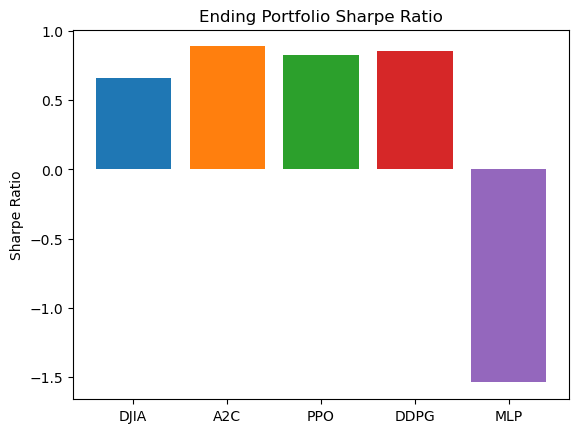

In [38]:
plt.bar("DJIA", baseline_df_stats["Sharpe ratio"])

def get_sharpe_mean(stats):
    return np.array([stat["Sharpe ratio"] for stat in stats]).mean(axis=0)

plt.bar("A2C", get_sharpe_mean(a2c_perf_stats))
plt.bar("PPO", get_sharpe_mean(ppo_perf_stats))
plt.bar("DDPG", get_sharpe_mean(ddpg_perf_stats))

print(get_sharpe_mean(a2c_perf_stats))
print(baseline_df_stats["Sharpe ratio"])

plt.bar("MLP", get_sharpe_mean(mlp_stats))

plt.ylabel("Sharpe Ratio")
plt.title("Ending Portfolio Sharpe Ratio")
plt.show()